In [1]:
import pandas as pd
import numpy as np
from sklearn import datasets
import matplotlib.pyplot as plt

df = pd.read_csv("Mobile Price Factors.csv")
df.head()

,Battery Power,Display Size,Sim count,Front camera max MP,Front camera count,Primary camera max MP,Primary camera count,Internal Memory,Mobile Depth,Mobile Height,...,Mobile Color,Mobile Brand,Processor Speed,Networks,Core,OS,Ram,Resolution x,Resolution y,Mobile Price
0,5000,16.56,2,5,1,12,3,32,8.95,164.4,...,24,58,2.0,4,8,10,3,720,1600,8999
1,5000,16.56,2,5,1,12,3,32,8.95,164.4,...,1,58,2.0,4,8,10,3,720,1600,8999
2,5000,16.56,2,5,1,12,3,64,8.95,164.4,...,1,58,2.0,4,8,10,4,720,1600,9999
3,5000,16.56,2,5,1,12,3,64,8.95,164.4,...,24,58,2.0,4,8,10,4,720,1600,9999
4,5000,16.51,2,16,1,48,4,128,9.00,164.4,...,10,57,2.0,4,8,10,4,720,1600,11999


In [61]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

X = df.drop(['Mobile Price'], axis=1)
X = scaler.fit_transform(X)

y = df['Mobile Price']

x_train,x_test,y_train,y_test = train_test_split(X,y, test_size=1/3, random_state=1)

print(X.shape)
print(y.shape)

(459, 21)
(459,)


In [30]:
from sklearn.neural_network import MLPRegressor
mlp = MLPRegressor(max_iter = 15000).fit(x_train, y_train)
y_pred = mlp.predict(x_test)

from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from math import sqrt

print(r2_score(y_pred, y_test))
print(mean_squared_error(y_pred, y_test, squared=False))
print(np.mean(np.abs((y_test - y_pred)/y_test)))

0.8282663152010795
3439.2748064659777
0.13482635599914036


/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(


In [38]:
from sklearn.model_selection import GridSearchCV
parameter_space = {
    'activation': ['identity', 'logistic', 'tanh', 'relu'],
    'solver': ['sgd', 'adam', 'lbfgs']
}
grid = GridSearchCV(mlp, parameter_space, n_jobs=-1, cv=3)
grid_result = grid.fit(x_train, y_train)
print(grid_result.best_params_)

/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_base.py:170: RuntimeWarning: overflow encountered in square
  return ((y_true - y_pred) ** 2).mean() / 2
/Applications/anaconda3/lib/python3.9/site-packages/sklearn/utils/extmath.py:152: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/Applications/anaconda3/lib/python3.9/site-packages/sklearn/utils/extmath.py:152: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/Applications/anaconda3/lib/python3.9/site-packages/numpy/core/_methods.py:178: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_base.py:170: RuntimeWarning: overflow encountered in square
  return ((y_true - y_pred) ** 2).mean() / 2
/Applications/anaconda3/lib/python3.9/site-packages/sklearn/utils/extmath.py:152: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/Applicati

/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Applications/anaconda3/lib/

{'activation': 'relu', 'solver': 'adam'}


/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(


In [32]:
from sklearn.model_selection import GridSearchCV

parameter_space = {
    'hidden_layer_sizes': [(6, 2), (2, 6), (3, 6)]
}

grid = GridSearchCV(mlp, parameter_space, n_jobs=-1, cv=3)
grid_result = grid.fit(x_train, y_train)
print(grid_result.best_params_)

/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(


{'hidden_layer_sizes': (3, 6)}


/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(


In [33]:
 from sklearn.model_selection import GridSearchCV

parameter_space = {
    'warm_start': [False,True],
    'verbose': [False,True]
}

grid = GridSearchCV(mlp, parameter_space, n_jobs=-1, cv=3)
grid_result = grid.fit(x_train, y_train)

Iteration 14547, loss = 4684048.93849617
Iteration 14548, loss = 4682525.57040866
Iteration 14549, loss = 4681002.25120924
Iteration 14550, loss = 4679479.14692223
Iteration 14551, loss = 4677957.14414556
Iteration 14552, loss = 4676435.00712944
Iteration 14553, loss = 4674911.71145725
Iteration 14554, loss = 4673390.11073743
Iteration 14555, loss = 4671870.69440319
Iteration 14556, loss = 4670350.29247698
Iteration 14557, loss = 4668829.61517202
Iteration 14558, loss = 4667310.42823443
Iteration 14559, loss = 4665792.49771947
Iteration 14560, loss = 4664273.75383906
Iteration 14561, loss = 4662754.27723504
Iteration 14562, loss = 4661236.85299997
Iteration 14563, loss = 4659719.74475869
Iteration 14564, loss = 4658203.52571040
Iteration 14565, loss = 4656686.54395220
Iteration 14566, loss = 4655170.32481427
Iteration 14567, loss = 4653655.91430174
Iteration 14568, loss = 4652141.24004560
Iteration 14569, loss = 4650626.07956293
Iteration 14570, loss = 4649111.67513224
Iteration 14571,

/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(


41407724
Iteration 14596, loss = 4609923.28073395
Iteration 14597, loss = 4608422.01250982
Iteration 14598, loss = 4606921.63709281
Iteration 14599, loss = 4605421.77209516
Iteration 14600, loss = 4603923.30417874
Iteration 14601, loss = 4602424.29196703
Iteration 14602, loss = 4600926.19128196
Iteration 14603, loss = 4599429.61463115
Iteration 14604, loss = 4597931.77695410
Iteration 14605, loss = 4596433.11661453
Iteration 14606, loss = 4594936.90753192
Iteration 14607, loss = 4593440.61228267
Iteration 14608, loss = 4591946.81432654
Iteration 14609, loss = 4590453.57340172
Iteration 14610, loss = 4588956.83648318
Iteration 14611, loss = 4587461.50346159
Iteration 14612, loss = 4585968.31348329
Iteration 14613, loss = 4584476.32207576
Iteration 14614, loss = 4582982.52505585
Iteration 14615, loss = 4581490.16805916
Iteration 14616, loss = 4579999.32310275
Iteration 14617, loss = 4578507.16008035
Iteration 14618, loss = 4577016.77797391
Iteration 14619, loss = 4575527.22060932
Iterati

Iteration 14864, loss = 4223901.92366202
Iteration 14865, loss = 4222521.25819609
Iteration 14866, loss = 4221142.45788680
Iteration 14867, loss = 4219763.34394491
Iteration 14868, loss = 4218382.96835161
Iteration 14869, loss = 4217004.93235152
Iteration 14870, loss = 4215627.05968774
Iteration 14871, loss = 4214250.21681375
Iteration 14872, loss = 4212872.76972167
Iteration 14873, loss = 4211496.72658711
Iteration 14874, loss = 4210120.59074589
Iteration 14875, loss = 4208745.68971462
Iteration 14876, loss = 4207370.26010970
Iteration 14877, loss = 4205993.87427180
Iteration 14878, loss = 4204620.97546807
Iteration 14879, loss = 4203247.69892616
Iteration 14880, loss = 4201874.95134257
Iteration 14881, loss = 4200501.90825278
Iteration 14882, loss = 4199128.91459463
Iteration 14883, loss = 4197756.80844133
Iteration 14884, loss = 4196384.64255535
Iteration 14885, loss = 4195011.91311795
Iteration 14886, loss = 4193641.31151424
Iteration 14887, loss = 4192271.00640210
Iteration 14888,

Iteration 183, loss = 167886637.64266363
Iteration 184, loss = 167872256.34471473
Iteration 185, loss = 167856990.52600768
Iteration 186, loss = 167841919.18414092
Iteration 187, loss = 167827091.11922249
Iteration 188, loss = 167812395.23353058
Iteration 189, loss = 167798299.60601372
Iteration 190, loss = 167784550.35979575
Iteration 191, loss = 167770284.93776417
Iteration 192, loss = 167755651.92080611
Iteration 193, loss = 167740515.09198216
Iteration 194, loss = 167725281.09974793
Iteration 195, loss = 167709264.44006717
Iteration 196, loss = 167692885.49002481
Iteration 197, loss = 167676565.67468303
Iteration 198, loss = 167661171.30414626
Iteration 199, loss = 167646529.21258748
Iteration 200, loss = 167632061.60288376
Iteration 201, loss = 167617143.11109558
Iteration 202, loss = 167601644.63373795
Iteration 203, loss = 167585512.97640955
Iteration 204, loss = 167568831.75430629
Iteration 205, loss = 167552911.10831815
Iteration 206, loss = 167537114.95135310
Iteration 207, l

Iteration 346, loss = 164317591.84956637
Iteration 347, loss = 164287767.42693862
Iteration 348, loss = 164256967.37506527
Iteration 349, loss = 164225862.98561218
Iteration 350, loss = 164194360.34464827
Iteration 351, loss = 164163469.53934908
Iteration 352, loss = 164132272.15821528
Iteration 353, loss = 164100499.15645742
Iteration 354, loss = 164067812.28980094
Iteration 355, loss = 164034138.03303143
Iteration 356, loss = 163998731.70283762
Iteration 357, loss = 163964512.15383968
Iteration 358, loss = 163931218.96739963
Iteration 359, loss = 163898902.53546870
Iteration 360, loss = 163867137.68549401
Iteration 361, loss = 163835841.66203260
Iteration 362, loss = 163805353.99891984
Iteration 363, loss = 163775360.38957962
Iteration 364, loss = 163746045.64785826
Iteration 365, loss = 163716808.59814721
Iteration 366, loss = 163686236.14207950
Iteration 367, loss = 163652076.01703131
Iteration 368, loss = 163615772.40204912
Iteration 369, loss = 163580432.93131793
Iteration 370, l

Iteration 35, loss = 169647568.38189799
Iteration 36, loss = 169645088.63892758
Iteration 37, loss = 169642532.73901016
Iteration 38, loss = 169639923.64934349
Iteration 39, loss = 169637284.84609807
Iteration 40, loss = 169634598.76568678
Iteration 41, loss = 169631956.77166307
Iteration 42, loss = 169629387.76714694
Iteration 43, loss = 169626843.12241095
Iteration 44, loss = 169624295.53609419
Iteration 45, loss = 169621723.19549176
Iteration 46, loss = 169619035.28925064
Iteration 47, loss = 169616147.96527874
Iteration 48, loss = 169613092.47839046
Iteration 49, loss = 169610075.15373909
Iteration 50, loss = 169607045.86338025
Iteration 51, loss = 169604005.81922141
Iteration 52, loss = 169600820.36166781
Iteration 53, loss = 169597345.60261026
Iteration 54, loss = 169593929.80560055
Iteration 55, loss = 169590532.92605266
Iteration 56, loss = 169587113.52227709
Iteration 57, loss = 169583720.22886911
Iteration 58, loss = 169580301.27051812
Iteration 59, loss = 169576883.17368644


Iteration 1180, loss = 115494588.42879862
Iteration 1181, loss = 115426994.00020337
Iteration 1182, loss = 115359010.14726979
Iteration 1183, loss = 115288050.92454699
Iteration 1184, loss = 115214524.09919202
Iteration 1185, loss = 115144609.06315288
Iteration 1186, loss = 115077842.70477884
Iteration 1187, loss = 115013587.02851237
Iteration 1188, loss = 114949396.00812413
Iteration 1189, loss = 114881164.53781445
Iteration 1190, loss = 114807522.98493421
Iteration 1191, loss = 114732487.14367200
Iteration 1192, loss = 114660353.26715200
Iteration 1193, loss = 114590139.34310798
Iteration 1194, loss = 114520701.03379467
Iteration 1195, loss = 114452854.73212542
Iteration 1196, loss = 114385565.20100401
Iteration 1197, loss = 114318979.52198945
Iteration 1198, loss = 114253901.18732770
Iteration 1199, loss = 114190175.30665180
Iteration 1200, loss = 114126811.90118188
Iteration 1201, loss = 114064729.82362923
Iteration 1202, loss = 114003499.00028449
Iteration 1203, loss = 113942508.2

Iteration 1467, loss = 96182738.55183005
Iteration 1468, loss = 96116008.03199971
Iteration 1469, loss = 96047963.76561752
Iteration 1470, loss = 95975239.67063205
Iteration 1471, loss = 95902597.62025465
Iteration 1472, loss = 95830185.75883695
Iteration 1473, loss = 95759310.07759005
Iteration 1474, loss = 95690960.89239164
Iteration 1475, loss = 95624563.03041282
Iteration 1476, loss = 95559884.39010933
Iteration 1477, loss = 95497285.94168328
Iteration 1478, loss = 95434331.33932233
Iteration 1479, loss = 95370856.21361805
Iteration 1480, loss = 95309118.18900004
Iteration 1481, loss = 95248862.32122479
Iteration 1482, loss = 95189607.26126972
Iteration 1483, loss = 95130368.00312436
Iteration 1484, loss = 95070898.23970282
Iteration 1485, loss = 95011204.81986582
Iteration 1486, loss = 94949695.21568128
Iteration 1487, loss = 94886602.76309463
Iteration 1488, loss = 94825716.98479159
Iteration 1489, loss = 94766937.26315454
Iteration 1490, loss = 94706927.66661213
Iteration 1491, 

Iteration 1556, loss = 90399458.86182944
Iteration 1557, loss = 90340285.70523864
Iteration 1558, loss = 90281797.24594212
Iteration 1559, loss = 90221350.30961095
Iteration 1560, loss = 90159688.01921791
Iteration 1561, loss = 90100463.60178435
Iteration 1562, loss = 90042547.71627133
Iteration 1563, loss = 89985861.44305068
Iteration 1564, loss = 89927123.07285704
Iteration 1565, loss = 89863620.42460521
Iteration 1566, loss = 89797634.15971069
Iteration 1567, loss = 89728030.21798755
Iteration 1568, loss = 89654053.80842166
Iteration 1569, loss = 89580557.21030127
Iteration 1570, loss = 89508949.87794577
Iteration 1571, loss = 89441102.16703497
Iteration 1572, loss = 89374956.53929718
Iteration 1573, loss = 89309203.35424305
Iteration 1574, loss = 89242031.45159678
Iteration 1575, loss = 89176465.43690036
Iteration 1576, loss = 89109728.70292445
Iteration 1577, loss = 89040655.36063480
Iteration 1578, loss = 88966366.06812103
Iteration 1579, loss = 88885854.13945624
Iteration 1580, 

Iteration 1179, loss = 113741434.58401839
Iteration 1180, loss = 113672884.36157739
Iteration 1181, loss = 113606818.70754412
Iteration 1182, loss = 113541645.32221973
Iteration 1183, loss = 113478055.11792155
Iteration 1184, loss = 113414852.96306571
Iteration 1185, loss = 113351110.58226241
Iteration 1186, loss = 113286939.72433949
Iteration 1187, loss = 113219138.43216747
Iteration 1188, loss = 113147236.99845323
Iteration 1189, loss = 113077537.00521021
Iteration 1190, loss = 113010202.49477652
Iteration 1191, loss = 112944601.58096217
Iteration 1192, loss = 112878074.35466099
Iteration 1193, loss = 112807158.38655187
Iteration 1194, loss = 112734687.93843812
Iteration 1195, loss = 112664072.04289852
Iteration 1196, loss = 112592580.52785023
Iteration 1197, loss = 112519492.23919787
Iteration 1198, loss = 112444843.78019767
Iteration 1199, loss = 112366399.04679313
Iteration 1200, loss = 112288662.91040282
Iteration 1201, loss = 112212961.19775875
Iteration 1202, loss = 112139340.9

Iteration 1938, loss = 68206681.57947092
Iteration 1939, loss = 68155208.72092459
Iteration 1940, loss = 68106377.26622774
Iteration 1941, loss = 68058852.95152713
Iteration 1942, loss = 68012956.74586524
Iteration 1943, loss = 67968346.89638515
Iteration 1944, loss = 67924004.78951578
Iteration 1945, loss = 67878139.37641342
Iteration 1946, loss = 67832994.18055587
Iteration 1947, loss = 67787355.46377806
Iteration 1948, loss = 67741333.73773985
Iteration 1949, loss = 67696415.05228746
Iteration 1950, loss = 67650277.67486787
Iteration 1951, loss = 67600784.77359448
Iteration 1952, loss = 67548144.25705077
Iteration 1953, loss = 67496453.94760409
Iteration 1954, loss = 67446899.65186583
Iteration 1955, loss = 67398567.38409840
Iteration 1956, loss = 67352598.43650658
Iteration 1957, loss = 67308092.23274638
Iteration 1958, loss = 67263926.16334942
Iteration 1959, loss = 67220589.92396232
Iteration 1960, loss = 67178901.95683160
Iteration 1961, loss = 67137681.56441493
Iteration 1962, 

Iteration 1532, loss = 89080673.61232589
Iteration 1533, loss = 89009247.86767834
Iteration 1534, loss = 88933225.97498243
Iteration 1535, loss = 88857644.56685223
Iteration 1536, loss = 88777747.40348002
Iteration 1537, loss = 88701033.31389537
Iteration 1538, loss = 88626271.91648588
Iteration 1539, loss = 88549768.61462183
Iteration 1540, loss = 88471653.93786386
Iteration 1541, loss = 88396432.83442722
Iteration 1542, loss = 88321528.78605372
Iteration 1543, loss = 88251084.25211026
Iteration 1544, loss = 88184241.29585305
Iteration 1545, loss = 88117832.11290573
Iteration 1546, loss = 88050073.91912225
Iteration 1547, loss = 87977559.32408406
Iteration 1548, loss = 87906318.21311781
Iteration 1549, loss = 87832859.64111549
Iteration 1550, loss = 87762991.02672686
Iteration 1551, loss = 87697041.35650179
Iteration 1552, loss = 87632973.68828158
Iteration 1553, loss = 87567985.52706897
Iteration 1554, loss = 87499817.92788331
Iteration 1555, loss = 87432037.68468881
Iteration 1556, 

Iteration 1825, loss = 70901852.06541240
Iteration 1826, loss = 70844493.61946827
Iteration 1827, loss = 70788458.17247473
Iteration 1828, loss = 70733874.59396677
Iteration 1829, loss = 70680569.91778836
Iteration 1830, loss = 70627002.88610798
Iteration 1831, loss = 70574815.20040752
Iteration 1832, loss = 70524430.94343406
Iteration 1833, loss = 70474577.36751397
Iteration 1834, loss = 70423844.73025024
Iteration 1835, loss = 70373319.33479553
Iteration 1836, loss = 70322114.66896762
Iteration 1837, loss = 70272236.93829739
Iteration 1838, loss = 70222810.28149304
Iteration 1839, loss = 70173306.81623663
Iteration 1840, loss = 70122039.57741053
Iteration 1841, loss = 70067184.83927265
Iteration 1842, loss = 70014194.39965551
Iteration 1843, loss = 69961923.19494374
Iteration 1844, loss = 69907531.57090783
Iteration 1845, loss = 69848662.53128691
Iteration 1846, loss = 69790346.77026184
Iteration 1847, loss = 69734927.20689516
Iteration 1848, loss = 69682425.39788805
Iteration 1849, 

Iteration 1988, loss = 62550155.91462984
Iteration 1989, loss = 62497766.88264305
Iteration 1990, loss = 62448248.51178896
Iteration 1991, loss = 62400632.34772472
Iteration 1992, loss = 62352908.32699575
Iteration 1993, loss = 62303276.58173972
Iteration 1994, loss = 62254295.64119532
Iteration 1995, loss = 62202280.68058505
Iteration 1996, loss = 62145461.51718859
Iteration 1997, loss = 62088069.66405839
Iteration 1998, loss = 62032026.71738724
Iteration 1999, loss = 61977251.72927040
Iteration 2000, loss = 61919758.06100688
Iteration 2001, loss = 61857024.28266633
Iteration 2002, loss = 61795451.88586907
Iteration 2003, loss = 61736365.67009501
Iteration 2004, loss = 61679617.90577231
Iteration 2005, loss = 61625723.21017613
Iteration 2006, loss = 61573675.41586884
Iteration 2007, loss = 61520957.42306545
Iteration 2008, loss = 61468994.53420705
Iteration 2009, loss = 61416635.37027443
Iteration 2010, loss = 61367679.22941098
Iteration 2011, loss = 61321611.59454353
Iteration 2012, 

Iteration 2727, loss = 40251937.52576206
Iteration 2728, loss = 40231758.00005664
Iteration 2729, loss = 40210624.26271959
Iteration 2730, loss = 40190131.64431998
Iteration 2731, loss = 40168245.72489983
Iteration 2732, loss = 40144570.83051215
Iteration 2733, loss = 40122584.78143408
Iteration 2734, loss = 40101780.48127766
Iteration 2735, loss = 40081167.81739122
Iteration 2736, loss = 40060223.70984186
Iteration 2737, loss = 40039129.06011975
Iteration 2738, loss = 40017221.66905030
Iteration 2739, loss = 39996638.94583123
Iteration 2740, loss = 39976552.13466291
Iteration 2741, loss = 39957616.17485219
Iteration 2742, loss = 39938682.22486789
Iteration 2743, loss = 39919192.97313088
Iteration 2744, loss = 39897419.83512194
Iteration 2745, loss = 39874085.28759546
Iteration 2746, loss = 39851265.78759696
Iteration 2747, loss = 39829631.69051235
Iteration 2748, loss = 39808761.18580386
Iteration 2749, loss = 39788881.32554609
Iteration 2750, loss = 39770016.42607941
Iteration 2751, 

Iteration 2996, loss = 35367129.75064002
Iteration 2997, loss = 35350037.87358650
Iteration 2998, loss = 35333780.38501155
Iteration 2999, loss = 35317534.24493995
Iteration 3000, loss = 35301721.28894088
Iteration 3001, loss = 35287118.54611295
Iteration 3002, loss = 35273080.66709282
Iteration 3003, loss = 35260110.55884130
Iteration 3004, loss = 35247697.75410923
Iteration 3005, loss = 35236046.52723092
Iteration 3006, loss = 35225205.54482987
Iteration 3007, loss = 35214137.33173593
Iteration 3008, loss = 35202868.28915022
Iteration 3009, loss = 35191480.31558576
Iteration 3010, loss = 35179376.70513507
Iteration 3011, loss = 35166058.35741482
Iteration 3012, loss = 35151744.85680070
Iteration 3013, loss = 35138089.02159654
Iteration 3014, loss = 35124194.74558673
Iteration 3015, loss = 35110575.17036951
Iteration 3016, loss = 35096843.46639746
Iteration 3017, loss = 35083546.36706211
Iteration 3018, loss = 35069829.27655537
Iteration 3019, loss = 35056701.60283340
Iteration 3020, 

Iteration 2517, loss = 42278516.76921517
Iteration 2518, loss = 42252392.28211373
Iteration 2519, loss = 42226814.16701183
Iteration 2520, loss = 42202119.19493055
Iteration 2521, loss = 42177466.52428641
Iteration 2522, loss = 42151574.82517555
Iteration 2523, loss = 42123686.42030515
Iteration 2524, loss = 42092894.29885633
Iteration 2525, loss = 42063053.74296608
Iteration 2526, loss = 42032302.67400523
Iteration 2527, loss = 42002200.73027737
Iteration 2528, loss = 41971813.50976250
Iteration 2529, loss = 41943270.63534705
Iteration 2530, loss = 41916015.62284318
Iteration 2531, loss = 41889304.78355474
Iteration 2532, loss = 41862268.21448951
Iteration 2533, loss = 41835339.14584222
Iteration 2534, loss = 41807685.20084378
Iteration 2535, loss = 41780865.43770182
Iteration 2536, loss = 41754526.44805321
Iteration 2537, loss = 41727301.41611952
Iteration 2538, loss = 41697346.42683583
Iteration 2539, loss = 41666781.78578349
Iteration 2540, loss = 41634457.68036003
Iteration 2541, 

Iteration 2875, loss = 33695510.37141673
Iteration 2876, loss = 33678186.14400318
Iteration 2877, loss = 33660666.85892315
Iteration 2878, loss = 33643062.35524439
Iteration 2879, loss = 33624172.83649971
Iteration 2880, loss = 33605680.20600398
Iteration 2881, loss = 33588335.53432355
Iteration 2882, loss = 33571817.74275313
Iteration 2883, loss = 33557193.16796283
Iteration 2884, loss = 33543565.36188677
Iteration 2885, loss = 33529410.87201807
Iteration 2886, loss = 33514900.56799566
Iteration 2887, loss = 33500448.49610325
Iteration 2888, loss = 33485057.04583988
Iteration 2889, loss = 33465982.35984879
Iteration 2890, loss = 33441521.96682758
Iteration 2891, loss = 33415529.50046505
Iteration 2892, loss = 33390116.98242104
Iteration 2893, loss = 33365154.29449480
Iteration 2894, loss = 33338705.76366338
Iteration 2895, loss = 33314662.86523947
Iteration 2896, loss = 33291657.03961044
Iteration 2897, loss = 33271463.47588387
Iteration 2898, loss = 33252891.73343398
Iteration 2899, 

Iteration 3094, loss = 30426223.01523814
Iteration 3095, loss = 30413174.30351270
Iteration 3096, loss = 30401589.46341238
Iteration 3097, loss = 30388928.98544715
Iteration 3098, loss = 30372071.79449674
Iteration 3099, loss = 30351801.20811225
Iteration 3100, loss = 30333485.17626179
Iteration 3101, loss = 30317201.44787266
Iteration 3102, loss = 30302554.51102638
Iteration 3103, loss = 30289488.78073351
Iteration 3104, loss = 30278315.04580061
Iteration 3105, loss = 30268233.18890647
Iteration 3106, loss = 30258461.53300331
Iteration 3107, loss = 30249119.22887998
Iteration 3108, loss = 30239435.45856963
Iteration 3109, loss = 30229695.68450354
Iteration 3110, loss = 30219354.30723487
Iteration 3111, loss = 30208280.56442502
Iteration 3112, loss = 30197370.80547455
Iteration 3113, loss = 30187212.42283282
Iteration 3114, loss = 30179307.79638980
Iteration 3115, loss = 30171762.90583592
Iteration 3116, loss = 30164422.02933560
Iteration 3117, loss = 30156664.37236269
Iteration 3118, 

Iteration 3907, loss = 25639150.35109279
Iteration 3908, loss = 25632615.26951626
Iteration 3909, loss = 25625934.93155700
Iteration 3910, loss = 25618801.46752342
Iteration 3911, loss = 25611981.22779213
Iteration 3912, loss = 25604909.43128608
Iteration 3913, loss = 25597891.29825334
Iteration 3914, loss = 25590653.45618987
Iteration 3915, loss = 25583300.79409976
Iteration 3916, loss = 25576163.32490689
Iteration 3917, loss = 25568594.76341855
Iteration 3918, loss = 25558601.26585482
Iteration 3123, loss = 30090364.42621426
Iteration 3124, loss = 30079968.81706258
Iteration 3125, loss = 30069543.95205852
Iteration 3126, loss = 30058034.31812270
Iteration 3127, loss = 30045683.36268250
Iteration 3128, loss = 30033600.07179953
Iteration 3129, loss = 30021401.02742247
Iteration 3130, loss = 30008285.52449775
Iteration 3131, loss = 29993830.85450465
Iteration 3132, loss = 29979949.48579371
Iteration 3133, loss = 29966443.88642203
Iteration 3134, loss = 29953132.17678816
Iteration 3135, 

Iteration 3948, loss = 25288708.59340333
Iteration 3949, loss = 25281802.14063847
Iteration 3950, loss = 25274764.66816039
Iteration 3951, loss = 25268052.26380906
Iteration 3952, loss = 25261670.17428008
Iteration 3953, loss = 25255800.98106405
Iteration 3954, loss = 25250175.63204194
Iteration 3955, loss = 25244745.98603756
Iteration 3956, loss = 25238761.29691798
Iteration 3957, loss = 25231618.98322818
Iteration 3958, loss = 25223832.93053328
Iteration 3959, loss = 25216571.84402899
Iteration 3960, loss = 25209738.71357047
Iteration 3961, loss = 25203057.32561900
Iteration 3962, loss = 25196157.42575121
Iteration 3963, loss = 25188858.46444793
Iteration 3964, loss = 25181504.96801358
Iteration 3965, loss = 25173950.29407888
Iteration 3966, loss = 25165842.82650040
Iteration 3967, loss = 25157194.41788633
Iteration 3968, loss = 25149651.44611445
Iteration 3969, loss = 25142980.85679233
Iteration 3970, loss = 25136680.01073711
Iteration 3971, loss = 25130344.80206019
Iteration 3972, 

Iteration 4314, loss = 22529512.53409609
Iteration 4315, loss = 22523916.40400629
Iteration 4316, loss = 22518347.75248181
Iteration 3521, loss = 25721802.76676572
Iteration 3522, loss = 25715554.46342079
Iteration 3523, loss = 25708635.35369154
Iteration 3524, loss = 25698572.28621921
Iteration 3525, loss = 25684786.89552432
Iteration 3526, loss = 25673623.97166700
Iteration 3527, loss = 25663155.70386821
Iteration 3528, loss = 25652932.65885034
Iteration 3529, loss = 25642889.35142733
Iteration 3530, loss = 25632945.98128288
Iteration 3531, loss = 25623511.77054688
Iteration 3532, loss = 25614916.13128056
Iteration 3533, loss = 25606222.77562859
Iteration 3534, loss = 25597763.04750789
Iteration 3535, loss = 25589281.59235070
Iteration 3536, loss = 25580715.99575945
Iteration 3537, loss = 25571847.71668768
Iteration 3538, loss = 25563497.77052800
Iteration 3539, loss = 25555898.01594587
Iteration 3540, loss = 25548828.41649060
Iteration 3541, loss = 25541948.76394160
Iteration 3542, 

Iteration 4330, loss = 22432786.70897425
Iteration 4331, loss = 22427005.28375942
Iteration 4332, loss = 22421043.59998500
Iteration 4333, loss = 22415271.23138265
Iteration 4334, loss = 22409521.81858544
Iteration 4335, loss = 22403990.20414899
Iteration 4336, loss = 22398684.72533130
Iteration 4337, loss = 22393241.57625499
Iteration 4338, loss = 22387534.30998933
Iteration 4339, loss = 22381318.70419341
Iteration 4340, loss = 22374854.39716387
Iteration 4341, loss = 22368243.65768008
Iteration 4342, loss = 22361896.46987040
Iteration 4343, loss = 22354858.58876647
Iteration 4344, loss = 22347558.76586974
Iteration 4345, loss = 22340425.83583996
Iteration 4346, loss = 22333407.33190841
Iteration 4347, loss = 22326885.80712722
Iteration 4348, loss = 22320799.56908771
Iteration 4349, loss = 22315012.84315763
Iteration 4350, loss = 22309146.98679350
Iteration 4351, loss = 22302204.78360065
Iteration 4352, loss = 22294896.61976766
Iteration 4353, loss = 22288095.85297651
Iteration 4354, 

Iteration 4315, loss = 20336239.72235088
Iteration 4316, loss = 20331296.05924508
Iteration 4715, loss = 19959789.27862521
Iteration 4716, loss = 19952916.03848367
Iteration 4717, loss = 19946580.08339702
Iteration 4718, loss = 19940362.09037451
Iteration 4719, loss = 19934030.53185268
Iteration 4720, loss = 19927782.16574205
Iteration 4721, loss = 19921406.88838781
Iteration 4722, loss = 19915128.95746579
Iteration 4723, loss = 19909049.89712876
Iteration 4724, loss = 19902928.65313527
Iteration 4725, loss = 19896437.74402227
Iteration 4726, loss = 19889389.13827749
Iteration 4727, loss = 19881360.53943281
Iteration 4728, loss = 19873486.84432560
Iteration 4729, loss = 19866582.62713575
Iteration 4730, loss = 19859561.69122006
Iteration 4731, loss = 19852930.42162883
Iteration 4732, loss = 19846618.71910935
Iteration 4733, loss = 19840662.92243735
Iteration 4734, loss = 19834764.98293009
Iteration 4735, loss = 19828567.92197833
Iteration 4736, loss = 19822209.19312290
Iteration 4737, 

Iteration 5120, loss = 17452247.97457765
Iteration 5121, loss = 17448285.00475496
Iteration 5122, loss = 17442762.76167713
Iteration 5123, loss = 17436064.78955711
Iteration 5124, loss = 17429448.75444714
Iteration 5125, loss = 17422142.49788312
Iteration 5126, loss = 17415086.02094137
Iteration 5127, loss = 17408608.51038634
Iteration 5128, loss = 17402544.77814428
Iteration 5129, loss = 17396909.94867772
Iteration 5130, loss = 17391561.05645717
Iteration 5131, loss = 17386558.17554103
Iteration 5132, loss = 17381550.30017245
Iteration 5133, loss = 17376457.55429652
Iteration 5134, loss = 17371309.01381750
Iteration 5135, loss = 17366386.75749898
Iteration 5136, loss = 17361481.27973718
Iteration 5137, loss = 17356583.11553009
Iteration 5138, loss = 17351321.30976244
Iteration 5139, loss = 17346292.05623334
Iteration 5140, loss = 17341368.04263851
Iteration 5141, loss = 17336602.24702350
Iteration 5142, loss = 17331835.60879862
Iteration 5143, loss = 17326920.12782104
Iteration 5144, 

Iteration 4763, loss = 18202754.25816484
Iteration 4764, loss = 18197762.19439617
Iteration 4765, loss = 18193223.27682374
Iteration 4766, loss = 18189234.77780401
Iteration 4767, loss = 18185487.39726518
Iteration 4768, loss = 18181955.14696564
Iteration 4769, loss = 18178622.03169082
Iteration 4770, loss = 18175473.37787278
Iteration 4771, loss = 18172306.10666938
Iteration 4772, loss = 18169130.12870109
Iteration 4773, loss = 18166074.85483745
Iteration 4774, loss = 18162572.46055332
Iteration 4775, loss = 18158550.44562602
Iteration 4776, loss = 18154490.94985562
Iteration 4777, loss = 18150646.03145855
Iteration 4778, loss = 18146970.00039406
Iteration 4779, loss = 18143541.52683736
Iteration 4780, loss = 18140336.55651278
Iteration 4781, loss = 18137046.01791536
Iteration 4782, loss = 18133352.49175304
Iteration 4783, loss = 18128227.89292264
Iteration 4784, loss = 18122751.62621914
Iteration 4785, loss = 18117275.54930106
Iteration 4786, loss = 18111760.88670758
Iteration 4787, 

Iteration 5243, loss = 16405244.17822077
Iteration 5244, loss = 16400951.96756236
Iteration 5245, loss = 16396579.97957839
Iteration 5246, loss = 16392220.88380466
Iteration 5247, loss = 16388567.76417540
Iteration 5248, loss = 16384018.89993793
Iteration 5249, loss = 16380118.51001054
Iteration 5250, loss = 16376565.75552486
Iteration 5251, loss = 16372932.22789010
Iteration 5252, loss = 16369594.24979939
Iteration 5253, loss = 16366270.81088682
Iteration 5254, loss = 16363136.60451439
Iteration 5255, loss = 16360287.38832871
Iteration 5256, loss = 16357488.22384577
Iteration 5257, loss = 16354913.15187109
Iteration 5258, loss = 16352149.79797034
Iteration 5259, loss = 16349757.32883637
Iteration 5260, loss = 16346235.94113207
Iteration 5261, loss = 16342410.19131557
Iteration 5262, loss = 16338466.37098533
Iteration 5263, loss = 16334650.07187750
Iteration 5264, loss = 16330435.35553857
Iteration 5265, loss = 16326559.20727559
Iteration 5266, loss = 16323012.15122175
Iteration 5267, 

Iteration 5487, loss = 15666362.49208500
Iteration 5488, loss = 15663658.85200794
Iteration 5489, loss = 15660902.06583279
Iteration 5490, loss = 15658230.66541049
Iteration 5491, loss = 15655359.29380582
Iteration 5492, loss = 15652465.53292821
Iteration 5493, loss = 15649644.94765196
Iteration 5494, loss = 15646666.05169163
Iteration 5495, loss = 15643904.21121423
Iteration 5496, loss = 15641289.42601863
Iteration 5497, loss = 15638747.01753991
Iteration 5498, loss = 15636289.33416381
Iteration 5499, loss = 15633842.31983785
Iteration 5500, loss = 15631268.69063494
Iteration 5501, loss = 15628633.95374135
Iteration 5502, loss = 15626169.02405764
Iteration 5503, loss = 15623707.24167090
Iteration 5504, loss = 15620592.35693552
Iteration 5505, loss = 15617082.55537045
Iteration 5506, loss = 15613924.71612089
Iteration 5507, loss = 15611107.04715548
Iteration 5508, loss = 15608513.69850017
Iteration 5509, loss = 15606125.51648329
Iteration 5510, loss = 15603895.72505961
Iteration 5909, 

Iteration 5674, loss = 15117966.23502452
Iteration 5675, loss = 15115195.39891028
Iteration 5676, loss = 15112443.99945187
Iteration 5677, loss = 15109759.72346908
Iteration 5678, loss = 15107206.73478068
Iteration 5679, loss = 15104636.12455218
Iteration 5680, loss = 15101926.59422219
Iteration 5681, loss = 15099239.27322558
Iteration 5682, loss = 15096662.60115517
Iteration 5683, loss = 15094112.89088924
Iteration 5684, loss = 15091520.92960732
Iteration 5685, loss = 15088734.91349988
Iteration 5686, loss = 15085910.22108468
Iteration 5687, loss = 15082315.06500477
Iteration 5688, loss = 15078051.03376820
Iteration 5689, loss = 15072626.47228919
Iteration 5690, loss = 15067753.38154202
Iteration 5691, loss = 15063729.27706571
Iteration 5692, loss = 15059811.35592074
Iteration 5693, loss = 15056036.45895633
Iteration 5694, loss = 15052465.57139901
Iteration 5695, loss = 15049093.95552610
Iteration 5696, loss = 15045997.12774083
Iteration 5697, loss = 15043290.21255202
Iteration 5698, 

Iteration 6414, loss = 11910613.00279462
Iteration 6415, loss = 11907261.89626438
Iteration 6416, loss = 11902845.42051679
Iteration 6417, loss = 11897318.79047571
Iteration 6418, loss = 11892304.68542489
Iteration 6419, loss = 11887656.13360537
Iteration 6420, loss = 11883602.85203510
Iteration 6421, loss = 11880050.79790168
Iteration 6422, loss = 11876742.70403418
Iteration 6423, loss = 11873868.83270434
Iteration 6424, loss = 11871300.23364796
Iteration 6425, loss = 11868951.02015166
Iteration 6426, loss = 11866512.35992147
Iteration 6427, loss = 11863976.53023462
Iteration 6428, loss = 11861386.48525536
Iteration 6429, loss = 11858943.53134944
Iteration 6430, loss = 11856554.20799689
Iteration 6431, loss = 11854255.42333251
Iteration 6432, loss = 11852063.94797247
Iteration 6433, loss = 11849746.76282046
Iteration 6434, loss = 11847193.23639406
Iteration 6435, loss = 11843597.94471622
Iteration 6436, loss = 11838877.35638910
Iteration 6437, loss = 11834378.84899085
Iteration 6438, 

Iteration 5910, loss = 14468604.87952055
Iteration 5911, loss = 14465467.68573544
Iteration 5912, loss = 14462397.70739658
Iteration 5913, loss = 14459442.53417840
Iteration 5914, loss = 14456672.14300000
Iteration 5915, loss = 14453866.80845477
Iteration 5916, loss = 14451041.52994744
Iteration 5917, loss = 14448352.77756647
Iteration 5918, loss = 14445614.25222904
Iteration 5919, loss = 14443025.15270182
Iteration 5920, loss = 14440374.27264077
Iteration 5921, loss = 14437902.77418783
Iteration 5922, loss = 14435374.36930650
Iteration 5923, loss = 14432904.62573507
Iteration 5924, loss = 14430440.72851137
Iteration 5925, loss = 14428083.66433028
Iteration 5926, loss = 14425872.26279539
Iteration 5927, loss = 14423691.25829905
Iteration 5928, loss = 14421600.87563150
Iteration 5929, loss = 14419577.71169362
Iteration 5930, loss = 14417452.29773568
Iteration 5931, loss = 14414986.20247955
Iteration 5932, loss = 14412018.44131042
Iteration 5933, loss = 14409238.79261513
Iteration 5934, 

Iteration 6130, loss = 13936083.31118347
Iteration 6131, loss = 13933832.20423482
Iteration 6132, loss = 13931719.97216846
Iteration 6133, loss = 13929726.31001015
Iteration 6134, loss = 13928031.41540631
Iteration 6135, loss = 13925898.96712200
Iteration 6136, loss = 13923827.77405686
Iteration 6137, loss = 13921998.55768759
Iteration 6138, loss = 13919841.93037506
Iteration 6139, loss = 13917635.75069528
Iteration 6140, loss = 13914287.76902261
Iteration 6141, loss = 13910528.82812208
Iteration 6142, loss = 13907521.66618809
Iteration 6143, loss = 13903682.00057201
Iteration 6144, loss = 13899768.49684985
Iteration 6145, loss = 13895285.94514321
Iteration 6146, loss = 13891036.80805240
Iteration 6147, loss = 13887226.68065282
Iteration 6148, loss = 13883586.97337866
Iteration 6149, loss = 13880457.11712447
Iteration 6150, loss = 13877447.71665480
Iteration 6151, loss = 13874641.66993042
Iteration 6152, loss = 13872064.19259279
Iteration 6153, loss = 13869834.32897169
Iteration 6154, 

Iteration 6820, loss = 10735750.54809665
Iteration 6821, loss = 10733583.20133894
Iteration 6822, loss = 10731474.75432445
Iteration 6823, loss = 10729438.44911940
Iteration 6824, loss = 10727381.13644351
Iteration 6825, loss = 10725284.38487420
Iteration 6826, loss = 10723119.30104208
Iteration 6827, loss = 10720917.03422076
Iteration 6828, loss = 10718620.58083342
Iteration 6829, loss = 10716412.77473806
Iteration 6830, loss = 10714368.59354632
Iteration 6831, loss = 10711504.15190321
Iteration 6832, loss = 10708545.42189156
Iteration 6833, loss = 10705836.10088243
Iteration 6834, loss = 10703459.39586918
Iteration 6835, loss = 10701196.82277314
Iteration 6836, loss = 10698730.41247107
Iteration 6837, loss = 10696356.73098764
Iteration 6838, loss = 10694106.49384142
Iteration 6839, loss = 10691774.47610487
Iteration 6840, loss = 10689243.68483216
Iteration 6841, loss = 10686605.73803103
Iteration 6842, loss = 10684137.56757674
Iteration 6843, loss = 10681613.26273143
Iteration 6844, 

Iteration 6366, loss = 13346327.67760373
Iteration 6367, loss = 13344007.28061319
Iteration 6368, loss = 13341914.34740953
Iteration 6369, loss = 13339680.29913087
Iteration 6370, loss = 13337538.18424433
Iteration 6371, loss = 13335309.65402906
Iteration 6372, loss = 13333096.14721059
Iteration 6373, loss = 13330906.80975804
Iteration 6374, loss = 13328853.37999012
Iteration 6375, loss = 13326702.35205451
Iteration 6376, loss = 13324749.11640954
Iteration 6377, loss = 13322801.87372161
Iteration 6378, loss = 13320862.56286678
Iteration 6379, loss = 13318780.20414762
Iteration 6380, loss = 13316674.68135895
Iteration 6381, loss = 13314590.81669898
Iteration 6382, loss = 13312605.83103842
Iteration 6383, loss = 13310653.67203626
Iteration 6384, loss = 13308693.39500588
Iteration 6385, loss = 13306815.16722897
Iteration 6386, loss = 13305174.88461849
Iteration 6387, loss = 13303483.28903841
Iteration 6388, loss = 13301694.34822149
Iteration 6389, loss = 13299892.43215123
Iteration 6390, 

Iteration 7380, loss = 9506776.22605480
Iteration 7381, loss = 9505156.38218214
Iteration 7382, loss = 9503557.15383890
Iteration 7383, loss = 9502135.07320258
Iteration 7384, loss = 9500588.15002489
Iteration 7385, loss = 9498947.74637678
Iteration 7386, loss = 9497324.84049602
Iteration 7387, loss = 9495586.83336921
Iteration 7388, loss = 9493857.86233850
Iteration 7389, loss = 9492138.19830472
Iteration 7390, loss = 9490591.72193295
Iteration 7391, loss = 9489165.20383128
Iteration 7392, loss = 9487699.82332826
Iteration 7393, loss = 9486224.16472233
Iteration 7394, loss = 9484955.88754512
Iteration 7395, loss = 9483593.43593093
Iteration 7396, loss = 9482317.18650884
Iteration 7397, loss = 9481064.86021791
Iteration 7398, loss = 9479718.51433526
Iteration 7399, loss = 9478308.45827439
Iteration 7400, loss = 9476814.37574089
Iteration 7401, loss = 9475505.82161382
Iteration 7402, loss = 9474089.65239969
Iteration 7403, loss = 9472497.67015790
Iteration 7404, loss = 9470903.97784138


Iteration 6870, loss = 12295393.08999012
Iteration 6871, loss = 12293289.81453128
Iteration 6872, loss = 12291293.69303575
Iteration 6873, loss = 12289172.35391398
Iteration 6874, loss = 12287068.88209707
Iteration 6875, loss = 12285003.79461150
Iteration 6876, loss = 12283106.01804997
Iteration 6877, loss = 12281410.76747578
Iteration 6878, loss = 12279846.72943300
Iteration 6879, loss = 12278099.99932395
Iteration 6880, loss = 12276295.02523562
Iteration 6881, loss = 12274775.18495606
Iteration 6882, loss = 12273041.42324190
Iteration 6883, loss = 12271594.71971668
Iteration 6884, loss = 12269549.06115487
Iteration 6885, loss = 12267198.07892577
Iteration 6886, loss = 12264686.14626192
Iteration 6887, loss = 12262158.50195660
Iteration 6888, loss = 12259746.38298858
Iteration 6889, loss = 12257324.73817519
Iteration 6890, loss = 12255008.58014153
Iteration 6891, loss = 12252743.64194498
Iteration 6892, loss = 12250519.15157678
Iteration 6893, loss = 12248345.34539444
Iteration 6894, 

Iteration 14627, loss = 4748244.44678393
Iteration 14628, loss = 4746751.53446583
Iteration 14629, loss = 4745256.32642221
Iteration 14630, loss = 4743762.01364233
Iteration 14631, loss = 4742269.99251049
Iteration 14632, loss = 4740782.15734151
Iteration 14633, loss = 4739294.92832042
Iteration 14634, loss = 4737803.37058056
Iteration 14635, loss = 4736319.35637435
Iteration 14636, loss = 4734831.70628149
Iteration 14637, loss = 4733349.42942222
Iteration 14638, loss = 4731868.43609688
Iteration 14639, loss = 4730385.04944138
Iteration 14640, loss = 4728903.24489744
Iteration 14641, loss = 4727423.37345202
Iteration 14642, loss = 4725948.64780706
Iteration 14643, loss = 4724475.25999622
Iteration 14644, loss = 4722998.94664985
Iteration 14645, loss = 4721525.40705068
Iteration 14646, loss = 4720055.36297816
Iteration 14647, loss = 4718586.26104861
Iteration 14648, loss = 4717116.24908845
Iteration 14649, loss = 4715636.88648230
Iteration 14650, loss = 4714141.77499904
Iteration 14651,

Iteration 14847, loss = 4425661.10108831
Iteration 14848, loss = 4424291.37782455
Iteration 14849, loss = 4422925.91289622
Iteration 14850, loss = 4421551.68137550
Iteration 14851, loss = 4420176.97377274
Iteration 14852, loss = 4418810.44115825
Iteration 14853, loss = 4417442.81372863
Iteration 14854, loss = 4416071.12032176
Iteration 14855, loss = 4414700.31750892
Iteration 14856, loss = 4413341.20537939
Iteration 14857, loss = 4411977.15868805
Iteration 14858, loss = 4410606.76200814
Iteration 14859, loss = 4409241.14127619
Iteration 14860, loss = 4407879.46855855
Iteration 14861, loss = 4406521.48224445
Iteration 14862, loss = 4405159.20459313
Iteration 14863, loss = 4403791.63205370
Iteration 14864, loss = 4402429.35708614
Iteration 14865, loss = 4401074.20470222
Iteration 14866, loss = 4399715.46480179
Iteration 14867, loss = 4398353.89244720
Iteration 14868, loss = 4396996.57140063
Iteration 14869, loss = 4395639.20371951
Iteration 14870, loss = 4394283.00756630
Iteration 14871,

Iteration 7622, loss = 9089792.87904815
Iteration 7623, loss = 9088170.81061953
Iteration 7624, loss = 9086544.88238902
Iteration 7625, loss = 9084705.51661796
Iteration 7626, loss = 9082255.81894246
Iteration 7627, loss = 9079897.76147119
Iteration 7628, loss = 9077433.97222628
Iteration 7629, loss = 9075160.62818278
Iteration 7630, loss = 9072954.71794676
Iteration 7631, loss = 9070894.50486464
Iteration 7632, loss = 9068945.69001473
Iteration 7633, loss = 9067169.30548772
Iteration 7634, loss = 9065499.90975953
Iteration 7635, loss = 9063714.62822956
Iteration 7636, loss = 9061831.62740265
Iteration 7637, loss = 9060075.42001819
Iteration 7638, loss = 9057959.49080026
Iteration 7639, loss = 9056161.43325299
Iteration 7640, loss = 9054304.25513202
Iteration 7641, loss = 9052435.22849641
Iteration 7642, loss = 9050680.57689787
Iteration 7643, loss = 9049110.73225499
Iteration 7644, loss = 9047620.32345494
Iteration 7645, loss = 9046159.31645666
Iteration 7646, loss = 9044732.23314480


Iteration 7138, loss = 11774439.78464756
Iteration 7139, loss = 11772458.45778754
Iteration 7140, loss = 11770609.51165162
Iteration 7141, loss = 11769003.43921525
Iteration 7142, loss = 11767474.92903054
Iteration 7143, loss = 11765992.48797690
Iteration 7144, loss = 11763391.19764060
Iteration 7145, loss = 11760995.03028089
Iteration 7146, loss = 11758637.90436949
Iteration 7147, loss = 11756749.21084731
Iteration 7148, loss = 11754962.34698955
Iteration 7149, loss = 11753178.55526689
Iteration 7150, loss = 11751515.76450103
Iteration 7151, loss = 11749940.19123204
Iteration 7152, loss = 11748354.33495121
Iteration 7153, loss = 11746697.72567059
Iteration 7154, loss = 11745085.95823279
Iteration 7155, loss = 11743464.26477183
Iteration 7156, loss = 11742019.09163420
Iteration 7157, loss = 11740228.64359715
Iteration 7158, loss = 11738721.84594012
Iteration 7159, loss = 11737158.35428801
Iteration 7160, loss = 11735933.87667563
Iteration 7161, loss = 11734309.08900924
Iteration 7162, 

Iteration 2, loss = 181024991.46270400
Iteration 3, loss = 181023242.56618989
Iteration 4, loss = 181021589.92318052
Iteration 5, loss = 181019976.32170278
Iteration 6, loss = 181018384.81727114
Iteration 7, loss = 181016802.12010166
Iteration 8, loss = 181015185.91408861
Iteration 9, loss = 181013601.80038247
Iteration 10, loss = 181012019.68421403
Iteration 11, loss = 181010416.90200076
Iteration 12, loss = 181008768.57196152
Iteration 13, loss = 181007140.56830260
Iteration 14, loss = 181005540.08415145
Iteration 15, loss = 181003932.73035577
Iteration 16, loss = 181002322.21941447
Iteration 17, loss = 181000709.80585265
Iteration 18, loss = 180999060.72341698
Iteration 19, loss = 180997370.15605709
Iteration 20, loss = 180995634.19069612
Iteration 21, loss = 180993845.49949661
Iteration 22, loss = 180992024.61992693
Iteration 23, loss = 180990211.06472573
Iteration 24, loss = 180988352.19602084
Iteration 25, loss = 180986411.60225287
Iteration 26, loss = 180984448.03016636
Iteratio

Iteration 7578, loss = 11024714.71367232
Iteration 7579, loss = 11023031.62208005
Iteration 7580, loss = 11021366.02468059
Iteration 7581, loss = 11019647.34525905
Iteration 7582, loss = 11018054.38481001
Iteration 7583, loss = 11016530.13865696
Iteration 7584, loss = 11015072.63304294
Iteration 7585, loss = 11013606.83287484
Iteration 7586, loss = 11012082.04609383
Iteration 7587, loss = 11010596.95003556
Iteration 7588, loss = 11009051.49016600
Iteration 7589, loss = 11007502.52979088
Iteration 7590, loss = 11005950.89612236
Iteration 7591, loss = 11004303.86676069
Iteration 7592, loss = 11002626.35979251
Iteration 7593, loss = 11001101.07050337
Iteration 7594, loss = 10999421.85909410
Iteration 7595, loss = 10997332.30751903
Iteration 7596, loss = 10995704.03251521
Iteration 7597, loss = 10994004.34247141
Iteration 7598, loss = 10992278.19191626
Iteration 7599, loss = 10990627.35251760
Iteration 7600, loss = 10989100.49729837
Iteration 7601, loss = 10987638.04090012
Iteration 7602, 

Iteration 7980, loss = 8507971.02727949
Iteration 7981, loss = 8506597.80205290
Iteration 7982, loss = 8505277.28092417
Iteration 7983, loss = 8503998.74908100
Iteration 7984, loss = 8502827.83211848
Iteration 7985, loss = 8501393.76139278
Iteration 7986, loss = 8499730.38753279
Iteration 7987, loss = 8498269.16299559
Iteration 7988, loss = 8496878.90579905
Iteration 7989, loss = 8495757.46930632
Iteration 7990, loss = 8494468.10027941
Iteration 7991, loss = 8493126.71095041
Iteration 7992, loss = 8491813.27153780
Iteration 7993, loss = 8490766.04004400
Iteration 7994, loss = 8489642.35112797
Iteration 7995, loss = 8488597.35992571
Iteration 7996, loss = 8487708.74225208
Iteration 7997, loss = 8487020.53911638
Iteration 7998, loss = 8486367.58684790
Iteration 7999, loss = 8485421.73414430
Iteration 8000, loss = 8484570.66742477
Iteration 8001, loss = 8483583.77330280
Iteration 8002, loss = 8482723.92093914
Iteration 8003, loss = 8481216.66658630
Iteration 8004, loss = 8479602.24879101


Iteration 8305, loss = 8091394.10641848
Iteration 8306, loss = 8090248.37478482
Iteration 8307, loss = 8089155.38031374
Iteration 8308, loss = 8088012.39543606
Iteration 8309, loss = 8086920.76018070
Iteration 8310, loss = 8085855.80719339
Iteration 8311, loss = 8084708.52510165
Iteration 8312, loss = 8083604.74875732
Iteration 8313, loss = 8082561.54033933
Iteration 8314, loss = 8081613.72064385
Iteration 8315, loss = 8080598.01521818
Iteration 8316, loss = 8079459.51015616
Iteration 8317, loss = 8078438.56805484
Iteration 8318, loss = 8077381.72846363
Iteration 8319, loss = 8076426.78742413
Iteration 8320, loss = 8075537.02764012
Iteration 8321, loss = 8074587.54175552
Iteration 8322, loss = 8073677.95619574
Iteration 8323, loss = 8072866.98155387
Iteration 8324, loss = 8072015.09536253
Iteration 8325, loss = 8071189.49610899
Iteration 8326, loss = 8070375.30822113
n 14673, loss = 3443714.66549568
Iteration 14674, loss = 3442685.88146413
Iteration 14675, loss = 3441657.40836522
Itera

Iteration 664, loss = 159568175.92366463
Iteration 665, loss = 159511551.55215743
Iteration 666, loss = 159454656.15722653
Iteration 667, loss = 159395190.79581770
Iteration 668, loss = 159332701.81681788
Iteration 669, loss = 159264974.42503375
Iteration 670, loss = 159196402.52764121
Iteration 671, loss = 159127945.90516734
Iteration 672, loss = 159060380.43529236
Iteration 673, loss = 158994994.95485321
Iteration 674, loss = 158931255.30606031
Iteration 675, loss = 158867994.74666494
Iteration 676, loss = 158804742.17251259
Iteration 677, loss = 158744131.83085930
Iteration 678, loss = 158686401.91251397
Iteration 679, loss = 158628915.90388501
Iteration 680, loss = 158568265.96992835
Iteration 681, loss = 158503244.18656811
Iteration 682, loss = 158441919.41919369
Iteration 683, loss = 158382540.47864431
Iteration 684, loss = 158322339.17924857
Iteration 685, loss = 158258755.22829986
Iteration 686, loss = 158196086.55432409
Iteration 687, loss = 158135450.39758524
Iteration 688, l

Iteration 151, loss = 168161136.49194068
Iteration 152, loss = 168148722.10418060
Iteration 153, loss = 168136695.67386615
Iteration 154, loss = 168124924.58531225
Iteration 155, loss = 168113194.44985738
Iteration 156, loss = 168101254.14583743
Iteration 157, loss = 168088800.10498506
Iteration 158, loss = 168076468.74800888
Iteration 159, loss = 168063965.45968634
Iteration 160, loss = 168051453.84818941
Iteration 161, loss = 168038434.25242060
Iteration 162, loss = 168024250.14545846
Iteration 163, loss = 168009270.47318155
IteratiIteration 8327, loss = 8069546.34341705
Iteration 8328, loss = 8068563.72004912
Iteration 8329, loss = 8067502.07177919
Iteration 8330, loss = 8066372.63027298
Iteration 8331, loss = 8065065.53883500
Iteration 8332, loss = 8063870.15220816
Iteration 8333, loss = 8062619.24014359
Iteration 8334, loss = 8061347.60459854
Iteration 8335, loss = 8060135.85941344
Iteration 8336, loss = 8058978.02972322
Iteration 8337, loss = 8057928.03881848
Iteration 8338, loss

Iteration 321, loss = 164172703.68623269
Iteration 322, loss = 164137294.74342123
Iteration 323, loss = 164103447.90898052
Iteration 324, loss = 164071013.15629509
Iteration 325, loss = 164038849.32713628
Iteration 326, loss = 164005739.18328539
Iteration 327, loss = 163972566.74358970
Iteration 328, loss = 163939019.13315704
Iteration 329, loss = 163904946.18139389
Iteration 330, loss = 163869966.49226692
Iteration 331, loss = 163832962.91039389
Iteration 332, loss = 163796956.13402128
Iteration 333, loss = 163760318.31689730
Iteration 334, loss = 163722139.11739802
Iteration 335, loss = 163685893.64768445
Iteration 336, loss = 163650665.22512478
Iteration 337, loss = 163616699.37699097
Iteration 338, loss = 163582944.10550368
Iteration 339, loss = 163548803.18422216
Iteration 340, loss = 163513615.13826668
Iteration 341, loss = 163477619.70614138
Iteration 342, loss = 163439874.37514085
Iteration 343, loss = 163402151.96614945
Iteration 344, loss = 163363971.04759640
Iteration 345, l

Iteration 1125, loss = 127591944.95759979
Iteration 1126, loss = 127510260.39692724
Iteration 1127, loss = 127430835.77212170
Iteration 1128, loss = 127350514.18138912
Iteration 1129, loss = 127271410.10322389
Iteration 1130, loss = 127191603.49240212
Iteration 1131, loss = 127110192.58399296
Iteration 1132, loss = 127023487.31007773
Iteration 1133, loss = 126934445.18123463
Iteration 1134, loss = 126840626.10444793
Iteration 1135, loss = 126754463.11555150
Iteration 1136, loss = 126673472.72063152
Iteration 1137, loss = 126596150.48444015
Iteration 1138, loss = 126523203.76770931
Iteration 1139, loss = 126454933.70855777
Iteration 1140, loss = 126389515.14520507
Iteration 1141, loss = 126323950.07973877
Iteration 1142, loss = 126255012.79882362
Iteration 1143, loss = 126180325.92149104
Iteration 1144, loss = 126105560.03884768
Iteration 1145, loss = 126032265.95981285
Iteration 1146, loss = 125960342.30012020
Iteration 1147, loss = 125888810.84606862
Iteration 1148, loss = 125815979.8

Iteration 8613, loss = 9458423.95083639
Iteration 8614, loss = 9456738.24685715
Iteration 8615, loss = 9455144.29837675
Iteration 8616, loss = 9453865.03540924
Iteration 8617, loss = 9452607.85277080
Iteration 8618, loss = 9451377.59367735
Iteration 8619, loss = 9450173.59379353
Iteration 8620, loss = 9448966.23489122
Iteration 8621, loss = 9447748.64118800
Iteration 8622, loss = 9446510.03546903
Iteration 8623, loss = 9445242.32639414
Iteration 8624, loss = 9444046.82938395
Iteration 8625, loss = 9442778.51416641
Iteration 8626, loss = 9441397.81129586
Iteration 8627, loss = 9440020.06606268
Iteration 8628, loss = 9438590.32924106
Iteration 8629, loss = 9437122.33069567
Iteration 8630, loss = 9435713.45238175
Iteration 8631, loss = 9434376.73415571
Iteration 8632, loss = 9433161.66731500
Iteration 8633, loss = 9431995.82582441
Iteration 8634, loss = 9430620.43619697
Iteration 8635, loss = 9428987.16805373
Iteration 8636, loss = 9427347.71808189
Iteration 8637, loss = 9425671.96442771


Iteration 8891, loss = 7504723.82604567
Iteration 8892, loss = 7503672.60047255
Iteration 8893, loss = 7502473.66174108
Iteration 8894, loss = 7501326.20958467
Iteration 8895, loss = 7500260.71106560
Iteration 8896, loss = 7499302.21038478
Iteration 8897, loss = 7498497.46241771
Iteration 8898, loss = 7497513.04045949
Iteration 8899, loss = 7496596.34827028
Iteration 8900, loss = 7495517.81807856
Iteration 8901, loss = 7494655.68240646
Iteration 8902, loss = 7493886.65089230
Iteration 8903, loss = 7493099.45334627
Iteration 8904, loss = 7492339.49880648
Iteration 8905, loss = 7491545.88119503
Iteration 8906, loss = 7490813.36872053
Iteration 8907, loss = 7490121.87937702
Iteration 8908, loss = 7489287.88625420
Iteration 8909, loss = 7488581.41043474
Iteration 8910, loss = 7487968.26155824
Iteration 8911, loss = 7487271.44837757
Iteration 8912, loss = 7486500.44185691
Iteration 8913, loss = 7485741.51156429
Iteration 8914, loss = 7484948.76357282
Iteration 8915, loss = 7484056.04581556


Iteration 745, loss = 142104042.49770156
Iteration 746, loss = 142029944.83158034
Iteration 747, loss = 141957878.67267969
Iteration 748, loss = 141886584.61113888
Iteration 749, loss = 141815211.10358030
Iteration 750, loss = 141746031.76792458
Iteration 751, loss = 141676201.67658120
Iteration 752, loss = 141604881.13250884
Iteration 753, loss = 141528237.39083248
Iteration 754, loss = 141452464.56050006
Iteration 755, loss = 141374839.33298719
Iteration 756, loss = 141301542.73419589
Iteration 757, loss = 141231607.27568808
Iteration 758, loss = 141165046.71632543
Iteration 759, loss = 141100922.99833012
Iteration 760, loss = 141036134.51061890
Iteration 761, loss = 140970080.68412197
Iteration 762, loss = 140903704.80012316
Iteration 763, loss = 140833884.78054491
Iteration 764, loss = 140765837.47748891
Iteration 765, loss = 140699363.29849598
Iteration 766, loss = 140631831.83030516
Iteration 767, loss = 140564527.73407921
Iteration 768, loss = 140494105.80014071
Iteration 769, l

Iteration 9491, loss = 7015614.14453471
Iteration 9492, loss = 7014660.79652219
Iteration 9493, loss = 7013757.73157343
Iteration 9494, loss = 7012949.62606355
Iteration 9495, loss = 7012108.81216456
Iteration 9496, loss = 7011174.81993793
Iteration 9497, loss = 7010311.93666734
Iteration 9498, loss = 7009455.95898347
Iteration 9499, loss = 7008560.06898300
Iteration 9500, loss = 7007799.81924585
Iteration 9501, loss = 7007130.20305730
Iteration 9502, loss = 7006380.17660478
Iteration 9503, loss = 7005728.81706982
Iteration 9504, loss = 7004946.11481332
Iteration 9505, loss = 7004103.38037008
Iteration 9506, loss = 7003389.01133417
Iteration 9507, loss = 7002694.92186098
Iteration 9508, loss = 7002003.59031215
Iteration 9509, loss = 7001241.79273608
Iteration 9510, loss = 7000525.82362699
Iteration 9511, loss = 6999448.85155046
Iteration 9512, loss = 6998515.50371276
Iteration 9513, loss = 6997611.88505935
Iteration 9514, loss = 6996690.89550960
Iteration 9515, loss = 6995672.18202198


Iteration 1881, loss = 74330395.55343553
Iteration 1882, loss = 74277516.32779980
Iteration 1883, loss = 74222048.25318347
Iteration 1884, loss = 74163645.37953426
Iteration 1885, loss = 74107851.93765220
Iteration 1886, loss = 74053759.83739442
Iteration 1887, loss = 74001187.29033403
Iteration 1888, loss = 73949182.55754182
Iteration 1889, loss = 73895124.90513425
Iteration 1890, loss = 73839832.40106513
Iteration 1891, loss = 73785876.07286748
Iteration 1892, loss = 73733645.46532027
Iteration 1893, loss = 73682073.77881481
Iteration 1894, loss = 73631493.24203125
Iteration 1895, loss = 73580783.54915495
Iteration 1896, loss = 73529159.55587645
Iteration 1897, loss = 73479023.98217621
Iteration 1898, loss = 73428971.58409910
Iteration 1899, loss = 73377699.34600635
Iteration 1900, loss = 73325639.62112071
Iteration 1901, loss = 73269940.29152128
Iteration 1902, loss = 73211086.51131169
Iteration 1903, loss = 73153650.63842928
Iteration 1904, loss = 73097334.92807904
Iteration 1905, 

Iteration 1204, loss = 109283359.69506624
Iteration 1205, loss = 109212826.18198121
Iteration 9115, loss = 8797474.93862479
Iteration 9116, loss = 8796254.80240727
Iteration 9117, loss = 8795064.05377652
Iteration 9118, loss = 8793947.62540049
Iteration 9119, loss = 8792848.95736049
Iteration 9120, loss = 8791732.17849365
Iteration 9121, loss = 8790569.93368082
Iteration 9122, loss = 8789470.48587973
Iteration 9123, loss = 8788210.48858020
Iteration 9124, loss = 8786721.77595455
Iteration 9125, loss = 8784871.57124679
Iteration 9126, loss = 8783306.836436Iteration 9551, loss = 6968700.36525182
Iteration 9552, loss = 6967918.78078201
Iteration 9553, loss = 6967101.47445544
Iteration 9554, loss = 6966243.54369380
Iteration 9555, loss = 6965343.63022300
Iteration 9556, loss = 6964459.52887113
Iteration 9557, loss = 6963509.13972670
Iteration 9558, loss = 6962739.99162861
Iteration 9559, loss = 6961647.47751985
Iteration 9560, loss = 6960700.14345828
Iteration 9561, loss = 6959654.26328047

Iteration 9591, loss = 6936515.76363554
Iteration 9592, loss = 6936015.60008819
Iteration 9593, loss = 6935454.01243677
Iteration 9594, loss = 6935142.14557033
Iteration 9595, loss = 6934708.18755298
Iteration 9596, loss = 6934305.56273846
Iteration 9597, loss = 6933588.17640964
Iteration 9598, loss = 6932930.77021775
Iteration 9599, loss = 6932312.00733409
Iteration 9600, loss = 6931651.80337961
Iteration 9601, loss = 6931154.22163417
Iteration 9602, loss = 6930539.26545083
Iteration 9603, loss = 6929964.42022229
Iteration 9604, loss = 6929457.39694967
Iteration 9605, loss = 6928927.59860943
Iteration 9606, loss = 6928427.83887694
Iteration 9607, loss = 6927909.20457386
Iteration 9608, loss = 6927294.61284672
Iteration 9609, loss = 6926643.00240834
Iteration 9610, loss = 6926004.89981333
Iteration 9611, loss = 6925370.48774894
Iteration 9612, loss = 6924761.95873714
Iteration 9613, loss = 6924092.27582723
Iteration 9614, loss = 6923377.13316979
Iteration 9615, loss = 6922607.85487224


Iteration 2272, loss = 54030028.77560898
Iteration 2273, loss = 53972900.10485642
Iteration 2274, loss = 53914142.72744926
Iteration 2275, loss = 53858695.45194867
Iteration 2276, loss = 53806685.26031215
Iteration 2277, loss = 53758351.14430871
Iteration 2278, loss = 53711901.39632016
Iteration 2279, loss = 53666138.39843621
Iteration 2280, loss = 53621533.83489209
Iteration 2281, loss = 53575107.64647972
Iteration 2282, loss = 53528915.97555880
Iteration 2283, loss = 53485301.16005981
Iteration 2284, loss = 53444103.05838391
Iteration 2285, loss = 53403938.61254364
Iteration 2286, loss = 53364893.64233718
Iteration 2287, loss = 53327525.08843147
Iteration 2288, loss = 53290124.93414579
Iteration 2289, loss = 53252101.75558656
Iteration 2290, loss = 53211968.78930946
Iteration 2291, loss = 53170268.63757629
Iteration 2292, loss = 53131170.26219548
Iteration 2293, loss = 53091892.58795204
Iteration 2294, loss = 53050872.41020522
Iteration 2295, loss = 53009171.85118080
Iteration 2296, 

Iteration 9539, loss = 8369800.66066969
Iteration 9540, loss = 8368823.82737435
Iteration 9541, loss = 8367762.50402528
Iteration 9542, loss = 8366763.85732172
Iteration 9543, loss = 8365685.03215217
Iteration 9544, loss = 8364796.45633427
Iteration 9545, loss = 8363604.51779106
Iteration 9546, loss = 8362474.80347049
Iteration 9547, loss = 8361238.79357996
Iteration 9548, loss = 8359980.86927854
Iteration 9549, loss = 8358781.10319652
Iteration 9550, loss = 8357525.36052421
Iteration 9551, loss = 8356247.71155495
Iteration 9552, loss = 8354751.08283316
Iteration 9553, loss = 8353421.86430313
Iteration 9554, loss = 8352202.58542131
Iteration 9555, loss = 8351144.70888466
Iteration 9556, loss = 8349992.19753457
Iteration 9557, loss = 8348942.37242952
Iteration 9558, loss = 8347990.35830185
Iteration 9559, loss = 8347125.58424772
Iteration 9560, loss = 8346169.95450705
Iteration 9561, loss = 8345291.46646614
Iteration 9562, loss = 8344377.97384933
Iteration 9563, loss = 8343503.54855117


Iteration 10017, loss = 6659029.31187408
Iteration 10018, loss = 6658448.30454291
Iteration 10019, loss = 6657865.21772220
Iteration 10020, loss = 6657229.10885452
Iteration 10021, loss = 6656583.14966858
Iteration 10022, loss = 6656049.45456686
Iteration 10023, loss = 6655452.50875431
Iteration 10024, loss = 6654929.41923049
Iteration 10025, loss = 6654632.31018419
Iteration 10026, loss = 6654168.60814595
Iteration 10027, loss = 6653708.67917201
Iteration 10028, loss = 6653305.68720983
Iteration 10029, loss = 6652829.83441795
Iteration 10030, loss = 6652170.71882020
Iteration 10031, loss = 6651716.11175012
Iteration 10032, loss = 6651250.96709329
Iteration 10033, loss = 6650862.06754392
Iteration 10034, loss = 6650484.04153859
Iteration 10035, loss = 6650033.14758370
Iteration 10036, loss = 6649657.16400911
Iteration 10037, loss = 6649198.37183447
Iteration 10038, loss = 6648871.11321391
Iteration 10039, loss = 6648517.44625134
Iteration 10040, loss = 6647929.98196437
Iteration 10041,

Iteration 1813, loss = 70164635.75141393
Iteration 1814, loss = 70119909.34923384
Iteration 1815, loss = 70076655.04713610
Iteration 1816, loss = 70034472.80344275
Iteration 1817, loss = 69992322.89012639
Iteration 1818, loss = 69949415.80326185
Iteration 1819, loss = 69906389.22596894
Iteration 1820, loss = 69861030.25341894
Iteration 1821, loss = 69814242.20938376
Iteration 1822, loss = 69764715.14457966
Iteration 1823, loss = 69716278.27989271
Iteration 1824, loss = 69669775.91728735
Iteration 1825, loss = 69624400.65377061
Iteration 1826, loss = 69577931.26791336
Iteration 1827, loss = 69529439.62493382
Iteration 1828, loss = 69480937.23752409
Iteration 1829, loss = 69433628.10869803
Iteration 1830, loss = 69385390.70591529
Iteration 1831, loss = 69332912.79378241
Iteration 1832, loss = 69275405.93926567
Iteration 1833, loss = 69210650.06990919
Iteration 1834, loss = 69150288.73181577
Iteration 1835, loss = 69093256.62320307
Iteration 1836, loss = 69037135.58235329
Iteration 1837, 

Iteration 10210, loss = 7734495.12772591
Iteration 10211, loss = 7733651.34976497
Iteration 10212, loss = 7732888.00875760
Iteration 10213, loss = 7732118.07902884
Iteration 10214, loss = 7731322.84429710
Iteration 10215, loss = 7730627.68082406
Iteration 10216, loss = 7729949.16701455
Iteration 10217, loss = 7729189.58925375
Iteration 10218, loss = 7728458.75094447
Iteration 10219, loss = 7727881.35448746
Iteration 10220, loss = 7727262.09450451
Iteration 10221, loss = 7726797.80592508
Iteration 10222, loss = 7726251.08583748
Iteration 10223, loss = 7725779.09747312
Iteration 10224, loss = 7725248.53702060
Iteration 10225, loss = 7724700.49729011
Iteration 10226, loss = 7724098.92493872
Iteration 10227, loss = 7723649.10303000
Iteration 10228, loss = 7723199.24282993
Iteration 10229, loss = 7722694.92346840
Iteration 10230, loss = 7722044.37823067
Iteration 10231, loss = 7721584.75371460
Iteration 10232, loss = 7721046.40535377
Iteration 10233, loss = 7720342.08728993
Iteration 10234,

Iteration 10676, loss = 6275008.19579959
Iteration 10677, loss = 6274322.40088658
Iteration 10678, loss = 6273717.84428490
Iteration 10679, loss = 6273075.34025191
Iteration 10680, loss = 6272507.83197396
Iteration 10681, loss = 6272040.18464466
Iteration 10682, loss = 6271528.97591120
Iteration 10683, loss = 6271267.74361282
Iteration 10684, loss = 6270688.27428629
Iteration 10685, loss = 6270143.18069525
Iteration 10686, loss = 6269649.14805261
Iteration 10687, loss = 6269221.37131388
Iteration 10688, loss = 6268794.12002949
Iteration 10689, loss = 6268398.84851561
Iteration 10690, loss = 6267951.46044690
Iteration 10691, loss = 6267478.95030279
Iteration 10692, loss = 6267105.07619448
Iteration 10693, loss = 6266699.12026465
Iteration 10694, loss = 6266467.57005872
Iteration 10695, loss = 6265956.05993096
Iteration 10696, loss = 6265561.39683765
Iteration 10697, loss = 6265295.02024291
Iteration 10698, loss = 6264966.93573394
Iteration 10699, loss = 6264677.41333426
Iteration 10700,

Iteration 3005, loss = 32797917.90934581
Iteration 3006, loss = 32784058.70178477
Iteration 3007, loss = 32772473.79167155
Iteration 3008, loss = 32762645.75559301
Iteration 3009, loss = 32752816.60595316
Iteration 3010, loss = 32743314.56028707
Iteration 3011, loss = 32732808.63759140
Iteration 3012, loss = 32721219.65308532
Iteration 3013, loss = 32709879.58129216
Iteration 3014, loss = 32698294.63531680
Iteration 3015, loss = 32684428.44717165
Iteration 3016, loss = 32668510.54512108
Iteration 3017, loss = 32653399.04504721
Iteration 3018, loss = 32639112.90426370
Iteration 3019, loss = 32624744.84432974
Iteration 3020, loss = 32609378.82518922
Iteration 3021, loss = 32592582.64586852
Iteration 3022, loss = 32578283.20146016
Iteration 3023, loss = 32564434.31825631
Iteration 3024, loss = 32550476.47081346
Iteration 3025, loss = 32536271.56313166
Iteration 3026, loss = 32522902.43113842
Iteration 3027, loss = 32509770.78176485
Iteration 3028, loss = 32494826.29278720
Iteration 3029, 

Iteration 10382, loss = 7608901.53903173
Iteration 10383, loss = 7608395.34901265
Iteration 10384, loss = 7607943.18623990
Iteration 10385, loss = 7607040.64642050
Iteration 10386, loss = 7606675.39095843
Iteration 10387, loss = 7606150.47798331
Iteration 10388, loss = 7605563.11798883
Iteration 10389, loss = 7605069.00052943
Iteration 10390, loss = 7604420.68180207
Iteration 10391, loss = 7603905.88497653
Iteration 10392, loss = 7603380.45399942
Iteration 10393, loss = 7602547.63666463
Iteration 10394, loss = 7601491.62529096
Iteration 10395, loss = 7600543.27275675
Iteration 10396, loss = 7599610.60671499
Iteration 10397, loss = 7598797.94443873
Iteration 10398, loss = 7598101.94473968
Iteration 10399, loss = 7597430.26987710
Iteration 10400, loss = 7596839.25863671
Iteration 10401, loss = 7596243.77070333
Iteration 10402, loss = 7595536.52660297
Iteration 10403, loss = 7594897.66062231
Iteration 10404, loss = 7594307.20504273
Iteration 10405, loss = 7593657.54985694
Iteration 10406,

Iteration 10986, loss = 6130058.92618911
Iteration 10987, loss = 6129409.30100070
Iteration 10988, loss = 6128836.81431777
Iteration 10989, loss = 6128457.78091774
Iteration 10990, loss = 6127749.73983491
Iteration 10991, loss = 6127289.35773071
Iteration 10992, loss = 6126804.24589159
Iteration 10993, loss = 6126356.01536961
Iteration 10994, loss = 6125933.79105201
Iteration 10995, loss = 6125553.26289488
Iteration 10996, loss = 6125155.66262374
Iteration 10997, loss = 6124784.07056422
Iteration 10998, loss = 6124372.35145697
Iteration 10999, loss = 6124003.83072773
Iteration 11000, loss = 6123663.33908366
Iteration 11001, loss = 6123291.63805186
Iteration 11002, loss = 6122900.85898759
Iteration 11003, loss = 6122562.53700367
Iteration 11004, loss = 6122165.55578547
Iteration 11005, loss = 6121800.51623659
Iteration 11006, loss = 6121315.01030860
Iteration 11007, loss = 6120900.56971006
Iteration 11008, loss = 6120376.60839815
Iteration 11009, loss = 6119863.36564569
Iteration 11010,

Iteration 3226, loss = 29739155.75989794
Iteration 3227, loss = 29730012.84796266
Iteration 3228, loss = 29720870.67506622
Iteration 3229, loss = 29712221.34788273
Iteration 3230, loss = 29703586.65597805
Iteration 3231, loss = 29694978.63139864
Iteration 3232, loss = 29685623.33160475
Iteration 3233, loss = 29674752.33704641
Iteration 3234, loss = 29663684.67513409
Iteration 3235, loss = 29652419.73231497
Iteration 3236, loss = 29641807.35886361
Iteration 3237, loss = 29631494.92733954
Iteration 3238, loss = 29621680.31905985
Iteration 3239, loss = 29612247.19760669
Iteration 3240, loss = 29602354.65356611
Iteration 3241, loss = 29592580.89965956
Iteration 3242, loss = 29583555.95780666
Iteration 3243, loss = 29575960.64497183
Iteration 3244, loss = 29568651.15272401
Iteration 3245, loss = 29560940.30723213
Iteration 3246, loss = 29552414.04853688
Iteration 3247, loss = 29543942.63066627
Iteration 3248, loss = 29536741.27645635
Iteration 3249, loss = 29528446.16530149
Iteration 3250, 

Iteration 2668, loss = 39693846.79866303
Iteration 2669, loss = 39673156.93948597
Iteration 2670, loss = 39651157.38510396
Iteration 2671, loss = 39625943.12541626
Iteration 2672, loss = 39602616.36919954
Iteration 2673, loss = 39580312.73635378
Iteration 2674, loss = 39558711.03756340
Iteration 2675, loss = 39537343.04476446
Iteration 2676, loss = 39517033.13819113
Iteration 2677, loss = 39497573.44609181
Iteration 2678, loss = 39478507.09211551
Iteration 2679, loss = 39457463.37357756
Iteration 2680, loss = 39436090.63476429
Iteration 2681, loss = 39412934.83000331
Iteration 2682, loss = 39392834.93958046
Iteration 2683, loss = 39374339.24618772
Iteration 2684, loss = 39355364.58809661
Iteration 2685, loss = 39335703.71342231
Iteration 2686, loss = 39313897.09984390
Iteration 2687, loss = 39289482.17685606
Iteration 2688, loss = 39266210.39075006
Iteration 2689, loss = 39244065.22291537
Iteration 2690, loss = 39222125.38522684
Iteration 2691, loss = 39202404.14702506
Iteration 2692, 

Iteration 10790, loss = 7331397.07759644
Iteration 10791, loss = 7330776.79923643
Iteration 10792, loss = 7330110.55170620
Iteration 10793, loss = 7329343.76582724
Iteration 10794, loss = 7328602.36992104
Iteration 10795, loss = 7327921.00821316
Iteration 10796, loss = 7327221.74116644
Iteration 10797, loss = 7326587.30692552
Iteration 10798, loss = 7326065.90066615
Iteration 10799, loss = 7325654.77216889
Iteration 10800, loss = 7325223.63585021
Iteration 10801, loss = 7324941.02123700
Iteration 10802, loss = 7324664.27973015
Iteration 10803, loss = 7324365.18092159
Iteration 10804, loss = 7324089.84639110
Iteration 10805, loss = 7323809.92094812
Iteration 10806, loss = 7323482.23934594
Iteration 10807, loss = 7323147.23533396
Iteration 10808, loss = 7322838.86746369
Iteration 10809, loss = 7322437.94227634
Iteration 10810, loss = 7321922.43528454
Iteration 10811, loss = 7321316.18155600
Iteration 10812, loss = 7320724.11757543
Iteration 10813, loss = 7320179.44167252
Iteration 10814,

Iteration 3043, loss = 33517544.89537540
Iteration 3044, loss = 33504638.82953440
Iteration 3045, loss = 33491754.32557234
Iteration 3046, loss = 33479539.06344040
Iteration 3047, loss = 33468881.49776776
Iteration 3048, loss = 33458516.15307832
Iteration 3049, loss = 33449026.53971159
Iteration 3050, loss = 33439130.62121994
Iteration 3051, loss = 33427544.67385112
Iteration 3052, loss = 33417472.72741131
Iteration 3053, loss = 33408544.44703887
Iteration 3054, loss = 33400142.96372997
Iteration 3055, loss = 33392804.81629177
Iteration 3056, loss = 33385438.91616486
Iteration 3057, loss = 33378474.99623660
Iteration 3058, loss = 33370377.93780676
Iteration 3059, loss = 33362010.57948188
Iteration 3060, loss = 33354579.64206459
Iteration 3061, loss = 33347433.97311949
Iteration 3062, loss = 33339846.24026112
Iteration 3063, loss = 33332334.83482331
Iteration 3064, loss = 33325025.92065365
Iteration 3065, loss = 33317507.12732852
Iteration 3066, loss = 33309809.23390643
Iteration 3067, 

Iteration 11612, loss = 5860690.15730648
Iteration 11613, loss = 5860316.21432774
Iteration 11614, loss = 5859952.17653656
Iteration 11615, loss = 5859559.11214786
Iteration 11616, loss = 5859175.08934170
Iteration 11617, loss = 5858773.76841652
Iteration 11618, loss = 5858344.01326088
Iteration 11619, loss = 5857838.36499356
Iteration 11620, loss = 5857341.35842010
Iteration 11621, loss = 5856894.76526607
Iteration 11622, loss = 5856430.76479782
Iteration 11623, loss = 5856002.14818451
Iteration 11624, loss = 5855619.14387330
Iteration 11625, loss = 5855272.37180867
Iteration 11626, loss = 5854926.45378743
Iteration 11627, loss = 5854591.14409368
Iteration 11628, loss = 5854301.87410354
Iteration 11629, loss = 5853824.56488457
Iteration 11630, loss = 5853246.51905805
Iteration 11631, loss = 5852770.83761674
Iteration 11632, loss = 5852342.27408076
Iteration 11633, loss = 5851905.07475908
Iteration 11634, loss = 5851418.46692812
Iteration 11635, loss = 5850970.81906412
Iteration 11636,

Iteration 11238, loss = 7069832.26633403
Iteration 11239, loss = 7069226.59946206
Iteration 11240, loss = 7068586.18466249
Iteration 11241, loss = 7067962.03919857
Iteration 11242, loss = 7067246.25954173
Iteration 11243, loss = 7066608.37546241
Iteration 11244, loss = 7066232.41381813
Iteration 11245, loss = 7065669.25225410
Iteration 11246, loss = 7065229.84162126
Iteration 11247, loss = 7064870.12349907
Iteration 11248, loss = 7064380.49517462
Iteration 11249, loss = 7063884.43393381
Iteration 11250, loss = 7063332.74281039
Iteration 11251, loss = 7062633.93860614
Iteration 11252, loss = 7062071.11364832
Iteration 11253, loss = 7061403.82168507
Iteration 11254, loss = 7060598.30080132
Iteration 11255, loss = 7060273.88722636
Iteration 11256, loss = 7059639.92581827
Iteration 11257, loss = 7059065.32388274
Iteration 11258, loss = 7058500.86287439
Iteration 11259, loss = 7057823.80260782
Iteration 11260, loss = 7057229.01705249
Iteration 11261, loss = 7056748.59729260
Iteration 11262,

Iteration 4025, loss = 23269348.08113022
Iteration 4026, loss = 23265248.42886052
Iteration 4027, loss = 23261491.71635940
Iteration 4028, loss = 23257760.67793162
Iteration 4029, loss = 23253872.51567238
Iteration 4030, loss = 23249981.79420422
Iteration 4031, loss = 23245647.94216393
Iteration 4032, loss = 23240774.55150656
Iteration 4033, loss = 23234798.35055972
Iteration 4034, loss = 23227555.39952146
Iteration 4035, loss = 23220261.27625954
Iteration 4036, loss = 23212480.92215441
Iteration 4037, loss = 23205282.55911442
Iteration 4038, loss = 23198671.43028539
Iteration 4039, loss = 23192712.75474536
Iteration 4040, loss = 23187698.78585039
Iteration 4041, loss = 23182551.34076802
Iteration 4042, loss = 23176993.45635689
Iteration 4043, loss = 23170908.58288009
Iteration 4044, loss = 23165046.08314804
Iteration 4045, loss = 23159254.69273939
Iteration 4046, loss = 23152566.08456491
Iteration 4047, loss = 23146341.18832069
Iteration 4048, loss = 23140015.18086146
Iteration 4049, 

Iteration 11956, loss = 5739916.15944688
Iteration 11957, loss = 5739616.94171947
Iteration 11958, loss = 5739380.18345076
Iteration 11959, loss = 5739257.54700114
Iteration 11960, loss = 5738999.46768432
Iteration 11961, loss = 5738725.58475944
Iteration 11962, loss = 5738635.73405879
Iteration 11963, loss = 5738667.81315930
Iteration 11964, loss = 5738500.55958741
Iteration 11965, loss = 5738383.49736265
Iteration 11966, loss = 5738368.88607158
Iteration 11967, loss = 5738286.02597360
Iteration 11968, loss = 5738157.93001857
Iteration 11969, loss = 5738046.99694096
Iteration 11970, loss = 5737707.57394046
Iteration 11971, loss = 5737213.69808655
Iteration 11972, loss = 5736893.98709140
Iteration 11973, loss = 5736658.51454086
Iteration 11974, loss = 5736482.16761911
Iteration 11975, loss = 5736136.79426264
Iteration 11976, loss = 5735745.36992086
Iteration 11977, loss = 5735177.79190597
Iteration 11978, loss = 5734515.44998359
Iteration 11979, loss = 5733951.65434889
Iteration 11980,

Iteration 3631, loss = 27900582.25414958
Iteration 3632, loss = 27893217.76106514
Iteration 3633, loss = 27884164.90348172
Iteration 3634, loss = 27875184.53068625
Iteration 3635, loss = 27865097.86976000
Iteration 3636, loss = 27855256.57383880
Iteration 3637, loss = 27845893.76293597
Iteration 3638, loss = 27836348.75067642
Iteration 3639, loss = 27826778.51206011
Iteration 3640, loss = 27817231.74336564
Iteration 3641, loss = 27808191.64028674
Iteration 3642, loss = 27799849.82830406
Iteration 3643, loss = 27791592.62620318
Iteration 3644, loss = 27783212.63622338
Iteration 3645, loss = 27774485.65293214
Iteration 3646, loss = 27763344.95900326
Iteration 3647, loss = 27753053.54030442
Iteration 3648, loss = 27741422.09378155
Iteration 3649, loss = 27729897.35235180
Iteration 3650, loss = 27718350.94463747
Iteration 3651, loss = 27708427.36931982
Iteration 3652, loss = 27699300.54560126
Iteration 3653, loss = 27690531.88294313
Iteration 3654, loss = 27682082.83651765
Iteration 3655, 

Iteration 12421, loss = 5594195.49967861
Iteration 12422, loss = 5593833.34230337
Iteration 12423, loss = 5593471.73420970
Iteration 12424, loss = 5593123.23884917
Iteration 12425, loss = 5592675.12983003
Iteration 12426, loss = 5592187.11748637
Iteration 12427, loss = 5591817.23351687
Iteration 12428, loss = 5591557.03747996
Iteration 12429, loss = 5591283.81615830
Iteration 12430, loss = 5590911.75412130
Iteration 12431, loss = 5590411.85711250
Iteration 12432, loss = 5590043.29959794
Iteration 12433, loss = 5589730.16996412
Iteration 12434, loss = 5589466.66707062
Iteration 12435, loss = 5589223.83455862
Iteration 12436, loss = 5589008.21566492
Iteration 12437, loss = 5588792.88364900
Iteration 12438, loss = 5588532.59846912
Iteration 12439, loss = 5588480.61560735
Iteration 12440, loss = 5587984.70643764
Iteration 12441, loss = 5587425.39824726
Iteration 12442, loss = 5587067.84160841
Iteration 12443, loss = 5586616.61487653
Iteration 12444, loss = 5586156.44826153
Iteration 12445,

Iteration 11939, loss = 6739787.55380116
Iteration 11940, loss = 6739469.46344853
Iteration 11941, loss = 6739270.27386156
Iteration 11942, loss = 6739008.98385956
Iteration 11943, loss = 6738776.66986277
Iteration 11944, loss = 6738440.03610218
Iteration 11945, loss = 6738152.43464188
Iteration 11946, loss = 6738058.20223413
Iteration 11947, loss = 6737644.54742010
Iteration 11948, loss = 6737286.23128322
Iteration 11949, loss = 6736886.09271669
Iteration 11950, loss = 6736514.75086420
Iteration 11951, loss = 6736109.40408974
Iteration 11952, loss = 6735691.37458539
Iteration 11953, loss = 6735369.90276771
Iteration 11954, loss = 6735001.29751181
Iteration 11955, loss = 6734687.80433949
Iteration 11956, loss = 6734591.62935076
Iteration 11957, loss = 6734591.77994893
Iteration 11958, loss = 6734397.96549686
Iteration 11959, loss = 6734171.63744453
Iteration 11960, loss = 6734336.83371751
Iteration 11961, loss = 6733743.60990155
Iteration 11962, loss = 6733142.24796697
Iteration 11963,

Iteration 4808, loss = 18964306.66562215
Iteration 4809, loss = 18959494.44203483
Iteration 4810, loss = 18953938.30905708
Iteration 4811, loss = 18948782.81012660
Iteration 4812, loss = 18943511.59499935
Iteration 4813, loss = 18937680.96325792
Iteration 4814, loss = 18931628.04717518
Iteration 4815, loss = 18925526.33523776
Iteration 4816, loss = 18919793.67647473
Iteration 4817, loss = 18914338.71358776
Iteration 4818, loss = 18908622.41602157
Iteration 4819, loss = 18903406.32668560
Iteration 4820, loss = 18898435.50793064
Iteration 4821, loss = 18893372.92735907
Iteration 4822, loss = 18888239.17637428
Iteration 4823, loss = 18883237.81199927
Iteration 4824, loss = 18878451.99834030
Iteration 4825, loss = 18873203.49889329
Iteration 4826, loss = 18867427.48999916
Iteration 4827, loss = 18861691.25301354
Iteration 4828, loss = 18856509.11903213
Iteration 4829, loss = 18851637.65935114
Iteration 4830, loss = 18846906.44949139
Iteration 4831, loss = 18842019.42740626
Iteration 4832, 

Iteration 12959, loss = 5438828.96847970
Iteration 12960, loss = 5438561.00815410
Iteration 12961, loss = 5438377.43289004
Iteration 12962, loss = 5438079.56640045
Iteration 12963, loss = 5437978.98447718
Iteration 12964, loss = 5437823.63215416
Iteration 12965, loss = 5437546.27219238
Iteration 12966, loss = 5437298.40846380
Iteration 12967, loss = 5436926.88162872
Iteration 12968, loss = 5436550.37132999
Iteration 12969, loss = 5436277.48318018
Iteration 12970, loss = 5436097.72445798
Iteration 12971, loss = 5435839.10327033
Iteration 12972, loss = 5435515.71928216
Iteration 12973, loss = 5435138.03304362
Iteration 12974, loss = 5434747.38356825
Iteration 12975, loss = 5434299.80426994
Iteration 12976, loss = 5433901.35289983
Iteration 12977, loss = 5433555.64043153
Iteration 12978, loss = 5433182.66132431
Iteration 12979, loss = 5432877.22243553
Iteration 12980, loss = 5432397.65571246
Iteration 12981, loss = 5431966.37294607
Iteration 12982, loss = 5431667.73625819
Iteration 12983,

Iteration 12526, loss = 6523664.47590805
Iteration 12527, loss = 6523302.96881864
Iteration 12528, loss = 6522950.66418580
Iteration 12529, loss = 6522639.60560606
Iteration 12530, loss = 6522324.12118549
Iteration 12531, loss = 6522081.53816007
Iteration 12532, loss = 6521862.64387620
Iteration 12533, loss = 6521598.56715511
Iteration 12534, loss = 6521361.90508221
Iteration 12535, loss = 6521103.51903715
Iteration 12536, loss = 6520865.90583678
Iteration 12537, loss = 6520651.83887109
Iteration 12538, loss = 6520355.02175152
Iteration 12539, loss = 6520066.16431028
Iteration 12540, loss = 6519831.20275618
Iteration 12541, loss = 6519311.73525975
Iteration 12542, loss = 6518897.73740846
Iteration 12543, loss = 6518511.10013769
Iteration 12544, loss = 6518234.45176609
Iteration 12545, loss = 6518057.73262942
Iteration 12546, loss = 6517869.68810083
Iteration 12547, loss = 6517705.66568942
Iteration 12548, loss = 6517519.33083616
Iteration 12549, loss = 6517303.26328991
Iteration 12550,

Iteration 4779, loss = 20050298.26944829
Iteration 4780, loss = 20043071.32114308
Iteration 4781, loss = 20035962.22225380
Iteration 4782, loss = 20029725.45367901
Iteration 4783, loss = 20023382.81946443
Iteration 4784, loss = 20017503.72444118
Iteration 5156, loss = 17305940.28368997
Iteration 5157, loss = 17302012.18459579
Iteration 5158, loss = 17298089.60569037
Iteration 5159, loss = 17294033.34049625
Iteration 5160, loss = 17289873.59282599
Iteration 5161, loss = 17285733.93864672
Iteration 5162, loss = 17280900.49043350
Iteration 5163, loss = 17275590.87830938
Iteration 5164, loss = 17270231.36017727
Iteration 5165, loss = 17265141.55796277
Iteration 5166, loss = 17260452.22929993
Iteration 5167, loss = 17256039.82457796
Iteration 5168, loss = 17251860.66109430
Iteration 5169, loss = 17247772.40543964
Iteration 5170, loss = 17243656.95009754
Iteration 5171, loss = 17239225.72277493
Iteration 5172, loss = 17234581.22812950
Iteration 5173, loss = 17229856.54393739
Iteration 5174, 

Iteration 13155, loss = 5378202.10148655
Iteration 13156, loss = 5377897.02061111
Iteration 13157, loss = 5377572.38805542
Iteration 13158, loss = 5377272.77191984
Iteration 13159, loss = 5376960.29763563
Iteration 13160, loss = 5376725.99633283
Iteration 13161, loss = 5376478.53224315
Iteration 13162, loss = 5376285.43900087
Iteration 13163, loss = 5376091.68133645
Iteration 13164, loss = 5375858.56794810
Iteration 13165, loss = 5375533.84310155
Iteration 13166, loss = 5375211.52934632
Iteration 13167, loss = 5374954.01530836
Iteration 13168, loss = 5374754.21206518
Iteration 13169, loss = 5374471.68123985
Iteration 13170, loss = 5374172.67858019
Iteration 13171, loss = 5373898.89640169
Iteration 13172, loss = 5373560.39753395
Iteration 13173, loss = 5373178.61830718
Iteration 13174, loss = 5372885.52361650
Iteration 13175, loss = 5372443.88659062
Iteration 13176, loss = 5372183.12223467
Iteration 13177, loss = 5371761.27043357
Iteration 13178, loss = 5371415.54230183
Iteration 13179,

Iteration 12998, loss = 6379135.65563936
Iteration 12999, loss = 6379001.26172210
Iteration 13000, loss = 6378673.67893252
Iteration 13001, loss = 6378485.18364269
Iteration 13002, loss = 6378266.17148383
Iteration 13003, loss = 6378027.50517798
Iteration 13004, loss = 6377749.35923826
Iteration 13005, loss = 6377527.17505729
Iteration 13006, loss = 6377307.06008069
Iteration 13007, loss = 6377086.71179523
Iteration 13008, loss = 6376856.20961497
Iteration 13009, loss = 6376623.74865241
Iteration 13010, loss = 6376289.50387012
Iteration 13011, loss = 6375874.21986291
Iteration 13012, loss = 6375365.57928920
Iteration 13013, loss = 6375098.93204298
Iteration 13014, loss = 6374566.09224785
Iteration 13015, loss = 6374017.71479042
Iteration 13016, loss = 6373390.89689731
Iteration 13017, loss = 6372748.94207209
Iteration 13018, loss = 6372149.90342406
Iteration 13019, loss = 6371996.01951931
Iteration 13020, loss = 6371460.60205985
Iteration 13021, loss = 6371148.77113522
Iteration 13022,

Iteration 13357, loss = 6284150.02533821
Iteration 13358, loss = 6284695.25501112
Iteration 13359, loss = 6284812.27508593
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 181028853.92060930
Iteration 2, loss = 181026985.99570689
Iteration 3, loss = 181025371.28160614
Iteration 4, loss = 181023821.06092545
Iteration 5, loss = 181022342.37787861
Iteration 6, loss = 181020897.26998979
Iteration 7, loss = 181019462.19542289
Iteration 8, loss = 181018017.07902911
Iteration 9, loss = 181016552.80638662
Iteration 10, loss = 181015074.45675221
Iteration 11, loss = 181013631.48918021
Iteration 12, loss = 181012190.74222443
Iteration 13, loss = 181010755.53483152
Iteration 14, loss = 181009303.77333885
Iteration 15, loss = 181007804.83782062
Iteration 16, loss = 181006239.69439113
Iteration 17, loss = 181004626.36341056
Iteration 18, loss = 181002991.13984269
Iteration 19, loss = 181001302.83724508
Iteration 20, loss = 180999623.02875

Iteration 5365, loss = 16728181.81890744
Iteration 5366, loss = 16721471.83129273
Iteration 5367, loss = 16715153.11577692
Iteration 5368, loss = 16709183.18971132
Iteration 5369, loss = 16703226.02401017
Iteration 5370, loss = 16697430.73508889
Iteration 5371, loss = 16691936.77855456
Iteration 5372, loss = 16686635.51068696
Iteration 5373, loss = 16681557.04482896
Iteration 5374, loss = 16676516.48933454
Iteration 5375, loss = 16671529.98263929
Iteration 5376, loss = 16666612.06078286
Iteration 5377, loss = 16662175.44201248
Iteration 5378, loss = 16656030.02461639
Iteration 5379, loss = 16649220.45794595
Iteration 5380, loss = 16643127.26405343
Iteration 5381, loss = 16637571.46847589
Iteration 5382, loss = 16632651.88338651
Iteration 5383, loss = 16628001.61105933
Iteration 5384, loss = 16623293.24879336
Iteration 5385, loss = 16618468.98894485
Iteration 5386, loss = 16613135.73976928
Iteration 5387, loss = 16607529.70075198
Iteration 5388, loss = 16602464.28548548
Iteration 5389, 

Iteration 290, loss = 177695507.16589394
Iteration 291, loss = 177668960.67044538
Iteration 292, loss = 177642165.23337889
Iteration 293, loss = 177615223.79298690
Iteration 294, loss = 177587951.65013796
Iteration 295, loss = 177561832.78987914
Iteration 296, loss = 177535827.15841150
Iteration 297, loss = 177509708.09870818
Iteration 298, loss = 177484316.90963691
Iteration 299, loss = 177459328.61885950
Iteration 300, loss = 177434086.14979771
Iteration 301, loss = 177407925.47962150
Iteration 302, loss = 177380526.30432153
Iteration 303, loss = 177351912.11121586
Iteration 304, loss = 177322594.20431265
Iteration 305, loss = 177290754.20936954
Iteration 306, loss = 177260137.27767333
Iteration 307, loss = 177230148.78034911
Iteration 308, loss = 177201076.89700586
Iteration 309, loss = 177172194.14845112
Iteration 310, loss = 177142564.09729061
Iteration 311, loss = 177113224.82461831
Iteration 312, loss = 177084586.33026800
Iteration 313, loss = 177055685.65397659
Iteration 314, l

Iteration 686, loss = 148892381.62134099
Iteration 687, loss = 148840735.15183058
Iteration 688, loss = 148788731.96159902
Iteration 689, loss = 148736683.19120917
Iteration 690, loss = 148684507.18205792
Iteration 691, loss = 148631575.00005904
Iteration 692, loss = 148577979.15108532
Iteration 693, loss = 148523849.84350413
Iteration 694, loss = 148469037.46492127
Iteration 695, loss = 148414312.44212341
Iteration 696, loss = 148358963.65529209
Iteration 697, loss = 148302203.29157123
Iteration 698, loss = 148241470.69865429
Iteration 699, loss = 148178917.59213069
Iteration 700, loss = 148112063.35356513
Iteration 701, loss = 148048821.46615073
Iteration 702, loss = 147987050.18844196
Iteration 703, loss = 147925675.48288217
Iteration 704, loss = 147863758.00813890
Iteration 705, loss = 147803637.19528908
Iteration 706, loss = 147744908.90091935
Iteration 707, loss = 147684866.48064926
Iteration 708, loss = 147624924.80665770
Iteration 709, loss = 147562232.92373684
Iteration 710, l

Iteration 932, loss = 141739216.60635373
Iteration 933, loss = 141648450.29317039
Iteration 934, loss = 141557595.30184087
Iteration 935, loss = 141471370.06066427
Iteration 936, loss = 141389963.14434707
Iteration 937, loss = 141312757.45036250
Iteration 938, loss = 141237565.21958810
Iteration 939, loss = 141163538.80221573
Iteration 940, loss = 141092736.68848306
Iteration 941, loss = 141025136.78260761
Iteration 942, loss = 140959712.39771453
Iteration 943, loss = 140896418.43237382
Iteration 944, loss = 140833011.89845288
Iteration 945, loss = 140766463.46694911
Iteration 946, loss = 140698319.05980670
Iteration 947, loss = 140631545.49744898
Iteration 948, loss = 140566162.19335103
Iteration 949, loss = 140500591.77157053
Iteration 950, loss = 140433404.39752355
Iteration 951, loss = 140365880.98213801
Iteration 952, loss = 140298926.86905295
563
Iteration 5763, loss = 14905255.89520151
Iteration 5764, loss = 14900919.23213067
Iteration 5765, loss = 14896211.07339640
Iteration 57

Iteration 6819, loss = 11211197.57912682
Iteration 6820, loss = 11207832.83697588
Iteration 6821, loss = 11204712.92443896
Iteration 6822, loss = 11201839.92309932
Iteration 6823, loss = 11198904.89981832
Iteration 6824, loss = 11195730.50557117
Iteration 6825, loss = 11192737.50695838
Iteration 6826, loss = 11189796.11000938
Iteration 6827, loss = 11186712.03572990
Iteration 6828, loss = 11183620.39384344
Iteration 6829, loss = 11180755.71312310
Iteration 6830, loss = 11178205.33295061
Iteration 6831, loss = 11175868.07061096
Iteration 6832, loss = 11173321.71343220
Iteration 6833, loss = 11171117.52523034
Iteration 6834, loss = 11168810.10300579
Iteration 6835, loss = 11166346.33682497
Iteration 6836, loss = 11163828.82999241
Iteration 6837, loss = 11161499.59343167
Iteration 6838, loss = 11159262.61193387
Iteration 6839, loss = 11157004.32370657
Iteration 6840, loss = 11154622.23369369
Iteration 6841, loss = 11152048.79590977
Iteration 6842, loss = 11149181.11596802
Iteration 6843, 

Iteration 7112, loss = 10452609.23318669
Iteration 7113, loss = 10450189.20890109
Iteration 7114, loss = 10447669.75915893
Iteration 7115, loss = 10445279.43513310
Iteration 7116, loss = 10443011.91582427
Iteration 7117, loss = 10440405.45797712
Iteration 7118, loss = 10437252.56981478
Iteration 7119, loss = 10434267.26350562
Iteration 7120, loss = 10431055.63912852
Iteration 7121, loss = 10427356.22559902
Iteration 7122, loss = 10423593.25872777
Iteration 7123, loss = 10420169.10315247
Iteration 7124, loss = 10417200.32220204
Iteration 7125, loss = 10414382.41688872
Iteration 7126, loss = 10411636.58807097
Iteration 7127, loss = 10409048.89511559
Iteration 7128, loss = 10406697.87006589
Iteration 7129, loss = 10404478.28766652
Iteration 7130, loss = 10402349.33662179
Iteration 7131, loss = 10400380.22859799
Iteration 7132, loss = 10398481.31887142
Iteration 7133, loss = 10396610.33316920
Iteration 7134, loss = 10394884.25270504
Iteration 7135, loss = 10392891.75957178
Iteration 7136, 

Iteration 1246, loss = 117974205.56122719
Iteration 1247, loss = 117900282.24467763
Iteration 1248, loss = 117820226.54944935
Iteration 1249, loss = 117731271.15534462
Iteration 1250, loss = 117640001.78245971
Iteration 1251, loss = 117550955.96485543
Iteration 1252, loss = 117467724.83452027
Iteration 1253, loss = 117387639.49854299
Iteration 1254, loss = 117309011.64325896
Iteration 1255, loss = 117229567.90538283
Iteration 1256, loss = 117149112.43471265
Iteration 1257, loss = 117066933.15588774
Iteration 1258, loss = 116983228.43427277
Iteration 1259, loss = 116898194.73491216
Iteration 1260, loss = 116818984.16975191
Iteration 1261, loss = 116744159.29307623
Iteration 1262, loss = 116670985.40374438
Iteration 1263, loss = 116597326.22523344
Iteration 1264, loss = 116524435.54841530
Iteration 1265, loss = 116453087.66098519
Iteration 1266, loss = 116383057.64644508
Iteration 1267, loss = 116315078.62494740
Iteration 1268, loss = 116247569.60230583
Iteration 1269, loss = 116180419.5

Iteration 6479, loss = 12154568.64164452
Iteration 6480, loss = 12151167.91041233
Iteration 6481, loss = 12147619.75574560
Iteration 6482, loss = 12144126.65160582
Iteration 6483, loss = 12140981.60530594
Iteration 6484, loss = 12137992.34375362
Iteration 6485, loss = 12134847.99859956
Iteration 6486, loss = 12131851.93277037
Iteration 6487, loss = 12129005.51716035
Iteration 6488, loss = 12126231.46484383
Iteration 6489, loss = 12123648.86749924
Iteration 6490, loss = 12121367.03097831
Iteration 6491, loss = 12119109.46465036
Iteration 6492, loss = 12116778.58583379
Iteration 6493, loss = 12114105.00196716
Iteration 6494, loss = 12111096.22649783
Iteration 6495, loss = 12108030.43401069
Iteration 6496, loss = 12104923.35599727
Iteration 6497, loss = 12102016.13633272
Iteration 6498, loss = 12098888.80063898
Iteration 6499, loss = 12095806.14037899
Iteration 6500, loss = 12093059.07669919
Iteration 6501, loss = 12090254.54574822
Iteration 6502, loss = 12086056.72643889
Iteration 6503, 

Iteration 6772, loss = 11225483.33918608
Iteration 6773, loss = 11223404.35076862
Iteration 6774, loss = 11221179.95414121
Iteration 1344, loss = 110682302.13221337
Iteration 1345, loss = 110600862.95772919
Iteration 1346, loss = 110512543.00789237
Iteration 1347, loss = 110427714.74158424
Iteration 1348, loss = 110346872.14273925
Iteration 1349, loss = 110267130.23120579
Iteration 1350, loss = 110187145.67716083
Iteration 1351, loss = 110110812.16920619
Iteration 1352, loss = 110035114.06609720
Iteration 1353, loss = 109962751.15916567
Iteration 1354, loss = 109894064.85981651
Iteration 1355, loss = 109827417.15975578
Iteration 1356, loss = 109762598.45024368
Iteration 1357, loss = 109696944.30276915
Iteration 1358, loss = 109626114.45258860
Iteration 1359, loss = 109546819.35297212
Iteration 1360, loss = 109463949.49532884
Iteration 1361, loss = 109386629.31634296
Iteration 1362, loss = 109313486.83133520
Iteration 1363, loss = 109238683.70045954
Iteration 1364, loss = 109158062.7290

Iteration 1581, loss = 93347690.85161896
Iteration 1582, loss = 93281922.75978412
Iteration 1583, loss = 93217206.67654830
Iteration 1584, loss = 93152701.67535709
Iteration 1585, loss = 93083944.61591266
Iteration 1586, loss = 93009398.66899741
Iteration 1587, loss = 92934655.44145040
Iteration 1588, loss = 92863524.91241872
Iteration 1589, loss = 92794931.49420373
Iteration 1590, loss = 92725333.61971977
Iteration 1591, loss = 92650310.50483856
Iteration 1592, loss = 92570693.58172172
Iteration 1593, loss = 92492162.41722202
Iteration 1594, loss = 92411841.28144707
Iteration 1595, loss = 92333583.30507973
Iteration 1596, loss = 92253141.08321176
Iteration 1597, loss = 92171582.59791303
Iteration 1598, loss = 92093136.31212276
Iteration 1599, loss = 92013927.72687873
Iteration 1600, loss = 91932218.91371515
Iteration 1601, loss = 91852542.39035262
Iteration 1602, loss = 91769057.84457198
Iteration 1603, loss = 91679996.33973648
Iteration 1604, loss = 91583986.79507959
Iteration 1605, 

Iteration 7636, loss = 9343243.21451610
Iteration 7637, loss = 9341426.63990237
Iteration 7638, loss = 9339223.08454583
Iteration 7639, loss = 9336945.01470762
Iteration 7640, loss = 9334696.67670991
Iteration 7641, loss = 9332427.83702504
Iteration 7642, loss = 9330293.96219011
Iteration 7643, loss = 9328152.73260168
Iteration 7644, loss = 9326271.56652140
Iteration 7645, loss = 9324535.44421213
Iteration 7646, loss = 9322921.35526449
Iteration 7647, loss = 9321355.81680936
Iteration 7648, loss = 9319882.54899807
Iteration 7649, loss = 9318404.26897073
35635.09234619
Iteration 1740, loss = 79382775.97589901
Iteration 1741, loss = 79328910.93708511
Iteration 1742, loss = 79276351.23432580
Iteration 1743, loss = 79222528.86491212
Iteration 1744, loss = 79167169.64395615
Iteration 1745, loss = 79113137.71445537
Iteration 1746, loss = 79059173.86863399
Iteration 1747, loss = 79001220.62853600
Iteration 1748, loss = 78937187.63785382
Iteration 1749, loss = 78871581.74465358
Iteration 1750,

Iteration 7936, loss = 8818264.36260247
Iteration 7937, loss = 8816634.80653994
Iteration 7938, loss = 8815038.36254383
Iteration 7939, loss = 8813517.66209914
Iteration 7940, loss = 8812290.74484103
Iteration 7941, loss = 8810811.48530576
Iteration 7942, loss = 8809400.53436973
Iteration 7943, loss = 8807859.75448282
Iteration 7944, loss = 8806267.73806147
Iteration 7945, loss = 8804675.38574671
Iteration 7946, loss = 8802954.59310473
Iteration 7947, loss = 8801240.45293015
Iteration 7948, loss = 8799632.52616444
Iteration 7949, loss = 8797858.89690816
Iteration 7950, loss = 8796276.61265253
Iteration 7951, loss = 8794646.21321824
Iteration 7952, loss = 8793234.39341070
Iteration 7953, loss = 8791880.60534727
Iteration 7954, loss = 8790635.42254019
Iteration 7955, loss = 8789276.00044725
Iteration 7956, loss = 8787841.59754080
Iteration 7957, loss = 8786510.31417581
946.70055063
Iteration 7068, loss = 10500957.23525080
Iteration 7069, loss = 10496948.68158287
Iteration 7070, loss = 10

Iteration 1753, loss = 81138697.12968037
Iteration 1754, loss = 81064932.58165957
Iteration 1755, loss = 80994536.97274928
Iteration 1756, loss = 80923883.21544692
Iteration 1757, loss = 80849878.01748939
Iteration 1758, loss = 80772420.75315304
Iteration 1759, loss = 80696439.19427045
Iteration 1760, loss = 80621431.86176474
Iteration 1761, loss = 80550178.16532412
Iteration 1762, loss = 80479167.23466158
Iteration 1763, loss = 80406605.51135439
Iteration 1764, loss = 80334476.56494804
Iteration 1765, loss = 80264847.29704686
Iteration 1766, loss = 80196813.91936971
Iteration 1767, loss = 80131547.04696843
Iteration 1768, loss = 80065833.88507272
Iteration 1769, loss = 80002433.52223580
Iteration 1770, loss = 79940839.87946755
Iteration 1771, loss = 79878920.10488115
Iteration 1772, loss = 79818109.72907318
Iteration 1773, loss = 79759939.83344890
Iteration 1774, loss = 79703402.71403219
Iteration 1775, loss = 79646465.72323444
Iteration 1776, loss = 79589055.87873606
Iteration 1777, 

Iteration 8190, loss = 8435012.49919390
Iteration 8191, loss = 8433915.03918027
Iteration 8192, loss = 8432513.53673356
Iteration 8193, loss = 8430932.78936407
Iteration 8194, loss = 8429198.35842545
Iteration 8195, loss = 8427510.40650047
Iteration 8196, loss = 8425799.94718743
Iteration 8197, loss = 8424205.94532004
Iteration 8198, loss = 8422653.57014627
Iteration 8199, loss = 8421056.67877328
Iteration 8200, loss = 8419219.84260605
Iteration 8201, loss = 8417648.67857960
Iteration 8202, loss = 8416285.65929287
Iteration 8203, loss = 8414992.19435447
Iteration 8204, loss = 8413700.27009112
Iteration 8205, loss = 8412516.32532178
Iteration 8206, loss = 8411346.48067690
Iteration 8207, loss = 8410229.90465444
Iteration 8208, loss = 8408835.32356764
Iteration 8209, loss = 8407533.42536315
Iteration 8210, loss = 8406327.39489761
Iteration 8211, loss = 8405215.74499200
Iteration 8212, loss = 8404132.53358641
Iteration 8213, loss = 8403070.33258869
Iteration 8214, loss = 8401769.81924920


Iteration 7444, loss = 9658743.52976548
Iteration 7445, loss = 9657536.50750417
Iteration 7446, loss = 9656180.88224759
Iteration 7447, loss = 9654529.64413157
Iteration 7448, loss = 9652982.34011539
Iteration 7449, loss = 9651462.64000497
Iteration 7450, loss = 9650022.03542727
Iteration 7451, loss = 9648522.36480500
Iteration 7452, loss = 9646828.28649018
Iteration 7453, loss = 9645456.09153982
Iteration 7454, loss = 9643322.29726801
Iteration 7455, loss = 9640989.04938397
Iteration 7456, loss = 9638791.28276590
Iteration 7457, loss = 9636567.44902119
Iteration 7458, loss = 9634460.36286313
Iteration 7459, loss = 9632413.06219983
Iteration 7460, loss = 9630525.90611402
Iteration 7461, loss = 9628793.48007997
Iteration 7462, loss = 9627210.25614358
Iteration 7463, loss = 9625729.80885623
Iteration 7464, loss = 9624071.40802826
Iteration 7465, loss = 9622220.64069366
Iteration 7466, loss = 9620036.77915524
Iteration 7467, loss = 9617785.85873196
Iteration 7468, loss = 9615789.57248153


Iteration 2174, loss = 57127125.65698034
Iteration 2175, loss = 57087555.31064048
Iteration 2176, loss = 57048136.51140370
Iteration 2177, loss = 57007328.45108879
Iteration 2178, loss = 56965507.04193710
Iteration 2179, loss = 56921479.51813985
Iteration 2180, loss = 56876118.22781404
Iteration 2181, loss = 56825807.15727291
Iteration 2182, loss = 56772773.55767033
Iteration 2183, loss = 56725111.95897993
Iteration 2184, loss = 56681530.76833604
Iteration 2185, loss = 56641768.86237475
Iteration 2186, loss = 56602743.17113567
Iteration 2187, loss = 56565241.51399133
Iteration 2188, loss = 56529198.68320576
Iteration 2189, loss = 56493160.04443403
Iteration 2190, loss = 56456482.78923523
Iteration 2191, loss = 56418413.85922479
Iteration 2192, loss = 56376185.79976494
Iteration 2193, loss = 56328714.72957445
Iteration 2194, loss = 56279423.49526934
Iteration 2195, loss = 56228582.49080001
Iteration 2196, loss = 56180866.47031415
Iteration 2197, loss = 56134614.20846054
Iteration 2198, 

Iteration 8415, loss = 8153651.90258871
Iteration 8416, loss = 8152482.60585561
Iteration 8417, loss = 8151460.01961800
Iteration 8418, loss = 8150316.53121885
Iteration 8419, loss = 8149303.28058975
Iteration 8420, loss = 8148277.95564874
Iteration 8421, loss = 8147361.26877688
Iteration 8422, loss = 8146661.40522439
Iteration 8423, loss = 8145717.36011546
Iteration 8424, loss = 8144660.81536582
Iteration 8425, loss = 8143612.88615739
Iteration 8426, loss = 8142624.28151310
Iteration 8427, loss = 8141405.23438754
Iteration 8428, loss = 8140309.43275840
Iteration 8429, loss = 8139415.63331328
Iteration 8430, loss = 8138556.13377435
Iteration 8431, loss = 8137584.84589013
Iteration 8432, loss = 8136632.76083695
Iteration 8433, loss = 8135658.73857232
Iteration 8434, loss = 8134769.18638190
Iteration 8435, loss = 8133842.52256519
Iteration 8436, loss = 8132896.48926602
Iteration 8437, loss = 8131925.39666829
Iteration 8438, loss = 8130912.30587875
Iteration 8439, loss = 8129948.72799554


Iteration 7690, loss = 9217689.27346903
Iteration 7691, loss = 9216247.38242307
Iteration 7692, loss = 9214668.97947364
Iteration 7693, loss = 9213082.86673765
Iteration 7694, loss = 9211524.48971783
Iteration 7695, loss = 9209882.51671453
Iteration 7696, loss = 9208279.84837158
Iteration 7697, loss = 9206744.27987561
Iteration 7698, loss = 9205234.07990313
Iteration 7699, loss = 9203870.31480836
Iteration 7700, loss = 9202478.27479415
Iteration 7701, loss = 9201135.01626191
Iteration 7702, loss = 9199884.01961230
Iteration 7703, loss = 9198629.62721794
Iteration 7704, loss = 9197236.07775406
Iteration 7705, loss = 9195395.47070351
Iteration 7706, loss = 9193731.21451118
Iteration 7707, loss = 9191292.45021908
Iteration 7708, loss = 9188929.99328932
Iteration 7709, loss = 9186868.43830029
Iteration 7710, loss = 9184836.03740574
Iteration 7711, loss = 9182960.78268404
Iteration 7712, loss = 9181382.98180660
Iteration 7713, loss = 9179827.44294088
Iteration 7714, loss = 9178192.00960118


Iteration 2619, loss = 40801855.09881751
Iteration 2620, loss = 40770930.32033078
Iteration 2621, loss = 40741280.03287834
Iteration 2622, loss = 40711474.99309324
Iteration 2623, loss = 40680992.38405857
Iteration 2624, loss = 40650904.27586384
Iteration 2625, loss = 40622426.75992636
Iteration 2626, loss = 40594831.40782631
Iteration 2627, loss = 40567023.27157339
Iteration 2628, loss = 40540867.41537458
Iteration 2629, loss = 40514957.84629270
Iteration 2630, loss = 40488628.61016447
Iteration 2631, loss = 40461310.25247106
Iteration 2632, loss = 40432920.43790054
Iteration 2633, loss = 40404621.98448715
Iteration 2634, loss = 40376450.82221555
Iteration 2635, loss = 40349251.61401560
Iteration 2636, loss = 40322864.20472021
Iteration 2637, loss = 40297031.49957661
Iteration 2638, loss = 40271426.31752773
Iteration 2639, loss = 40245683.57317208
Iteration 2640, loss = 40219296.55740836
Iteration 2641, loss = 40193064.31365839
Iteration 2642, loss = 40167591.67737320
Iteration 2643, 

Iteration 2877, loss = 34820420.31015168
Iteration 2878, loss = 34801954.09652624
Iteration 2879, loss = 34783693.21404406
Iteration 2880, loss = 34765436.45015854
Iteration 2881, loss = 34748364.70329629
Iteration 2882, loss = 34731664.22904129
Iteration 2883, loss = 34714798.44609476
Iteration 2884, loss = 34695894.35055515
Iteration 2885, loss = 34673813.81300035
Iteration 2886, loss = 34649681.28893220
Iteration 2887, loss = 34626402.38139764
Iteration 2888, loss = 34603197.11486346
Iteration 2889, loss = 34580130.40053446
Iteration 2890, loss = 34556360.35038857
Iteration 2891, loss = 34533409.00411750
Iteration 2892, loss = 34511702.44173092
Iteration 2893, loss = 34490507.76889514
Iteration 2894, loss = 34469730.51871692
Iteration 2895, loss = 34448935.05507968
Iteration 2896, loss = 34427829.87520633
Iteration 2897, loss = 34405941.38631205
Iteration 2898, loss = 34382438.44374353
Iteration 2899, loss = 34356608.61399774
Iteration 2900, loss = 34332493.53818920
Iteration 2901, 

Iteration 8179, loss = 8429476.58460054
Iteration 8180, loss = 8428011.46190592
Iteration 8181, loss = 8426728.25072996
Iteration 8182, loss = 8425461.43765713
Iteration 8183, loss = 8424185.50886733
Iteration 8184, loss = 8423154.23181139
Iteration 8185, loss = 8422060.66552851
Iteration 8186, loss = 8421003.16186033
Iteration 8187, loss = 8420015.82590982
Iteration 8188, loss = 8418815.63144604
Iteration 8189, loss = 8417579.75737003
Iteration 8190, loss = 8416438.68539031
Iteration 8191, loss = 8415171.91896305
Iteration 8192, loss = 8414014.17857620
Iteration 8193, loss = 8412051.66006947
Iteration 8194, loss = 8410265.29116966
Iteration 8195, loss = 8408262.56368819
Iteration 8196, loss = 8406286.05255856
Iteration 8197, loss = 8404595.16044805
Iteration 8198, loss = 8403037.22458970
Iteration 8199, loss = 8401367.76715037
Iteration 8200, loss = 8399854.21152882
Iteration 8201, loss = 8398119.64526802
Iteration 8202, loss = 8396484.47337943
Iteration 8203, loss = 8394851.04252916


Iteration 2942, loss = 33583572.59647748
Iteration 2943, loss = 33563919.83590712
Iteration 2944, loss = 33540909.81477354
Iteration 2945, loss = 33519499.86398992
Iteration 2946, loss = 33497922.69445327
Iteration 2947, loss = 33475153.48475282
Iteration 2948, loss = 33452909.72105604
Iteration 2949, loss = 33432119.04848808
Iteration 2950, loss = 33410381.40078295
Iteration 2951, loss = 33385636.12535261
Iteration 2952, loss = 33363259.57938446
Iteration 2953, loss = 33342796.94993171
Iteration 2954, loss = 33323295.81897310
Iteration 2955, loss = 33303963.83278691
Iteration 2956, loss = 33285533.76150060
Iteration 2957, loss = 33267498.27297336
Iteration 2958, loss = 33249022.27935249
Iteration 2959, loss = 33230503.56673974
Iteration 2960, loss = 33212181.78985252
Iteration 2961, loss = 33195245.35840168
Iteration 2962, loss = 33178816.13928023
Iteration 2963, loss = 33158222.49258310
Iteration 2964, loss = 33131183.54206333
Iteration 2965, loss = 33107347.54615209
Iteration 2966, 

Iteration 8875, loss = 7678167.89694344
Iteration 8876, loss = 7677220.34973644
Iteration 8877, loss = 7676373.08968318
Iteration 8878, loss = 7675411.31312116
Iteration 8879, loss = 7674564.61375551
Iteration 8880, loss = 7673649.99259867
Iteration 8881, loss = 7672865.97237932
Iteration 8882, loss = 7672086.25506528
Iteration 8883, loss = 7671332.35669876
Iteration 8884, loss = 7670583.46052986
Iteration 8885, loss = 7669652.17978742
Iteration 8886, loss = 7668771.38601388
Iteration 8887, loss = 7668054.49245744
Iteration 8888, loss = 7667314.17432149
Iteration 8889, loss = 7666562.17703284
Iteration 8890, loss = 7665857.23235878
Iteration 8891, loss = 7665327.95588466
Iteration 8892, loss = 7664598.74106676
Iteration 8893, loss = 7663750.88644719
Iteration 8894, loss = 7662693.08946945
Iteration 8895, loss = 7661661.87137864
Iteration 8896, loss = 7660715.89494289
Iteration 8897, loss = 7659806.03183068
Iteration 8898, loss = 7659025.54875160
Iteration 8899, loss = 7658232.01336220


Iteration 3064, loss = 32699696.23561716
Iteration 3065, loss = 32686748.40679184
Iteration 3066, loss = 32672872.97152737
Iteration 3067, loss = 32658612.45031518
Iteration 3068, loss = 32642611.03431278
Iteration 3069, loss = 32625706.54151325
Iteration 3070, loss = 32608947.63442261
Iteration 3071, loss = 32591283.85503740
Iteration 3072, loss = 32572418.13004377
Iteration 3073, loss = 32550537.64038581
Iteration 3074, loss = 32529987.14221226
Iteration 3075, loss = 32510856.83049888
Iteration 3076, loss = 32492877.74459103
Iteration 3077, loss = 32475n 9064, loss = 7507956.44943362
Iteration 9065, loss = 7506948.38447122
Iteration 9066, loss = 7505608.13359338
Iteration 9067, loss = 7504480.39688450
Iteration 9068, loss = 7503472.42457973
Iteration 9069, loss = 7502440.95687105
Iteration 9070, loss = 7501274.14496472
Iteration 9071, loss = 7499944.87281795
Iteration 9072, loss = 7498819.56615974
Iteration 9073, loss = 7497756.12607914
Iteration 9074, loss = 7496767.53787206
Iterati

Iteration 8655, loss = 7835624.09127826
Iteration 8656, loss = 7834708.37838723
Iteration 8657, loss = 7833696.93637440
Iteration 8658, loss = 7832726.13742740
Iteration 8659, loss = 7831819.20507591
Iteration 8660, loss = 7830895.17959516
Iteration 8661, loss = 7830073.50929812
Iteration 8662, loss = 7829457.28152744
Iteration 8663, loss = 7829003.01485618
Iteration 8664, loss = 7828272.57088703
Iteration 8665, loss = 7827656.97846857
Iteration 8666, loss = 7827046.09847824
Iteration 8667, loss = 7826345.13855414
Iteration 8668, loss = 7825633.00394323
Iteration 8669, loss = 7824740.59357286
Iteration 8670, loss = 7823736.86026630
Iteration 8671, loss = 7822843.73615287
Iteration 8672, loss = 7821738.45393192
Iteration 8673, loss = 7820760.63578408
Iteration 8674, loss = 7819791.72438442
Iteration 8675, loss = 7818906.29297194
Iteration 8676, loss = 7817939.73915306
Iteration 8677, loss = 7816756.36345910
Iteration 8678, loss = 7815649.98427735
Iteration 8679, loss = 7814519.10989249


Iteration 9218, loss = 7378133.96756294
Iteration 9219, loss = 7377261.36377429
Iteration 9220, loss = 7376370.73621096
Iteration 9221, loss = 7375518.23321707
Iteration 9222, loss = 7374668.88324883
Iteration 9223, loss = 7373885.32636393
Iteration 9224, loss = 7373166.87531975
Iteration 9225, loss = 7372467.35823539
Iteration 9226, loss = 7371519.04851326
Iteration 9227, loss = 7370498.11527916
Iteration 9228, loss = 7369795.83177904
Iteration 9229, loss = 7368614.70006427
Iteration 9230, loss = 7367033.61548896
Iteration 9231, loss = 7366810.79231529
Iteration 9232, loss = 7365953.99265607
Iteration 9233, loss = 7365059.02011597
Iteration 9234, loss = 7364228.74085983
Iteration 9235, loss = 7363401.82581426
Iteration 9236, loss = 7362972.79513009
Iteration 9237, loss = 7362332.34279901
Iteration 9238, loss = 7361863.28297796
Iteration 9239, loss = 7361306.70260246
Iteration 9240, loss = 7360636.58139748
Iteration 9241, loss = 7359924.63013959
Iteration 9242, loss = 7359157.79862797


Iteration 9468, loss = 7188102.12778339
Iteration 9469, loss = 7187151.61500969
Iteration 9470, loss = 7186309.99063926
Iteration 9471, loss = 7185501.61146274
Iteration 9472, loss = 7184742.80854348
Iteration 9473, loss = 7183935.51789408
Iteration 9474, loss = 7183104.14882311
Iteration 9475, loss = 7181946.85609002
Iteration 9476, loss = 7180848.40160723
Iteration 9477, loss = 7179611.03350595
Iteration 9478, loss = 7178413.19628766
Iteration 9479, loss = 7177011.69335577
Iteration 9480, loss = 7175648.73259628
Iteration 9481, loss = 7174581.60965771
Iteration 9482, loss = 7173485.38921617
Iteration 9483, loss = 7172530.72106404
Iteration 9484, loss = 7171449.87577468
Iteration 9485, loss = 7170571.32842905
Iteration 9486, loss = 7169511.64451804
Iteration 9487, loss = 7168350.81045451
Iteration 9488, loss = 7167526.42833217
Iteration 9489, loss = 7166418.00449331
Iteration 9490, loss = 7165585.40293609
Iteration 9491, loss = 7164791.86234564
Iteration 9492, loss = 7164095.97457813


Iteration 3618, loss = 25249332.74762683
Iteration 3619, loss = 25242246.05115422
Iteration 3620, loss = 25235814.69545200
Iteration 3621, loss = 25229521.20563584
Iteration 3622, loss = 25223818.36415103
Iteration 3623, loss = 25218544.49790602
Iteration 3624, loss = 25212694.87749163
Iteration 3625, loss = 25206781.13476838
Iteration 3626, loss = 25200212.30591152
Iteration 3627, loss = 25193046.08285030
Iteration 3628, loss = 25185641.51800531
Iteration 3629, loss = 25177803.18777208
Iteration 3630, loss = 25170346.39908668
Iteration 3631, loss = 25163836.39566073
Iteration 3632, loss = 25157364.84039092
Iteration 3633, loss = 25150759.71675877
Iteration 3634, loss = 25144112.34190141
Iteration 3635, loss = 25137633.99779446
Iteration 3636, loss = 25130808.09275991
Iteration 3637, loss = 25123312.08468241
Iteration 3638, loss = 25115097.66862956
Iteration 3639, loss = 25106780.91466711
Iteration 3640, loss = 25098416.66254670
Iteration 3641, loss = 25089469.67072748
Iteration 3642, 

Iteration 9735, loss = 7004557.56371979
Iteration 9736, loss = 7004131.43451845
Iteration 9737, loss = 7003771.63944169
Iteration 9738, loss = 7003304.05970478
Iteration 9739, loss = 7002585.00746447
Iteration 9740, loss = 7001676.43237291
Iteration 9741, loss = 7000945.09352798
Iteration 9742, loss = 7000014.89151381
Iteration 9743, loss = 6999215.62687106
Iteration 9744, loss = 6998397.88866711
Iteration 9745, loss = 6997513.26012865
Iteration 9746, loss = 6996752.76583687
Iteration 9747, loss = 6996053.05591963
Iteration 9748, loss = 6995416.65142063
Iteration 9749, loss = 6994779.86564849
Iteration 9750, loss = 6994206.15277422
Iteration 9751, loss = 6993633.41861681
Iteration 9752, loss = 6993124.39602682
Iteration 9753, loss = 6992527.63459752
Iteration 9754, loss = 6992062.25956246
Iteration 9755, loss = 6991748.75376695
Iteration 9756, loss = 6991457.31637149
Iteration 9757, loss = 6991069.69148630
Iteration 9758, loss = 6990617.27835844
Iteration 9759, loss = 6990301.87487696


Iteration 9960, loss = 6859660.24898157
Iteration 9961, loss = 6858896.80528091
Iteration 9962, loss = 6858122.20112285
Iteration 9963, loss = 6857247.86266236
Iteration 9964, loss = 6856399.90003078
Iteration 9965, loss = 6855589.67435671
Iteration 9966, loss = 6854697.06639151
Iteration 9967, loss = 6853919.34373064
Iteration 9968, loss = 6853063.33125533
Iteration 9969, loss = 6852217.96661632
Iteration 9970, loss = 6851523.68086615
Iteration 9971, loss = 6850766.79636669
Iteration 9972, loss = 6850066.70210068
Iteration 9973, loss = 6849439.46091858
Iteration 9974, loss = 6848804.93121055
Iteration 9975, loss = 6848145.25489264
Iteration 9976, loss = 6847493.12507780
Iteration 9977, loss = 6846748.29476236
Iteration 9978, loss = 6846010.37670645
Iteration 9979, loss = 6845373.09041395
Iteration 9980, loss = 6844755.22713576
Iteration 9981, loss = 6844149.57125689
Iteration 9982, loss = 6843605.19785908
Iteration 9983, loss = 6843109.76938806
Iteration 9984, loss = 6842577.11235434


Iteration 3763, loss = 25082169.30462773
Iteration 3764, loss = 25068791.74133443
Iteration 3765, loss = 25053491.51501558
Iteration 3766, loss = 25038011.67273958
Iteration 3767, loss = 25024254.00487511
Iteration 3768, loss = 25012494.28903466
Iteration 3769, loss = 25001374.86074994
Iteration 3770, loss = 24990882.53597097
Iteration 3771, loss = 24978184.44509050
Iteration 3772, loss = 24966006.65337100
Iteration 3773, loss = 24955762.97113525
Iteration 3774, loss = 24944133.44667717
Iteration 3775, loss = 24933822.33856902
Iteration 3776, loss = 24923475.76361201
Iteration 3777, loss = 24914072.84247524
Iteration 3778, loss = 24905625.77120100
Iteration 3779, loss = 24897426.89665954
Iteration 3780, loss = 24890573.93483626
Iteration 3781, loss = 24884169.53096337
Iteration 3782, loss = 24877810.94684302
Iteration 3783, loss = 24870760.27060007
Iteration 3784, loss = 24862583.44858626
Iteration 3785, loss = 24853575.73009522
Iteration 3786, loss = 24844618.25245775
Iteration 3787, 

Iteration 9408, loss = 7138541.38300260
Iteration 9409, loss = 7137742.02618282
Iteration 9410, loss = 7136898.69330664
Iteration 9411, loss = 7136100.03147588
Iteration 9412, loss = 7135239.42514002
Iteration 9413, loss = 7134044.09151470
Iteration 9414, loss = 7132708.58605308
Iteration 9415, loss = 7131472.17899226
Iteration 9416, loss = 7130291.91265065
Iteration 9417, loss = 7129319.02145606
Iteration 9418, loss = 7128265.90288247
Iteration 9419, loss = 7127265.43026560
Iteration 9420, loss = 7126410.97264280
Iteration 9421, loss = 7125495.79195325
Iteration 9422, loss = 7124694.70957154
Iteration 9423, loss = 7123960.13615287
Iteration 9424, loss = 7123110.09497466
Iteration 9425, loss = 7122057.61834977
Iteration 9426, loss = 7121125.18648798
Iteration 9427, loss = 7120011.13422034
Iteration 9428, loss = 7119035.02163690
Iteration 9429, loss = 7118095.46393748
Iteration 9430, loss = 7117205.30402391
Iteration 9431, loss = 7116235.12348047
Iteration 9432, loss = 7114827.02861457


Iteration 10182, loss = 6735497.19617861
Iteration 10183, loss = 6735005.91846743
Iteration 10184, loss = 6734501.70871944
Iteration 10185, loss = 6733922.72059650
Iteration 10186, loss = 6733395.05351043
Iteration 10187, loss = 6732469.87100740
Iteration 10188, loss = 6732198.17282712
Iteration 10189, loss = 6731703.27974815
Iteration 10190, loss = 6731229.86477624
Iteration 10191, loss = 6730792.31599404
Iteration 10192, loss = 6730336.61892456
Iteration 10193, loss = 6729876.17332834
Iteration 10194, loss = 6729407.82605092
Iteration 10195, loss = 6728986.88203773
Iteration 10196, loss = 6728575.94161851
Iteration 10197, loss = 6728154.06307552
Iteration 10198, loss = 6727831.34809902
Iteration 10199, loss = 6727505.33361068
Iteration 10200, loss = 6726997.02859284
Iteration 10201, loss = 6726479.99442484
Iteration 10202, loss = 6726008.73837733
Iteration 10203, loss = 6725693.74943725
Iteration 10204, loss = 6725144.17055165
Iteration 10205, loss = 6724657.78347354
Iteration 10206,

Iteration 4271, loss = 20859077.21889029
Iteration 4272, loss = 20854486.12798244
Iteration 4273, loss = 20850034.03453825
Iteration 4274, loss = 20845315.46733364
Iteration 4275, loss = 20840028.90189219
Iteration 4276, loss = 20833955.16568274
Iteration 4277, loss = 20827817.98094995
Iteration 4278, loss = 20821773.39651713
Iteration 4279, loss = 20815845.37485209
Iteration 4280, loss = 20810350.96349357
Iteration 4281, loss = 20805022.61033630
Iteration 4282, loss = 20799812.41007117
Iteration 4283, loss = 20794351.82924226
Iteration 4284, loss = 20788387.53328694
Iteration 4285, loss = 20780723.91881725
Iteration 4286, loss = 20773335.07602963
Iteration 4287, loss = 20764401.41426297
Iteration 4288, loss = 20756544.12263132
Iteration 4289, loss = 20748819.42524641
Iteration 4290, loss = 20741380.89684646
Iteration 4291, loss = 20734016.78202035
Iteration 4292, loss = 20727244.56164249
Iteration 4293, loss = 20720533.96076626
Iteration 4294, loss = 20712842.13900107
Iteration 4295, 

Iteration 9634, loss = 6962247.48754800
Iteration 9635, loss = 6961657.15263828
Iteration 9636, loss = 6960929.37887661
Iteration 9637, loss = 6960322.57374357
Iteration 9638, loss = 6959586.96687535
Iteration 9639, loss = 6958913.74832950
Iteration 9640, loss = 6958143.21038236
Iteration 9641, loss = 6957492.45615149
Iteration 9642, loss = 6956771.32925491
Iteration 9643, loss = 6955971.62607968
Iteration 9644, loss = 6955315.28694167
Iteration 9645, loss = 6954279.58095153
Iteration 9646, loss = 6953184.46399785
Iteration 9647, loss = 6952259.02765144
Iteration 9648, loss = 6951255.26762088
Iteration 9649, loss = 6950359.59498286
Iteration 9650, loss = 6949464.07423452
Iteration 9651, loss = 6948691.41325308
Iteration 9652, loss = 6947973.75025364
Iteration 9653, loss = 6947415.48705189
Iteration 9654, loss = 6946709.56366777
Iteration 9655, loss = 6946011.52997338
Iteration 9656, loss = 6945309.26160994
Iteration 9657, loss = 6944616.37939526
Iteration 9658, loss = 6943821.84064598


Iteration 9859, loss = 6805944.84491523
Iteration 9860, loss = 6805247.89240317
Iteration 9861, loss = 6804550.17538864
Iteration 9862, loss = 6803998.03441891
Iteration 9863, loss = 6803416.02221635
Iteration 9864, loss = 6802920.95305390
Iteration 9865, loss = 6802445.03436186
Iteration 9866, loss = 6802020.33526839
Iteration 9867, loss = 6801531.91642336
Iteration 9868, loss = 6801151.26665135
Iteration 9869, loss = 6800654.08845197
Iteration 9870, loss = 6800177.09537996
Iteration 9871, loss = 6799683.33308214
Iteration 9872, loss = 6799275.39788497
Iteration 9873, loss = 6798808.80632349
Iteration 9874, loss = 6798365.68267224
Iteration 9875, loss = 6798224.18927247
Iteration 9876, loss = 6797914.14538158
Iteration 9877, loss = 6797554.74122249
Iteration 9878, loss = 6797028.11594824
Iteration 9879, loss = 6796560.27968437
Iteration 9880, loss = 6796130.91775632
Iteration 9881, loss = 6795616.75296526
Iteration 9882, loss = 6795124.49385941
Iteration 9883, loss = 6794740.73554433


Iteration 4388, loss = 21085060.49831611
Iteration 4389, loss = 21079630.75802555
Iteration 4390, loss = 21074338.69956281
Iteration 4391, loss = 21069226.72225751
Iteration 4392, loss = 21064379.13067294
Iteration 4393, loss = 21059135.53367157
Iteration 4394, loss = 21053377.24610356
Iteration 4395, loss = 21047609.15692233
Iteration 4396, loss = 21041953.09396334
Iteration 4397, loss = 21035812.58194326
Iteration 4398, loss = 21030497.06038440
Iteration 4399, loss = 21025293.48888565
Iteration 4400, loss = 21020184.79398635
Iteration 4401, loss = 21015061.57055296
Iteration 4402, loss = 21009878.52039380
Iteration 4403, loss = 21004719.35630181
Iteration 4404, loss = 20999035.71236825
Iteration 4405, loss = 20992637.54046159
Iteration 4406, loss = 20986365.78680803
Iteration 4407, loss = 20979436.96387649
Iteration 4408, loss = 20972753.72968224
Iteration 4409, loss = 20966690.46104725
Iteration 4410, loss = 20961001.18240876
Iteration 4411, loss = 20955610.98462197
Iteration 4412, 

Iteration 4707, loss = 18401312.67398659
Iteration 4708, loss = 18396504.28408029
Iteration 4709, loss = 18391378.93751114
Iteration 4710, loss = 18385999.79869774
Iteration 4711, loss = 18380546.19041696
Iteration 4712, loss = 18375424.52233915
Iteration 4713, loss = 18370615.24786446
Iteration 4714, loss = 18366029.37042630
Iteration 4715, loss = 18361642.46590212
Iteration 4716, loss = 18357436.57302570
Iteration 4717, loss = 18353126.51326749
Iteration 4718, loss = 18348854.30287491
Iteration 4719, loss = 18344430.73582031
IteraIteration 10635, loss = 6515220.22040255
Iteration 10636, loss = 6514752.65562359
Iteration 10637, loss = 6514251.29101112
Iteration 10638, loss = 6513766.23850472
Iteration 10639, loss = 6513275.41323385
Iteration 10640, loss = 6512839.45692973
Iteration 10641, loss = 6512441.00347339
Iteration 10642, loss = 6512046.49422602
Iteration 10643, loss = 6511566.45029535
Iteration 10644, loss = 6510953.14262319
Iteration 10645, loss = 6510463.47550909
Iteration 1

Iteration 4780, loss = 18035705.75806803
Iteration 4781, loss = 18030844.21542834
Iteration 4782, loss = 18024957.55179947
Iteration 4783, loss = 18019650.56618240
Iteration 4784, loss = 18014737.31123645
Iteration 4785, loss = 18010175.47251653
Iteration 4786, loss = 18005671.93841060
Iteration 4787, loss = 18001036.91878396
Iteration 4788, loss = 17996760.00708585
Iteration 4789, loss = 17991329.23218274
Iteration 4790, loss = 17985822.16583140
Iteration 4791, loss = 17979647.69052821
Iteration 4792, loss = 17973872.26483133
Iteration 4793, loss = 17968294.93444133
Iteration 4794, loss = 17963154.05869219
Iteration 4795, loss = 17958354.68789165
Iteration 4796, loss = 17953149.11475854
Iteration 4797, loss = 17948196.00722137
Iteration 4798, loss = 17943340.46448282
Iteration 4799, loss = 17939096.67297965
Iteration 4800, loss = 17933738.45770323
Iteration 4801, loss = 17928001.62548295
Iteration 4802, loss = 17922599.38507971
Iteration 4803, loss = 17917614.85442201
Iteration 4804, 

Iteration 10842, loss = 6431435.31907135
Iteration 10843, loss = 6431193.99102961
Iteration 10844, loss = 6430982.16933401
Iteration 10845, loss = 6430681.84015810
Iteration 10846, loss = 6430414.00311409
Iteration 10847, loss = 6430237.31226817
Iteration 10848, loss = 6429790.58561987
Iteration 10849, loss = 6429360.83382550
Iteration 10850, loss = 6429065.86123863
Iteration 10851, loss = 6428517.05525164
Iteration 10852, loss = 6428001.68788617
Iteration 10853, loss = 6427468.39877023
Iteration 10854, loss = 6427062.35277612
Iteration 10855, loss = 6426756.32642912
Iteration 10856, loss = 6426306.42427990
Iteration 10857, loss = 6425945.61644482
Iteration 10858, loss = 6425592.57350480
Iteration 10859, loss = 6425208.00354607
Iteration 10860, loss = 6424803.21601156
Iteration 10861, loss = 6424420.26557429
Iteration 10862, loss = 6424054.46336312
Iteration 10863, loss = 6423680.78533086
Iteration 10864, loss = 6423475.07768133
Iteration 10865, loss = 6423297.58022537
Iteration 10866,

Iteration 4859, loss = 18801341.44281353
Iteration 4860, loss = 18797825.44253696
Iteration 4861, loss = 18794541.11264210
Iteration 4862, loss = 18791284.65590335
Iteration 4863, loss = 18787653.98668599
Iteration 4864, loss = 18783736.20617134
Iteration 4865, loss = 18779881.68069177
Iteration 4866, loss = 18775839.49353089
Iteration 4867, loss = 18772155.59239278
Iteration 4868, loss = 18768429.37549422
Iteration 4869, loss = 18765113.89088151
Iteration 4870, loss = 18761138.04398237
Iteration 4871, loss = 18756518.95874133
Iteration 4872, loss = 18752575.85848016
Iteration 4873, loss = 18747594.81459998
Iteration 4874, loss = 18742045.33544748
Iteration 4875, loss = 18737685.44808475
Iteration 4876, loss = 18732667.47086786
Iteration 4877, loss = 18727816.08746027
Iteration 4878, loss = 18722065.53827761
Iteration 4879, loss = 18716918.86761369
Iteration 4880, loss = 18711222.96754280
Iteration 4881, loss = 18705741.14322308
Iteration 4882, loss = 18699936.58501881
Iteration 4883, 

Iteration 11103, loss = 6323686.23328323
Iteration 11104, loss = 6323091.86049958
Iteration 11105, loss = 6322551.62806023
Iteration 11106, loss = 6322014.73069592
Iteration 11107, loss = 6321590.58483327
Iteration 11108, loss = 6321127.09762367
Iteration 11109, loss = 6320648.75606052
Iteration 11110, loss = 6320066.03337128
Iteration 11111, loss = 6319790.68779684
Iteration 11112, loss = 6319168.07468009
Iteration 11113, loss = 6318610.19071366
Iteration 11114, loss = 6318156.41886746
Iteration 11115, loss = 6317726.39398356
Iteration 11116, loss = 6317392.53072714
Iteration 11117, loss = 6317074.31717840
Iteration 11118, loss = 6316775.77872335
Iteration 11119, loss = 6316411.25218000
Iteration 11120, loss = 6316144.84369979
Iteration 11121, loss = 6315691.09692706
Iteration 11122, loss = 6315232.02209514
Iteration 11123, loss = 6314774.75360022
Iteration 11124, loss = 6314407.28039229
Iteration 11125, loss = 6314024.72762951
Iteration 11126, loss = 6313735.96226606
Iteration 11127,

Iteration 10547, loss = 6402362.16413645
Iteration 10548, loss = 6401752.92324740
Iteration 10549, loss = 6401143.67705082
Iteration 10550, loss = 6400505.03626103
Iteration 10551, loss = 6399770.88791685
Iteration 10552, loss = 6399064.20680790
Iteration 10553, loss = 6398312.35674606
Iteration 10554, loss = 6397606.14776407
Iteration 10555, loss = 6396940.51045133
Iteration 10556, loss = 6396325.16352651
Iteration 10557, loss = 6395756.78861978
Iteration 10558, loss = 6395482.23615879
Iteration 10559, loss = 6394849.75857373
Iteration 10560, loss = 6394334.85465088
Iteration 10561, loss = 6393854.89555772
Iteration 10562, loss = 6393350.28747467
Iteration 10563, loss = 6392854.55696929
Iteration 10564, loss = 6392399.21676776
Iteration 10565, loss = 6391953.71141110
Iteration 10566, loss = 6391494.05384023
Iteration 10567, loss = 6391064.75776969
Iteration 10568, loss = 6390587.11764165
Iteration 10569, loss = 6390109.40871350
Iteration 10570, loss = 6389681.36117470
Iteration 10571,

Iteration 5190, loss = 17498035.05788638
Iteration 5191, loss = 17494584.18846867
Iteration 5192, loss = 17491341.98910781
Iteration 5193, loss = 17488071.31230547
Iteration 5194, loss = 17484928.54192504
Iteration 5195, loss = 17482023.25387678
Iteration 5196, loss = 17479239.09599033
Iteration 5197, loss = 17475727.64920212
Iteration 5198, loss = 17471831.51303974
Iteration 5199, loss = 17467873.14394336
Iteration 5200, loss = 17464097.45746775
Iteration 5201, loss = 17459690.63675356
Iteration 5202, loss = 17454719.49181220
Iteration 5203, loss = 17449924.88199613
Iteration 5204, loss = 17445519.89129067
Iteration 5205, loss = 17440908.41628566
Iteration 5206, loss = 17436990.51978068
Iteration 5207, loss = 17432353.30997505
Iteration 5208, loss = 17428417.22588839
Iteration 5209, loss = 17424813.05493089
Iteration 5210, loss = 17421281.07198169
Iteration 5211, loss = 17417988.01348747
Iteration 5212, loss = 17414912.65294053
Iteration 5213, loss = 17412027.23652269
Iteration 5214, 

Iteration 5428, loss = 15154458.59144915
Iteration 5429, loss = 15151187.97560336
Iteration 5430, loss = 15147794.50567279
Iteration 5431, loss = 15144060.20273581
Iteration 5432, loss = 15140255.98611182
Iteration 5433, loss = 15136416.42103738
Iteration 5434, loss = 15132453.05007615
Iteration 5435, loss = 15128425.20537457
Iteration 5436, loss = 15124337.27831074
Iteration 5437, loss = 15119999.44226771
Iteration 5438, loss = 15116122.54166784
Iteration 5439, loss = 15111496.92403668
Iteration 5440, loss = 15107441.85083459
Iteration 5441, loss = 15103520.03666639
Iteration 5442, loss = 15099834.71603801
Iteration 5443, loss = 15096447.71515894
Iteration 5444, loss = 15093194.00376391
Iteration 5445, loss = 15089773.02985998
Iteration 5446, loss = 15085845.77507300
Iteration 5447, loss = 15081782.71516432
Iteration 5448, loss = 15077590.39191580
Iteration 5449, loss = 15073393.07222872
Iteration 5450, loss = 15069327.77526060
Iteration 5451, loss = 15065616.19539743
Iteration 5452, 

Iteration 5647, loss = 14211622.77940045
Iteration 5648, loss = 14207812.41282021
Iteration 5649, loss = 14204134.68181649
Iteration 5650, loss = 14200441.14228959
Iteration 5651, loss = 14196887.07489457
Iteration 5652, loss = 14193460.02820437
Iteration 5653, loss = 14190305.67300923
Iteration 5654, loss = 14186852.97747215
Iteration 5655, loss = 14183023.93395140
Iteration 5656, loss = 14179217.24827725
Iteration 5657, loss = 14175425.47268084
Iteration 5658, loss = 14171784.04118828
Iteration 5659, loss = 14168194.88369908
Iteration 5660, loss = 14164751.93588098
Iteration 5661, loss = 14160793.06790931
Iteration 5662, loss = 14156625.96470336
Iteration 5663, loss = 14152257.44944980
Iteration 5664, loss = 14148166.49329638
Iteration 5665, loss = 14144230.25399940
Iteration 5666, loss = 14140294.06756132
Iteration 5667, loss = 14136210.57061093
Iteration 5668, loss = 14132559.03846032
Iteration 5669, loss = 14127413.54342638
Iteration 5670, loss = 14123154.65012966
Iteration 5671, 

Iteration 5638, loss = 15992660.44065201
Iteration 5639, loss = 15990150.58432311
Iteration 5640, loss = 15987628.88097529
Iteration 5641, loss = 15985167.04560166
Iteration 5642, loss = 15982551.38630109
Iteration 5643, loss = 15979818.64713413
Iteration 5644, loss = 15976768.96880823
Iteration 5645, loss = 15973640.59106332
Iteration 5646, loss = 15970776.01125591
Iteration 5647, loss = 15967912.73767860
Iteration 5648, loss = 15964475.30491607
Iteration 5649, loss = 15960174.56398561
Iteration 5650, loss = 15955511.65397066
Iteration 5651, loss = 15949720.88403447
Iteration 5652, loss = 15944495.52656719
Iteration 5653, loss = 15939757.93942183
Iteration 5654, loss = 15935423.31466865
Iteration 5655, loss = 15931403.02962908
Iteration 5656, loss = 15927632.17084901
Iteration 5657, loss = 15923775.09793178
Iteration 5658, loss = 15920349.56144981
Iteration 5659, loss = 15916621.45951310
Iteration 5660, loss = 15912527.96611285
Iteration 5661, loss = 15908802.82108565
Iteration 5662, 

Iteration 5729, loss = 13894921.75717969
Iteration 5730, loss = 13890528.02561230
Iteration 5731, loss = 13886369.16858558
Iteration 5732, loss = 13882222.67701184
Iteration 5733, loss = 13878346.36381821
Iteration 5734, loss = 13874436.11175603
Iteration 5735, loss = 13870525.22666682
Iteration 5736, loss = 13866744.52950787
Iteration 5737, loss = 13862957.86412330
Iteration 5738, loss = 13859189.20278855
Iteration 5739, loss = 13855606.15038305
Iteration 5740, loss = 13852163.09477934
Iteration 5741, loss = 13848561.50543373
Iteration 5742, loss = 13844828.48962579
Iteration 5743, loss = 13841162.24553033
Iteration 5744, loss = 13837478.21814675
Iteration 5745, loss = 13833908.63587200
Iteration 5746, loss = 13830650.12685598
Iteration 5747, loss = 13827598.86357536
Iteration 5748, loss = 13824530.81883596
Iteration 5749, loss = 13821533.24518144
Iteration 5750, loss = 13818309.61381493
Iteration 5751, loss = 13815013.46252564
Iteration 5752, loss = 13812015.34904470
Iteration 5753, 

Iteration 5998, loss = 12954926.24343250
Iteration 5999, loss = 12951233.92664339
Iteration 6000, loss = 12947273.09354981
Iteration 6001, loss = 12943182.85984727
Iteration 6002, loss = 12938642.11518431
Iteration 6003, loss = 12933997.24365157
Iteration 6004, loss = 12928808.89131135
Iteration 6005, loss = 12923277.27047678
Iteration 6006, loss = 12917601.39987668
Iteration 6007, loss = 12912073.98705956
Iteration 6008, loss = 12905985.47055515
Iteration 6009, loss = 12901309.94510781
Iteration 6010, loss = 12895496.09544794
Iteration 6011, loss = 12890109.76394984
Iteration 6012, loss = 12885523.68997045
Iteration 6013, loss = 12880515.10195064
Iteration 6014, loss = 12876225.90962787
Iteration 6015, loss = 12872257.56304216
Iteration 6016, loss = 12868630.33560770
Iteration 6017, loss = 12865133.83162292
Iteration 6018, loss = 12861815.59181244
Iteration 6019, loss = 12858693.26976423
Iteration 6020, loss = 12855695.49233522
Iteration 6021, loss = 12852991.86943507
Iteration 6022, 

Iteration 11541, loss = 5943299.88749355
Iteration 11542, loss = 5942688.74288102
Iteration 11543, loss = 5942149.45504580
Iteration 11544, loss = 5941630.05775744
Iteration 11545, loss = 5941197.95267056
Iteration 11546, loss = 5940784.50311827
Iteration 11547, loss = 5940370.90309148
Iteration 11548, loss = 5940017.87101515
Iteration 11549, loss = 5939810.28533658
Iteration 11550, loss = 5939487.43852774
Iteration 11551, loss = 5939135.17901624
Iteration 11552, loss = 5938797.63085272
Iteration 11553, loss = 5938513.67546914
Iteration 11554, loss = 5938143.75663366
Iteration 11555, loss = 5937849.50126298
Iteration 11556, loss = 5937536.46976549
Iteration 11557, loss = 5937176.64165101
Iteration 11558, loss = 5936869.89648589
Iteration 11559, loss = 5936720.06721193
Iteration 11560, loss = 5936466.49974614
Iteration 11561, loss = 5936026.56454023
Iteration 11562, loss = 5935699.90965057
Iteration 11563, loss = 5935440.02293837
Iteration 11564, loss = 5935038.35796206
Iteration 11565,

Iteration 6208, loss = 14413597.26892444
Iteration 6209, loss = 14411077.07336110
Iteration 6210, loss = 14408792.71733600
Iteration 6211, loss = 14406534.95785454
Iteration 6212, loss = 14404368.56396795
Iteration 6213, loss = 14401749.02338015
Iteration 6214, loss = 14399415.09405260
Iteration 6215, loss = 14397097.27295987
Iteration 6216, loss = 14394761.77235493
Iteration 6217, loss = 14392457.92061735
Iteration 6218, loss = 14390229.28550840
Iteration 6219, loss = 14387753.12613935
Iteration 6220, loss = 14385347.70363308
Iteration 6221, loss = 14382805.32802979
Iteration 6222, loss = 14380490.20868161
Iteration 6223, loss = 14378361.74950067
Iteration 6224, loss = 14376372.53011157
Iteration 6225, loss = 14374429.66091498
Iteration 6226, loss = 14372519.14089490
Iteration 6227, loss = 14370775.77770780
Iteration 6228, loss = 14368344.25406103
Iteration 6229, loss = 14365486.95809942
Iteration 6230, loss = 14362879.74955212
Iteration 6231, loss = 14360173.56487601
Iteration 6232, 

Iteration 6446, loss = 11544612.68252533
Iteration 6447, loss = 11542095.49440433
Iteration 6448, loss = 11539588.25413804
Iteration 6449, loss = 11537090.31450046
Iteration 6450, loss = 11533783.88940278
Iteration 6451, loss = 11530714.89028249
Iteration 6452, loss = 11527547.85588586
Iteration 6453, loss = 11523914.38771793
Iteration 6454, loss = 11520119.52977363
Iteration 6455, loss = 11516060.15107239
Iteration 6456, loss = 11512338.63992034
Iteration 6457, loss = 11508763.32149321
Iteration 6458, loss = 11505271.61895126
Iteration 6459, loss = 11502020.55567306
Iteration 6460, loss = 11498481.82507856
Iteration 6461, loss = 11495369.05024564
Iteration 6462, loss = 11492144.70059334
Iteration 6463, loss = 11489130.15671874
Iteration 6464, loss = 11486504.71320195
Iteration 6465, loss = 11483535.96133108
Iteration 6466, loss = 11480821.48139229
Iteration 6467, loss = 11478389.32517119
Iteration 6468, loss = 11476159.83605112
Iteration 6469, loss = 11473736.92499133
Iteration 6470, 

Iteration 12013, loss = 5778136.46185490
Iteration 12014, loss = 5777807.22317069
Iteration 12015, loss = 5777500.55575057
Iteration 12016, loss = 5777273.35856703
Iteration 6367, loss = 14017397.28774794
Iteration 6368, loss = 14015004.10300569
Iteration 6369, loss = 14012712.99844800
Iteration 6370, loss = 14010082.87552950
Iteration 6371, loss = 14007806.85613905
Iteration 6372, loss = 14005733.79287077
Iteration 6373, loss = 14003796.28924357
Iteration 6374, loss = 14001661.39506318
Iteration 6375, loss = 13999704.19666079
Iteration 6376, loss = 13997800.49607888
Iteration 6377, loss = 13996008.07620671
Iteration 6378, loss = 13994324.97716033
Iteration 6379, loss = 13992608.35447903
Iteration 6380, loss = 13990880.38960942
Iteration 6381, loss = 13988821.01112875
Iteration 6382, loss = 13986745.71913001
Iteration 6383, loss = 13984702.88688704
Iteration 6384, loss = 13982804.80225753
Iteration 6385, loss = 13981166.62653336
Iteration 6386, loss = 13979489.77480813
Iteration 6387, 

Iteration 6723, loss = 10801973.37686578
Iteration 6724, loss = 10799382.66207084
Iteration 6725, loss = 10796741.55839136
Iteration 6726, loss = 10794143.92619037
Iteration 6727, loss = 10791612.60462238
Iteration 6728, loss = 10788821.28538902
Iteration 6729, loss = 10786172.31389755
Iteration 6730, loss = 10783424.59966170
Iteration 6731, loss = 10780748.03740966
Iteration 6732, loss = 10778124.12539436
Iteration 6733, loss = 10775448.43341715
Iteration 6734, loss = 10772859.50263838
Iteration 6735, loss = 10770494.11119771
Iteration 6736, loss = 10768193.18153557
Iteration 6737, loss = 10766046.80525888
Iteration 6738, loss = 10763984.85898965
Iteration 6739, loss = 10762101.36128334
Iteration 6740, loss = 10760219.55508121
Iteration 6741, loss = 10758192.97276900
Iteration 6742, loss = 10756019.77248334
Iteration 6743, loss = 10753889.61907602
Iteration 6744, loss = 10751697.02709348
Iteration 6745, loss = 10749584.00249802
Iteration 6746, loss = 10747305.60790282
Iteration 6747, 

Iteration 12315, loss = 5670016.16414585
Iteration 12316, loss = 5669645.00567433
Iteration 12317, loss = 5669301.07003543
Iteration 12318, loss = 5668967.59661342
Iteration 12319, loss = 5668663.18806239
Iteration 12320, loss = 5668430.22464236
Iteration 12321, loss = 5668217.94725795
Iteration 12322, loss = 5668047.01775770
Iteration 12323, loss = 5667827.56006403
Iteration 12324, loss = 5667729.08145729
Iteration 12325, loss = 5667569.86179665
Iteration 12326, loss = 5667338.82306393
Iteration 12327, loss = 5666974.52312810
Iteration 12328, loss = 5666645.49274462
Iteration 12329, loss = 5666327.77058521
Iteration 12330, loss = 5666009.58987460
Iteration 12331, loss = 5665674.48981101
Iteration 12332, loss = 5665316.03858749
Iteration 12333, loss = 5665071.16656977
Iteration 12334, loss = 5664826.89420072
Iteration 12335, loss = 5664551.39150302
Iteration 12336, loss = 5664264.75893517
Iteration 12337, loss = 5663923.38825157
Iteration 12338, loss = 5663757.58596837
Iteration 12339,

Iteration 7024, loss = 10112879.32953517
Iteration 7025, loss = 10110250.44212380
Iteration 7026, loss = 10107556.07441965
Iteration 7027, loss = 10104962.44624978
Iteration 7028, loss = 10102406.95901638
Iteration 7029, loss = 10099714.27511220
Iteration 7030, loss = 10097022.07488790
Iteration 7031, loss = 10094231.06978887
Iteration 7032, loss = 10091631.47579891
Iteration 7033, loss = 10089109.84429156
Iteration 7034, loss = 10086852.96586906
Iteration 7035, loss = 10084707.15925141
Iteration 7036, loss = 10082802.19810659
Iteration 7037, loss = 10080774.16494453
Iteration 7038, loss = 10078674.72082363
Iteration 7039, loss = 10076682.69301610
Iteration 7040, loss = 10074813.70993391
Iteration 7041, loss = 10072783.75715798
Iteration 7042, loss = 10070707.61400807
Iteration 7043, loss = 10068490.30715901
Iteration 7044, loss = 10066451.24480276
Iteration 7045, loss = 10064541.94459639
Iteration 7046, loss = 10062480.19822966
Iteration 7047, loss = 10060527.92051184
Iteration 7048, 

Iteration 7486, loss = 11863728.95840247
Iteration 7487, loss = 11862150.57451827
Iteration 7488, loss = 11860834.54595519
Iteration 7489, loss = 11859617.76953586
Iteration 7490, loss = 11858320.14137826
Iteration 7491, loss = 11856380.15278469
Iteration 7492, loss = 11854543.91942018
Iteration 7493, loss = 11852878.77427643
Iteration 7494, loss = 11851179.93620251
Iteration 7495, loss = 11849670.31400779
Iteration 7496, loss = 11848304.82871198
Iteration 7497, loss = 11846561.73876886
Iteration 7498, loss = 11844720.24732103
Iteration 7499, loss = 11842956.25651086
Iteration 7500, loss = 11841262.16137318
Iteration 7501, loss = 11838996.87494219
Iteration 7502, loss = 11836768.32027536
Iteration 7503, loss = 11834460.69869546
Iteration 7504, loss = 11832160.06604087
Iteration 7505, loss = 11829975.96593147
Iteration 7506, loss = 11827784.06776687
Iteration 7507, loss = 11825777.56023915
Iteration 7508, loss = 11823789.87293012
Iteration 7509, loss = 11821971.29079612
Iteration 7510, 

Iteration 7615, loss = 8989302.38971676
Iteration 7616, loss = 8987982.87538363
Iteration 7617, loss = 8986198.67735771
Iteration 7618, loss = 8983787.29201275
Iteration 7619, loss = 8981683.71687158
Iteration 7620, loss = 8979323.15956277
Iteration 7621, loss = 8977255.37228640
Iteration 7622, loss = 8975119.77525359
Iteration 7623, loss = 8973259.51850704
Iteration 7624, loss = 8971212.88514377
Iteration 7625, loss = 8969144.76324962
Iteration 7626, loss = 8967162.50519437
Iteration 7627, loss = 8964950.52887414
Iteration 7628, loss = 8963093.30088841
Iteration 7629, loss = 8960934.55074645
Iteration 7630, loss = 8959159.46339323
Iteration 7631, loss = 8957316.98960135
Iteration 7632, loss = 8955669.61984626
Iteration 7633, loss = 8954092.32472814
Iteration 7634, loss = 8952414.76397321
Iteration 7635, loss = 8950609.73674355
Iteration 7636, loss = 8948865.98143606
Iteration 7637, loss = 8947174.92066343
Iteration 7638, loss = 8945202.10110281
Iteration 7639, loss = 8943316.46150245


Iteration 7917, loss = 11135915.10853160
Iteration 7918, loss = 11134210.34623697
Iteration 7919, loss = 11132202.57391094
Iteration 7920, loss = 11130622.04970079
Iteration 7921, loss = 11128956.81452336
Iteration 7922, loss = 11127264.35743883
Iteration 7923, loss = 11125342.39838852
Iteration 7924, loss = 11123483.06552690
Iteration 7925, loss = 11121420.79361573
Iteration 7926, loss = 11119514.90982684
Iteration 7927, loss = 11117745.63095300
Iteration 7928, loss = 11116101.21569688
Iteration 7929, loss = 11114568.69165639
Iteration 7930, loss = 11113054.00461952
Iteration 7931, loss = 11111565.13613385
Iteration 7932, loss = 11110210.29909014
Iteration 7933, loss = 11109001.11507146
Iteration 7934, loss = 11107808.03341042
Iteration 7935, loss = 11106666.69536108
Iteration 7936, loss = 11104783.37329111
Iteration 7937, loss = 11102886.45958762
Iteration 7938, loss = 11099298.56051469
Iteration 7939, loss = 11097314.44520014
Iteration 7940, loss = 11094099.67150719
Iteration 7941, 

Iteration 7959, loss = 11058919.90086305
Iteration 7960, loss = 11057238.28389901
Iteration 7961, loss = 11055582.14309060
Iteration 7962, loss = 11054035.54013235
Iteration 7963, loss = 11052621.02307991
Iteration 7964, loss = 11051257.75796029
Iteration 7965, loss = 11049962.06499739
Iteration 7966, loss = 11048596.96848821
Iteration 7967, loss = 11047239.82040993
Iteration 7968, loss = 11045903.55205729
Iteration 7969, loss = 11044585.99408638
Iteration 7970, loss = 11043350.55892055
Iteration 7971, loss = 11042129.15093928
Iteration 7972, loss = 11040923.25532400
Iteration 7973, loss = 11039628.36335806
Iteration 7974, loss = 11038147.45171067
Iteration 7975, loss = 11036515.76399394
Iteration 7976, loss = 11034332.59115154
Iteration 7977, loss = 11032364.46643961
Iteration 7978, loss = 11030346.96369410
Iteration 7979, loss = 11028540.12708623
Iteration 7980, loss = 11026914.04315566
Iteration 7981, loss = 11025440.46148116
Iteration 7982, loss = 11024000.73583530
Iteration 7983, 

Iteration 8133, loss = 8264155.59279033
Iteration 8134, loss = 8263066.08744556
Iteration 8135, loss = 8261830.08795339
Iteration 8136, loss = 8260493.80800803
Iteration 8137, loss = 8259122.31310902
Iteration 8138, loss = 8257565.84722707
Iteration 8139, loss = 8256206.33378282
Iteration 8140, loss = 8254916.00073293
Iteration 8141, loss = 8253793.98962052
Iteration 8142, loss = 8252478.75816611
Iteration 8143, loss = 8251072.88541388
Iteration 8144, loss = 8249343.39445496
Iteration 8145, loss = 8247625.08409721
Iteration 8146, loss = 8246001.13151766
Iteration 8147, loss = 8244330.57808562
Iteration 8148, loss = 8242700.35665057
Iteration 8149, loss = 8241118.87508944
Iteration 8150, loss = 8239575.65445119
Iteration 8151, loss = 8238061.37795739
Iteration 8152, loss = 8236495.09033300
Iteration 8153, loss = 8234756.38436865
Iteration 8154, loss = 8232998.86053106
Iteration 8155, loss = 8230904.69236504
Iteration 8156, loss = 8229002.60567396
Iteration 8157, loss = 8227365.81661516


Iteration 8357, loss = 10421943.72142833
Iteration 8358, loss = 10419748.21040552
Iteration 8359, loss = 10417176.75524388
Iteration 8360, loss = 10414821.01554850
Iteration 8361, loss = 10412876.61221576
Iteration 8362, loss = 10411092.77308614
Iteration 8363, loss = 10409576.82489039
Iteration 8364, loss = 10408147.37270557
Iteration 8365, loss = 10406911.67616400
Iteration 8366, loss = 10405707.38752163
Iteration 8367, loss = 10404469.70970000
Iteration 8368, loss = 10402988.81409575
Iteration 8369, loss = 10401633.50236663
Iteration 8370, loss = 10400259.39546748
Iteration 8371, loss = 10398474.00227004
Iteration 8372, loss = 10396418.99288449
Iteration 8373, loss = 10394490.80367570
Iteration 8374, loss = 10392552.38097902
Iteration 8375, loss = 10390865.25908838
Iteration 8376, loss = 10389153.90700555
Iteration 8377, loss = 10387329.93101066
Iteration 8378, loss = 10385674.72537127
Iteration 8379, loss = 10384071.68672679
Iteration 8380, loss = 10382668.26012222
Iteration 8381, 

Iteration 8541, loss = 7798062.17600754
Iteration 8542, loss = 7796924.13798809
Iteration 8543, loss = 7795961.22971957
Iteration 8544, loss = 7795075.50332711
Iteration 8545, loss = 7794284.54515766
Iteration 8546, loss = 7793432.46519278
Iteration 8547, loss = 7792918.89966430
Iteration 8548, loss = 7791546.64906645
Iteration 8549, loss = 7790426.47951413
Iteration 8550, loss = 7788772.97618996
Iteration 8551, loss = 7787376.54554474
Iteration 8552, loss = 7786074.92899878
Iteration 8553, loss = 7784854.95298823
Iteration 8554, loss = 7783819.93108590
Iteration 8555, loss = 7782813.35147910
Iteration 8556, loss = 7781904.55354265
Iteration 8557, loss = 7781059.35413162
Iteration 8558, loss = 7780159.11657847
Iteration 8559, loss = 7779334.87420274
Iteration 8560, loss = 7778515.22345444
Iteration 8561, loss = 7777808.01419693
Iteration 8562, loss = 7776914.76686954
Iteration 8563, loss = 7775959.09517146
Iteration 8564, loss = 7774973.69308889
Iteration 8565, loss = 7774082.08148516


Iteration 8758, loss = 9807269.72443152
Iteration 8759, loss = 9805871.19884568
Iteration 8760, loss = 9804461.46178701
Iteration 8761, loss = 9803182.64032342
Iteration 8762, loss = 9802036.54770322
Iteration 8763, loss = 9800710.14242975
Iteration 8764, loss = 9799478.14606192
Iteration 8765, loss = 9798185.68145980
Iteration 8766, loss = 9796819.15615980
Iteration 8767, loss = 9795986.52555222
Iteration 8768, loss = 9794016.81270462
Iteration 8769, loss = 9792312.21386926
Iteration 8770, loss = 9790540.43738760
Iteration 8771, loss = 9788514.29643434
Iteration 8772, loss = 9786476.17853240
Iteration 8773, loss = 9784674.94619382
Iteration 8774, loss = 9783015.83047684
Iteration 8775, loss = 9781452.19453168
Iteration 8776, loss = 9779901.98279578
Iteration 8777, loss = 9778589.92431870
Iteration 8778, loss = 9776913.45210400
Iteration 8779, loss = 9775222.60899197
Iteration 8780, loss = 9773640.73989112
Iteration 8781, loss = 9772276.38383819
Iteration 8782, loss = 9770809.36736844


Iteration 9083, loss = 9363209.88837504
Iteration 9084, loss = 9362076.17200242
Iteration 9085, loss = 9360956.89303731
Iteration 9086, loss = 9359846.81739836
Iteration 9087, loss = 9358688.09967245
Iteration 9088, loss = 9357523.28732581
Iteration 9089, loss = 9355889.42250964
Iteration 9090, loss = 9354047.10483021
Iteration 9091, loss = 9352212.21241421
Iteration 9092, loss = 9350482.40417974
Iteration 9093, loss = 9348993.66585742
Iteration 9094, loss = 9347547.40912123
Iteration 9095, loss = 9346461.02952706
Iteration 9096, loss = 9345239.86687118
Iteration 9097, loss = 9344374.90042138
Iteration 9098, loss = 9343487.89604295
Iteration 9099, loss = 9342913.95021624
Iteration 9100, loss = 9342207.70926773
Iteration 9101, loss = 9341412.71691397
Iteration 9102, loss = 9340617.40113140
Iteration 9103, loss = 9340090.80360603
Iteration 9104, loss = 9339354.86858887
Iteration 9105, loss = 9338642.21430551
Iteration 9106, loss = 9337973.66630032
Iteration 9107, loss = 9337185.03920734


Iteration 9299, loss = 7136587.57899956
Iteration 9300, loss = 7135725.56578548
Iteration 9301, loss = 7134870.89187148
Iteration 9302, loss = 7133994.54480767
Iteration 9303, loss = 7133165.98530452
Iteration 9304, loss = 7132389.87629136
Iteration 9305, loss = 7131609.33755997
Iteration 9306, loss = 7130847.52303969
Iteration 9307, loss = 7130173.48300795
Iteration 9308, loss = 7129334.14144257
Iteration 9309, loss = 7128439.00012135
Iteration 9310, loss = 7127543.07265006
Iteration 9311, loss = 7126690.04832243
Iteration 9312, loss = 7125767.49737436
Iteration 9313, loss = 7124808.86407315
Iteration 9314, loss = 7123933.07835517
Iteration 9315, loss = 7122994.52360745
Iteration 9316, loss = 7122130.19770851
Iteration 9317, loss = 7121275.90603796
Iteration 9318, loss = 7120362.29544248
Iteration 9319, loss = 7119447.61925404
Iteration 9320, loss = 7118523.18550291
Iteration 9321, loss = 7117658.99739531
Iteration 9322, loss = 7116848.06458108
Iteration 9323, loss = 7116075.85780778


Iteration 9357, loss = 7090082.49236952
Iteration 9358, loss = 7089174.95731808
Iteration 9359, loss = 7088487.67846211
Iteration 9360, loss = 7087628.20243276
Iteration 9361, loss = 7086786.16515235
Iteration 9362, loss = 7085938.23288557
Iteration 9363, loss = 7084861.64247708
Iteration 9364, loss = 7083800.96235684
Iteration 9365, loss = 7082702.18896781
Iteration 9366, loss = 7081690.69949154
Iteration 9367, loss = 7080751.83582828
Iteration 9368, loss = 7079859.11027607
Iteration 9369, loss = 7079025.72771271
Iteration 9370, loss = 7078241.53565976
Iteration 9371, loss = 7077301.88505908
Iteration 9372, loss = 7076438.34920735
Iteration 9373, loss = 7075572.59009680
Iteration 9374, loss = 7074752.37381035
Iteration 9375, loss = 7073999.08599696
Iteration 9376, loss = 7073307.96287028
Iteration 9377, loss = 7072268.15241674
Iteration 9378, loss = 7071362.84683176
Iteration 9379, loss = 7070471.08141607
Iteration 9380, loss = 7069619.05292030
Iteration 9381, loss = 7068901.33217939


Iteration 9574, loss = 8779174.68853735
Iteration 9575, loss = 8778336.83525316
Iteration 9576, loss = 8777341.16909566
Iteration 9577, loss = 8776323.95740153
Iteration 9578, loss = 8775399.23240510
Iteration 9579, loss = 8774363.53434777
Iteration 9580, loss = 8773214.31807888
Iteration 9581, loss = 8771756.42396895
Iteration 9582, loss = 8770177.55686667
Iteration 9583, loss = 8768578.43478823
Iteration 9584, loss = 8767403.09766344
Iteration 9585, loss = 8766173.21635292
Iteration 9586, loss = 8765035.74580038
Iteration 9587, loss = 8763802.46242879
Iteration 9588, loss = 8762417.06147718
Iteration 9589, loss = 8760938.51946573
Iteration 9590, loss = 8759380.46316567
Iteration 9591, loss = 8758073.69687024
Iteration 9592, loss = 8756901.55945523
Iteration 9593, loss = 8755757.97151904
Iteration 9594, loss = 8754605.16460758
Iteration 9595, loss = 8753489.14397932
Iteration 9596, loss = 8752357.56933578
Iteration 9597, loss = 8751151.77338744
Iteration 9598, loss = 8750126.68745729


Iteration 9765, loss = 6813837.51263353
Iteration 9766, loss = 6812883.03385159
Iteration 9767, loss = 6812049.45975185
Iteration 9768, loss = 6811278.63463492
Iteration 9769, loss = 6810546.64862491
Iteration 9770, loss = 6809825.58720608
Iteration 9771, loss = 6809039.49188258
Iteration 9772, loss = 6808279.45972369
Iteration 9773, loss = 6807655.82323869
Iteration 9774, loss = 6807042.28952523
Iteration 9775, loss = 6806372.52977834
Iteration 9776, loss = 6806002.56245711
Iteration 9777, loss = 6805145.10932417
Iteration 9778, loss = 6804489.56883028
Iteration 9779, loss = 6804385.78176795
Iteration 9780, loss = 6803743.91356036
Iteration 9781, loss = 6803182.36288789
Iteration 9782, loss = 6802489.98662497
Iteration 9783, loss = 6801497.41258284
Iteration 9784, loss = 6800483.21488839
Iteration 9785, loss = 6799213.92218423
Iteration 9786, loss = 6798118.35092136
Iteration 9787, loss = 6797231.48280565
Iteration 9788, loss = 6796380.45279726
Iteration 9789, loss = 6795488.67593526


Iteration 9982, loss = 8372646.50749429
Iteration 9983, loss = 8371803.77314385
Iteration 9984, loss = 8370899.12850921
Iteration 9985, loss = 8370132.07058813
Iteration 9986, loss = 8369084.43530179
Iteration 9987, loss = 8368046.49101165
Iteration 9988, loss = 8366858.94997828
Iteration 9989, loss = 8365829.71578765
Iteration 9990, loss = 8364711.58239590
Iteration 9991, loss = 8363368.58823028
Iteration 9992, loss = 8362129.93171348
Iteration 9993, loss = 8360761.64489557
Iteration 9994, loss = 8359500.56723880
Iteration 9995, loss = 8358262.04577992
Iteration 9996, loss = 8357008.80987597
Iteration 9997, loss = 8355876.63384815
Iteration 9998, loss = 8354797.33432001
Iteration 9999, loss = 8353782.16712958
Iteration 10000, loss = 8352854.14619915
Iteration 10001, loss = 8351946.05589345
Iteration 10002, loss = 8351076.73354381
Iteration 10003, loss = 8350142.68130578
Iteration 10004, loss = 8349643.37424547
Iteration 10005, loss = 8349143.75552902
Iteration 10006, loss = 8348444.04

Iteration 10169, loss = 6580137.24372315
Iteration 10170, loss = 6579491.87171581
Iteration 10171, loss = 6578853.16559415
Iteration 10172, loss = 6578141.98561602
Iteration 10173, loss = 6577437.32479668
Iteration 10174, loss = 6576773.91066679
Iteration 10175, loss = 6576113.84347116
Iteration 10176, loss = 6575442.55679337
Iteration 10177, loss = 6574800.35406991
Iteration 10178, loss = 6574159.41508600
Iteration 10179, loss = 6573590.53607585
Iteration 10180, loss = 6572990.72692821
Iteration 10181, loss = 6572273.66268320
Iteration 10182, loss = 6571582.09415363
Iteration 10183, loss = 6571008.15352360
Iteration 10184, loss = 6570204.11490633
Iteration 10185, loss = 6569647.42917666
Iteration 10186, loss = 6569199.29447906
Iteration 10187, loss = 6568776.93594347
Iteration 10188, loss = 6568431.66337645
Iteration 10189, loss = 6568058.56206652
Iteration 10190, loss = 6567660.32675005
Iteration 10191, loss = 6567270.98663427
Iteration 10192, loss = 6566909.49940535
Iteration 10193,

Iteration 10381, loss = 8033874.98018691
Iteration 10382, loss = 8033158.16148011
Iteration 10383, loss = 8032554.62976413
Iteration 10384, loss = 8031908.22212488
Iteration 10385, loss = 8031338.69813428
Iteration 10386, loss = 8030703.89709846
Iteration 10387, loss = 8030065.66387107
Iteration 10388, loss = 8029455.24648553
Iteration 10389, loss = 8028700.67142621
Iteration 10390, loss = 8027984.74991583
Iteration 10391, loss = 8027201.40428034
Iteration 10392, loss = 8026465.88288884
Iteration 10393, loss = 8025799.60682325
Iteration 10394, loss = 8025048.75923676
Iteration 10395, loss = 8024298.22026928
Iteration 10396, loss = 8023574.50839690
Iteration 10397, loss = 8022882.77544667
Iteration 10398, loss = 8022205.24255605
Iteration 10399, loss = 8021497.12610769
Iteration 10400, loss = 8020668.17807740
Iteration 10401, loss = 8019990.56912585
Iteration 10402, loss = 8019279.08730345
Iteration 10403, loss = 8018527.88075335
Iteration 10404, loss = 8017743.77456298
Iteration 10405,

Iteration 10567, loss = 6367634.67019347
Iteration 10568, loss = 6367330.39235405
Iteration 10569, loss = 6367053.94496601
Iteration 10570, loss = 6366837.62332198
Iteration 10571, loss = 6366703.31464931
Iteration 10572, loss = 6366442.95737378
Iteration 10573, loss = 6366112.38162861
Iteration 10574, loss = 6365895.59261345
Iteration 10575, loss = 6365434.54286077
Iteration 10576, loss = 6364904.13164798
Iteration 10577, loss = 6364305.69991483
Iteration 10578, loss = 6363771.58558461
Iteration 10579, loss = 6363308.42590541
Iteration 10580, loss = 6362874.29746063
Iteration 10581, loss = 6362433.63333784
Iteration 10582, loss = 6361949.27591531
Iteration 10583, loss = 6361428.00766616
Iteration 10584, loss = 6360856.70105303
Iteration 10585, loss = 6360228.41818654
Iteration 10586, loss = 6359780.51640181
Iteration 10587, loss = 6359097.34729646
Iteration 10588, loss = 6358470.42478059
Iteration 10589, loss = 6357895.93529062
Iteration 10590, loss = 6357245.43247279
Iteration 10591,

Iteration 10779, loss = 7759422.72899228
Iteration 10780, loss = 7758528.52320490
Iteration 10781, loss = 7757549.60643411
Iteration 10782, loss = 7756464.02339800
Iteration 10783, loss = 7755498.12686534
Iteration 10784, loss = 7754603.93499028
Iteration 10785, loss = 7753729.42809395
Iteration 10786, loss = 7752867.20623543
Iteration 10787, loss = 7752060.55357292
Iteration 10788, loss = 7751318.60780291
Iteration 10789, loss = 7750606.37278720
Iteration 10790, loss = 7750270.23621009
Iteration 10791, loss = 7750013.66519859
Iteration 10792, loss = 7749719.97579980
Iteration 10793, loss = 7749272.10917958
Iteration 10794, loss = 7748579.32650470
Iteration 10795, loss = 7747844.36937809
Iteration 10796, loss = 7747141.35465694
Iteration 10797, loss = 7746520.85721597
Iteration 10798, loss = 7745815.04256612
Iteration 10799, loss = 7745138.92812144
Iteration 10800, loss = 7744516.80137437
Iteration 10801, loss = 7743937.34912957
Iteration 10802, loss = 7743344.41119959
Iteration 10803,

Iteration 10965, loss = 6193798.92389471
Iteration 10966, loss = 6193275.07195815
Iteration 10967, loss = 6192872.65507650
Iteration 10968, loss = 6192399.47695061
Iteration 10969, loss = 6191770.75560732
Iteration 10970, loss = 6191286.92359966
Iteration 10971, loss = 6190644.23298036
Iteration 10972, loss = 6189956.90617160
Iteration 10973, loss = 6189361.97748987
Iteration 10974, loss = 6188691.73710495
Iteration 10975, loss = 6188245.85552887
Iteration 10976, loss = 6187556.20368646
Iteration 10977, loss = 6187002.43571100
Iteration 10978, loss = 6186365.22692771
Iteration 10979, loss = 6185762.85457818
Iteration 10980, loss = 6185429.13159882
Iteration 10981, loss = 6184934.02453286
Iteration 10982, loss = 6184521.31829753
Iteration 10983, loss = 6184129.13655498
Iteration 10984, loss = 6183849.32725800
Iteration 10985, loss = 6183504.24699232
Iteration 10986, loss = 6183109.87181961
Iteration 10987, loss = 6182758.75661467
Iteration 10988, loss = 6182330.91111476
Iteration 10989,

Iteration 11177, loss = 7482850.85022322
Iteration 11178, loss = 7482703.82300588
Iteration 11179, loss = 7482214.61016469
Iteration 11180, loss = 7482059.59777745
Iteration 11181, loss = 7481802.90995296
Iteration 11182, loss = 7481453.07157762
Iteration 11183, loss = 7481208.55096399
Iteration 11184, loss = 7480899.56128364
Iteration 11185, loss = 7480540.32245382
Iteration 11186, loss = 7480119.32019269
Iteration 11187, loss = 7479677.07499216
Iteration 11188, loss = 7479339.52379351
Iteration 11189, loss = 7478720.45328049
Iteration 11190, loss = 7477994.97840362
Iteration 11191, loss = 7477081.41253203
Iteration 11192, loss = 7476182.73851102
Iteration 11193, loss = 7475282.24846440
Iteration 11194, loss = 7474525.49494487
Iteration 11195, loss = 7473673.63329093
Iteration 11196, loss = 7472845.25218030
Iteration 11197, loss = 7472253.49545006
Iteration 11198, loss = 7471637.08786511
Iteration 11199, loss = 7470963.47050531
Iteration 11200, loss = 7470358.13317137
Iteration 11201,

Iteration 11363, loss = 6031837.63102779
Iteration 11364, loss = 6031485.44033748
Iteration 11365, loss = 6031206.96742896
Iteration 11366, loss = 6030906.50092237
Iteration 11367, loss = 6030639.07408865
Iteration 11368, loss = 6030223.46709058
Iteration 11369, loss = 6029783.27106197
Iteration 11370, loss = 6029338.88244252
Iteration 11371, loss = 6028995.57564589
Iteration 11372, loss = 6028577.03729495
Iteration 11373, loss = 6028203.77437625
Iteration 11374, loss = 6027751.38209473
Iteration 11375, loss = 6027380.34640996
Iteration 11376, loss = 6026964.62738320
Iteration 11377, loss = 6026576.30617192
Iteration 11378, loss = 6026248.35979761
Iteration 11379, loss = 6026020.13934436
Iteration 11380, loss = 6025833.81811059
Iteration 11381, loss = 6025523.65197473
Iteration 11382, loss = 6025313.17301657
Iteration 11383, loss = 6025074.43180883
Iteration 11384, loss = 6024716.52601494
Iteration 11385, loss = 6024200.64710144
Iteration 11386, loss = 6023721.25908138
Iteration 11387,

Iteration 11575, loss = 7262021.28708304
Iteration 11576, loss = 7261447.96044486
Iteration 11577, loss = 7260946.61263975
Iteration 11578, loss = 7260487.76792354
Iteration 11579, loss = 7259839.36782625
Iteration 11580, loss = 7259216.84196471
Iteration 11581, loss = 7258682.58644229
Iteration 11582, loss = 7258134.88888283
Iteration 11583, loss = 7257737.32890409
Iteration 11584, loss = 7257098.04167749
Iteration 11585, loss = 7256533.32182367
Iteration 11586, loss = 7255932.40008322
Iteration 11587, loss = 7255325.88980591
Iteration 11588, loss = 7254717.88318978
Iteration 11589, loss = 7254144.54647933
Iteration 11590, loss = 7253680.12755083
Iteration 11591, loss = 7253215.42925141
Iteration 11592, loss = 7252674.18958749
Iteration 11593, loss = 7252142.52628816
Iteration 11594, loss = 7251669.22433865
Iteration 11595, loss = 7251318.62803448
Iteration 11596, loss = 7250993.67642622
Iteration 11597, loss = 7250699.84802132
Iteration 11598, loss = 7250416.36987250
Iteration 11599,

Iteration 11761, loss = 5897678.61010324
Iteration 11762, loss = 5897247.15242693
Iteration 11763, loss = 5896832.02032099
Iteration 11764, loss = 5896577.17132066
Iteration 11765, loss = 5896351.74212605
Iteration 11766, loss = 5896092.45319382
Iteration 11767, loss = 5895855.48218166
Iteration 11768, loss = 5895566.55917070
Iteration 11769, loss = 5895246.90898111
Iteration 11770, loss = 5894956.91080048
Iteration 11771, loss = 5894668.01420715
Iteration 11772, loss = 5894446.64769335
Iteration 11773, loss = 5894186.75693558
Iteration 11774, loss = 5894053.90140607
Iteration 11775, loss = 5893727.38654635
Iteration 11776, loss = 5893453.92649498
Iteration 11777, loss = 5893283.31477643
Iteration 11778, loss = 5893047.05074606
Iteration 11779, loss = 5892724.67795697
Iteration 11780, loss = 5892431.02680916
Iteration 11781, loss = 5892098.06001921
Iteration 11782, loss = 5891839.79022878
Iteration 11783, loss = 5891562.26552429
Iteration 11784, loss = 5890902.06139410
Iteration 11785,

Iteration 11973, loss = 7062070.43656470
Iteration 11974, loss = 7061530.04188515
Iteration 11975, loss = 7061034.68756668
Iteration 11976, loss = 7060674.51490264
Iteration 11977, loss = 7060361.56265221
Iteration 11978, loss = 7060137.55544129
Iteration 11979, loss = 7059863.84724695
Iteration 11980, loss = 7059505.99627476
Iteration 11981, loss = 7059063.45616237
Iteration 11982, loss = 7058517.62248563
Iteration 11983, loss = 7057899.40764458
Iteration 11984, loss = 7057179.49165366
Iteration 11985, loss = 7056542.44868083
Iteration 11986, loss = 7055638.11557928
Iteration 11987, loss = 7054998.16689499
Iteration 11988, loss = 7054041.82242475
Iteration 11989, loss = 7053340.21845306
Iteration 11990, loss = 7052584.75727949
Iteration 11991, loss = 7052042.17579442
Iteration 11992, loss = 7051440.42576738
Iteration 11993, loss = 7050854.83148349
Iteration 11994, loss = 7050196.33882337
Iteration 11995, loss = 7049586.31617896
Iteration 11996, loss = 7049102.48701263
Iteration 11997,

Iteration 12159, loss = 5765363.36117330
Iteration 12160, loss = 5764814.16316594
Iteration 12161, loss = 5764437.88682648
Iteration 12162, loss = 5763932.87323852
Iteration 12163, loss = 5763526.76876677
Iteration 12164, loss = 5763205.30102486
Iteration 12165, loss = 5763080.65207215
Iteration 12166, loss = 5762872.69238764
Iteration 12167, loss = 5762572.08724348
Iteration 12168, loss = 5762371.81940529
Iteration 12169, loss = 5762306.53136459
Iteration 12170, loss = 5761970.49233823
Iteration 12171, loss = 5761866.86084957
Iteration 12172, loss = 5761675.36654495
Iteration 12173, loss = 5761528.38167360
Iteration 12174, loss = 5760972.18208987
Iteration 12175, loss = 5760365.19440883
Iteration 12176, loss = 5759855.77630552
Iteration 12177, loss = 5759341.32473612
Iteration 12178, loss = 5758715.00824531
Iteration 12179, loss = 5758144.13253924
Iteration 12180, loss = 5757496.33385489
Iteration 12181, loss = 5756935.16113327
Iteration 12182, loss = 5756506.91886895
Iteration 12183,

/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(


In [34]:
print(grid_result.best_params_)

{'verbose': False, 'warm_start': True}


In [45]:
mlp = MLPRegressor(hidden_layer_sizes = (3, 6), 
                   activation = 'relu', solver = 'adam', 
                   verbose = False, warm_start = True, max_iter=15000).fit(x_train, y_train)
y_pred = mlp.predict(x_test)


/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(


In [43]:
print(r2_score(y_pred, y_test))
print(sqrt(mean_squared_error(y_test,y_pred)))
print(np.mean(np.abs((y_test - y_pred)/y_test)))

0.8708514741045184
3047.0908324576308
0.13886579849639932


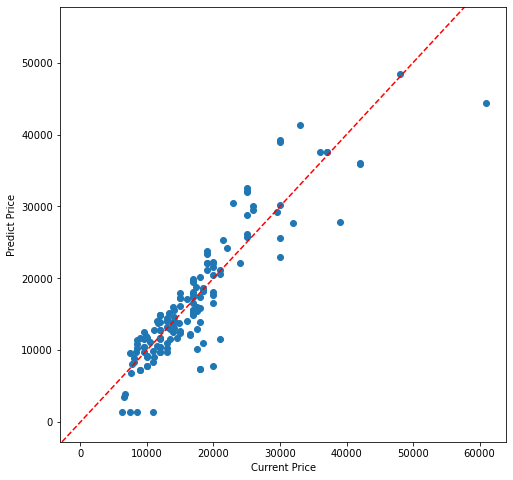

In [46]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(8,8))
ax.scatter(y_test, y_pred)
ax.axline(xy1=(0, 0), xy2=(55000, 55000), linestyle='--', color='red')
ax.set_xlabel('Current Price')
ax.set_ylabel('Predict Price')
plt.show()

# High tier

In [19]:
high_tier = df[df['Mobile Price'] >= 17999]

high_y = high_tier["Mobile Price"]

high_X = high_tier.drop(['Mobile Price'], axis=1)
high_X = scaler.fit_transform(high_X)

hx_train, hx_test, hy_train, hy_test = train_test_split(high_X,high_y, test_size=1/3, random_state=1) 

In [20]:
mlp_high = MLPRegressor(max_iter=15000).fit(hx_train, hy_train)

hy_pred = mlp_high.predict(hx_test)

/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(


In [26]:
parameter_space = {
    'activation': ['identity', 'logistic', 'tanh', 'relu'],
    'solver': ['sgd', 'adam', 'lbfgs']
}

grid = GridSearchCV(mlp_high, parameter_space, n_jobs=-1, cv=3)
grid_result = grid.fit(hx_train, hy_train)
print(grid_result.best_params_)

/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_base.py:170: RuntimeWarning: overflow encountered in square
  return ((y_true - y_pred) ** 2).mean() / 2
/Applications/anaconda3/lib/python3.9/site-packages/sklearn/utils/extmath.py:152: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_base.py:170: RuntimeWarning: overflow encountered in square
  return ((y_true - y_pred) ** 2).mean() / 2
/Applications/anaconda3/lib/python3.9/site-packages/sklearn/utils/extmath.py:152: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/Applications/anaconda3/lib/python3.9/site-packages/numpy/core/_methods.py:178: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/Applications/anaconda3/lib/python3.9/site-packages/sklearn/utils/extmath.py:152: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/Applicati

/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:500: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: 

{'activation': 'relu', 'solver': 'lbfgs'}


In [22]:
parameter_space = {
   'hidden_layer_sizes': [(6, 2), (2, 6), (3, 6)]
}

grid = GridSearchCV(mlp_high, parameter_space, n_jobs=-1, cv=3)
grid_result = grid.fit(hx_train, hy_train)
print(grid_result.best_params_)

/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Applications/anaconda3/lib/

{'hidden_layer_sizes': (6, 2)}


/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(


In [23]:
parameter_space = {
       'warm_start': [False,True],
    'verbose': [False,True]
}

grid = GridSearchCV(mlp_high, parameter_space, n_jobs=-1, cv=3)
grid_result = grid.fit(hx_train, hy_train)
print(grid_result.best_params_)

/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 423271894.38895208
Iteration 2, loss = 423270323.45109272
Iteration 3, loss = 423268757.59820598
Iteration 4, loss = 423267197.85674137
Iteration 5, loss = 423265645.02245623
Iteration 6, loss = 423264096.82056826
Iteration 7, loss = 423262554.31071240
Iteration 8, loss = 423261016.70087945
Iteration 9, loss = 423259484.72523439
Iteration 10, loss = 423257957.00786579
Iteration 11, loss = 423256439.17706138
Iteration 12, loss = 423254927.28736299
Iteration 13, loss = 423253417.24034452
Iteration 14, loss = 423251911.39855945
Iteration 15, loss = 423250407.55027127
Iteration 16, loss = 423248909.06426489
Iteration 17, loss = 423247414.92637002
Iteration 18, loss = 423245923.71977818
Iteration 19, loss = 423244434.50423956
Iteration 20, loss = 423242948.59072292
Iteration 21, loss = 423241466.94206566
Iteration 22, loss = 423239985.00127655
Iteration 23, loss = 423238503.58819228
Iteration 24, loss = 423237023.21023017
Iteration 25, loss = 423235542.22729689
Iteration

Iteration 402, loss = 420158029.42485225
Iteration 403, loss = 420140532.57289702
Iteration 404, loss = 420122987.11820817
Iteration 405, loss = 420105392.83055252
Iteration 406, loss = 420087748.33407062
Iteration 407, loss = 420070048.29014146
Iteration 408, loss = 420052294.89031261
Iteration 409, loss = 420034490.01831001
Iteration 410, loss = 420016631.79915315
Iteration 411, loss = 419998722.22719461
Iteration 412, loss = 419980760.49177992
Iteration 413, loss = 419962747.95172137
Iteration 414, loss = 419944684.47273302
Iteration 415, loss = 419926568.74882239
Iteration 416, loss = 419908399.90541041
Iteration 417, loss = 419890176.40434140
Iteration 418, loss = 419871901.46999097
Iteration 419, loss = 419853575.23563933
Iteration 420, loss = 419835196.65707028
Iteration 421, loss = 419816763.64216417
Iteration 422, loss = 419798279.45602918
Iteration 423, loss = 419779744.19957823
Iteration 424, loss = 419761158.22748983
Iteration 425, loss = 419742521.81224769
Iteration 426, l

Iteration 800, loss = 409577001.83458078
Iteration 801, loss = 409542384.32419634
Iteration 802, loss = 409507731.73581034
Iteration 803, loss = 409473044.18045920
Iteration 804, loss = 409438321.75866020
Iteration 805, loss = 409403564.56158495
Iteration 806, loss = 409368772.67210144
Iteration 807, loss = 409333946.16570103
Iteration 808, loss = 409299085.11132234
Iteration 809, loss = 409264189.57208455
Iteration 810, loss = 409229259.60593969
Iteration 811, loss = 409194295.26625222
Iteration 812, loss = 409159296.60231578
Iteration 813, loss = 409124263.65981233
Iteration 814, loss = 409089196.48122138
Iteration 815, loss = 409054095.10618347
Iteration 816, loss = 409018959.57182401
Iteration 817, loss = 408983789.91304195
Iteration 818, loss = 408948586.09149843
Iteration 819, loss = 408913348.08703053
Iteration 820, loss = 408878075.97009182
Iteration 821, loss = 408842769.77798826
Iteration 822, loss = 408807429.29525894
Iteration 823, loss = 408772054.64173967
Iteration 824, l

Iteration 1194, loss = 393428951.60426718
Iteration 1195, loss = 393382160.27845269
Iteration 1196, loss = 393335342.97021538
Iteration 1197, loss = 393288499.70731723
Iteration 1198, loss = 393241630.51648790
Iteration 1199, loss = 393194735.42353684
Iteration 1200, loss = 393147814.45345211
Iteration 1201, loss = 393100867.63048851
Iteration 1202, loss = 393053894.97824878
Iteration 1203, loss = 393006896.51975250
Iteration 1204, loss = 392959872.27750093
Iteration 1205, loss = 392912822.27353358
Iteration 1206, loss = 392865745.91991645
Iteration 1207, loss = 392818641.47275150
Iteration 1208, loss = 392771510.83666813
Iteration 1209, loss = 392724354.08924913
Iteration 1210, loss = 392677171.30170381
Iteration 1211, loss = 392629962.53955162
Iteration 1212, loss = 392582727.86323345
Iteration 1213, loss = 392535467.32865584
Iteration 1214, loss = 392488180.98767686
Iteration 1215, loss = 392440868.88854057
Iteration 1216, loss = 392393531.07626402
Iteration 1217, loss = 392346167.5

Iteration 1584, loss = 373368855.56203824
Iteration 1585, loss = 373313257.70401812
Iteration 1586, loss = 373257641.03699237
Iteration 1587, loss = 373202005.59546363
Iteration 1588, loss = 373146351.41212142
Iteration 1589, loss = 373090678.51802671
Iteration 1590, loss = 373034986.94277674
Iteration 1591, loss = 372979276.71465552
Iteration 1592, loss = 372923547.86076540
Iteration 1593, loss = 372867800.40714902
Iteration 1594, loss = 372812034.37889552
Iteration 1595, loss = 372756249.80023909
Iteration 1596, loss = 372700446.69464409
Iteration 1597, loss = 372644625.08488464
Iteration 1598, loss = 372588784.99311441
Iteration 1599, loss = 372532926.44092906
Iteration 1600, loss = 372477049.44942367
Iteration 1601, loss = 372421154.03924322
Iteration 1602, loss = 372365240.23062819
Iteration 1603, loss = 372309307.02484596
Iteration 1604, loss = 372253354.47834694
Iteration 1605, loss = 372197383.23130387
Iteration 1606, loss = 372141393.04869521
Iteration 1607, loss = 372085384.0

Iteration 1974, loss = 350399484.27551520
Iteration 1975, loss = 350337737.16248381
Iteration 1976, loss = 350275977.67896152
Iteration 1977, loss = 350214205.84887445
Iteration 1978, loss = 350152421.69513196
Iteration 1979, loss = 350090625.23972976
Iteration 1980, loss = 350028816.50384396
Iteration 1981, loss = 349966995.50791490
Iteration 1982, loss = 349905162.27172148
Iteration 1983, loss = 349843316.81444991
Iteration 1984, loss = 349781459.15475327
Iteration 1985, loss = 349719589.31080633
Iteration 1986, loss = 349657707.30035436
Iteration 1987, loss = 349595813.14075726
Iteration 1988, loss = 349533906.84902811
Iteration 1989, loss = 349471988.44186932
Iteration 1990, loss = 349410057.93570387
Iteration 1991, loss = 349348115.34670353
Iteration 1992, loss = 349286160.69081539
Iteration 1993, loss = 349224193.98378336
Iteration 1994, loss = 349162215.24116993
Iteration 1995, loss = 349100224.47837430
Iteration 1996, loss = 349038221.71064818
Iteration 1997, loss = 348976206.9

Iteration 2364, loss = 325515062.71089822
Iteration 2365, loss = 325449482.35514659
Iteration 2366, loss = 325383893.89215583
Iteration 2367, loss = 325318297.58588201
Iteration 2368, loss = 325252693.65331686
Iteration 2369, loss = 325187082.27438915
Iteration 2370, loss = 325121463.59934312
Iteration 2371, loss = 325055837.75436628
Iteration 2372, loss = 324990204.84596193
Iteration 2373, loss = 324924564.96440268
Iteration 2374, loss = 324858918.18649197
Iteration 2375, loss = 324793264.57779968
Iteration 2376, loss = 324727604.19448507
Iteration 2377, loss = 324661937.08479929
Iteration 2378, loss = 324596263.29032940
Iteration 2379, loss = 324530582.84703553
Iteration 2380, loss = 324464895.78611934
Iteration 2381, loss = 324399202.13475466
Iteration 2382, loss = 324333501.91670555
Iteration 2383, loss = 324267795.15284717
Iteration 2384, loss = 324202081.86161059
Iteration 2385, loss = 324136362.05936003
Iteration 2386, loss = 324070635.76071501
Iteration 2387, loss = 324004902.9

Iteration 2364, loss = 268998242.22133070
Iteration 2365, loss = 268932306.35358989
Iteration 2366, loss = 268866367.11597645
Iteration 2367, loss = 268800424.52370340
Iteration 2368, loss = 268734478.59198296
Iteration 2369, loss = 268668529.33602637
Iteration 2370, loss = 268602576.77104348
Iteration 2371, loss = 268536620.91224325
Iteration 2372, loss = 268470661.77483314
Iteration 2373, loss = 268404699.37401971
Iteration 2374, loss = 268338733.72500780
Iteration 2375, loss = 268272764.84300104
Iteration 2376, loss = 268206792.74320152
Iteration 2377, loss = 268140817.44080994
Iteration 2378, loss = 268074838.95102540
Iteration 2379, loss = 268008857.28904527
Iteration 2380, loss = 267942872.47006541
Iteration 2381, loss = 267876884.50928006
Iteration 2382, loss = 267810893.42188132
Iteration 2383, loss = 267744899.22305974
Iteration 2384, loss = 267678901.92800400
Iteration 2385, loss = 267612901.55190077
Iteration 2386, loss = 267546898.10993469
Iteration 2387, loss = 267480891.6

Iteration 2754, loss = 299506114.01550114
Iteration 2755, loss = 299438586.33514512
Iteration 2756, loss = 299371055.58549351
Iteration 2757, loss = 299303521.82606912
Iteration 2758, loss = 299235985.11096203
Iteration 2759, loss = 299168445.48940980
Iteration 2760, loss = 299100903.00631708
Iteration 2761, loss = 299033357.70271635
Iteration 2762, loss = 298965809.61618227
Iteration 2763, loss = 298898258.78119981
Iteration 2764, loss = 298830705.22949362
Iteration 2765, loss = 298763148.99032164
Iteration 2766, loss = 298695590.09073806
Iteration 2767, loss = 298628028.55582774
Iteration 2768, loss = 298560464.40891564
Iteration 2769, loss = 298492897.67175418
Iteration 2770, loss = 298425328.36469042
Iteration 2771, loss = 298357756.50681537
Iteration 2772, loss = 298290182.11609834
Iteration 2773, loss = 298222605.20950502
Iteration 2774, loss = 298155025.80310589
Iteration 2775, loss = 298087443.91217005
Iteration 2776, loss = 298019859.55125153
Iteration 2777, loss = 297952272.7

Iteration 2754, loss = 243164376.78583279
Iteration 2755, loss = 243098214.69602165
Iteration 2756, loss = 243032054.89849192
Iteration 2757, loss = 242965897.40635797
Iteration 2758, loss = 242899742.23272717
Iteration 2759, loss = 242833589.39069992
Iteration 2760, loss = 242767438.89336997
Iteration 2761, loss = 242701290.75382465
Iteration 2762, loss = 242635144.98514506
Iteration 2763, loss = 242569001.60040605
Iteration 2764, loss = 242502860.61267665
Iteration 2765, loss = 242436722.03502002
Iteration 2766, loss = 242370585.88049376
Iteration 2767, loss = 242304452.16214955
Iteration 2768, loss = 242238320.89303389
Iteration 2769, loss = 242172192.08618766
Iteration 2770, loss = 242106065.75464633
Iteration 2771, loss = 242039941.91144034
Iteration 2772, loss = 241973820.56959468
Iteration 2773, loss = 241907701.74212924
Iteration 2774, loss = 241841585.44205886
Iteration 2775, loss = 241775471.68239301
Iteration 2776, loss = 241709360.47613633
Iteration 2777, loss = 241643251.8

Iteration 3144, loss = 273033098.81770164
Iteration 3145, loss = 272965084.66506970
Iteration 3146, loss = 272897071.22115523
Iteration 3147, loss = 272829058.50621176
Iteration 3148, loss = 272761046.53890592
Iteration 3149, loss = 272693035.33648598
Iteration 3150, loss = 272625024.91493291
Iteration 3151, loss = 272557015.28909600
Iteration 3152, loss = 272489006.47281408
Iteration 3153, loss = 272420998.47902453
Iteration 3154, loss = 272352991.31986016
Iteration 3155, loss = 272284985.00673717
Iteration 3156, loss = 272216979.55043274
Iteration 3157, loss = 272148974.96115530
Iteration 3158, loss = 272080971.24860704
Iteration 3159, loss = 272012968.42203987
Iteration 3160, loss = 271944966.49030632
Iteration 3161, loss = 271876965.46190315
Iteration 3162, loss = 271808965.34501332
Iteration 3163, loss = 271740966.14754015
Iteration 3164, loss = 271672967.87714088
Iteration 3165, loss = 271604970.54125452
Iteration 3166, loss = 271536974.14712828
Iteration 3167, loss = 271468978.7

Iteration 3144, loss = 217646870.81695294
Iteration 3145, loss = 217582487.41772726
Iteration 3146, loss = 217518111.08910957
Iteration 3147, loss = 217453741.84347409
Iteration 3148, loss = 217389379.69301939
Iteration 3149, loss = 217325024.64978570
Iteration 3150, loss = 217260676.72567070
Iteration 3151, loss = 217196335.93244317
Iteration 3152, loss = 217132002.28175586
Iteration 3153, loss = 217067675.78515640
Iteration 3154, loss = 217003356.45409769
Iteration 3155, loss = 216939044.29994687
Iteration 3156, loss = 216874739.33399385
Iteration 3157, loss = 216810441.56745824
Iteration 3158, loss = 216746151.01149625
Iteration 3159, loss = 216681867.67720667
Iteration 3160, loss = 216617591.57563591
Iteration 3161, loss = 216553322.71778327
Iteration 3162, loss = 216489061.11460495
Iteration 3163, loss = 216424806.77701798
Iteration 3164, loss = 216360559.71590382
Iteration 3165, loss = 216296319.94211143
Iteration 3166, loss = 216232087.46646026
Iteration 3167, loss = 216167862.2

Iteration 3534, loss = 246607876.80968267
Iteration 3535, loss = 246540567.25567046
Iteration 3536, loss = 246473261.06360370
Iteration 3537, loss = 246405958.25450829
Iteration 3538, loss = 246338658.84791973
Iteration 3539, loss = 246271362.86203504
Iteration 3540, loss = 246204070.31384921
Iteration 3541, loss = 246136781.21927884
Iteration 3542, loss = 246069495.59327140
Iteration 3543, loss = 246002213.44990501
Iteration 3544, loss = 245934934.80247682
Iteration 3545, loss = 245867659.66358283
Iteration 3546, loss = 245800388.04519030
Iteration 3547, loss = 245733119.95870116
Iteration 3548, loss = 245665855.41501018
Iteration 3549, loss = 245598594.42455730
Iteration 3550, loss = 245531336.99737352
Iteration 3551, loss = 245464083.14312324
Iteration 3552, loss = 245396831.68396631
Iteration 3553, loss = 245329582.80547571
Iteration 3554, loss = 245262335.84521598
Iteration 3555, loss = 245195089.16609573
Iteration 3556, loss = 245127845.10547355
Iteration 3557, loss = 245060603.7

Iteration 3924, loss = 220654456.90670326
Iteration 3925, loss = 220588826.92566520
Iteration 3926, loss = 220523195.18080774
Iteration 3927, loss = 220457566.11307743
Iteration 3928, loss = 220391940.10770941
Iteration 3929, loss = 220326317.51081398
Iteration 3930, loss = 220260698.63339561
Iteration 3931, loss = 220195083.75495908
Iteration 3932, loss = 220129473.12674484
Iteration 3933, loss = 220063866.97463143
Iteration 3934, loss = 219998265.50174034
Iteration 3935, loss = 219932668.89077279
Iteration 3936, loss = 219867077.30610633
Iteration 3937, loss = 219801490.89567664
Iteration 3938, loss = 219735909.79266548
Iteration 3939, loss = 219670334.11701581
Iteration 3940, loss = 219604763.97679099
Iteration 3941, loss = 219539199.46939430
Iteration 3942, loss = 219473640.68266460
Iteration 3943, loss = 219408087.69585726
Iteration 3944, loss = 219342540.58052659
Iteration 3945, loss = 219276999.40131661
Iteration 3946, loss = 219211464.21667096
Iteration 3947, loss = 219145935.0

Iteration 3924, loss = 170306712.34914213
Iteration 3925, loss = 170250585.95139769
Iteration 3926, loss = 170194473.21107936
Iteration 3927, loss = 170138374.14629701
Iteration 3928, loss = 170082288.28127253
Iteration 3929, loss = 170026211.88243052
Iteration 3930, loss = 169970148.10649917
Iteration 3931, loss = 169914097.07965150
Iteration 3932, loss = 169858058.91588181
Iteration 3933, loss = 169802033.71823239
Iteration 3934, loss = 169746021.57989648
Iteration 3935, loss = 169690022.58521023
Iteration 3936, loss = 169634036.81054449
Iteration 3937, loss = 169578064.32510719
Iteration 3938, loss = 169522105.19166440
Iteration 3939, loss = 169466159.46718913
Iteration 3940, loss = 169410227.20344418
Iteration 3941, loss = 169354308.44750705
Iteration 3942, loss = 169298403.24224147
Iteration 3943, loss = 169242511.62672126
Iteration 3944, loss = 169186633.63661173
Iteration 3945, loss = 169130769.30451301
Iteration 3946, loss = 169074918.66026792
Iteration 3947, loss = 169019081.7

Iteration 4314, loss = 195508661.81353211
Iteration 4315, loss = 195445561.00155571
Iteration 4316, loss = 195382468.95014554
Iteration 4317, loss = 195319385.67196101
Iteration 4318, loss = 195256311.17859694
Iteration 4319, loss = 195193245.48069403
Iteration 4320, loss = 195130188.58803895
Iteration 4321, loss = 195067140.50965345
Iteration 4322, loss = 195004101.25387469
Iteration 4323, loss = 194941070.82842809
Iteration 4324, loss = 194878049.24049151
Iteration 4325, loss = 194815036.49675426
Iteration 4326, loss = 194752032.60346907
Iteration 4327, loss = 194689037.56649950
Iteration 4328, loss = 194626051.39136186
Iteration 4329, loss = 194563074.08326375
Iteration 4330, loss = 194500105.64713767
Iteration 4331, loss = 194437146.08767194
Iteration 4332, loss = 194374195.40933791
Iteration 4333, loss = 194311253.61641511
Iteration 4334, loss = 194248320.71301278
Iteration 4335, loss = 194185396.70309049
Iteration 4336, loss = 194122481.59047517
Iteration 4337, loss = 194059575.3

Iteration 4704, loss = 171509332.27130106
Iteration 4705, loss = 171449614.22412086
Iteration 4706, loss = 171389905.84508386
Iteration 4707, loss = 171330207.26338774
Iteration 4708, loss = 171270518.59524021
Iteration 4709, loss = 171210839.94519556
Iteration 4710, loss = 171151171.40735355
Iteration 4711, loss = 171091513.06643471
Iteration 4712, loss = 171031864.87854487
Iteration 4713, loss = 170972224.14472330
Iteration 4714, loss = 170912593.39620319
Iteration 4715, loss = 170852972.73204759
Iteration 4716, loss = 170793362.24151447
Iteration 4717, loss = 170733762.00505728
Iteration 4718, loss = 170674172.09522268
Iteration 4719, loss = 170614592.57745707
Iteration 4720, loss = 170555023.51083097
Iteration 4721, loss = 170495464.94868976
Iteration 4722, loss = 170435916.93923786
Iteration 4723, loss = 170376379.52606362
Iteration 4724, loss = 170316852.74861035
Iteration 4725, loss = 170257336.64260030
Iteration 4726, loss = 170197831.24041414
Iteration 4727, loss = 170138336.5

Iteration 5094, loss = 149023792.46258509
Iteration 5095, loss = 148968337.61604890
Iteration 5096, loss = 148912894.89374620
Iteration 5097, loss = 148857458.61947429
Iteration 5098, loss = 148802029.22924605
Iteration 5099, loss = 148746610.94361538
Iteration 5100, loss = 148691203.92911130
Iteration 5101, loss = 148635808.33571407
Iteration 5102, loss = 148580424.29852819
Iteration 5103, loss = 148525051.93928611
Iteration 5104, loss = 148469691.36770013
Iteration 5105, loss = 148414342.68267745
Iteration 5106, loss = 148359005.97341281
Iteration 5107, loss = 148303681.32037026
Iteration 5108, loss = 148248368.79616582
Iteration 5109, loss = 148193068.46636149
Iteration 5110, loss = 148137780.39017788
Iteration 5111, loss = 148082504.62113610
Iteration 5112, loss = 148027240.19290662
Iteration 5113, loss = 147971983.96027857
Iteration 5114, loss = 147916739.10076499
Iteration 5115, loss = 147861505.75718826
Iteration 5116, loss = 147806284.05830306
Iteration 5117, loss = 147751074.1

Iteration 5484, loss = 128292573.00754263
Iteration 5485, loss = 128241946.99070165
Iteration 5486, loss = 128191334.70315836
Iteration 5487, loss = 128140736.20095752
Iteration 5488, loss = 128090151.53463085
Iteration 5489, loss = 128039580.74975200
Iteration 5490, loss = 127989023.88743559
Iteration 5491, loss = 127938480.98478591
Iteration 5492, loss = 127887952.07530122
Iteration 5493, loss = 127837437.18923658
Iteration 5494, loss = 127786936.35393079
Iteration 5495, loss = 127736449.59410051
Iteration 5496, loss = 127685976.93210453
Iteration 5497, loss = 127635518.38818170
Iteration 5498, loss = 127585073.98066489
Iteration 5499, loss = 127534643.72617348
Iteration 5500, loss = 127484227.63978636
Iteration 5501, loss = 127433825.73519789
Iteration 5502, loss = 127383438.02485782
Iteration 5503, loss = 127333064.52009711
Iteration 5504, loss = 127282705.23124169
Iteration 5505, loss = 127232360.16771398
Iteration 5506, loss = 127182029.33812477
Iteration 5507, loss = 127131712.7

Iteration 5874, loss = 109648085.10141085
Iteration 5875, loss = 109603194.12911575
Iteration 5876, loss = 109558318.24115258
Iteration 5877, loss = 109513457.43327880
Iteration 5878, loss = 109468611.70179117
Iteration 5879, loss = 109423781.04347135
Iteration 5880, loss = 109378965.45553730
Iteration 5881, loss = 109334164.93559918
Iteration 5882, loss = 109289379.48162001
Iteration 5883, loss = 109244609.09187999
Iteration 5884, loss = 109199853.76494440
Iteration 5885, loss = 109155113.49963500
Iteration 5886, loss = 109110388.29500386
Iteration 5887, loss = 109065678.15031022
Iteration 5888, loss = 109020983.06499921
Iteration 5889, loss = 108976303.03868330
Iteration 5890, loss = 108931638.07112491
Iteration 5891, loss = 108886988.16222140
Iteration 5892, loss = 108842353.31199093
Iteration 5893, loss = 108797733.52056041
Iteration 5894, loss = 108753128.78815414
Iteration 5895, loss = 108708539.11508366
Iteration 5896, loss = 108663964.50173895
Iteration 5897, loss = 108619404.9

Iteration 6268, loss = 93129447.64483847
Iteration 6269, loss = 93090502.66553752
Iteration 6270, loss = 93051572.97230953
Iteration 6271, loss = 93012658.56448679
Iteration 6272, loss = 92973759.44139874
Iteration 6273, loss = 92934875.60237193
Iteration 6274, loss = 92896007.04673018
Iteration 6275, loss = 92857153.77379414
Iteration 6276, loss = 92818315.78288181
Iteration 6277, loss = 92779493.07330814
Iteration 6278, loss = 92740684.54028873
Iteration 6279, loss = 92701890.22133344
Iteration 6280, loss = 92663110.87841804
Iteration 6281, loss = 92624346.54227649
Iteration 6282, loss = 92585597.24047850
Iteration 6283, loss = 92546862.99774757
Iteration 6284, loss = 92508143.83624656
Iteration 6285, loss = 92469439.77583489
Iteration 6286, loss = 92430750.83429967
Iteration 6287, loss = 92392077.02756386
Iteration 6288, loss = 92353418.36987324
Iteration 6289, loss = 92314774.87396471
Iteration 6290, loss = 92276146.55121762
Iteration 6291, loss = 92237533.41179001
Iteration 6292, 

Iteration 6666, loss = 78790953.09880967
Iteration 6667, loss = 78757781.62748958
Iteration 6668, loss = 78724625.07477249
Iteration 6669, loss = 78691483.45427677
Iteration 6670, loss = 78658356.77789049
Iteration 6671, loss = 78625243.78716965
Iteration 6672, loss = 78592122.07054353
Iteration 6673, loss = 78559012.08767670
Iteration 6674, loss = 78525914.18281907
Iteration 6675, loss = 78492828.66497134
Iteration 6676, loss = 78459755.81145352
Iteration 6677, loss = 78426695.87111229
Iteration 6678, loss = 78393649.06720348
Iteration 6679, loss = 78360615.59998299
Iteration 6680, loss = 78327595.64903499
Iteration 6681, loss = 78294589.37536496
Iteration 6682, loss = 78261596.92328061
Iteration 6683, loss = 78228618.42208217
Iteration 6684, loss = 78195653.98758182
Iteration 6685, loss = 78162703.72346929
Iteration 6686, loss = 78129767.72253902
Iteration 6687, loss = 78096846.06779334
Iteration 6688, loss = 78063938.83343370
Iteration 6689, loss = 78031046.08575189
Iteration 6690, 

Iteration 7064, loss = 66714636.04203042
Iteration 7065, loss = 66687101.82914725
Iteration 7066, loss = 66659580.86049428
Iteration 7067, loss = 66632073.89156662
Iteration 7068, loss = 66604582.60610342
Iteration 7069, loss = 66577104.65348719
Iteration 7070, loss = 66549640.05681086
Iteration 7071, loss = 66522188.83636326
Iteration 7072, loss = 66494751.00991151
Iteration 7073, loss = 66467326.59295506
Iteration 7074, loss = 66439915.59895437
Iteration 7075, loss = 66412518.03953622
Iteration 7076, loss = 66385133.92872521
Iteration 7077, loss = 66357764.70788085
Iteration 7078, loss = 66330408.50284363
Iteration 7079, loss = 66303065.36521787
Iteration 7080, loss = 66275736.76907676
Iteration 7081, loss = 66248421.59810927
Iteration 7082, loss = 66221119.74676000
Iteration 7083, loss = 66193831.23329889
Iteration 7084, loss = 66166556.07367428
Iteration 7085, loss = 66139294.28174680
Iteration 7086, loss = 66112047.16555004
Iteration 7087, loss = 66084813.30166201
Iteration 7088, 

Iteration 7462, loss = 56775539.29529894
Iteration 7463, loss = 56752992.29712704
Iteration 7464, loss = 56730456.94906422
Iteration 7465, loss = 56707933.25304244
Iteration 7466, loss = 56685421.21022361
Iteration 7467, loss = 56662920.82107671
Iteration 7468, loss = 56640432.08544711
Iteration 7469, loss = 56617955.00261893
Iteration 7470, loss = 56595489.59655499
Iteration 7471, loss = 56573036.04189425
Iteration 7472, loss = 56550594.13427462
Iteration 7473, loss = 56528163.84865610
Iteration 7474, loss = 56505745.18459173
Iteration 7475, loss = 56483338.32499377
Iteration 7476, loss = 56460942.96823678
Iteration 7477, loss = 56438559.38667205
Iteration 7478, loss = 56416187.39672516
Iteration 7479, loss = 56393826.99810482
Iteration 7480, loss = 56371478.18997236
Iteration 7481, loss = 56349140.97099641
Iteration 7482, loss = 56326815.33940206
Iteration 7483, loss = 56304501.29301513
Iteration 7484, loss = 56282198.95654609
Iteration 7485, loss = 56259908.19548005
Iteration 7486, 

Iteration 7860, loss = 48654726.09745950
Iteration 7861, loss = 48636279.21363515
Iteration 7862, loss = 48617841.18171104
Iteration 7863, loss = 48599412.06213739
Iteration 7864, loss = 48580991.90872067
Iteration 7865, loss = 48562580.76928981
Iteration 7866, loss = 48544178.68629585
Iteration 7867, loss = 48525785.69735147
Iteration 7868, loss = 48507401.83571628
Iteration 7869, loss = 48489027.13073365
Iteration 7870, loss = 48470661.60822359
Iteration 7871, loss = 48452305.29083634
Iteration 7872, loss = 48433958.19837040
Iteration 7873, loss = 48415620.34805883
Iteration 7874, loss = 48397291.75482664
Iteration 7875, loss = 48378972.43152253
Iteration 7876, loss = 48360663.14526357
Iteration 7877, loss = 48342361.78700644
Iteration 7878, loss = 48324070.46673215
Iteration 7879, loss = 48305788.43636333
Iteration 7880, loss = 48287515.70257172
Iteration 7881, loss = 48269252.27078129
Iteration 7882, loss = 48250998.14529359
Iteration 7883, loss = 48232753.32940058
Iteration 7884, 

Iteration 8258, loss = 41995947.28950510
Iteration 8259, loss = 41980756.41654647
Iteration 8260, loss = 41965572.26851911
Iteration 8261, loss = 41950394.91525917
Iteration 8262, loss = 41935224.41912779
Iteration 8263, loss = 41920060.83575788
Iteration 8264, loss = 41904904.21472662
Iteration 8265, loss = 41889754.60016073
Iteration 8266, loss = 41874614.20193862
Iteration 8267, loss = 41859478.75839791
Iteration 8268, loss = 41844349.96865963
Iteration 8269, loss = 41829229.79002238
Iteration 8270, loss = 41814116.35477879
Iteration 8271, loss = 41799006.73608889
Iteration 8272, loss = 41783903.70301376
Iteration 8273, loss = 41768807.33448111
Iteration 8274, loss = 41753717.70104448
Iteration 8275, loss = 41738634.86571871
Iteration 8276, loss = 41723558.88473237
Iteration 8277, loss = 41708491.72581015
Iteration 8278, loss = 41693429.71689128
Iteration 8279, loss = 41678372.42063256
Iteration 8280, loss = 41663321.83799490
Iteration 8281, loss = 41648277.65869935
Iteration 8282, 

Iteration 8656, loss = 36451329.00917134
Iteration 8657, loss = 36438619.00432970
Iteration 8658, loss = 36425916.11768615
Iteration 8659, loss = 36413217.23085232
Iteration 8660, loss = 36400518.81396253
Iteration 8661, loss = 36387822.94964779
Iteration 8662, loss = 36375131.41548898
Iteration 8663, loss = 36362441.82808609
Iteration 8664, loss = 36349757.70476477
Iteration 8665, loss = 36337077.00496040
Iteration 8666, loss = 36324401.98192257
Iteration 8667, loss = 36311731.85613094
Iteration 8668, loss = 36299066.73275424
Iteration 8669, loss = 36286405.07855506
Iteration 8670, loss = 36273747.57950609
Iteration 8671, loss = 36261095.48619165
Iteration 8672, loss = 36248447.77894735
Iteration 8673, loss = 36235804.16532633
Iteration 8674, loss = 36223161.04180557
Iteration 8675, loss = 36210522.31962042
Iteration 8676, loss = 36197887.74059802
Iteration 8677, loss = 36185255.62044305
Iteration 8678, loss = 36172629.13304099
Iteration 8679, loss = 36160005.33981381
Iteration 8680, 

Iteration 9054, loss = 31775998.08913643
Iteration 9055, loss = 31765241.95852114
Iteration 9056, loss = 31754490.64083560
Iteration 9057, loss = 31743744.13970210
Iteration 9058, loss = 31733002.45799470
Iteration 9059, loss = 31722265.59791449
Iteration 9060, loss = 31711533.56105739
Iteration 9061, loss = 31700806.34847516
Iteration 9062, loss = 31690084.67422224
Iteration 9063, loss = 31679366.87075027
Iteration 9064, loss = 31668654.55789362
Iteration 9065, loss = 31657947.02628951
Iteration 9066, loss = 31647244.90282593
Iteration 9067, loss = 31636546.79279262
Iteration 9068, loss = 31625854.04789373
Iteration 9069, loss = 31615166.05073508
Iteration 9070, loss = 31604482.80648076
Iteration 9071, loss = 31593804.31939969
Iteration 9072, loss = 31583130.59295545
Iteration 9073, loss = 31572461.62988723
Iteration 9074, loss = 31561797.43228263
Iteration 9075, loss = 31551138.02847422
Iteration 9076, loss = 31540483.81264557
Iteration 9077, loss = 31529834.34445860
Iteration 9078, 

Iteration 9452, loss = 27808997.84223463
Iteration 9453, loss = 27799687.24789904
Iteration 9454, loss = 27790378.60959798
Iteration 9455, loss = 27781072.17916860
Iteration 9456, loss = 27771767.70468229
Iteration 9457, loss = 27762466.19562270
Iteration 9458, loss = 27753167.30238098
Iteration 9459, loss = 27743870.89732683
Iteration 9460, loss = 27734577.50778039
Iteration 9461, loss = 27725287.01249543
Iteration 9462, loss = 27715999.83201715
Iteration 9463, loss = 27706715.55360715
Iteration 9464, loss = 27697434.26631517
Iteration 9465, loss = 27688156.37469232
Iteration 9466, loss = 27678881.46352500
Iteration 9467, loss = 27669610.08137275
Iteration 9468, loss = 27660342.61668433
Iteration 9469, loss = 27651077.88081494
Iteration 9470, loss = 27641816.97854366
Iteration 9471, loss = 27632559.42358765
Iteration 9472, loss = 27623305.73130745
Iteration 9473, loss = 27614055.67635509
Iteration 9474, loss = 27604808.74245590
Iteration 9475, loss = 27595566.02614601
Iteration 9476, 

Iteration 9850, loss = 24364611.36501947
Iteration 9851, loss = 24356542.58568014
Iteration 9852, loss = 24348472.00957873
Iteration 9853, loss = 24340403.17747902
Iteration 9854, loss = 24332336.49156640
Iteration 9855, loss = 24324272.02814154
Iteration 9856, loss = 24316210.39589923
Iteration 9857, loss = 24308152.03306480
Iteration 9858, loss = 24300095.89641180
Iteration 9859, loss = 24292042.47847700
Iteration 9860, loss = 24283992.07921291
Iteration 9861, loss = 24275943.73412397
Iteration 9862, loss = 24267898.46276639
Iteration 9863, loss = 24259856.65681387
Iteration 9864, loss = 24251817.31326190
Iteration 9865, loss = 24243781.77614600
Iteration 9866, loss = 24235747.37721830
Iteration 9867, loss = 24227716.69851164
Iteration 9868, loss = 24219688.89881859
Iteration 9869, loss = 24211665.07653468
Iteration 9870, loss = 24203642.98089258
Iteration 9871, loss = 24195624.51697250
Iteration 9872, loss = 24187608.82244638
Iteration 9873, loss = 24179596.29914041
Iteration 9874, 

Iteration 10243, loss = 21393390.56429496
Iteration 10244, loss = 21386366.89585657
Iteration 10245, loss = 21379346.59626078
Iteration 10246, loss = 21372328.18556190
Iteration 10247, loss = 21365311.90087059
Iteration 10248, loss = 21358297.76370672
Iteration 10249, loss = 21351287.57944528
Iteration 10250, loss = 21344279.99012538
Iteration 10251, loss = 21337273.82357540
Iteration 10252, loss = 21330271.51115973
Iteration 10253, loss = 21323271.14589725
Iteration 10254, loss = 21316274.52116751
Iteration 10255, loss = 21309279.98491601
Iteration 10256, loss = 21302287.40286272
Iteration 10257, loss = 21295296.76125422
Iteration 10258, loss = 21288308.39955553
Iteration 10259, loss = 21281322.44104739
Iteration 10260, loss = 21274342.61086700
Iteration 10261, loss = 21267364.15556207
Iteration 10262, loss = 21260386.48700679
Iteration 10263, loss = 21253409.50897280
Iteration 10264, loss = 21246438.40175626
Iteration 10265, loss = 21239470.54644063
Iteration 10266, loss = 21232504.5

Iteration 10633, loss = 18840083.12367443
Iteration 10634, loss = 18833948.19249556
Iteration 10635, loss = 18827815.15989017
Iteration 10636, loss = 18821685.41195039
Iteration 10637, loss = 18815557.74935456
Iteration 10638, loss = 18809433.73626641
Iteration 10639, loss = 18803310.39913316
Iteration 10640, loss = 18797188.15674400
Iteration 10641, loss = 18791070.59673312
Iteration 10642, loss = 18784955.39940598
Iteration 10643, loss = 18778840.36279853
Iteration 10644, loss = 18772727.07207912
Iteration 10645, loss = 18766618.56464462
Iteration 10646, loss = 18760511.57530995
Iteration 10647, loss = 18754406.81549490
Iteration 10648, loss = 18748303.80580916
Iteration 10649, loss = 18742202.09055356
Iteration 10650, loss = 18736102.96872848
Iteration 10651, loss = 18730007.26746835
Iteration 10652, loss = 18723913.59887506
Iteration 10653, loss = 18717821.21692862
Iteration 10654, loss = 18711734.28668524
Iteration 10655, loss = 18705656.83109196
Iteration 10656, loss = 18699581.6

Iteration 10645, loss = 20866845.08559170
Iteration 10646, loss = 20860201.98624937
Iteration 10647, loss = 20853560.94517933
Iteration 10648, loss = 20846921.96104608
Iteration 10649, loss = 20840285.03257747
Iteration 10650, loss = 20833650.15855851
Iteration 10651, loss = 20827017.33782580
Iteration 10652, loss = 20820386.56926258
Iteration 10653, loss = 20813757.85179413
Iteration 10654, loss = 20807131.18438379
Iteration 10655, loss = 20800506.56602927
Iteration 10656, loss = 20793883.99575936
Iteration 10657, loss = 20787263.47263099
Iteration 10658, loss = 20780644.99572650
Iteration 10659, loss = 20774028.56415132
Iteration 10660, loss = 20767414.17703174
Iteration 10661, loss = 20760801.83351297
Iteration 10662, loss = 20754191.53275746
Iteration 10663, loss = 20747583.27394317
Iteration 10664, loss = 20740977.05626230
Iteration 10665, loss = 20734372.87891992
Iteration 10666, loss = 20727770.74113284
Iteration 10667, loss = 20721170.64212856
Iteration 10668, loss = 20714572.5

Iteration 11023, loss = 16595337.81004205
Iteration 11024, loss = 16589939.54522817
Iteration 11025, loss = 16584543.14400068
Iteration 11026, loss = 16579149.76772236
Iteration 11027, loss = 16573756.69222933
Iteration 11028, loss = 16568366.03884474
Iteration 11029, loss = 16562977.67936791
Iteration 11030, loss = 16557590.89679132
Iteration 11031, loss = 16552206.84174673
Iteration 11032, loss = 16546824.38485638
Iteration 11033, loss = 16541443.51334934
Iteration 11034, loss = 16536063.87798252
Iteration 11035, loss = 16530687.08212934
Iteration 11036, loss = 16525311.89293989
Iteration 11037, loss = 16519939.93445052
Iteration 11038, loss = 16514569.25186045
Iteration 11039, loss = 16509200.43169772
Iteration 11040, loss = 16503833.94444397
Iteration 11041, loss = 16498469.33297053
Iteration 11042, loss = 16493107.42763525
Iteration 11043, loss = 16487746.89829701
Iteration 11044, loss = 16482388.51539200
Iteration 11045, loss = 16477031.89817299
Iteration 11046, loss = 16471677.7

Iteration 11035, loss = 18426328.26281684
Iteration 11036, loss = 18420441.42476883
Iteration 11037, loss = 18414556.49219074
Iteration 11038, loss = 18408673.45917124
Iteration 11039, loss = 18402792.32034246
Iteration 11040, loss = 18396913.07082608
Iteration 11041, loss = 18391035.70618475
Iteration 11042, loss = 18385160.22237857
Iteration 11043, loss = 18379286.61572565
Iteration 11044, loss = 18373414.88286668
Iteration 11045, loss = 18367545.02073307
Iteration 11046, loss = 18361677.02651815
Iteration 11047, loss = 18355810.89765136
Iteration 11048, loss = 18349946.63177478
Iteration 11049, loss = 18344084.22672223
Iteration 11050, loss = 18338223.68050031
Iteration 11051, loss = 18332364.99127130
Iteration 11052, loss = 18326508.15733784
Iteration 11053, loss = 18320653.17712906
Iteration 11054, loss = 18314800.04918811
Iteration 11055, loss = 18308948.77216087
Iteration 11056, loss = 18303099.34478594
Iteration 11057, loss = 18297251.76588538
Iteration 11058, loss = 18291406.0

Iteration 11413, loss = 14608490.56510126
Iteration 11414, loss = 14603737.26417104
Iteration 11415, loss = 14598987.30437888
Iteration 11416, loss = 14594239.14632169
Iteration 11417, loss = 14589492.75007531
Iteration 11418, loss = 14584746.97502004
Iteration 11419, loss = 14580005.88980739
Iteration 11420, loss = 14575266.12212184
Iteration 11421, loss = 14570528.10826978
Iteration 11422, loss = 14565791.66131240
Iteration 11423, loss = 14561056.64217974
Iteration 11424, loss = 14556324.91134423
Iteration 11425, loss = 14551596.64125045
Iteration 11426, loss = 14546869.07494476
Iteration 11427, loss = 14542142.14264855
Iteration 11428, loss = 14537418.52941636
Iteration 11429, loss = 14532693.68592687
Iteration 11430, loss = 14527967.53020201
Iteration 11431, loss = 14523241.82243518
Iteration 11432, loss = 14518516.73450066
Iteration 11433, loss = 14513792.42074529
Iteration 11434, loss = 14509070.91480109
Iteration 11435, loss = 14504352.03947384
Iteration 11436, loss = 14499633.9

Iteration 11425, loss = 16264953.60840540
Iteration 11426, loss = 16259694.83899582
Iteration 11427, loss = 16254436.92689271
Iteration 11428, loss = 16249180.13571312
Iteration 11429, loss = 16243924.29175497
Iteration 11430, loss = 16238669.56124065
Iteration 11431, loss = 16233416.13094484
Iteration 11432, loss = 16228163.93130667
Iteration 11433, loss = 16222913.02054717
Iteration 11434, loss = 16217663.45097765
Iteration 11435, loss = 16212415.51981180
Iteration 11436, loss = 16207168.87715753
Iteration 11437, loss = 16201923.55078255
Iteration 11438, loss = 16196680.05810235
Iteration 11439, loss = 16191438.07151082
Iteration 11440, loss = 16186197.61826186
Iteration 11441, loss = 16180958.72564426
Iteration 11442, loss = 16175721.41814218
Iteration 11443, loss = 16170485.71771657
Iteration 11444, loss = 16165251.64405812
Iteration 11445, loss = 16160019.21481514
Iteration 11446, loss = 16154788.63239419
Iteration 11447, loss = 16149559.75835846
Iteration 11448, loss = 16144332.4

Iteration 11803, loss = 12870109.55941369
Iteration 11804, loss = 12866006.89863982
Iteration 11805, loss = 12861904.82788408
Iteration 11806, loss = 12857806.93538383
Iteration 11807, loss = 12853711.16057654
Iteration 11808, loss = 12849616.89968970
Iteration 11809, loss = 12845523.80184177
Iteration 11810, loss = 12841432.66783127
Iteration 11811, loss = 12837343.48849109
Iteration 11812, loss = 12833258.35239438
Iteration 11813, loss = 12829175.01352383
Iteration 11814, loss = 12825091.48165458
Iteration 11815, loss = 12821010.06642160
Iteration 11816, loss = 12816932.78257052
Iteration 11817, loss = 12812856.40508315
Iteration 11818, loss = 12808781.11886504
Iteration 11819, loss = 12804708.01560276
Iteration 11820, loss = 12800638.91395142
Iteration 11821, loss = 12796570.62307363
Iteration 11822, loss = 12792503.55541850
Iteration 11823, loss = 12788438.95711770
Iteration 11824, loss = 12784377.60321313
Iteration 11825, loss = 12780317.22613947
Iteration 11826, loss = 12776258.0

Iteration 12193, loss = 11391509.67887946
Iteration 12194, loss = 11387991.38921532
Iteration 12195, loss = 11384473.78398206
Iteration 12196, loss = 11380957.90497890
Iteration 12197, loss = 11377440.05174701
Iteration 12198, loss = 11373924.64322564
Iteration 12199, loss = 11370414.36294512
Iteration 12200, loss = 11366904.07553179
Iteration 12201, loss = 11363397.45092627
Iteration 12202, loss = 11359891.99662637
Iteration 12203, loss = 11356385.81837550
Iteration 12204, loss = 11352882.37068457
Iteration 12205, loss = 11349382.46333027
Iteration 12206, loss = 11345881.64252576
Iteration 12207, loss = 11342384.17961951
Iteration 12208, loss = 11338887.35377235
Iteration 12209, loss = 11335393.91189440
Iteration 12210, loss = 11331901.33748071
Iteration 12211, loss = 11328410.77292557
Iteration 12212, loss = 11324919.12420822
Iteration 12213, loss = 11321429.54910238
Iteration 12214, loss = 11317942.44992422
Iteration 12215, loss = 11314454.81816532
Iteration 12216, loss = 11310968.8

Iteration 12205, loss = 12584624.73589543
Iteration 12206, loss = 12580467.70013502
Iteration 12207, loss = 12576312.44538227
Iteration 12208, loss = 12572158.99148071
Iteration 12209, loss = 12568011.92974624
Iteration 12210, loss = 12563867.09085997
Iteration 12211, loss = 12559724.32442396
Iteration 12212, loss = 12555583.71981909
Iteration 12213, loss = 12551444.94898803
Iteration 12214, loss = 12547308.28648858
Iteration 12215, loss = 12543173.59468199
Iteration 12216, loss = 12539041.05360211
Iteration 12217, loss = 12534910.15142893
Iteration 12218, loss = 12530781.37924708
Iteration 12219, loss = 12526654.52544650
Iteration 12220, loss = 12522529.58191287
Iteration 12221, loss = 12518406.46930057
Iteration 12222, loss = 12514285.24516929
Iteration 12223, loss = 12510165.89510352
Iteration 12224, loss = 12506048.36541210
Iteration 12225, loss = 12501932.69229937
Iteration 12226, loss = 12497818.84547052
Iteration 12227, loss = 12493706.81918463
Iteration 12228, loss = 12489596.6

Iteration 12583, loss = 10111571.03688076
Iteration 12584, loss = 10108515.52000049
Iteration 12585, loss = 10105461.54496541
Iteration 12586, loss = 10102409.41360379
Iteration 12587, loss = 10099358.03663076
Iteration 12588, loss = 10096309.40736759
Iteration 12589, loss = 10093261.16567353
Iteration 12590, loss = 10090215.19417196
Iteration 12591, loss = 10087169.15586743
Iteration 12592, loss = 10084126.71871966
Iteration 12593, loss = 10081084.51680511
Iteration 12594, loss = 10078044.44515345
Iteration 12595, loss = 10075003.87689429
Iteration 12596, loss = 10071966.19754649
Iteration 12597, loss = 10068930.70208966
Iteration 12598, loss = 10065893.45631157
Iteration 12599, loss = 10062860.35175262
Iteration 12600, loss = 10059830.00881477
Iteration 12601, loss = 10056800.10549514
Iteration 12602, loss = 10053773.33715934
Iteration 12603, loss = 10050746.64780937
Iteration 12604, loss = 10047722.42911608
Iteration 12605, loss = 10044699.14498726
Iteration 12606, loss = 10041677.5

Iteration 12980, loss = 8983141.47755366
Iteration 12981, loss = 8980442.42345204
Iteration 12982, loss = 8977742.40584812
Iteration 12983, loss = 8975045.25254041
Iteration 12984, loss = 8972349.48312737
Iteration 12985, loss = 8969652.46675373
Iteration 12986, loss = 8966957.08115706
Iteration 12987, loss = 8964261.58052173
Iteration 12988, loss = 8961568.72107541
Iteration 12989, loss = 8958876.42434749
Iteration 12990, loss = 8956184.57892139
Iteration 12991, loss = 8953491.70707340
Iteration 12992, loss = 8950799.42222044
Iteration 12993, loss = 8948106.35590176
Iteration 12994, loss = 8945417.14467121
Iteration 12995, loss = 8942729.01597799
Iteration 12996, loss = 8940040.34439266
Iteration 12997, loss = 8937351.44077812
Iteration 12998, loss = 8934664.28305198
Iteration 12999, loss = 8931979.13683139
Iteration 13000, loss = 8929294.93685610
Iteration 13001, loss = 8926611.26269243
Iteration 13002, loss = 8923927.27969138
Iteration 13003, loss = 8921244.98300076
Iteration 13004,

Iteration 12986, loss = 9777243.71042074
Iteration 12987, loss = 9773990.08723223
Iteration 12988, loss = 9770736.62733701
Iteration 12989, loss = 9767482.09741269
Iteration 12990, loss = 9764228.12473282
Iteration 12991, loss = 9760974.84966938
Iteration 12992, loss = 9757722.39826240
Iteration 12993, loss = 9754470.88365986
Iteration 12994, loss = 9751218.42404941
Iteration 12995, loss = 9747963.22356317
Iteration 12996, loss = 9744708.47672536
Iteration 12997, loss = 9741454.33740082
Iteration 12998, loss = 9738200.94371912
Iteration 12999, loss = 9734948.41965908
Iteration 13000, loss = 9731696.87647402
Iteration 13001, loss = 9728446.42580329
Iteration 13002, loss = 9725197.14939315
Iteration 13003, loss = 9721948.53752398
Iteration 13004, loss = 9718696.76275848
Iteration 13005, loss = 9715445.67657087
Iteration 13006, loss = 9712195.42795853
Iteration 13007, loss = 9708946.07472851
Iteration 13008, loss = 9705697.83421804
Iteration 13009, loss = 9702450.66634709
Iteration 13010,

Iteration 13378, loss = 7963339.43320255
Iteration 13379, loss = 7960903.03120317
Iteration 13380, loss = 7958467.69415340
Iteration 13381, loss = 7956032.69128152
Iteration 13382, loss = 7953598.87444617
Iteration 13383, loss = 7951165.10520878
Iteration 13384, loss = 7948731.71250242
Iteration 13385, loss = 7946300.12698831
Iteration 13386, loss = 7943868.56325637
Iteration 13387, loss = 7941437.80232893
Iteration 13388, loss = 7939007.99655964
Iteration 13389, loss = 7936578.09738108
Iteration 13390, loss = 7934149.71932881
Iteration 13391, loss = 7931722.21255248
Iteration 13392, loss = 7929294.65144389
Iteration 13393, loss = 7926868.80571861
Iteration 13394, loss = 7924444.05895606
Iteration 13395, loss = 7922019.73722586
Iteration 13396, loss = 7919596.34155907
Iteration 13397, loss = 7917173.88191982
Iteration 13398, loss = 7914751.83940635
Iteration 13399, loss = 7912332.10166952
Iteration 13400, loss = 7909911.05174224
Iteration 13401, loss = 7907491.56237743
Iteration 13402,

Iteration 13384, loss = 8568802.00285899
Iteration 13385, loss = 8566030.46140257
Iteration 13386, loss = 8563261.04017166
Iteration 13387, loss = 8560493.49708907
Iteration 13388, loss = 8557727.96202804
Iteration 13389, loss = 8554964.52665760
Iteration 13390, loss = 8552202.74782399
Iteration 13391, loss = 8549443.12040672
Iteration 13392, loss = 8546685.34016936
Iteration 13393, loss = 8543929.39626008
Iteration 13394, loss = 8541175.40194881
Iteration 13395, loss = 8538423.28465940
Iteration 13396, loss = 8535673.28223676
Iteration 13397, loss = 8532924.77534677
Iteration 13398, loss = 8530178.34780295
Iteration 13399, loss = 8527433.65152895
Iteration 13400, loss = 8524690.15419562
Iteration 13401, loss = 8521948.36823515
Iteration 13402, loss = 8519208.17474987
Iteration 13403, loss = 8516469.55651805
Iteration 13404, loss = 8513732.59229931
Iteration 13405, loss = 8510997.33265945
Iteration 13406, loss = 8508263.74848438
Iteration 13407, loss = 8505531.85177913
Iteration 13408,

Iteration 13776, loss = 7036328.57192940
Iteration 13777, loss = 7034141.67737656
Iteration 13778, loss = 7031955.55580739
Iteration 13779, loss = 7029770.59497401
Iteration 13780, loss = 7027585.37110859
Iteration 13781, loss = 7025402.17644385
Iteration 13782, loss = 7023219.70016730
Iteration 13783, loss = 7021038.05523546
Iteration 13784, loss = 7018857.46811915
Iteration 13785, loss = 7016677.54562358
Iteration 13786, loss = 7014498.40995733
Iteration 13787, loss = 7012318.03523804
Iteration 13788, loss = 7010140.53384275
Iteration 13789, loss = 7007963.47295005
Iteration 13790, loss = 7005786.70496188
Iteration 13791, loss = 7003611.18768627
Iteration 13792, loss = 7001436.77202330
Iteration 13793, loss = 6999263.10922840
Iteration 13794, loss = 6997091.10770648
Iteration 13795, loss = 6994918.79766260
Iteration 13796, loss = 6992747.41628093
Iteration 13797, loss = 6990572.74455595
Iteration 13798, loss = 6988397.13747104
Iteration 13799, loss = 6986221.33409604
Iteration 13800,

Iteration 13782, loss = 7578818.92602584
Iteration 13783, loss = 7576606.28855904
Iteration 13784, loss = 7574394.78372241
Iteration 13785, loss = 7572184.46406426
Iteration 13786, loss = 7569974.98598836
Iteration 13787, loss = 7567766.89295818
Iteration 13788, loss = 7565560.63974862
Iteration 13789, loss = 7563355.67044226
Iteration 13790, loss = 7561151.76897755
Iteration 13791, loss = 7558949.60785651
Iteration 13792, loss = 7556748.46250769
Iteration 13793, loss = 7554548.59272821
Iteration 13794, loss = 7552349.68776501
Iteration 13795, loss = 7550153.06911488
Iteration 13796, loss = 7547957.22103906
Iteration 13797, loss = 7545764.75462975
Iteration 13798, loss = 7543573.11728076
Iteration 13799, loss = 7541381.22257086
Iteration 13800, loss = 7539190.57696471
Iteration 13801, loss = 7537002.47355577
Iteration 13802, loss = 7534816.75788084
Iteration 13803, loss = 7532632.55099690
Iteration 13804, loss = 7530449.09319013
Iteration 13805, loss = 7528266.58247707
Iteration 13806,

/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 14174, loss = 6220219.98499938
Iteration 14175, loss = 6218299.49489316
Iteration 14176, loss = 6216379.42833827
Iteration 14177, loss = 6214463.15102664
Iteration 14178, loss = 6212546.14258930
Iteration 14179, loss = 6210627.27932460
Iteration 14180, loss = 6208712.37372086
Iteration 14181, loss = 6206798.37653770
Iteration 14182, loss = 6204883.52823473
Iteration 14183, loss = 6202969.62975633
Iteration 14184, loss = 6201055.35290140
Iteration 14185, loss = 6199141.63856959
Iteration 14186, loss = 6197229.37389283
Iteration 14187, loss = 6195319.13128551
Iteration 14188, loss = 6193407.94534208
Iteration 14189, loss = 6191497.15969435
Iteration 14190, loss = 6189584.53774405
Iteration 14191, loss = 6187671.46296478
Iteration 14192, loss = 6185757.58781655
Iteration 14193, loss = 6183843.65159878
Iteration 14194, loss = 6181930.66142125
Iteration 14195, loss = 6180016.41620406
Iteration 14196, loss = 6178102.51031078
Iteration 14197, loss = 6176189.16943916
Iteration 14198,

Iteration 14180, loss = 6796744.43974304
Iteration 14181, loss = 6795011.58690624
Iteration 14182, loss = 6793279.20767027
Iteration 14183, loss = 6791546.79003470
Iteration 14184, loss = 6789815.52690646
Iteration 14185, loss = 6788084.42991711
Iteration 14186, loss = 6786354.58320837
Iteration 14187, loss = 6784625.44928435
Iteration 14188, loss = 6782896.77971565
Iteration 14189, loss = 6781169.71259013
Iteration 14190, loss = 6779441.89264945
Iteration 14191, loss = 6777716.26944141
Iteration 14192, loss = 6775994.56091313
Iteration 14193, loss = 6774282.75181689
Iteration 14194, loss = 6772572.39691537
Iteration 14195, loss = 6770861.78554279
Iteration 14196, loss = 6769151.36935929
Iteration 14197, loss = 6767441.95269947
Iteration 14198, loss = 6765732.41059823
Iteration 14199, loss = 6764022.79641624
Iteration 14200, loss = 6762314.13105574
Iteration 14201, loss = 6760606.67909178
Iteration 14202, loss = 6758898.71050393
Iteration 14203, loss = 6757191.73576370
Iteration 14204,

/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 441190932.14294285
Iteration 2, loss = 441189363.42407209
Iteration 3, loss = 441187792.36554605
Iteration 4, loss = 441186218.63883537
Iteration 5, loss = 441184640.68411356
Iteration 6, loss = 441183058.03166944
Iteration 7, loss = 441181472.23829901
Iteration 8, loss = 441179881.87842077
Iteration 9, loss = 441178287.74509168
Iteration 10, loss = 441176688.98416644
Iteration 11, loss = 441175087.26703691
Iteration 12, loss = 441173476.89545310
Iteration 13, loss = 441171853.80850232
Iteration 14, loss = 441170221.19512236
Iteration 15, loss = 441168580.88786066
Iteration 16, loss = 441166932.08633280
Iteration 17, loss = 441165275.48869604
Iteration 18, loss = 441163611.80583245
Iteration 19, loss = 441161937.21407360
Iteration 20, loss = 441160252.84645134
Iteration 21, loss = 441158558.94959098
Iteration 22, loss = 441156855.78074485
Iteration 23, loss = 441155140.91148150
Iteration 24, loss = 441153413.31797761
Iteration 25, loss = 441151674.03057778
Iteration

/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 14578, loss = 6181543.18324775
Iteration 14579, loss = 6180161.34339840
Iteration 14580, loss = 6178779.37765204
Iteration 14581, loss = 6177397.12746987
Iteration 14582, loss = 6176016.66439586
Iteration 14583, loss = 6174637.88305476
Iteration 14584, loss = 6173259.22218999
Iteration 14585, loss = 6171880.96075661
Iteration 14586, loss = 6170504.95585473
Iteration 14587, loss = 6169129.40391472
Iteration 14588, loss = 6167754.18200902
Iteration 14589, loss = 6166379.52746734
Iteration 14590, loss = 6165006.30957576
Iteration 14591, loss = 6163635.14886918
Iteration 14592, loss = 6162266.16913559
Iteration 14593, loss = 6160896.29321461
Iteration 14594, loss = 6159527.16250540
Iteration 14595, loss = 6158159.16398489
Iteration 14596, loss = 6156790.24459270
Iteration 14597, loss = 6155424.59179117
Iteration 14598, loss = 6154059.35444894
Iteration 14599, loss = 6152694.43986510
Iteration 14600, loss = 6151329.42235238
Iteration 14601, loss = 6149967.41882101
Iteration 14602,

Iteration 402, loss = 437064468.70627511
Iteration 403, loss = 437042684.88255513
Iteration 404, loss = 437020844.54417431
Iteration 405, loss = 436998948.02714068
Iteration 406, loss = 436976994.74111784
Iteration 407, loss = 436954984.66622674
Iteration 408, loss = 436932919.58137566
Iteration 409, loss = 436910797.48551649
Iteration 410, loss = 436888617.95952111
Iteration 411, loss = 436866382.12582743
Iteration 412, loss = 436844090.75787121
Iteration 413, loss = 436821743.62671673
Iteration 414, loss = 436799339.63854700
Iteration 415, loss = 436776879.10921592
Iteration 416, loss = 436754360.65623099
Iteration 417, loss = 436731785.71513718
Iteration 418, loss = 436709151.73512274
Iteration 419, loss = 436686461.28732926
Iteration 420, loss = 436663713.97026962
Iteration 421, loss = 436640911.14615875
Iteration 422, loss = 436618053.17820650
Iteration 423, loss = 436595139.94503146
Iteration 424, loss = 436572171.35260534
Iteration 425, loss = 436549144.21769893
Iteration 426, l

Iteration 14976, loss = 5691274.14534783
Iteration 14977, loss = 5690170.52369364
Iteration 14978, loss = 5689068.47865674
Iteration 14979, loss = 5687965.18307995
Iteration 14980, loss = 5686863.85098282
Iteration 14981, loss = 5685763.33820606
Iteration 14982, loss = 5684663.36274658
Iteration 14983, loss = 5683562.88389568
Iteration 14984, loss = 5682463.72211836
Iteration 14985, loss = 5681365.95979645
Iteration 14986, loss = 5680268.21520269
Iteration 14987, loss = 5679169.75528448
Iteration 14988, loss = 5678073.12607649
Iteration 14989, loss = 5676977.88004041
Iteration 14990, loss = 5675882.03488942
Iteration 14991, loss = 5674787.03333567
Iteration 14992, loss = 5673693.18720609
Iteration 14993, loss = 5672599.72699525
Iteration 14994, loss = 5671505.95673671
Iteration 14995, loss = 5670412.63889454
Iteration 14996, loss = 5669321.59105539
Iteration 14997, loss = 5668230.76239312
Iteration 14998, loss = 5667139.37338598
Iteration 14999, loss = 5666055.46298480
Iteration 15000,

Iteration 1, loss = 441196944.48262548
Iteration 2, loss = 441195377.94822800
Iteration 3, loss = 441193816.71834695
Iteration 4, loss = 441192257.03903717
Iteration 5, loss = 441190702.08901781
Iteration 6, loss = 441189149.70780408
Iteration 7, loss = 441187598.91031235
Iteration 8, loss = 441186045.65554595
Iteration 9, loss = 441184493.10418200
Iteration 10, loss = 441182944.04572815
Iteration 11, loss = 441181393.59694213
Iteration 12, loss = 441179845.55119795
Iteration 13, loss = 441178295.17094725
Iteration 14, loss = 441176739.11487681
Iteration 15, loss = 441175179.60298187
Iteration 16, loss = 441173619.45070761
Iteration 17, loss = 441172051.14560336
Iteration 18, loss = 441170473.75889421
Iteration 19, loss = 441168886.58839446
Iteration 20, loss = 441167290.62511557
Iteration 21, loss = 441165686.27457261
Iteration 22, loss = 441164071.56273282
Iteration 23, loss = 441162445.98651987
Iteration 24, loss = 441160810.59461260
Iteration 25, loss = 441159165.43787295
Iteration

Iteration 1138, loss = 407808757.01681018
Iteration 1139, loss = 407754032.92915785
Iteration 1140, loss = 407699276.75851268
Iteration 1141, loss = 407644488.55822027
Iteration 1142, loss = 407589668.37856591
Iteration 1143, loss = 407534816.26709372
Iteration 1144, loss = 407479932.26889503
Iteration 1145, loss = 407425016.42686528
Iteration 1146, loss = 407370068.78193474
Iteration 1147, loss = 407315089.37327617
Iteration 1148, loss = 407260078.23848993
Iteration 1149, loss = 407205035.22046411
Iteration 1150, loss = 407149960.14007056
Iteration 1151, loss = 407094853.32703453
Iteration 1152, loss = 407039714.82595271
Iteration 1153, loss = 406984544.67931426
Iteration 1154, loss = 406929342.92772275
Iteration 1155, loss = 406874109.61009216
Iteration 1156, loss = 406818844.76382440
Iteration 1157, loss = 406763548.42496812
Iteration 1158, loss = 406708220.62836093
Iteration 1159, loss = 406652861.40775615
Iteration 1160, loss = 406597470.79593921
Iteration 1161, loss = 406542048.8

Iteration 377, loss = 367382175.21419054
Iteration 378, loss = 367365036.05924195
Iteration 379, loss = 367347849.08497834
Iteration 380, loss = 367330613.50727469
Iteration 381, loss = 367313329.27119541
Iteration 382, loss = 367295995.01428854
Iteration 383, loss = 367278608.67197233
Iteration 384, loss = 367261170.86731762
Iteration 385, loss = 367243683.15283108
Iteration 386, loss = 367226146.35654759
Iteration 387, loss = 367208559.60625982
Iteration 388, loss = 367190922.78753603
Iteration 389, loss = 367173231.65177709
Iteration 390, loss = 367155487.42423618
Iteration 391, loss = 367137693.15409529
Iteration 392, loss = 367119848.35304523
Iteration 393, loss = 367101953.83761472
Iteration 394, loss = 367084008.73050261
Iteration 395, loss = 367066013.09122139
Iteration 396, loss = 367047965.80429250
Iteration 397, loss = 367029867.43558037
Iteration 398, loss = 367011714.87673801
Iteration 399, loss = 366993512.11917740
Iteration 400, loss = 366975254.59236199
Iteration 401, l

Iteration 402, loss = 437451956.14053780
Iteration 403, loss = 437431301.44072300
Iteration 404, loss = 437410589.19056183
Iteration 405, loss = 437389819.70550179
Iteration 406, loss = 437368992.68205428
Iteration 407, loss = 437348107.61658990
Iteration 408, loss = 437327162.10788524
Iteration 409, loss = 437306145.96368676
Iteration 410, loss = 437285069.99429983
Iteration 411, loss = 437263935.04396987
Iteration 412, loss = 437242741.51448047
Iteration 413, loss = 437221488.44274580
Iteration 414, loss = 437200170.72493261
Iteration 415, loss = 437178791.65572733
Iteration 416, loss = 437157351.51438034
Iteration 417, loss = 437135840.64616334
Iteration 418, loss = 437114270.04076272
Iteration 419, loss = 437092639.59182960
Iteration 420, loss = 437070950.40420336
Iteration 421, loss = 437049202.67691201
Iteration 422, loss = 437027397.13355130
Iteration 423, loss = 437005533.43921423
Iteration 424, loss = 436983610.23955446
Iteration 425, loss = 436961628.01057851
Iteration 426, l

Iteration 1194, loss = 404695536.09419990
Iteration 1195, loss = 404639055.65297520
Iteration 1196, loss = 404582544.76045042
Iteration 1197, loss = 404526003.44587475
Iteration 1198, loss = 404469431.73803157
Iteration 1199, loss = 404412829.66528809
Iteration 1200, loss = 404356197.25563884
Iteration 1201, loss = 404299534.53674555
Iteration 1202, loss = 404242841.53597260
Iteration 1203, loss = 404186118.28041881
Iteration 1204, loss = 404129364.79694557
Iteration 1205, loss = 404072581.11220211
Iteration 1206, loss = 404015767.25264943
Iteration 1207, loss = 403958923.24457902
Iteration 1208, loss = 403902049.11413276
Iteration 1209, loss = 403845144.88731790
Iteration 1210, loss = 403788210.59002262
Iteration 1211, loss = 403731246.24802899
Iteration 1212, loss = 403674251.88702422
Iteration 1213, loss = 403617227.53261161
Iteration 1214, loss = 403560172.44606614
Iteration 1215, loss = 403503086.93135464
Iteration 1216, loss = 403445971.32452446
Iteration 1217, loss = 403388824.5

Iteration 775, loss = 356668090.04670978
Iteration 776, loss = 356632400.35407180
Iteration 777, loss = 356596673.31931728
Iteration 778, loss = 356560909.01716948
Iteration 779, loss = 356525107.51687682
Iteration 780, loss = 356489268.88282299
Iteration 781, loss = 356453393.17506641
Iteration 782, loss = 356417480.44982135
Iteration 783, loss = 356381530.75988537
Iteration 784, loss = 356345544.15501887
Iteration 785, loss = 356309520.68228328
Iteration 786, loss = 356273460.38634127
Iteration 787, loss = 356237363.30972427
Iteration 788, loss = 356201229.49307024
Iteration 789, loss = 356165058.97533506
Iteration 790, loss = 356128851.79398125
Iteration 791, loss = 356092607.91723418
Iteration 792, loss = 356056325.76959002
Iteration 793, loss = 356020006.81557846
Iteration 794, loss = 355983651.11429989
Iteration 795, loss = 355947258.72131491
Iteration 796, loss = 355910829.68902045
Iteration 797, loss = 355874364.06698680
Iteration 798, loss = 355837860.29643929
Iteration 799, l

Iteration 800, loss = 424677060.32468039
Iteration 801, loss = 424634552.70266366
Iteration 802, loss = 424591997.49838078
Iteration 803, loss = 424549397.68253970
Iteration 804, loss = 424506753.57237053
Iteration 805, loss = 424464065.44308394
Iteration 806, loss = 424421333.53489548
Iteration 807, loss = 424378556.95740908
Iteration 808, loss = 424335736.67896843
Iteration 809, loss = 424292873.03697526
Iteration 810, loss = 424249966.19603300
Iteration 811, loss = 424207016.30347639
Iteration 812, loss = 424164023.49174875
Iteration 813, loss = 424120987.88041896
Iteration 814, loss = 424077908.71185035
Iteration 815, loss = 424034786.28337818
Iteration 816, loss = 423991621.16588968
Iteration 817, loss = 423948413.46511763
Iteration 818, loss = 423905163.27779108
Iteration 819, loss = 423861870.69275492
Iteration 820, loss = 423818534.83935666
Iteration 821, loss = 423775156.16239887
Iteration 822, loss = 423731735.14712298
Iteration 823, loss = 423688270.85399848
Iteration 824, l

Iteration 1584, loss = 380561103.50342453
Iteration 1585, loss = 380494466.84448791
Iteration 1586, loss = 380427809.27739221
Iteration 1587, loss = 380361130.83715379
Iteration 1588, loss = 380294431.55742365
Iteration 1589, loss = 380227711.47062808
Iteration 1590, loss = 380160970.60809433
Iteration 1591, loss = 380094209.00016385
Iteration 1592, loss = 380027426.67629379
Iteration 1593, loss = 379960623.66514713
Iteration 1594, loss = 379893799.99467617
Iteration 1595, loss = 379826955.69219369
Iteration 1596, loss = 379760090.78444058
Iteration 1597, loss = 379693205.29764342
Iteration 1598, loss = 379626299.25756848
Iteration 1599, loss = 379559372.68956876
Iteration 1600, loss = 379492425.61862665
Iteration 1601, loss = 379425458.06939250
Iteration 1602, loss = 379358470.06621832
Iteration 1603, loss = 379291461.63318938
Iteration 1604, loss = 379224432.79415119
Iteration 1605, loss = 379157383.57273495
Iteration 1606, loss = 379090313.99237925
Iteration 1607, loss = 379023224.0

Iteration 1169, loss = 339958708.41338295
Iteration 1170, loss = 339910264.42765284
Iteration 1171, loss = 339861793.41317809
Iteration 1172, loss = 339813295.44019997
Iteration 1173, loss = 339764770.57393682
Iteration 1174, loss = 339716218.87511092
Iteration 1175, loss = 339667640.40041870
Iteration 1176, loss = 339619035.20295244
Iteration 1177, loss = 339570403.33257765
Iteration 1178, loss = 339521744.83627158
Iteration 1179, loss = 339473059.75842565
Iteration 1180, loss = 339424348.14111674
Iteration 1181, loss = 339375610.02435023
Iteration 1182, loss = 339326845.44627756
Iteration 1183, loss = 339278054.44339097
Iteration 1184, loss = 339229237.05069757
Iteration 1185, loss = 339180393.30187696
Iteration 1186, loss = 339131523.22941941
Iteration 1187, loss = 339082626.86475331
Iteration 1188, loss = 339033704.23835504
Iteration 1189, loss = 338984755.37985200
Iteration 1190, loss = 338935780.31811118
Iteration 1191, loss = 338886779.08131993
Iteration 1192, loss = 338837751.6

Iteration 1194, loss = 404878708.33252782
Iteration 1195, loss = 404821506.89390951
Iteration 1196, loss = 404764275.01039624
Iteration 1197, loss = 404707012.71140790
Iteration 1198, loss = 404649720.02586865
Iteration 1199, loss = 404592396.98226202
Iteration 1200, loss = 404535043.60867792
Iteration 1201, loss = 404477659.93285567
Iteration 1202, loss = 404420245.98222303
Iteration 1203, loss = 404362801.78392988
Iteration 1204, loss = 404305325.54616570
Iteration 1205, loss = 404247816.62917489
Iteration 1206, loss = 404190277.02619410
Iteration 1207, loss = 404132706.82027465
Iteration 1208, loss = 404075106.08842576
Iteration 1209, loss = 404017474.90224236
Iteration 1210, loss = 403959813.32846564
Iteration 1211, loss = 403902121.42948747
Iteration 1212, loss = 403844399.26380152
Iteration 1213, loss = 403786646.88640869
Iteration 1214, loss = 403728864.34917873
Iteration 1215, loss = 403671051.70117718
Iteration 1216, loss = 403613208.98895556
Iteration 1217, loss = 403555336.2

Iteration 1997, loss = 351511194.39995807
Iteration 1998, loss = 351437748.03539675
Iteration 1999, loss = 351364289.57947356
Iteration 2000, loss = 351290819.07314628
Iteration 2001, loss = 351217336.55492014
Iteration 2002, loss = 351143842.06111634
Iteration 2003, loss = 351070335.62611270
Iteration 2004, loss = 350996817.28255582
Iteration 2005, loss = 350923287.06155056
Iteration 2006, loss = 350849744.99283016
Iteration 2007, loss = 350776191.10490584
Iteration 2008, loss = 350702625.42520124
Iteration 2009, loss = 350629047.98017180
Iteration 2010, loss = 350555458.79541117
Iteration 2011, loss = 350481857.89574569
Iteration 2012, loss = 350408245.30531901
Iteration 2013, loss = 350334621.04766768
Iteration 2014, loss = 350260985.14578748
Iteration 2015, loss = 350187337.62219369
Iteration 2016, loss = 350113678.49897408
Iteration 2017, loss = 350040007.79783642
Iteration 2018, loss = 349966325.54015040
Iteration 2019, loss = 349892631.74698567
Iteration 2020, loss = 349818926.4

Iteration 1559, loss = 319243686.67966288
Iteration 1560, loss = 319186466.45403248
Iteration 1561, loss = 319129228.49911004
Iteration 1562, loss = 319071972.83485126
Iteration 1563, loss = 319014699.48123139
Iteration 1564, loss = 318957408.45824409
Iteration 1565, loss = 318900098.89274585
Iteration 1566, loss = 318842770.49220908
Iteration 1567, loss = 318785423.65610588
Iteration 1568, loss = 318728058.50513387
Iteration 1569, loss = 318670675.14838302
Iteration 1570, loss = 318613273.68470132
Iteration 1571, loss = 318555854.20389527
Iteration 1572, loss = 318498416.78778177
Iteration 1573, loss = 318440961.51111710
Iteration 1574, loss = 318383488.44241166
Iteration 1575, loss = 318325997.64464933
Iteration 1576, loss = 318268489.17592239
Iteration 1577, loss = 318210963.08999032
Iteration 1578, loss = 318153419.43677539
Iteration 1579, loss = 318095858.26279813
Iteration 1580, loss = 318038279.61156523
Iteration 1581, loss = 317980683.52391005
Iteration 1582, loss = 317923070.0

Iteration 1584, loss = 380443780.27342021
Iteration 1585, loss = 380376356.22128838
Iteration 1586, loss = 380308911.72228348
Iteration 1587, loss = 380241446.79677188
Iteration 1588, loss = 380173961.46511358
Iteration 1589, loss = 380106455.74766821
Iteration 1590, loss = 380038928.04006469
Iteration 1591, loss = 379971379.50080270
Iteration 1592, loss = 379903810.39248013
Iteration 1593, loss = 379836220.76130098
Iteration 1594, loss = 379768610.65084219
Iteration 1595, loss = 379700980.10232598
Iteration 1596, loss = 379633329.15486425
Iteration 1597, loss = 379565657.84567755
Iteration 1598, loss = 379497966.21029174
Iteration 1599, loss = 379430254.28271520
Iteration 1600, loss = 379362521.27450871
Iteration 1601, loss = 379294764.48098522
Iteration 1602, loss = 379226985.94216907
Iteration 1603, loss = 379159186.17084545
Iteration 1604, loss = 379091365.70634520
Iteration 1605, loss = 379023524.63563287
Iteration 1606, loss = 378955663.03887421
Iteration 1607, loss = 378887780.9

Iteration 2364, loss = 323898295.40895772
Iteration 2365, loss = 323821675.07106602
Iteration 2366, loss = 323745049.42227316
Iteration 2367, loss = 323668418.49892640
Iteration 2368, loss = 323591781.16362482
Iteration 2369, loss = 323515138.30450028
Iteration 2370, loss = 323438488.55784965
Iteration 2371, loss = 323361832.28392494
Iteration 2372, loss = 323285170.26734000
Iteration 2373, loss = 323208502.60595316
Iteration 2374, loss = 323131829.38919830
Iteration 2375, loss = 323055150.69895571
Iteration 2376, loss = 322978466.61033171
Iteration 2377, loss = 322901777.19235849
Iteration 2378, loss = 322825082.50862104
Iteration 2379, loss = 322748382.61781889
Iteration 2380, loss = 322671677.57427216
Iteration 2381, loss = 322594967.42837143
Iteration 2382, loss = 322518252.22698528
Iteration 2383, loss = 322441532.01382214
Iteration 2384, loss = 322364806.82975745
Iteration 2385, loss = 322288076.71312559
Iteration 2386, loss = 322211341.69998235
Iteration 2387, loss = 322134601.8

Iteration 1974, loss = 352776257.01250213
Iteration 1975, loss = 352702343.30113328
Iteration 1976, loss = 352628417.56420839
Iteration 1977, loss = 352554479.82011235
Iteration 1978, loss = 352480530.08720666
Iteration 1979, loss = 352406568.38383424
Iteration 1980, loss = 352332594.72832382
Iteration 1981, loss = 352258609.13899261
Iteration 1982, loss = 352184611.63414973
Iteration 1983, loss = 352110602.23209918
Iteration 1984, loss = 352036580.75728250
Iteration 1985, loss = 351962547.22250825
Iteration 1986, loss = 351888501.70870394
Iteration 1987, loss = 351814444.24850535
Iteration 1988, loss = 351740374.87308985
Iteration 1989, loss = 351666293.61232561
Iteration 1990, loss = 351592200.49490786
Iteration 1991, loss = 351518095.54847819
Iteration 1992, loss = 351443978.79973477
Iteration 1993, loss = 351369850.27452832
Iteration 1994, loss = 351295709.99795133
Iteration 1995, loss = 351221557.99441427
Iteration 1996, loss = 351147394.28771853
Iteration 1997, loss = 351073218.9

Iteration 2754, loss = 293773092.68366730
Iteration 2755, loss = 293695632.54030192
Iteration 2756, loss = 293618173.06476736
Iteration 2757, loss = 293540714.31578314
Iteration 2758, loss = 293463256.34740829
Iteration 2759, loss = 293385799.20952648
Iteration 2760, loss = 293308342.94827813
Iteration 2761, loss = 293230887.60644913
Iteration 2762, loss = 293153433.22381860
Iteration 2763, loss = 293075979.83747107
Iteration 2764, loss = 292998527.48207545
Iteration 2765, loss = 292921076.19013518
Iteration 2766, loss = 292843625.99221271
Iteration 2767, loss = 292766176.91713107
Iteration 2768, loss = 292688728.99215299
Iteration 2769, loss = 292611282.24314344
Iteration 2770, loss = 292533836.69471329
Iteration 2771, loss = 292456392.37035012
Iteration 2772, loss = 292378949.29253340
Iteration 2773, loss = 292301507.48283929
Iteration 2774, loss = 292224066.96203411
Iteration 2775, loss = 292146627.75015730
Iteration 2776, loss = 292069189.86659735
Iteration 2777, loss = 291991753.3

Iteration 2364, loss = 323194545.33540243
Iteration 2365, loss = 323117192.02539968
Iteration 2366, loss = 323039833.43488091
Iteration 2367, loss = 322962469.62831366
Iteration 2368, loss = 322885100.66466027
Iteration 2369, loss = 322807726.59797943
Iteration 2370, loss = 322730347.47796261
Iteration 2371, loss = 322652963.35041082
Iteration 2372, loss = 322575574.25765961
Iteration 2373, loss = 322498180.23895794
Iteration 2374, loss = 322420781.33080494
Iteration 2375, loss = 322343377.56725103
Iteration 2376, loss = 322265968.98016459
Iteration 2377, loss = 322188555.59947151
Iteration 2378, loss = 322111137.45336765
Iteration 2379, loss = 322033714.56850785
Iteration 2380, loss = 321956286.97017640
Iteration 2381, loss = 321878854.68243569
Iteration 2382, loss = 321801417.72826266
Iteration 2383, loss = 321723976.12966698
Iteration 2384, loss = 321646529.90779930
Iteration 2385, loss = 321569079.08304524
Iteration 2386, loss = 321491623.67511111
Iteration 2387, loss = 321414163.7

Iteration 2723, loss = 305699680.02202547
Iteration 2724, loss = 305634459.64336121
Iteration 2725, loss = 305569236.09950083
Iteration 2726, loss = 305504007.60806674
Iteration 2727, loss = 305438775.30825084
Iteration 2728, loss = 305373539.64582008
Iteration 2729, loss = 305308300.70249689
Iteration 2730, loss = 305243058.55193675
Iteration 2731, loss = 305177813.26055539
Iteration 2732, loss = 305112564.88827235
Iteration 2733, loss = 305047312.14375448
Iteration 2734, loss = 304982054.31328619
Iteration 2735, loss = 304916793.05636567
Iteration 2736, loss = 304851528.46406680
Iteration 2737, loss = 304786260.61848480
Iteration 2738, loss = 304720988.48483443
Iteration 2739, loss = 304655712.59479374
Iteration 2740, loss = 304590433.40023452
Iteration 2741, loss = 304525150.98112303
Iteration 2742, loss = 304459865.40962124
Iteration 2743, loss = 304394576.75088626
Iteration 2744, loss = 304329285.06378585
Iteration 2745, loss = 304263990.40154380
Iteration 2746, loss = 304198692.8

Iteration 2754, loss = 292756919.49105072
Iteration 2755, loss = 292678518.65812951
Iteration 2756, loss = 292600118.63036954
Iteration 2757, loss = 292521719.44443667
Iteration 2758, loss = 292443321.13426852
Iteration 2759, loss = 292364923.73135936
Iteration 2760, loss = 292286527.26501524
Iteration 2761, loss = 292208131.76258260
Iteration 2762, loss = 292129737.24965400
Iteration 2763, loss = 292051343.75025231
Iteration 2764, loss = 291972951.28699476
Iteration 2765, loss = 291894559.88124186
Iteration 2766, loss = 291816169.55322921
Iteration 2767, loss = 291737777.14279187
Iteration 2768, loss = 291659384.93547630
Iteration 2769, loss = 291580993.46210980
Iteration 2770, loss = 291502602.78203899
Iteration 2771, loss = 291424212.94963604
Iteration 2772, loss = 291345824.01480657
Iteration 2773, loss = 291267436.02344853
Iteration 2774, loss = 291189049.01786202
Iteration 2775, loss = 291110663.03711921
Iteration 2776, loss = 291032278.11739486
Iteration 2777, loss = 290953894.2

Iteration 3119, loss = 219894268.03018439
Iteration 3120, loss = 219830696.01197377
Iteration 3121, loss = 219767131.42830056
Iteration 3122, loss = 219703574.29511756
Iteration 3123, loss = 219640024.62782025
Iteration 3124, loss = 219576482.44130298
Iteration 3125, loss = 219512947.75000983
Iteration 3126, loss = 219449420.56798044
Iteration 3127, loss = 219385900.90889090
Iteration 3128, loss = 219322388.78609055
Iteration 3129, loss = 219258884.21263513
Iteration 3130, loss = 219195387.20131654
Iteration 3131, loss = 219131897.76468918
Iteration 3132, loss = 219068415.91509458
Iteration 3133, loss = 219004941.66468215
Iteration 3134, loss = 218941475.02542913
Iteration 3135, loss = 218878016.00915736
Iteration 3136, loss = 218814563.82795331
Iteration 3137, loss = 218751115.35214856
Iteration 3138, loss = 218687673.96785599
Iteration 3139, loss = 218624239.74478883
Iteration 3140, loss = 218560812.74667418
Iteration 3141, loss = 218497393.03185683
Iteration 3142, loss = 218433979.8

Iteration 3534, loss = 234637698.99556705
Iteration 3535, loss = 234564696.70355362
Iteration 3536, loss = 234491704.46832559
Iteration 3537, loss = 234418722.33539847
Iteration 3538, loss = 234345750.34614700
Iteration 3539, loss = 234272788.53824598
Iteration 3540, loss = 234199836.94606435
Iteration 3541, loss = 234126895.60101777
Iteration 3542, loss = 234053964.53188282
Iteration 3543, loss = 233981043.76507884
Iteration 3544, loss = 233908133.32491925
Iteration 3545, loss = 233835233.23383620
Iteration 3546, loss = 233762343.51258206
Iteration 3547, loss = 233689464.18040866
Iteration 3548, loss = 233616595.25522810
Iteration 3549, loss = 233543736.75375667
Iteration 3550, loss = 233470888.69164279
Iteration 3551, loss = 233398051.08358225
Iteration 3552, loss = 233325223.94342065
Iteration 3553, loss = 233252407.28424549
Iteration 3554, loss = 233179601.11846772
Iteration 3555, loss = 233106805.45789587
Iteration 3556, loss = 233034020.31380108
Iteration 3557, loss = 232961245.6

Iteration 3144, loss = 262331890.55866200
Iteration 3145, loss = 262254570.84435719
Iteration 3146, loss = 262177255.40688956
Iteration 3147, loss = 262099944.39574841
Iteration 3148, loss = 262022637.94621727
Iteration 3149, loss = 261945336.18081614
Iteration 3150, loss = 261868039.21059698
Iteration 3151, loss = 261790747.13630769
Iteration 3152, loss = 261713460.04943797
Iteration 3153, loss = 261636178.03315985
Iteration 3154, loss = 261558901.16317067
Iteration 3155, loss = 261481629.50845280
Iteration 3156, loss = 261404363.13195509
Iteration 3157, loss = 261327102.09120527
Iteration 3158, loss = 261249846.43886012
Iteration 3159, loss = 261172596.22320017
Iteration 3160, loss = 261095351.48857394
Iteration 3161, loss = 261018112.27579719
Iteration 3162, loss = 260940878.62251136
Iteration 3163, loss = 260863650.56350610
Iteration 3164, loss = 260786428.13100889
Iteration 3165, loss = 260709211.35494497
Iteration 3166, loss = 260632000.26317146
Iteration 3167, loss = 260554794.8

Iteration 3509, loss = 195750961.41537726
Iteration 3510, loss = 195690981.04435706
Iteration 3511, loss = 195631012.01932794
Iteration 3512, loss = 195571054.34810123
Iteration 3513, loss = 195511108.03847545
Iteration 3514, loss = 195451173.09823757
Iteration 3515, loss = 195391249.53516415
Iteration 3516, loss = 195331337.35702267
Iteration 3517, loss = 195271436.57157227
Iteration 3518, loss = 195211547.18656486
Iteration 3519, loss = 195151669.20974582
Iteration 3520, loss = 195091802.64885432
Iteration 3521, loss = 195031947.51162443
Iteration 3522, loss = 194972103.80578542
Iteration 3523, loss = 194912271.53906196
Iteration 3524, loss = 194852450.71917495
Iteration 3525, loss = 194792641.35384157
Iteration 3526, loss = 194732843.45077580
Iteration 3527, loss = 194673057.01768833
Iteration 3528, loss = 194613282.06228703
Iteration 3529, loss = 194553518.59227729
Iteration 3530, loss = 194493766.61536169
Iteration 3531, loss = 194434026.13924074
Iteration 3532, loss = 194374297.1

Iteration 3924, loss = 206995723.43141550
Iteration 3925, loss = 206927202.38927475
Iteration 3926, loss = 206858694.47161683
Iteration 3927, loss = 206790199.68586460
Iteration 3928, loss = 206721718.03927556
Iteration 3929, loss = 206653249.53895906
Iteration 3930, loss = 206584794.19189072
Iteration 3931, loss = 206516352.00492609
Iteration 3932, loss = 206447922.98481247
Iteration 3933, loss = 206379500.35521537
Iteration 3934, loss = 206311084.06563821
Iteration 3935, loss = 206242677.40590557
Iteration 3936, loss = 206174280.80837342
Iteration 3937, loss = 206105894.65551510
Iteration 3938, loss = 206037519.28591648
Iteration 3939, loss = 205969154.99951476
Iteration 3940, loss = 205900802.06218246
Iteration 3941, loss = 205832460.70974371
Iteration 3942, loss = 205764131.15149814
Iteration 3943, loss = 205695813.41738677
Iteration 3944, loss = 205627505.79577270
Iteration 3945, loss = 205559209.97331262
Iteration 3946, loss = 205490926.13140962
Iteration 3947, loss = 205422654.4

Iteration 3534, loss = 232594508.20248273
Iteration 3535, loss = 232519575.36520681
Iteration 3536, loss = 232444651.20055419
Iteration 3537, loss = 232369735.82489091
Iteration 3538, loss = 232294829.34268034
Iteration 3539, loss = 232219931.84774983
Iteration 3540, loss = 232145043.42442289
Iteration 3541, loss = 232070164.14853010
Iteration 3542, loss = 231995294.08831283
Iteration 3543, loss = 231920433.30523077
Iteration 3544, loss = 231845581.85468328
Iteration 3545, loss = 231770739.78665447
Iteration 3546, loss = 231695907.14629024
Iteration 3547, loss = 231621083.97441304
Iteration 3548, loss = 231546270.30798319
Iteration 3549, loss = 231471466.18051070
Iteration 3550, loss = 231396671.62242407
Iteration 3551, loss = 231321886.66139930
Iteration 3552, loss = 231247111.32265478
Iteration 3553, loss = 231172345.62921491
Iteration 3554, loss = 231097589.60214552
Iteration 3555, loss = 231022843.26076484
Iteration 3556, loss = 230948106.62283194
Iteration 3557, loss = 230873379.7

Iteration 3899, loss = 173275068.12692058
Iteration 3900, loss = 173219949.43566972
Iteration 3901, loss = 173164844.85639682
Iteration 3902, loss = 173109754.40627623
Iteration 3903, loss = 173054678.10113400
Iteration 3904, loss = 172999615.95558685
Iteration 3905, loss = 172944567.98316652
Iteration 3906, loss = 172889534.19643208
Iteration 3907, loss = 172834514.60707030
Iteration 3908, loss = 172779509.22598517
Iteration 3909, loss = 172724518.06337965
Iteration 3910, loss = 172669541.12882763
Iteration 3911, loss = 172614578.43133923
Iteration 3912, loss = 172559629.97941926
Iteration 3913, loss = 172504695.78111964
Iteration 3914, loss = 172449775.84408653
Iteration 3915, loss = 172394870.17560235
Iteration 3916, loss = 172339978.78262395
Iteration 3917, loss = 172285101.67181647
Iteration 3918, loss = 172230238.84958360
Iteration 3919, loss = 172175390.32209533
Iteration 3920, loss = 172120556.09531224
Iteration 3921, loss = 172065736.17500767
Iteration 3922, loss = 172010930.5

Iteration 3916, loss = 227122897.43884090
Iteration 3917, loss = 227057946.78658679
Iteration 3918, loss = 226992995.14595324
Iteration 3919, loss = 226928044.87577540
Iteration 3920, loss = 226863095.02065194
Iteration 3921, loss = 226798144.82711020
Iteration 3922, loss = 226733196.51761383
Iteration 3923, loss = 226668249.96444491
Iteration 3924, loss = 226603302.00137076
Iteration 3925, loss = 226538356.55613115
Iteration 3926, loss = 226473413.98122612
Iteration 3927, loss = 226408474.59339896
Iteration 3928, loss = 226343538.67727169
Iteration 3929, loss = 226278606.48861220
Iteration 3930, loss = 226213678.25726870
Iteration 3931, loss = 226148754.18980634
Iteration 3932, loss = 226083834.47187573
Iteration 3933, loss = 226018919.27034149
Iteration 3934, loss = 225954008.73519304
Iteration 3935, loss = 225889103.00126332
Iteration 3936, loss = 225824202.18977123
Iteration 3937, loss = 225759306.40970826
Iteration 3938, loss = 225694407.81682664
Iteration 3939, loss = 225629490.4

Iteration 4314, loss = 181261508.63451466
Iteration 4315, loss = 181198214.50968075
Iteration 4316, loss = 181134935.60931441
Iteration 4317, loss = 181071671.96137536
Iteration 4318, loss = 181008423.59123427
Iteration 4319, loss = 180945190.52193829
Iteration 4320, loss = 180881972.77444857
Iteration 4321, loss = 180818770.36785576
Iteration 4322, loss = 180755583.31957087
Iteration 4323, loss = 180692411.64549878
Iteration 4324, loss = 180629255.36019337
Iteration 4325, loss = 180566114.47699654
Iteration 4326, loss = 180502989.00816396
Iteration 4327, loss = 180439878.96497697
Iteration 4328, loss = 180376784.35784391
Iteration 4329, loss = 180313705.19639078
Iteration 4330, loss = 180250641.48954245
Iteration 4331, loss = 180187593.24559620
Iteration 4332, loss = 180124560.47228712
Iteration 4333, loss = 180061543.17684683
Iteration 4334, loss = 179998538.36833107
Iteration 4335, loss = 179935545.64073870
Iteration 4336, loss = 179872567.35883769
Iteration 4337, loss = 179809603.6

Iteration 4289, loss = 152865910.53997102
Iteration 4290, loss = 152816499.34976470
Iteration 4291, loss = 152767103.92435285
Iteration 4292, loss = 152717724.26515386
Iteration 4293, loss = 152668360.37358373
Iteration 4294, loss = 152619012.25105610
Iteration 4295, loss = 152569679.89898229
Iteration 4296, loss = 152520363.31877086
Iteration 4297, loss = 152471062.51182777
Iteration 4298, loss = 152421777.47955644
Iteration 4299, loss = 152372508.22335729
Iteration 4300, loss = 152323254.74462768
Iteration 4301, loss = 152274017.04476252
Iteration 4302, loss = 152224795.12515309
Iteration 4303, loss = 152175588.98718783
Iteration 4304, loss = 152126398.63225180
Iteration 4305, loss = 152077224.06172672
Iteration 4306, loss = 152028060.23552412
Iteration 4307, loss = 151978903.51693466
Iteration 4308, loss = 151929760.90390387
Iteration 4309, loss = 151880632.57493946
Iteration 4310, loss = 151831518.69042963
Iteration 4311, loss = 151782419.39449289
Iteration 4312, loss = 151733334.8

Iteration 4283, loss = 203588325.81082708
Iteration 4284, loss = 203525345.49687979
Iteration 4285, loss = 203462372.95022598
Iteration 4286, loss = 203399408.17539406
Iteration 4287, loss = 203336452.16317981
Iteration 4288, loss = 203273504.14217293
Iteration 4289, loss = 203210564.01918775
Iteration 4290, loss = 203147631.79003581
Iteration 4291, loss = 203084707.45122889
Iteration 4292, loss = 203021790.02408805
Iteration 4293, loss = 202958879.92995238
Iteration 4294, loss = 202895977.27660209
Iteration 4295, loss = 202833082.10878462
Iteration 4296, loss = 202770194.46699154
Iteration 4297, loss = 202707314.38789016
Iteration 4298, loss = 202644441.90471283
Iteration 4299, loss = 202581577.04760522
Iteration 4300, loss = 202518719.84394088
Iteration 4301, loss = 202455870.31860274
Iteration 4302, loss = 202393028.49423629
Iteration 4303, loss = 202330194.39147764
Iteration 4304, loss = 202267365.47179478
Iteration 4305, loss = 202204543.52368054
Iteration 4306, loss = 202141727.1

Iteration 4704, loss = 157755197.03883517
Iteration 4705, loss = 157698011.00183985
Iteration 4706, loss = 157640840.52450612
Iteration 4707, loss = 157583685.73136511
Iteration 4708, loss = 157526546.73452339
Iteration 4709, loss = 157469423.63492003
Iteration 4710, loss = 157412316.52345690
Iteration 4711, loss = 157355225.48201403
Iteration 4712, loss = 157298150.58436304
Iteration 4713, loss = 157241091.89698726
Iteration 4714, loss = 157184049.47981921
Iteration 4715, loss = 157127023.38690364
Iteration 4716, loss = 157070013.66699296
Iteration 4717, loss = 157013020.36408266
Iteration 4718, loss = 156956043.09843117
Iteration 4719, loss = 156899081.31578133
Iteration 4720, loss = 156842135.81904691
Iteration 4721, loss = 156785206.66176373
Iteration 4722, loss = 156728293.89223921
Iteration 4723, loss = 156671397.55407980
Iteration 4724, loss = 156614517.68666509
Iteration 4725, loss = 156557654.32557473
Iteration 4726, loss = 156500807.50297114
Iteration 4727, loss = 156443977.2

Iteration 4673, loss = 179598326.19288331
Iteration 4674, loss = 179538373.46178302
Iteration 4675, loss = 179478429.41019765
Iteration 4676, loss = 179418494.11959919
Iteration 4677, loss = 179358567.66353241
Iteration 4678, loss = 179298650.10841420
Iteration 4679, loss = 179238741.51425192
Iteration 4680, loss = 179178841.93528983
Iteration 4681, loss = 179118951.42059025
Iteration 4682, loss = 179059070.01455590
Iteration 4683, loss = 178999197.75740010
Iteration 4684, loss = 178939334.68556917
Iteration 4685, loss = 178879480.83212262
Iteration 4686, loss = 178819636.22707501
Iteration 4687, loss = 178759800.89770278
Iteration 4688, loss = 178699974.86882126
Iteration 4689, loss = 178640158.16303271
Iteration 4690, loss = 178580350.80095002
Iteration 4691, loss = 178520552.80139777
Iteration 4692, loss = 178460764.18159264
Iteration 4693, loss = 178400984.95730627
Iteration 4694, loss = 178341215.14301127
Iteration 4695, loss = 178281454.75201252
Iteration 4696, loss = 178221703.7

Iteration 5094, loss = 136685332.14501223
Iteration 5095, loss = 136634536.63292205
Iteration 5096, loss = 136583758.44497210
Iteration 5097, loss = 136532997.58576295
Iteration 5098, loss = 136482254.05934858
Iteration 5099, loss = 136431527.86929104
Iteration 5100, loss = 136380819.01870999
Iteration 5101, loss = 136330127.51032740
Iteration 5102, loss = 136279453.34650746
Iteration 5103, loss = 136228796.52929267
Iteration 5104, loss = 136178157.06043619
Iteration 5105, loss = 136127534.94143081
Iteration 5106, loss = 136076930.17353553
Iteration 5107, loss = 136026342.75779861
Iteration 5108, loss = 135975771.18548656
Iteration 5109, loss = 135925215.50030154
Iteration 5110, loss = 135874676.83235592
Iteration 5111, loss = 135824154.67547661
Iteration 5112, loss = 135773648.12664363
Iteration 5113, loss = 135723158.50254232
Iteration 5114, loss = 135672684.48226473
Iteration 5115, loss = 135622227.09294561
Iteration 5116, loss = 135571786.46965140
Iteration 5117, loss = 135521362.6

Iteration 5063, loss = 156885866.05447283
Iteration 5064, loss = 156829371.46141702
Iteration 5065, loss = 156772887.84400287
Iteration 5066, loss = 156716415.23175776
Iteration 5067, loss = 156659953.65133992
Iteration 5068, loss = 156603503.12682936
Iteration 5069, loss = 156547063.67998901
Iteration 5070, loss = 156490635.33050001
Iteration 5071, loss = 156434218.09617308
Iteration 5072, loss = 156377811.99313867
Iteration 5073, loss = 156321417.03601789
Iteration 5074, loss = 156265027.86670661
Iteration 5075, loss = 156208632.75584823
Iteration 5076, loss = 156152246.48775750
Iteration 5077, loss = 156095869.31564245
Iteration 5078, loss = 156039501.46729904
Iteration 5079, loss = 155983143.14767367
Iteration 5080, loss = 155926794.54116797
Iteration 5081, loss = 155870455.81371045
Iteration 5082, loss = 155814127.11462051
Iteration 5083, loss = 155757808.57828346
Iteration 5084, loss = 155701500.32565758
Iteration 5085, loss = 155645202.46562898
Iteration 5086, loss = 155588915.0

Iteration 5069, loss = 118954950.00741374
Iteration 5070, loss = 118917414.65046299
Iteration 5071, loss = 118879893.97360119
Iteration 5072, loss = 118842387.97944953
Iteration 5073, loss = 118804896.66993545
Iteration 5074, loss = 118767420.04636195
Iteration 5075, loss = 118729958.10947029
Iteration 5076, loss = 118692510.85949621
Iteration 5077, loss = 118655078.29622045
Iteration 5078, loss = 118617660.41901450
Iteration 5079, loss = 118580257.22688134
Iteration 5080, loss = 118542868.71849240
Iteration 5081, loss = 118505494.89222080
Iteration 5082, loss = 118468135.74617091
Iteration 5083, loss = 118430791.27820547
Iteration 5084, loss = 118393461.48596962
Iteration 5085, loss = 118356146.36691247
Iteration 5086, loss = 118318845.91830689
Iteration 5087, loss = 118281560.13726693
Iteration 5088, loss = 118244289.02076359
Iteration 5089, loss = 118207032.56563923
Iteration 5090, loss = 118169790.76862015
Iteration 5091, loss = 118132563.62632824
Iteration 5092, loss = 118095351.1

Iteration 5484, loss = 118116892.46799777
Iteration 5485, loss = 118072360.34135802
Iteration 5486, loss = 118027844.95690604
Iteration 5487, loss = 117983346.37655491
Iteration 5488, loss = 117938862.94726118
Iteration 5489, loss = 117894395.06506446
Iteration 5490, loss = 117849943.70057078
Iteration 5491, loss = 117805508.93534337
Iteration 5492, loss = 117761090.84215374
Iteration 5493, loss = 117716689.48587652
Iteration 5494, loss = 117672304.92429306
Iteration 5495, loss = 117627937.20881346
Iteration 5496, loss = 117583586.38512553
Iteration 5497, loss = 117539252.49377753
Iteration 5498, loss = 117494935.57070220
Iteration 5499, loss = 117450635.64768727
Iteration 5500, loss = 117406352.75279833
Iteration 5501, loss = 117362086.91075866
Iteration 5502, loss = 117317838.14329080
Iteration 5503, loss = 117273600.53620863
Iteration 5504, loss = 117229377.11086443
Iteration 5505, loss = 117185169.42130782
Iteration 5506, loss = 117140977.61947586
Iteration 5507, loss = 117096801.8

Iteration 5094, loss = 130499729.13102971
Iteration 5095, loss = 130445690.51574318
Iteration 5096, loss = 130391668.56199227
Iteration 5097, loss = 130337663.44975986
Iteration 5098, loss = 130283675.34078147
Iteration 5099, loss = 130229704.38038170
Iteration 5100, loss = 130175748.42202920
Iteration 5101, loss = 130121808.96621729
Iteration 5102, loss = 130067883.48747769
Iteration 5103, loss = 130013967.79625347
Iteration 5104, loss = 129960063.12288272
Iteration 5105, loss = 129906171.69605273
Iteration 5106, loss = 129852294.21866277
Iteration 5107, loss = 129798431.14692543
Iteration 5108, loss = 129744582.89113426
Iteration 5109, loss = 129690749.82027027
Iteration 5110, loss = 129636932.26614581
Iteration 5111, loss = 129583130.52713382
Iteration 5112, loss = 129529344.87152220
Iteration 5113, loss = 129475575.54053231
Iteration 5114, loss = 129421822.75103439
Iteration 5115, loss = 129368086.69799089
Iteration 5116, loss = 129314367.55665435
Iteration 5117, loss = 129260665.4

Iteration 5453, loss = 135655689.00673139
Iteration 5454, loss = 135603471.43197730
Iteration 5455, loss = 135551264.51319459
Iteration 5456, loss = 135499068.43112171
Iteration 5457, loss = 135446883.34853503
Iteration 5458, loss = 135394709.41205195
Iteration 5459, loss = 135342546.75375301
Iteration 5460, loss = 135290395.49264088
Iteration 5461, loss = 135238255.73595345
Iteration 5462, loss = 135186127.58034480
Iteration 5463, loss = 135134011.11294758
Iteration 5464, loss = 135081906.41232947
Iteration 5465, loss = 135029813.54935247
Iteration 5466, loss = 134977732.58794701
Iteration 5467, loss = 134925663.58580768
Iteration 5468, loss = 134873606.59501955
Iteration 5469, loss = 134821561.66262141
Iteration 5470, loss = 134769528.83111235
Iteration 5471, loss = 134717508.13890785
Iteration 5472, loss = 134665499.62074974
Iteration 5473, loss = 134613503.30807522
Iteration 5474, loss = 134561519.22934860
Iteration 5475, loss = 134509547.41036022
Iteration 5476, loss = 134457587.8

Iteration 5459, loss = 105375992.39100757
Iteration 5460, loss = 105343813.53269723
Iteration 5461, loss = 105311647.76315722
Iteration 5462, loss = 105279493.15788174
Iteration 5463, loss = 105247347.57093158
Iteration 5464, loss = 105215212.62215266
Iteration 5465, loss = 105183088.55336976
Iteration 5466, loss = 105150975.58172898
Iteration 5467, loss = 105118873.90217325
Iteration 5468, loss = 105086783.68966983
Iteration 5469, loss = 105054705.10121453
Iteration 5470, loss = 105022638.27763456
Iteration 5471, loss = 104990583.34521115
Iteration 5472, loss = 104958540.41713870
Iteration 5473, loss = 104926509.59483822
Iteration 5474, loss = 104894490.96913864
Iteration 5475, loss = 104862484.62133966
Iteration 5476, loss = 104830490.62416831
Iteration 5477, loss = 104798509.04263887
Iteration 5478, loss = 104766539.93482725
Iteration 5479, loss = 104734583.35256732
Iteration 5480, loss = 104702639.34207723
Iteration 5481, loss = 104670707.94452330
Iteration 5482, loss = 104638789.1

Iteration 5874, loss = 101943941.46243966
Iteration 5875, loss = 101905414.21389186
Iteration 5876, loss = 101866902.16195123
Iteration 5877, loss = 101828405.43680023
Iteration 5878, loss = 101789924.15449156
Iteration 5879, loss = 101751458.41840124
Iteration 5880, loss = 101713005.65803252
Iteration 5881, loss = 101674540.42619713
Iteration 5882, loss = 101636086.22880137
Iteration 5883, loss = 101597643.65441650
Iteration 5884, loss = 101559211.39030875
Iteration 5885, loss = 101520786.82075706
Iteration 5886, loss = 101482374.32035182
Iteration 5887, loss = 101443974.36243793
Iteration 5888, loss = 101405587.37053493
Iteration 5889, loss = 101367213.72348683
Iteration 5890, loss = 101328853.76007934
Iteration 5891, loss = 101290507.78317916
Iteration 5892, loss = 101252176.06344524
Iteration 5893, loss = 101213858.84265634
Iteration 5894, loss = 101175556.33669482
Iteration 5895, loss = 101137268.73822185
Iteration 5896, loss = 101098996.21907654
Iteration 5897, loss = 101060738.9

Iteration 5843, loss = 116175146.82545491
Iteration 5844, loss = 116127370.34334244
Iteration 5845, loss = 116079605.22611518
Iteration 5846, loss = 116031851.68987381
Iteration 5847, loss = 115984109.92901279
Iteration 5848, loss = 115936380.11840785
Iteration 5849, loss = 115888662.41538367
Iteration 5850, loss = 115840956.96148340
Iteration 5851, loss = 115793263.88405930
Iteration 5852, loss = 115745583.29770343
Iteration 5853, loss = 115697915.30553430
Iteration 5854, loss = 115650256.53597838
Iteration 5855, loss = 115602602.47556305
Iteration 5856, loss = 115554960.08857051
Iteration 5857, loss = 115507329.56365834
Iteration 5858, loss = 115459711.07056712
Iteration 5859, loss = 115412104.76202491
Iteration 5860, loss = 115364510.77545941
Iteration 5861, loss = 115316929.23453848
Iteration 5862, loss = 115269360.25055505
Iteration 5863, loss = 115221803.92367312
Iteration 5864, loss = 115174260.34404780
Iteration 5865, loss = 115126729.59283341
Iteration 5866, loss = 115079211.7

Iteration 5853, loss = 93638746.89124189
Iteration 5854, loss = 93611307.65147375
Iteration 5855, loss = 93583879.95878567
Iteration 5856, loss = 93556463.81525877
Iteration 5857, loss = 93529059.22235492
Iteration 5858, loss = 93501666.18097864
Iteration 5859, loss = 93474284.69153297
Iteration 5860, loss = 93446914.75396979
Iteration 5861, loss = 93419556.36783473
Iteration 5862, loss = 93392209.53230789
Iteration 5863, loss = 93364874.24624075
Iteration 5864, loss = 93337550.50818843
Iteration 5865, loss = 93310238.31643973
Iteration 5866, loss = 93282937.66904376
Iteration 5867, loss = 93255648.56383350
Iteration 5868, loss = 93228370.99844779
Iteration 5869, loss = 93201104.97035044
Iteration 5870, loss = 93173850.47684771
Iteration 5871, loss = 93146607.51510404
Iteration 5872, loss = 93119376.08215621
Iteration 5873, loss = 93092156.17492582
Iteration 5874, loss = 93064947.79023097
Iteration 5875, loss = 93037750.92479640
Iteration 5876, loss = 93010565.57526265
Iteration 5877, 

Iteration 5877, loss = 93370823.66178581
Iteration 5878, loss = 93330091.73108560
Iteration 5879, loss = 93289376.99937335
Iteration 5880, loss = 93248679.47961386
Iteration 5881, loss = 93207999.18302108
Iteration 5882, loss = 93167336.11923452
Iteration 5883, loss = 93126690.29647790
Iteration 5884, loss = 93086061.72170173
Iteration 5885, loss = 93045450.40071134
Iteration 5886, loss = 93004856.33828266
Iteration 5887, loss = 92964279.53826541
Iteration 5888, loss = 92923720.00367695
Iteration 5889, loss = 92883177.73678584
Iteration 5890, loss = 92842652.73918727
Iteration 5891, loss = 92802145.01187111
Iteration 5892, loss = 92761654.55528277
Iteration 5893, loss = 92721181.36937824
Iteration 5894, loss = 92680725.45367332
Iteration 5895, loss = 92640286.80728798
Iteration 5896, loss = 92599865.42898643
Iteration 5897, loss = 92559461.31721286
Iteration 5898, loss = 92519074.47012381
Iteration 5899, loss = 92478704.88561726
Iteration 5900, loss = 92438352.56135856
Iteration 5901, 

Iteration 6233, loss = 98522194.73425941
Iteration 6234, loss = 98479583.05521327
Iteration 6235, loss = 98436985.36296993
Iteration 6236, loss = 98394401.66457638
Iteration 6237, loss = 98351831.96641713
Iteration 6238, loss = 98309276.27428058
Iteration 6239, loss = 98266733.93507907
Iteration 6240, loss = 98224205.45123379
Iteration 6241, loss = 98181690.92353846
Iteration 6242, loss = 98139190.36331232
Iteration 6243, loss = 98096703.78078391
Iteration 6244, loss = 98054231.18520018
Iteration 6245, loss = 98011772.58492495
Iteration 6246, loss = 97969327.98752725
Iteration 6247, loss = 97926897.39986095
Iteration 6248, loss = 97884480.82813630
Iteration 6249, loss = 97842078.27798432
Iteration 6250, loss = 97799689.75451508
Iteration 6251, loss = 97757315.26236953
Iteration 6252, loss = 97714954.80576639
Iteration 6253, loss = 97672608.38854481
Iteration 6254, loss = 97630276.01420197
Iteration 6255, loss = 97587957.68592730
Iteration 6256, loss = 97545653.40663359
Iteration 6257, 

Iteration 6251, loss = 83573123.77741982
Iteration 6252, loss = 83549897.50853369
Iteration 6253, loss = 83526681.12062109
Iteration 6254, loss = 83503474.60886231
Iteration 6255, loss = 83480277.96840443
Iteration 6256, loss = 83457091.19436465
Iteration 6257, loss = 83433914.28183302
Iteration 6258, loss = 83410747.22587529
Iteration 6259, loss = 83387590.02153489
Iteration 6260, loss = 83364442.66383512
Iteration 6261, loss = 83341305.14778112
Iteration 6262, loss = 83318177.46836151
Iteration 6263, loss = 83295059.62054980
Iteration 6264, loss = 83271951.59930576
Iteration 6265, loss = 83248853.39957678
Iteration 6266, loss = 83225765.01629902
Iteration 6267, loss = 83202686.44439799
Iteration 6268, loss = 83179617.67878990
Iteration 6269, loss = 83156558.71438223
Iteration 6270, loss = 83133509.54607455
Iteration 6271, loss = 83110470.16875894
Iteration 6272, loss = 83087440.57732096
Iteration 6273, loss = 83064420.76663980
Iteration 6274, loss = 83041410.73158889
Iteration 6275, 

Iteration 6669, loss = 75488220.60840116
Iteration 6670, loss = 75460192.61338919
Iteration 6671, loss = 75432177.83395170
Iteration 6672, loss = 75404176.27546681
Iteration 6673, loss = 75376187.94217415
Iteration 6674, loss = 75348212.83728927
Iteration 6675, loss = 75320250.96310683
Iteration 6676, loss = 75292302.32109301
Iteration 6677, loss = 75264366.91196936
Iteration 6678, loss = 75236444.73578732
Iteration 6679, loss = 75208535.79199608
Iteration 6680, loss = 75180640.07950319
Iteration 6681, loss = 75152757.59672913
Iteration 6682, loss = 75124888.34165667
Iteration 6683, loss = 75097032.31187494
Iteration 6684, loss = 75069189.50461932
Iteration 6685, loss = 75041359.91680712
Iteration 6686, loss = 75013543.54507005
Iteration 6687, loss = 74985740.38578285
Iteration 6688, loss = 74957950.43508971
Iteration 6689, loss = 74930173.68892746
Iteration 6690, loss = 74902410.14304687
Iteration 6691, loss = 74874659.79303144
Iteration 6692, loss = 74846922.63431472
Iteration 6693, 

Iteration 6631, loss = 82654859.28456371
Iteration 6632, loss = 82617712.10586463
Iteration 6633, loss = 82580579.30695835
Iteration 6634, loss = 82543460.88846022
Iteration 6635, loss = 82506356.85083660
Iteration 6636, loss = 82469267.19442004
Iteration 6637, loss = 82432191.91942234
Iteration 6638, loss = 82395131.02594668
Iteration 6639, loss = 82358084.51399854
Iteration 6640, loss = 82321052.38349518
Iteration 6641, loss = 82284034.63427444
Iteration 6642, loss = 82247031.26610284
Iteration 6643, loss = 82210042.27868216
Iteration 6644, loss = 82173067.67165637
Iteration 6645, loss = 82136115.06140886
Iteration 6646, loss = 82099178.92004605
Iteration 6647, loss = 82062257.82970890
Iteration 6648, loss = 82025351.72138235
Iteration 6649, loss = 81988460.53285593
Iteration 6650, loss = 81951584.20804404
Iteration 6651, loss = 81914722.69637376
Iteration 6652, loss = 81877867.09462932
Iteration 6653, loss = 81841020.54822138
Iteration 6654, loss = 81804186.35367358
Iteration 6655, 

Iteration 6649, loss = 75022150.78892764
Iteration 6650, loss = 75002268.20929717
Iteration 6651, loss = 74982393.57719466
Iteration 6652, loss = 74962526.88673146
Iteration 6653, loss = 74942668.13202091
Iteration 6654, loss = 74922817.30717847
Iteration 6655, loss = 74902974.40632176
Iteration 6656, loss = 74883139.42357060
Iteration 6657, loss = 74863312.35304698
Iteration 6658, loss = 74843493.18887532
Iteration 6659, loss = 74823681.92518206
Iteration 6660, loss = 74803878.55609629
Iteration 6661, loss = 74784083.07574925
Iteration 6662, loss = 74764295.47827455
Iteration 6663, loss = 74744515.75780836
Iteration 6664, loss = 74724743.90848908
Iteration 6665, loss = 74704979.92445759
Iteration 6666, loss = 74685223.79985729
Iteration 6667, loss = 74665475.52883394
Iteration 6668, loss = 74645735.10553578
Iteration 6669, loss = 74626002.52411357
Iteration 6670, loss = 74606277.77872048
Iteration 6671, loss = 74586560.86351223
Iteration 6672, loss = 74566851.77264705
Iteration 6673, 

Iteration 7029, loss = 68962977.32795845
Iteration 7030, loss = 68931398.05773373
Iteration 7031, loss = 68899832.72059028
Iteration 7032, loss = 68868281.32662734
Iteration 7033, loss = 68836743.88468234
Iteration 7034, loss = 68805220.40245731
Iteration 7035, loss = 68773710.88663276
Iteration 7036, loss = 68742215.34296989
Iteration 7037, loss = 68710733.77640277
Iteration 7038, loss = 68679266.19112121
Iteration 7039, loss = 68647812.59064524
Iteration 7040, loss = 68616372.97789221
Iteration 7041, loss = 68584947.35523695
Iteration 7042, loss = 68553535.72456639
Iteration 7043, loss = 68522138.08732796
Iteration 7044, loss = 68490754.44457377
Iteration 7045, loss = 68459384.79700015
Iteration 7046, loss = 68428029.14498298
Iteration 7047, loss = 68396687.48860985
Iteration 7048, loss = 68365359.82770872
Iteration 7049, loss = 68334046.16187395
Iteration 7050, loss = 68302746.49048942
Iteration 7051, loss = 68271460.81274951
Iteration 7052, loss = 68240189.12767805
Iteration 7053, 

Iteration 7465, loss = 56641234.27633052
Iteration 7466, loss = 56621459.49632039
Iteration 7467, loss = 56601692.00450134
Iteration 7468, loss = 56581932.14153201
Iteration 7469, loss = 56562180.80903243
Iteration 7470, loss = 56542438.07298020
Iteration 7471, loss = 56522703.99209968
Iteration 7472, loss = 56502978.61858907
Iteration 7473, loss = 56483261.99877480
Iteration 7474, loss = 56463554.17370055
Iteration 7475, loss = 56443855.20266119
Iteration 7476, loss = 56424165.19961811
Iteration 7477, loss = 56404484.08848728
Iteration 7478, loss = 56384811.89385755
Iteration 7479, loss = 56365148.63721047
Iteration 7480, loss = 56345494.33723272
Iteration 7481, loss = 56325849.01009737
Iteration 7482, loss = 56306212.66971675
Iteration 7483, loss = 56286585.32796993
Iteration 7484, loss = 56266966.99490748
Iteration 7485, loss = 56247357.72171936
Iteration 7486, loss = 56227757.49219910
Iteration 7487, loss = 56208166.27272113
Iteration 7488, loss = 56188584.06971121
Iteration 7489, 

Iteration 7427, loss = 57486241.83246572
Iteration 7428, loss = 57460076.99964186
Iteration 7429, loss = 57433925.04131851
Iteration 7430, loss = 57407785.95053018
Iteration 7431, loss = 57381659.72064498
Iteration 7432, loss = 57355546.34533118
Iteration 7433, loss = 57329445.81852678
Iteration 7434, loss = 57303358.13441243
Iteration 7435, loss = 57277283.28738695
Iteration 7436, loss = 57251221.27204517
Iteration 7437, loss = 57225172.08315822
Iteration 7438, loss = 57199135.71565556
Iteration 7439, loss = 57173112.16460896
Iteration 7440, loss = 57147101.42521808
Iteration 7441, loss = 57121103.49279731
Iteration 7442, loss = 57095118.36276419
Iteration 7443, loss = 57069146.03062873
Iteration 7444, loss = 57043186.49198402
Iteration 7445, loss = 57017239.74249767
Iteration 7446, loss = 56991305.77790401
Iteration 7447, loss = 56965384.59399728
Iteration 7448, loss = 56939476.18662535
Iteration 7449, loss = 56913580.55168413
Iteration 7450, loss = 56887697.68511247
Iteration 7451, 

Iteration 7071, loss = 54920058.49396396
Iteration 7072, loss = 54895217.09458102
Iteration 7073, loss = 54870387.81425618
Iteration 7074, loss = 54845570.66843740
Iteration 7075, loss = 54820765.67036856
Iteration 7076, loss = 54795972.83131193
Iteration 7077, loss = 54771192.16074774
Iteration 7078, loss = 54746423.66655417
Iteration 7079, loss = 54721667.35516900
Iteration 7080, loss = 54696923.23173508
Iteration 7081, loss = 54672191.30023125
Iteration 7082, loss = 54647471.56359008
Iteration 7083, loss = 54622764.02380364
Iteration 7084, loss = 54598068.68201888
Iteration 7085, loss = 54573385.53862327
Iteration 7086, loss = 54548714.59332187
Iteration 7087, loss = 54524055.84520665
Iteration 7088, loss = 54499409.29281887
Iteration 7089, loss = 54474774.93420520
Iteration 7090, loss = 54450152.76696812
Iteration 7091, loss = 54425542.78831134
Iteration 7092, loss = 54400944.99508060
Iteration 7093, loss = 54376359.38380045
Iteration 7094, loss = 54351785.95070718
Iteration 7095, 

Iteration 7863, loss = 49349277.21588195
Iteration 7864, loss = 49332087.67173264
Iteration 7865, loss = 49314904.86665284
Iteration 7866, loss = 49297729.01548769
Iteration 7867, loss = 49280560.10488589
Iteration 7868, loss = 49263388.44648521
Iteration 7869, loss = 49246210.06509954
Iteration 7870, loss = 49229034.74371187
Iteration 7871, loss = 49211857.19993303
Iteration 7872, loss = 49194683.93246361
Iteration 7873, loss = 49177505.40650545
Iteration 7874, loss = 49160317.75091872
Iteration 7875, loss = 49143132.90140191
Iteration 7876, loss = 49125951.34137680
Iteration 7877, loss = 49108773.48242256
Iteration 7878, loss = 49091599.73524556
Iteration 7879, loss = 49074430.52259825
Iteration 7880, loss = 49057266.17570532
Iteration 7881, loss = 49040106.92199253
Iteration 7882, loss = 49022953.06081007
Iteration 7883, loss = 49005804.80960380
Iteration 7884, loss = 48988662.42339247
Iteration 7885, loss = 48971526.03859575
Iteration 7886, loss = 48954395.83865821
Iteration 7887, 

Iteration 7825, loss = 48031373.72500060
Iteration 7826, loss = 48009875.49427089
Iteration 7827, loss = 47988387.66426376
Iteration 7828, loss = 47966910.29234035
Iteration 7829, loss = 47945443.49260388
Iteration 7830, loss = 47923987.43254746
Iteration 7831, loss = 47902542.23938265
Iteration 7832, loss = 47881107.78199040
Iteration 7833, loss = 47859684.11939242
Iteration 7834, loss = 47838271.31901837
Iteration 7835, loss = 47816869.54834551
Iteration 7836, loss = 47795478.86380991
Iteration 7837, loss = 47774099.05204953
Iteration 7838, loss = 47752730.43996961
Iteration 7839, loss = 47731372.93361512
Iteration 7840, loss = 47710026.57620904
Iteration 7841, loss = 47688691.28812569
Iteration 7842, loss = 47667367.27546258
Iteration 7843, loss = 47646054.43389231
Iteration 7844, loss = 47624752.62578999
Iteration 7845, loss = 47603462.17078418
Iteration 7846, loss = 47582182.92265701
Iteration 7847, loss = 47560914.80252441
Iteration 7848, loss = 47539657.82376379
Iteration 7849, 

Iteration 8261, loss = 42877251.77946939
Iteration 8262, loss = 42861905.85826015
Iteration 8263, loss = 42846564.69669776
Iteration 8264, loss = 42831228.44890395
Iteration 8265, loss = 42815895.68234739
Iteration 8266, loss = 42800562.97921998
Iteration 8267, loss = 42785234.33900233
Iteration 8268, loss = 42769910.05754584
Iteration 8269, loss = 42754590.30395251
Iteration 8270, loss = 42739275.25587977
Iteration 8271, loss = 42723965.07260209
Iteration 8272, loss = 42708660.03887847
Iteration 8273, loss = 42693360.28269399
Iteration 8274, loss = 42678065.81052862
Iteration 8275, loss = 42662776.70154144
Iteration 8276, loss = 42647493.12048472
Iteration 8277, loss = 42632215.06103303
Iteration 8278, loss = 42616942.66142687
Iteration 8279, loss = 42601675.93146201
Iteration 8280, loss = 42586414.92897419
Iteration 8281, loss = 42571159.70544453
Iteration 8282, loss = 42555910.30663852
Iteration 8283, loss = 42540666.77318076
Iteration 8284, loss = 42525429.14107215
Iteration 8285, 

Iteration 7843, loss = 53403615.54258461
Iteration 7844, loss = 53388270.20294125
Iteration 7845, loss = 53372930.47660688
Iteration 7846, loss = 53357596.36312050
Iteration 7847, loss = 53342267.86164632
Iteration 7848, loss = 53326944.97101209
Iteration 7849, loss = 53311627.68974326
Iteration 7850, loss = 53296316.01609394
Iteration 7851, loss = 53281009.94807471
Iteration 7852, loss = 53265709.48347761
Iteration 7853, loss = 53250414.61989869
Iteration 7854, loss = 53235125.35475825
Iteration 7855, loss = 53219841.68531898
Iteration 7856, loss = 53204563.60870259
Iteration 7857, loss = 53189287.32120865
Iteration 7858, loss = 53174012.40355131
Iteration 7859, loss = 53158741.22106035
Iteration 7860, loss = 53143473.96440591
Iteration 7861, loss = 53128210.80428463
Iteration 7862, loss = 53112951.89346774
Iteration 7863, loss = 53097697.36863878
Iteration 7864, loss = 53082447.35204272
Iteration 7865, loss = 53067201.95296612
Iteration 7866, loss = 53051961.26906499
Iteration 7867, 

Iteration 7867, loss = 38346326.76724801
Iteration 7868, loss = 38329113.07021210
Iteration 7869, loss = 38311907.97290125
Iteration 7870, loss = 38294711.48181743
Iteration 7871, loss = 38277523.60225547
Iteration 7872, loss = 38260344.33842464
Iteration 7873, loss = 38243173.69355788
Iteration 7874, loss = 38226011.67001037
Iteration 7875, loss = 38208858.26934790
Iteration 7876, loss = 38191713.49242671
Iteration 7877, loss = 38174577.33946504
Iteration 7878, loss = 38157449.81010772
Iteration 7879, loss = 38140330.90348419
Iteration 7880, loss = 38123220.61826070
Iteration 7881, loss = 38106118.95268734
Iteration 7882, loss = 38089025.90464021
Iteration 7883, loss = 38071941.47165972
Iteration 7884, loss = 38054865.65098444
Iteration 7885, loss = 38037798.43958222
Iteration 7886, loss = 38020739.83417776
Iteration 7887, loss = 38003689.83127748
Iteration 7888, loss = 37986648.42719208
Iteration 7889, loss = 37969615.61805666
Iteration 7890, loss = 37952591.39984878
Iteration 7891, 

Iteration 8659, loss = 37145255.27331227
Iteration 8660, loss = 37131815.92527284
Iteration 8661, loss = 37118377.70146067
Iteration 8662, loss = 37104943.45244237
Iteration 8663, loss = 37091513.27302289
Iteration 8664, loss = 37078087.24816449
Iteration 8665, loss = 37064665.45397140
Iteration 8666, loss = 37051247.95857626
Iteration 8667, loss = 37037834.82293770
Iteration 8668, loss = 37024426.10155839
Iteration 8669, loss = 37011021.84313119
Iteration 8670, loss = 36997622.09112072
Iteration 8671, loss = 36984226.88428683
Iteration 8672, loss = 36970836.25715569
Iteration 8673, loss = 36957450.24044362
Iteration 8674, loss = 36944068.86143890
Iteration 8675, loss = 36930692.14434498
Iteration 8676, loss = 36917320.11058962
Iteration 8677, loss = 36903952.77910309
Iteration 8678, loss = 36890590.16656842
Iteration 8679, loss = 36877232.28764675
Iteration 8680, loss = 36863879.15518008
Iteration 8681, loss = 36850530.78037370
Iteration 8682, loss = 36837187.17296049
Iteration 8683, 

Iteration 8241, loss = 47668857.58323950
Iteration 8242, loss = 47655275.62944946
Iteration 8243, loss = 47641697.86628385
Iteration 8244, loss = 47628112.21341994
Iteration 8245, loss = 47614526.72858881
Iteration 8246, loss = 47600944.07133831
Iteration 8247, loss = 47587364.42344305
Iteration 8248, loss = 47573787.94791607
Iteration 8249, loss = 47560214.79090723
Iteration 8250, loss = 47546645.09304927
Iteration 8251, loss = 47533079.16235023
Iteration 8252, loss = 47519516.89259671
Iteration 8253, loss = 47505958.37434971
Iteration 8254, loss = 47492403.90363327
Iteration 8255, loss = 47478853.32655135
Iteration 8256, loss = 47465306.70998593
Iteration 8257, loss = 47451764.11731678
Iteration 8258, loss = 47438225.60515060
Iteration 8259, loss = 47424691.22400574
Iteration 8260, loss = 47411161.01892817
Iteration 8261, loss = 47397635.03004498
Iteration 8262, loss = 47384113.64003189
Iteration 8263, loss = 47370596.06672822
Iteration 8264, loss = 47357083.13074341
Iteration 8265, 

Iteration 8621, loss = 34042076.82202980
Iteration 8622, loss = 34028065.07131222
Iteration 8623, loss = 34014061.49373717
Iteration 8624, loss = 34000065.86310065
Iteration 8625, loss = 33986078.37705206
Iteration 8626, loss = 33972098.49106813
Iteration 8627, loss = 33958126.36213234
Iteration 8628, loss = 33944162.33137833
Iteration 8629, loss = 33930206.93260783
Iteration 8630, loss = 33916258.75324604
Iteration 8631, loss = 33902317.98450331
Iteration 8632, loss = 33888385.98220479
Iteration 8633, loss = 33874461.95622390
Iteration 8634, loss = 33860545.86143801
Iteration 8635, loss = 33846637.72085185
Iteration 8636, loss = 33832737.80589309
Iteration 8637, loss = 33818845.21579134
Iteration 8638, loss = 33804960.79730923
Iteration 8639, loss = 33791084.61113645
Iteration 8640, loss = 33777216.36948094
Iteration 8641, loss = 33763355.73473712
Iteration 8642, loss = 33749503.08202236
Iteration 8643, loss = 33735658.47826517
Iteration 8644, loss = 33721821.58564983
Iteration 8645, 

Iteration 8639, loss = 42571061.21420530
Iteration 8640, loss = 42558947.45620851
Iteration 8641, loss = 42546836.94800675
Iteration 8642, loss = 42534730.72584235
Iteration 8643, loss = 42522628.28728721
Iteration 8644, loss = 42510529.47504636
Iteration 8645, loss = 42498434.30468015
Iteration 8646, loss = 42486342.78994723
Iteration 8647, loss = 42474254.94298433
Iteration 8648, loss = 42462171.19197886
Iteration 8649, loss = 42450091.18606187
Iteration 8650, loss = 42438014.86869600
Iteration 8651, loss = 42425942.59139883
Iteration 8652, loss = 42413873.94465075
Iteration 8653, loss = 42401808.94157244
Iteration 8654, loss = 42389747.59373169
Iteration 8655, loss = 42377690.82155498
Iteration 8656, loss = 42365637.15581144
Iteration 8657, loss = 42353586.94917843
Iteration 8658, loss = 42341541.12357894
Iteration 8659, loss = 42329498.91320633
Iteration 8660, loss = 42317460.33097728
Iteration 8661, loss = 42305425.38828032
Iteration 8662, loss = 42293394.83834523
Iteration 8663, 

Iteration 9019, loss = 29048773.39504800
Iteration 9020, loss = 29037585.52577356
Iteration 9021, loss = 29026416.99488719
Iteration 9022, loss = 29015252.85718058
Iteration 9023, loss = 29004093.30908465
Iteration 9024, loss = 28992937.26823080
Iteration 9025, loss = 28981783.97623000
Iteration 9026, loss = 28970636.45480020
Iteration 9027, loss = 28959494.71887989
Iteration 9028, loss = 28948357.60475212
Iteration 9029, loss = 28937226.06732274
Iteration 9030, loss = 28926107.91624635
Iteration 9031, loss = 28914995.10841124
Iteration 9032, loss = 28903888.21152521
Iteration 9033, loss = 28892787.86950385
Iteration 9034, loss = 28881692.80320018
Iteration 9035, loss = 28870603.92809973
Iteration 9036, loss = 28859519.42644561
Iteration 9037, loss = 28848439.98426466
Iteration 9038, loss = 28837367.46317402
Iteration 9039, loss = 28826300.85323889
Iteration 9040, loss = 28815239.50208989
Iteration 9041, loss = 28804181.11218334
Iteration 9042, loss = 28793134.09683861
Iteration 9043, 

Iteration 9455, loss = 27400739.54876276
Iteration 9456, loss = 27389863.24084909
Iteration 9457, loss = 27378989.12647304
Iteration 9458, loss = 27368118.22667352
Iteration 9459, loss = 27357250.05985640
Iteration 9460, loss = 27346383.35344848
Iteration 9461, loss = 27335519.53686197
Iteration 9462, loss = 27324658.94385637
Iteration 9463, loss = 27313801.64590976
Iteration 9464, loss = 27302947.70716979
Iteration 9465, loss = 27292097.18518636
Iteration 9466, loss = 27281250.13157115
Iteration 9467, loss = 27270406.59259125
Iteration 9468, loss = 27259566.60970352
Iteration 9469, loss = 27248730.22003557
Iteration 9470, loss = 27237897.45681867
Iteration 9471, loss = 27227064.93122464
Iteration 9472, loss = 27216227.80910366
Iteration 9473, loss = 27205390.82149557
Iteration 9474, loss = 27194556.07943066
Iteration 9475, loss = 27183723.75338265
Iteration 9476, loss = 27172893.99659278
Iteration 9477, loss = 27162066.94679279
Iteration 9478, loss = 27151242.72775568
Iteration 9479, 

Iteration 9037, loss = 37922610.68428941
Iteration 9038, loss = 37911033.05700830
Iteration 9039, loss = 37899457.45061924
Iteration 9040, loss = 37887883.25001848
Iteration 9041, loss = 37876311.61059030
Iteration 9042, loss = 37864742.27163147
Iteration 9043, loss = 37853175.14431302
Iteration 9044, loss = 37841610.41638641
Iteration 9045, loss = 37830048.56883614
Iteration 9046, loss = 37818488.80141589
Iteration 9047, loss = 37806929.88930556
Iteration 9048, loss = 37795373.63898857
Iteration 9049, loss = 37783819.89867155
Iteration 9050, loss = 37772268.86693990
Iteration 9051, loss = 37760721.24763472
Iteration 9052, loss = 37749176.64357737
Iteration 9053, loss = 37737638.34916016
Iteration 9054, loss = 37726104.22697984
Iteration 9055, loss = 37714573.35811829
Iteration 9056, loss = 37703046.85653923
Iteration 9057, loss = 37691523.32294816
Iteration 9058, loss = 37680003.02690002
Iteration 9059, loss = 37668485.63933679
Iteration 9060, loss = 37656971.49725464
Iteration 9061, 

Iteration 9061, loss = 22335103.83591639
Iteration 9062, loss = 22324840.66274230
Iteration 9063, loss = 22314580.77346211
Iteration 9064, loss = 22304324.91900612
Iteration 9065, loss = 22294073.21515875
Iteration 9066, loss = 22283825.76578404
Iteration 9067, loss = 22273582.66401782
Iteration 9068, loss = 22263343.99334110
Iteration 9069, loss = 22253109.82854585
Iteration 9070, loss = 22242880.23660462
Iteration 9071, loss = 22232655.27745293
Iteration 9072, loss = 22222435.00469365
Iteration 9073, loss = 22212219.46623085
Iteration 9074, loss = 22202008.70484030
Iteration 9075, loss = 22191802.69324484
Iteration 9076, loss = 22181601.31571404
Iteration 9077, loss = 22171404.75640116
Iteration 9078, loss = 22161213.04838447
Iteration 9079, loss = 22151026.22110087
Iteration 9080, loss = 22140844.30071054
Iteration 9081, loss = 22130667.31042495
Iteration 9082, loss = 22120495.27080229
Iteration 9083, loss = 22110328.20001324
Iteration 9084, loss = 22100166.11408016
Iteration 9085, 

Iteration 9853, loss = 23294375.01193735
Iteration 9854, loss = 23284578.06365189
Iteration 9855, loss = 23274783.99613754
Iteration 9856, loss = 23264992.93210489
Iteration 9857, loss = 23255204.98178567
Iteration 9858, loss = 23245420.24418081
Iteration 9859, loss = 23235638.80818357
Iteration 9860, loss = 23225860.75359061
Iteration 9861, loss = 23216085.44396516
Iteration 9862, loss = 23206312.52594209
Iteration 9863, loss = 23196543.02071098
Iteration 9864, loss = 23186776.99748716
Iteration 9865, loss = 23177014.51835975
Iteration 9866, loss = 23167254.57037862
Iteration 9867, loss = 23157497.81954185
Iteration 9868, loss = 23147744.24956518
Iteration 9869, loss = 23137991.59431939
Iteration 9870, loss = 23128239.60896553
Iteration 9871, loss = 23118490.49268515
Iteration 9872, loss = 23108744.54007480
Iteration 9873, loss = 23099001.84857246
Iteration 9874, loss = 23089262.50566857
Iteration 9875, loss = 23079526.58989995
Iteration 9876, loss = 23069794.17174442
Iteration 9877, 

Iteration 9435, loss = 33507132.20647876
Iteration 9436, loss = 33496650.65287911
Iteration 9437, loss = 33486172.58531032
Iteration 9438, loss = 33475698.07305827
Iteration 9439, loss = 33465227.69249305
Iteration 9440, loss = 33454760.73490313
Iteration 9441, loss = 33444298.47920258
Iteration 9442, loss = 33433838.28838178
Iteration 9443, loss = 33423380.61876337
Iteration 9444, loss = 33412927.57485715
Iteration 9445, loss = 33402477.72793769
Iteration 9446, loss = 33392030.88576316
Iteration 9447, loss = 33381587.13833610
Iteration 9448, loss = 33371146.56630296
Iteration 9449, loss = 33360710.49422603
Iteration 9450, loss = 33350278.17000827
Iteration 9451, loss = 33339848.70128659
Iteration 9452, loss = 33329422.30141272
Iteration 9453, loss = 33319000.69321029
Iteration 9454, loss = 33308582.37796992
Iteration 9455, loss = 33298168.15825024
Iteration 9456, loss = 33287757.30100778
Iteration 9457, loss = 33277350.30212634
Iteration 9458, loss = 33266947.19175323
Iteration 9459, 

Iteration 10246, loss = 19701351.76516767
Iteration 10247, loss = 19692848.08929648
Iteration 10248, loss = 19684349.22614686
Iteration 10249, loss = 19675852.77184902
Iteration 10250, loss = 19667356.71918371
Iteration 10251, loss = 19658865.99444810
Iteration 10252, loss = 19650378.44895258
Iteration 10253, loss = 19641894.16856970
Iteration 10254, loss = 19633412.97394691
Iteration 10255, loss = 19624933.63388692
Iteration 10256, loss = 19616455.66048495
Iteration 10257, loss = 19607981.84389086
Iteration 10258, loss = 19599511.10788808
Iteration 10259, loss = 19591044.65406584
Iteration 10260, loss = 19582580.03752114
Iteration 10261, loss = 19574119.78622893
Iteration 10262, loss = 19565662.87112953
Iteration 10263, loss = 19557209.36132547
Iteration 10264, loss = 19548759.95084087
Iteration 10265, loss = 19540313.58628007
Iteration 10266, loss = 19531871.34682903
Iteration 10267, loss = 19523432.65301086
Iteration 10268, loss = 19514997.55192426
Iteration 10269, loss = 19506567.3

Iteration 9833, loss = 29602108.24027980
Iteration 9834, loss = 29592890.33209684
Iteration 9835, loss = 29583674.84606487
Iteration 9836, loss = 29574461.07678769
Iteration 9837, loss = 29565249.18530917
Iteration 9838, loss = 29556039.31619602
Iteration 9839, loss = 29546832.04531819
Iteration 9840, loss = 29537628.30132361
Iteration 9841, loss = 29528426.42363358
Iteration 9842, loss = 29519227.81702212
Iteration 9843, loss = 29510032.08219084
Iteration 9844, loss = 29500838.73760875
Iteration 9845, loss = 29491647.87431023
Iteration 9846, loss = 29482461.24279935
Iteration 9847, loss = 29473277.10576386
Iteration 9848, loss = 29464095.18154260
Iteration 9849, loss = 29454916.10157056
Iteration 9850, loss = 29445731.47989528
Iteration 9851, loss = 29436545.07996148
Iteration 9852, loss = 29427359.62228864
Iteration 9853, loss = 29418177.30735947
Iteration 9854, loss = 29408995.86914063
Iteration 9855, loss = 29399815.53752427
Iteration 9856, loss = 29390636.99423205
Iteration 9857, 

Iteration 9857, loss = 15480562.82050800
Iteration 9858, loss = 15473528.77002548
Iteration 9859, loss = 15466496.90994770
Iteration 9860, loss = 15459470.54510973
Iteration 9861, loss = 15452447.96500551
Iteration 9862, loss = 15445428.19475987
Iteration 9863, loss = 15438411.35916010
Iteration 9864, loss = 15431400.87702972
Iteration 9865, loss = 15424393.76427116
Iteration 9866, loss = 15417387.29370592
Iteration 9867, loss = 15410383.83969681
Iteration 9868, loss = 15403386.15728288
Iteration 9869, loss = 15396391.19696898
Iteration 9870, loss = 15389400.03147774
Iteration 9871, loss = 15382412.69932218
Iteration 9872, loss = 15375429.99249150
Iteration 9873, loss = 15368450.66307424
Iteration 9874, loss = 15361474.84677872
Iteration 9875, loss = 15354504.44890982
Iteration 9876, loss = 15347537.70648154
Iteration 9877, loss = 15340573.50236838
Iteration 9878, loss = 15333614.46675872
Iteration 9879, loss = 15326659.98349268
Iteration 9880, loss = 15319708.09941849
Iteration 9881, 

Iteration 10209, loss = 18944981.96857386
Iteration 10210, loss = 18938405.36313783
Iteration 10211, loss = 18931830.77433606
Iteration 10212, loss = 18925259.52440979
Iteration 10213, loss = 18918691.49854778
Iteration 10214, loss = 18912125.98415334
Iteration 10215, loss = 18905564.09625233
Iteration 10216, loss = 18899003.34512186
Iteration 10217, loss = 18892443.11630082
Iteration 10218, loss = 18885885.03826366
Iteration 10219, loss = 18879328.48165242
Iteration 10220, loss = 18872773.64487268
Iteration 10221, loss = 18866220.82073101
Iteration 10222, loss = 18859670.73596262
Iteration 10223, loss = 18853122.65920822
Iteration 10224, loss = 18846576.02065575
Iteration 10225, loss = 18840033.89847379
Iteration 10226, loss = 18833493.92580247
Iteration 10227, loss = 18826956.11951659
Iteration 10228, loss = 18820422.12525500
Iteration 10229, loss = 18813890.04072705
Iteration 10230, loss = 18807355.71349544
Iteration 10231, loss = 18800822.52770115
Iteration 10232, loss = 18794291.4

Iteration 10227, loss = 26118807.54514169
Iteration 10228, loss = 26110430.85878401
Iteration 10229, loss = 26102055.65761765
Iteration 10230, loss = 26093682.28620873
Iteration 10231, loss = 26085311.39334594
Iteration 10232, loss = 26076942.28835050
Iteration 10233, loss = 26068576.69951821
Iteration 10234, loss = 26060212.74909926
Iteration 10235, loss = 26051850.50934740
Iteration 10236, loss = 26043491.91010014
Iteration 10237, loss = 26035135.98211397
Iteration 10238, loss = 26026782.23271016
Iteration 10239, loss = 26018430.75802442
Iteration 10240, loss = 26010081.64422473
Iteration 10241, loss = 26001737.55108376
Iteration 10242, loss = 25993395.47076756
Iteration 10243, loss = 25985055.41886127
Iteration 10244, loss = 25976717.50519324
Iteration 10245, loss = 25968382.98380482
Iteration 10246, loss = 25960052.49471390
Iteration 10247, loss = 25951724.44852069
Iteration 10248, loss = 25943398.91195192
Iteration 10249, loss = 25935075.94473277
Iteration 10250, loss = 25926757.2

Iteration 10250, loss = 13000946.77906560
Iteration 10251, loss = 12995350.65441548
Iteration 10252, loss = 12989758.17563001
Iteration 10253, loss = 12984171.32035507
Iteration 10254, loss = 12978586.51067648
Iteration 10255, loss = 12973000.49040448
Iteration 10256, loss = 12967416.18951526
Iteration 10257, loss = 12961834.04955616
Iteration 10258, loss = 12956255.16385913
Iteration 10259, loss = 12950678.68413388
Iteration 10260, loss = 12945105.90730738
Iteration 10261, loss = 12939536.44101166
Iteration 10262, loss = 12933969.37702354
Iteration 10263, loss = 12928404.69161530
Iteration 10264, loss = 12922844.16211201
Iteration 10265, loss = 12917287.12505648
Iteration 10266, loss = 12911748.09864291
Iteration 10267, loss = 12906228.53929524
Iteration 10268, loss = 12900709.46420400
Iteration 10269, loss = 12895193.53949573
Iteration 10270, loss = 12889677.39993900
Iteration 10271, loss = 12884163.92959058
Iteration 10272, loss = 12878653.41697234
Iteration 10273, loss = 12873144.7

Iteration 10599, loss = 16550244.40353903
Iteration 10600, loss = 16544550.86566021
Iteration 10601, loss = 16538858.24399235
Iteration 10602, loss = 16533168.67509977
Iteration 10603, loss = 16527481.75046849
Iteration 10604, loss = 16521798.26737576
Iteration 10605, loss = 16516113.81356001
Iteration 10606, loss = 16510429.18333097
Iteration 10607, loss = 16504747.85427958
Iteration 10608, loss = 16499069.17796670
Iteration 10609, loss = 16493391.63153276
Iteration 10610, loss = 16487716.66218054
Iteration 10611, loss = 16482043.90498256
Iteration 10612, loss = 16476374.03113217
Iteration 10613, loss = 16470706.52021237
Iteration 10614, loss = 16465041.04771603
Iteration 10615, loss = 16459377.26126684
Iteration 10616, loss = 16453716.82875422
Iteration 10617, loss = 16448058.77816786
Iteration 10618, loss = 16442402.63111924
Iteration 10619, loss = 16436748.32237671
Iteration 10620, loss = 16431097.19760271
Iteration 10621, loss = 16425449.46160323
Iteration 10622, loss = 16419802.2

Iteration 10617, loss = 23050207.32540591
Iteration 10618, loss = 23042741.91868995
Iteration 10619, loss = 23035278.86897320
Iteration 10620, loss = 23027817.56674688
Iteration 10621, loss = 23020359.43261710
Iteration 10622, loss = 23012904.25107345
Iteration 10623, loss = 23005451.20137545
Iteration 10624, loss = 22998000.34077259
Iteration 10625, loss = 22990552.64535722
Iteration 10626, loss = 22983107.74871977
Iteration 10627, loss = 22975664.67156566
Iteration 10628, loss = 22968225.37098162
Iteration 10629, loss = 22960788.57031134
Iteration 10630, loss = 22953353.94715537
Iteration 10631, loss = 22945921.55271138
Iteration 10632, loss = 22938491.68430138
Iteration 10633, loss = 22931065.29120672
Iteration 10634, loss = 22923641.08719182
Iteration 10635, loss = 22916219.73356226
Iteration 10636, loss = 22908801.47107193
Iteration 10637, loss = 22901385.26006657
Iteration 10638, loss = 22893972.19601463
Iteration 10639, loss = 22886561.76134215
Iteration 10640, loss = 22879153.5

Iteration 11416, loss = 11897014.10121815
Iteration 11417, loss = 11891976.30065008
Iteration 11418, loss = 11886940.81347855
Iteration 11419, loss = 11881907.76656806
Iteration 11420, loss = 11876877.27354501
Iteration 11421, loss = 11871849.43614480
Iteration 11422, loss = 11866824.82180516
Iteration 11423, loss = 11861804.15592903
Iteration 11424, loss = 11856786.49504531
Iteration 11425, loss = 11851771.89433438
Iteration 11426, loss = 11846760.40301201
Iteration 11427, loss = 11841752.06493775
Iteration 11428, loss = 11836746.91916148
Iteration 11429, loss = 11831745.00041420
Iteration 11430, loss = 11826746.33954890
Iteration 11431, loss = 11821750.96393653
Iteration 11432, loss = 11816758.89782168
Iteration 11433, loss = 11811770.16264212
Iteration 11434, loss = 11806784.77731570
Iteration 11435, loss = 11801802.75849823
Iteration 11436, loss = 11796824.12081499
Iteration 11437, loss = 11791848.87706876
Iteration 11438, loss = 11786877.03842671
Iteration 11439, loss = 11781908.6

Iteration 11007, loss = 20289694.58907620
Iteration 11008, loss = 20282962.41388671
Iteration 11009, loss = 20276235.20069072
Iteration 11010, loss = 20269506.42414828
Iteration 11011, loss = 20262773.58600902
Iteration 11012, loss = 20256041.55925791
Iteration 11013, loss = 20249309.65305708
Iteration 11014, loss = 20242578.07566378
Iteration 11015, loss = 20235848.34495243
Iteration 11016, loss = 20229119.21996686
Iteration 11017, loss = 20222390.52507855
Iteration 11018, loss = 20215664.78817495
Iteration 11019, loss = 20208939.76528577
Iteration 11020, loss = 20202205.22294493
Iteration 11021, loss = 20195470.51718147
Iteration 11022, loss = 20188735.92277547
Iteration 11023, loss = 20182002.81739489
Iteration 11024, loss = 20175270.99324959
Iteration 11025, loss = 20168539.38687686
Iteration 11026, loss = 20161808.90953415
Iteration 11027, loss = 20155076.74259004
Iteration 11028, loss = 20148339.96259712
Iteration 11029, loss = 20141603.16120245
Iteration 11030, loss = 20134868.4

Iteration 11806, loss = 10130410.96101554
Iteration 11807, loss = 10126421.96245498
Iteration 11808, loss = 10122433.16761859
Iteration 11809, loss = 10118446.41981418
Iteration 11810, loss = 10114461.81331622
Iteration 11811, loss = 10110479.43270894
Iteration 11812, loss = 10106499.35385388
Iteration 11813, loss = 10102521.38948199
Iteration 11814, loss = 10098540.55174854
Iteration 11815, loss = 10094556.76329222
Iteration 11816, loss = 10090573.97937115
Iteration 11817, loss = 10086589.93020611
Iteration 11818, loss = 10082605.03253267
Iteration 11819, loss = 10078621.23607232
Iteration 11820, loss = 10074638.73807621
Iteration 11821, loss = 10070657.71569269
Iteration 11822, loss = 10066678.32798431
Iteration 11823, loss = 10062700.71774264
Iteration 11824, loss = 10058725.01312120
Iteration 11825, loss = 10054751.32910472
Iteration 11826, loss = 10050779.76883098
Iteration 11827, loss = 10046810.42478021
Iteration 11828, loss = 10042843.37984505
Iteration 11829, loss = 10038878.7

Iteration 11379, loss = 12771693.34114010
Iteration 11380, loss = 12767578.71245514
Iteration 11381, loss = 12763465.59711755
Iteration 11382, loss = 12759353.21207082
Iteration 11383, loss = 12755243.21283422
Iteration 11384, loss = 12751134.74928617
Iteration 11385, loss = 12747027.94352511
Iteration 11386, loss = 12742921.85445041
Iteration 11387, loss = 12738816.29784028
Iteration 11388, loss = 12734715.64299663
Iteration 11389, loss = 12730615.02658398
Iteration 11390, loss = 12726515.14330157
Iteration 11391, loss = 12722417.15883180
Iteration 11392, loss = 12718320.41282346
Iteration 11393, loss = 12714225.26169533
Iteration 11394, loss = 12710132.53023474
Iteration 11395, loss = 12706040.54166296
Iteration 11396, loss = 12701951.74440912
Iteration 11397, loss = 12697861.48664181
Iteration 11398, loss = 12693771.81536214
Iteration 11399, loss = 12689685.90850658
Iteration 11400, loss = 12685602.13739202
Iteration 11401, loss = 12681519.13408135
Iteration 11402, loss = 12677437.1

Iteration 11397, loss = 17782370.87209828
Iteration 11398, loss = 17776290.95539326
Iteration 11399, loss = 17770213.74360207
Iteration 11400, loss = 17764138.26127442
Iteration 11401, loss = 17758065.39012539
Iteration 11402, loss = 17751994.84026298
Iteration 11403, loss = 17745927.19816104
Iteration 11404, loss = 17739861.09796344
Iteration 11405, loss = 17733797.46302144
Iteration 11406, loss = 17727736.71756494
Iteration 11407, loss = 17721677.81441423
Iteration 11408, loss = 17715620.87151202
Iteration 11409, loss = 17709564.68718346
Iteration 11410, loss = 17703510.40115656
Iteration 11411, loss = 17697458.82470598
Iteration 11412, loss = 17691409.19744332
Iteration 11413, loss = 17685362.88301836
Iteration 11414, loss = 17679318.07935678
Iteration 11415, loss = 17673275.00902823
Iteration 11416, loss = 17667235.91858781
Iteration 11417, loss = 17661199.10009369
Iteration 11418, loss = 17655164.12831315
Iteration 11419, loss = 17649131.12261360
Iteration 11420, loss = 17643100.3

Iteration 11431, loss = 8396227.26710743
Iteration 11432, loss = 8393661.46062578
Iteration 11433, loss = 8391097.05934287
Iteration 11434, loss = 8388534.23388243
Iteration 11435, loss = 8385972.90283561
Iteration 11436, loss = 8383413.06648558
Iteration 11437, loss = 8380854.72491153
Iteration 11438, loss = 8378297.87800908
Iteration 11439, loss = 8375742.52550854
Iteration 11440, loss = 8373188.66699151
Iteration 11441, loss = 8370636.30290895
Iteration 11442, loss = 8368085.50104383
Iteration 11443, loss = 8365536.18558295
Iteration 11444, loss = 8362988.39148071
Iteration 11445, loss = 8360442.01954904
Iteration 11446, loss = 8357897.16728394
Iteration 11447, loss = 8355353.79794990
Iteration 11448, loss = 8352811.91087417
Iteration 11449, loss = 8350271.50527695
Iteration 11450, loss = 8347732.76245805
Iteration 11451, loss = 8345195.20890406
Iteration 11452, loss = 8342659.30928844
Iteration 11453, loss = 8340124.88100692
Iteration 11454, loss = 8337591.92350097
Iteration 11455,

Iteration 11769, loss = 11277693.26707542
Iteration 11770, loss = 11274109.49169104
Iteration 11771, loss = 11270527.94010116
Iteration 11772, loss = 11266947.89434291
Iteration 11773, loss = 11263366.98645032
Iteration 11774, loss = 11259788.78643293
Iteration 11775, loss = 11256210.96492045
Iteration 11776, loss = 11252634.29717379
Iteration 11777, loss = 11249059.63196782
Iteration 11778, loss = 11245485.93747177
Iteration 11779, loss = 11241911.95578217
Iteration 11780, loss = 11238341.48285580
Iteration 11781, loss = 11234771.72508146
Iteration 11782, loss = 11231202.85801389
Iteration 11783, loss = 11227635.34089951
Iteration 11784, loss = 11224067.77451686
Iteration 11785, loss = 11220503.12769778
Iteration 11786, loss = 11216940.47927058
Iteration 11787, loss = 11213378.81136419
Iteration 11788, loss = 11209816.91498714
Iteration 11789, loss = 11206256.25557579
Iteration 11790, loss = 11202698.86786088
Iteration 11791, loss = 11199142.51257802
Iteration 11792, loss = 11195586.9

Iteration 11787, loss = 15596588.63856827
Iteration 11788, loss = 15591417.08778354
Iteration 11789, loss = 15586247.34861397
Iteration 11790, loss = 15581081.29412552
Iteration 11791, loss = 15575917.54808591
Iteration 11792, loss = 15570756.30567435
Iteration 11793, loss = 15565596.34843882
Iteration 11794, loss = 15560439.99078406
Iteration 11795, loss = 15555285.78343153
Iteration 11796, loss = 15550133.30747008
Iteration 11797, loss = 15544982.78536195
Iteration 11798, loss = 15539834.03324403
Iteration 11799, loss = 15534688.80985324
Iteration 11800, loss = 15529545.26540732
Iteration 11801, loss = 15524403.36028789
Iteration 11802, loss = 15519263.11605122
Iteration 11803, loss = 15514125.00232872
Iteration 11804, loss = 15508989.07075937
Iteration 11805, loss = 15503855.35087463
Iteration 11806, loss = 15498723.78407381
Iteration 11807, loss = 15493594.24810086
Iteration 11808, loss = 15488466.16010070
Iteration 11809, loss = 15483341.66118257
Iteration 11810, loss = 15478218.6

Iteration 12159, loss = 9973397.91531880
Iteration 12160, loss = 9970267.34296830
Iteration 12161, loss = 9967138.34025533
Iteration 12162, loss = 9964009.52396944
Iteration 12163, loss = 9960881.23525998
Iteration 12164, loss = 9957755.84063792
Iteration 12165, loss = 9954631.67861953
Iteration 12166, loss = 9951506.45460159
Iteration 12167, loss = 9948383.59819071
Iteration 12168, loss = 9945262.69388284
Iteration 12169, loss = 9942141.48692985
Iteration 12170, loss = 9939021.28062449
Iteration 12171, loss = 9935902.94464202
Iteration 12172, loss = 9932784.46383366
Iteration 12173, loss = 9929668.18101336
Iteration 12174, loss = 9926553.01880724
Iteration 12175, loss = 9923437.38801811
Iteration 12176, loss = 9920323.84263941
Iteration 12177, loss = 9917212.13160007
Iteration 12178, loss = 9914100.43592705
Iteration 12179, loss = 9910990.79338349
Iteration 12180, loss = 9907882.20707050
Iteration 12181, loss = 9904773.82685384
Iteration 12182, loss = 9901667.16747094
Iteration 12183,

Iteration 12227, loss = 6714458.62803926
Iteration 12228, loss = 6712662.11624335
Iteration 12229, loss = 6710867.13451096
Iteration 12230, loss = 6709072.81531715
Iteration 12231, loss = 6707278.75800190
Iteration 12232, loss = 6705485.47019585
Iteration 12233, loss = 6703692.56696978
Iteration 12234, loss = 6701900.50800681
Iteration 12235, loss = 6700108.84907947
Iteration 12236, loss = 6698317.94495669
Iteration 12237, loss = 6696527.96288324
Iteration 12238, loss = 6694738.98100740
Iteration 12239, loss = 6692950.49483137
Iteration 12240, loss = 6691163.37529353
Iteration 12241, loss = 6689376.86272032
Iteration 12242, loss = 6687590.82190506
Iteration 12243, loss = 6685805.24762360
Iteration 12244, loss = 6684020.24580416
Iteration 12245, loss = 6682236.18412070
Iteration 12246, loss = 6680452.53852979
Iteration 12247, loss = 6678670.20593261
Iteration 12248, loss = 6676887.86894077
Iteration 12249, loss = 6675106.00946514
Iteration 12250, loss = 6673324.43030713
Iteration 12251,

Iteration 12177, loss = 13712069.19470840
Iteration 12178, loss = 13707530.73460118
Iteration 12179, loss = 13702995.78117501
Iteration 12180, loss = 13698461.07616795
Iteration 12181, loss = 13693927.79695329
Iteration 12182, loss = 13689396.89794966
Iteration 12183, loss = 13684867.90531232
Iteration 12184, loss = 13680340.58271172
Iteration 12185, loss = 13675814.96345778
Iteration 12186, loss = 13671291.29777301
Iteration 12187, loss = 13666769.50864596
Iteration 12188, loss = 13662249.53824930
Iteration 12189, loss = 13657731.64358603
Iteration 12190, loss = 13653215.44825112
Iteration 12191, loss = 13648701.27704605
Iteration 12192, loss = 13644189.23215618
Iteration 12193, loss = 13639679.05114463
Iteration 12194, loss = 13635171.00937228
Iteration 12195, loss = 13630664.30034721
Iteration 12196, loss = 13626159.99451633
Iteration 12197, loss = 13621657.51147343
Iteration 12198, loss = 13617156.99282823
Iteration 12199, loss = 13612658.28758014
Iteration 12200, loss = 13608161.3

Iteration 12557, loss = 8801706.14223416
Iteration 12558, loss = 8798947.93813378
Iteration 12559, loss = 8796190.77781231
Iteration 12560, loss = 8793432.99436136
Iteration 12561, loss = 8790676.35636894
Iteration 12562, loss = 8787921.68341245
Iteration 12563, loss = 8785168.37027283
Iteration 12564, loss = 8782415.16588505
Iteration 12565, loss = 8779663.22083674
Iteration 12566, loss = 8776911.04273768
Iteration 12567, loss = 8774160.04986886
Iteration 12568, loss = 8771410.62180121
Iteration 12569, loss = 8768663.10894224
Iteration 12570, loss = 8765915.79642915
Iteration 12571, loss = 8763169.38093440
Iteration 12572, loss = 8760423.21762658
Iteration 12573, loss = 8757679.50869180
Iteration 12574, loss = 8754936.37640527
Iteration 12575, loss = 8752193.58526534
Iteration 12576, loss = 8749451.98125033
Iteration 12577, loss = 8746711.96709522
Iteration 12578, loss = 8743971.23765258
Iteration 12579, loss = 8741232.69988526
Iteration 12580, loss = 8738496.07976956
Iteration 12581,

Iteration 12625, loss = 6037906.69859457
Iteration 12626, loss = 6036281.30666083
Iteration 12627, loss = 6034656.54779824
Iteration 12628, loss = 6033032.87362427
Iteration 12629, loss = 6031409.14903228
Iteration 12630, loss = 6029786.34843011
Iteration 12631, loss = 6028163.44811823
Iteration 12632, loss = 6026541.24766601
Iteration 12633, loss = 6024919.30121046
Iteration 12634, loss = 6023298.29823537
Iteration 12635, loss = 6021677.88381337
Iteration 12636, loss = 6020057.64865775
Iteration 12637, loss = 6018437.53324144
Iteration 12638, loss = 6016818.18743705
Iteration 12639, loss = 6015198.71965500
Iteration 12640, loss = 6013579.87517861
Iteration 12641, loss = 6011961.94489339
Iteration 12642, loss = 6010344.74754159
Iteration 12643, loss = 6008727.78728008
Iteration 12644, loss = 6007111.16969205
Iteration 12645, loss = 6005494.55603062
Iteration 12646, loss = 6003878.78424316
Iteration 12647, loss = 6002263.63479520
Iteration 12648, loss = 6000649.03914667
Iteration 12649,

Iteration 12567, loss = 11985916.25993448
Iteration 12568, loss = 11981565.41246443
Iteration 12569, loss = 11977216.16764839
Iteration 12570, loss = 11972868.27627929
Iteration 12571, loss = 11968522.15126720
Iteration 12572, loss = 11964177.86534155
Iteration 12573, loss = 11959835.48523074
Iteration 12574, loss = 11955495.14052692
Iteration 12575, loss = 11951157.02615519
Iteration 12576, loss = 11946821.14616223
Iteration 12577, loss = 11942487.51883223
Iteration 12578, loss = 11938156.49719149
Iteration 12579, loss = 11933828.01478500
Iteration 12580, loss = 11929501.84427793
Iteration 12581, loss = 11925178.98437442
Iteration 12582, loss = 11920857.47879711
Iteration 12583, loss = 11916539.49849083
Iteration 12584, loss = 11912224.27458273
Iteration 12585, loss = 11907906.47781221
Iteration 12586, loss = 11903589.12242872
Iteration 12587, loss = 11899273.38641911
Iteration 12588, loss = 11894957.02091065
Iteration 12589, loss = 11890641.81747431
Iteration 12590, loss = 11886328.3

Iteration 13398, loss = 6242012.16288211
Iteration 13399, loss = 6240626.34479169
Iteration 13400, loss = 6239233.76250653
Iteration 13401, loss = 6237843.26424045
Iteration 13402, loss = 6236457.41864303
Iteration 13403, loss = 6235071.20992557
Iteration 13404, loss = 6233683.79934993
Iteration 13405, loss = 6232297.15949053
Iteration 13406, loss = 6230911.55992094
Iteration 13407, loss = 6229528.24706101
Iteration 13408, loss = 6228144.89261777
Iteration 13409, loss = 6226762.39787552
Iteration 13410, loss = 6225380.55116596
Iteration 13411, loss = 6223998.57545078
Iteration 13412, loss = 6222615.46092695
Iteration 13413, loss = 6221240.30976183
Iteration 13414, loss = 6219860.23559238
Iteration 13415, loss = 6218475.18707835
Iteration 13416, loss = 6217098.48476313
Iteration 13417, loss = 6215723.06440756
Iteration 13418, loss = 6214345.01710228
Iteration 13419, loss = 6212967.57779369
Iteration 13420, loss = 6211590.53285331
Iteration 13421, loss = 6210218.11295804
Iteration 13422,

Iteration 13023, loss = 5431077.13988856
Iteration 13024, loss = 5429669.03693500
Iteration 13025, loss = 5428261.23273295
Iteration 13026, loss = 5426853.84517152
Iteration 13027, loss = 5425446.42538032
Iteration 13028, loss = 5424039.28769729
Iteration 13029, loss = 5422632.73541897
Iteration 13030, loss = 5421227.07002139
Iteration 13031, loss = 5419821.29744104
Iteration 13032, loss = 5418415.54297925
Iteration 13033, loss = 5417010.60099808
Iteration 13034, loss = 5415605.97754269
Iteration 13035, loss = 5414202.00559414
Iteration 13036, loss = 5412797.92506285
Iteration 13037, loss = 5411394.31881700
Iteration 13038, loss = 5409990.98142367
Iteration 13039, loss = 5408587.63408305
Iteration 13040, loss = 5407184.53398123
Iteration 13041, loss = 5405782.59710789
Iteration 13042, loss = 5404380.81635849
Iteration 13043, loss = 5402979.02469274
Iteration 13044, loss = 5401577.39792072
Iteration 13045, loss = 5400176.32270949
Iteration 13046, loss = 5398775.98778021
Iteration 13047,

Iteration 12957, loss = 10441410.14617837
Iteration 12958, loss = 10437884.04771990
Iteration 12959, loss = 10434359.59416865
Iteration 12960, loss = 10430838.35181413
Iteration 12961, loss = 10427319.18440406
Iteration 12962, loss = 10423801.78380279
Iteration 12963, loss = 10420287.76331259
Iteration 12964, loss = 10416775.14199222
Iteration 12965, loss = 10413264.23693069
Iteration 12966, loss = 10409756.39149486
Iteration 12967, loss = 10406250.78385299
Iteration 12968, loss = 10402747.00059621
Iteration 12969, loss = 10399246.21195160
Iteration 12970, loss = 10395747.07211743
Iteration 12971, loss = 10392249.94432741
Iteration 12972, loss = 10388756.28342686
Iteration 12973, loss = 10385264.88032177
Iteration 12974, loss = 10381775.39839133
Iteration 12975, loss = 10378288.93829438
Iteration 12976, loss = 10374804.12366698
Iteration 12977, loss = 10371321.50387023
Iteration 12978, loss = 10367841.70174204
Iteration 12979, loss = 10364363.89129099
Iteration 12980, loss = 10360887.9

Iteration 13796, loss = 5738181.85101944
Iteration 13797, loss = 5737022.22259952
Iteration 13798, loss = 5735865.30473668
Iteration 13799, loss = 5734707.15532165
Iteration 13800, loss = 5733547.02550333
Iteration 13801, loss = 5732391.44105756
Iteration 13802, loss = 5731236.37625093
Iteration 13803, loss = 5730077.41878776
Iteration 13804, loss = 5728918.89523935
Iteration 13805, loss = 5727764.11826752
Iteration 13806, loss = 5726607.41306897
Iteration 13807, loss = 5725453.53913753
Iteration 13808, loss = 5724299.46586017
Iteration 13809, loss = 5723145.26272827
Iteration 13810, loss = 5721991.12010514
Iteration 13811, loss = 5720835.86552364
Iteration 13812, loss = 5719679.03479541
Iteration 13813, loss = 5718497.19938206
Iteration 13814, loss = 5717308.94848409
Iteration 13815, loss = 5716118.18237783
Iteration 13816, loss = 5714920.54590551
Iteration 13817, loss = 5713717.27234573
Iteration 13818, loss = 5712515.53149911
Iteration 13819, loss = 5711311.20211700
Iteration 13820,

Iteration 13353, loss = 6861300.56428597
Iteration 13354, loss = 6859162.92464544
Iteration 13355, loss = 6857024.24432039
Iteration 13356, loss = 6854886.51685523
Iteration 13357, loss = 6852749.85168814
Iteration 13358, loss = 6850612.92387310
Iteration 13359, loss = 6848476.92841662
Iteration 13360, loss = 6846341.34251643
Iteration 13361, loss = 6844207.26391026
Iteration 13362, loss = 6842074.69254747
Iteration 13363, loss = 6839940.84107712
Iteration 13364, loss = 6837807.86165148
Iteration 13365, loss = 6835676.10281037
Iteration 13366, loss = 6833545.75044344
Iteration 13367, loss = 6831416.25265320
Iteration 13368, loss = 6829286.57976625
Iteration 13369, loss = 6827157.52328524
Iteration 13370, loss = 6825029.07397819
Iteration 13371, loss = 6822902.85162447
Iteration 13372, loss = 6820776.08930835
Iteration 13373, loss = 6818649.02004376
Iteration 13374, loss = 6816524.14819102
Iteration 13375, loss = 6814398.66268914
Iteration 13376, loss = 6812273.11143315
Iteration 13377,

Iteration 13352, loss = 9205730.54590463
Iteration 13353, loss = 9202945.08715849
Iteration 13354, loss = 9200162.69795822
Iteration 13355, loss = 9197381.68837084
Iteration 13356, loss = 9194601.55492896
Iteration 13357, loss = 9191822.71418486
Iteration 13358, loss = 9189045.81579079
Iteration 13359, loss = 9186270.09993314
Iteration 13360, loss = 9183494.63301338
Iteration 13361, loss = 9180719.53910623
Iteration 13362, loss = 9177944.61951755
Iteration 13363, loss = 9175170.80810358
Iteration 13364, loss = 9172398.09575177
Iteration 13365, loss = 9169627.68100475
Iteration 13366, loss = 9166856.27263219
Iteration 13367, loss = 9164083.36645230
Iteration 13368, loss = 9161312.87711847
Iteration 13369, loss = 9158542.68781737
Iteration 13370, loss = 9155774.01490669
Iteration 13371, loss = 9153005.46060743
Iteration 13372, loss = 9150237.08255948
Iteration 13373, loss = 9147468.95226699
Iteration 13374, loss = 9144705.01434883
Iteration 13375, loss = 9141941.24148461
Iteration 13376,

Iteration 14194, loss = 5272775.52367245
Iteration 14195, loss = 5271674.33781522
Iteration 14196, loss = 5270570.17433432
Iteration 14197, loss = 5269465.64132816
Iteration 14198, loss = 5268368.44790676
Iteration 14199, loss = 5267268.15076636
Iteration 14200, loss = 5266162.74594811
Iteration 14201, loss = 5265059.65908217
Iteration 14202, loss = 5263961.95206482
Iteration 14203, loss = 5262861.70034611
Iteration 14204, loss = 5261760.37357508
Iteration 14205, loss = 5260657.60975697
Iteration 14206, loss = 5259557.17362310
Iteration 14207, loss = 5258459.09972520
Iteration 14208, loss = 5257358.57620631
Iteration 14209, loss = 5256259.31929458
Iteration 14210, loss = 5255162.62015422
Iteration 14211, loss = 5254062.93494816
Iteration 14212, loss = 5252962.22942524
Iteration 14213, loss = 5251865.89378107
Iteration 14214, loss = 5250766.97276799
Iteration 14215, loss = 5249668.49662439
Iteration 14216, loss = 5248571.44801852
Iteration 14217, loss = 5247474.03903225
Iteration 14218,

Iteration 13751, loss = 6053385.60874445
Iteration 13752, loss = 6051450.36487905
Iteration 13753, loss = 6049515.32511907
Iteration 13754, loss = 6047581.90669790
Iteration 13755, loss = 6045648.71696123
Iteration 13756, loss = 6043715.55898787
Iteration 13757, loss = 6041785.94585897
Iteration 13758, loss = 6039854.89712731
Iteration 13759, loss = 6037924.63571013
Iteration 13760, loss = 6035995.50763300
Iteration 13761, loss = 6034067.57681759
Iteration 13762, loss = 6032139.86866902
Iteration 13763, loss = 6030211.52947449
Iteration 13764, loss = 6028284.08669606
Iteration 13765, loss = 6026357.60503019
Iteration 13766, loss = 6024433.01567763
Iteration 13767, loss = 6022508.79834141
Iteration 13768, loss = 6020584.51795130
Iteration 13769, loss = 6018660.41195659
Iteration 13770, loss = 6016737.72203176
Iteration 13771, loss = 6014816.37224034
Iteration 13772, loss = 6012895.59280246
Iteration 13773, loss = 6010974.91631987
Iteration 13774, loss = 6009055.17949979
Iteration 13775,

Iteration 13750, loss = 8198057.28198842
Iteration 13751, loss = 8195770.64048925
Iteration 13752, loss = 8193487.90939215
Iteration 13753, loss = 8191206.13735388
Iteration 13754, loss = 8188928.44198027
Iteration 13755, loss = 8186651.81018074
Iteration 13756, loss = 8184375.62128086
Iteration 13757, loss = 8182102.22725148
Iteration 13758, loss = 8179830.95434889
Iteration 13759, loss = 8177559.36408345
Iteration 13760, loss = 8175289.17180344
Iteration 13761, loss = 8173020.34470412
Iteration 13762, loss = 8170752.01780850
Iteration 13763, loss = 8168485.80164817
Iteration 13764, loss = 8166219.86454310
Iteration 13765, loss = 8163957.61507331
Iteration 13766, loss = 8161695.49216417
Iteration 13767, loss = 8159433.55267673
Iteration 13768, loss = 8157172.02935952
Iteration 13769, loss = 8154914.54789511
Iteration 13770, loss = 8152657.41303103
Iteration 13771, loss = 8150400.50142631
Iteration 13772, loss = 8148144.82250338
Iteration 13773, loss = 8145891.60918059
Iteration 13774,

/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 14217, loss = 3938882.20886809
Iteration 14218, loss = 3937756.82501258
Iteration 14219, loss = 3936627.96935113
Iteration 14220, loss = 3935498.61686327
Iteration 14221, loss = 3934369.09775981
Iteration 14222, loss = 3933239.51776310
Iteration 14223, loss = 3932109.61778290
Iteration 14224, loss = 3930979.65411333
Iteration 14225, loss = 3929849.52304246
Iteration 14226, loss = 3928719.21704195
Iteration 14227, loss = 3927589.29856405
Iteration 14228, loss = 3926459.22843759
Iteration 14229, loss = 3925329.14431778
Iteration 14230, loss = 3924199.35056889
Iteration 14231, loss = 3923069.97217242
Iteration 14232, loss = 3921939.42337072
Iteration 14233, loss = 3920807.83279913
Iteration 14234, loss = 3919676.03730890
Iteration 14235, loss = 3918543.91268978
Iteration 14236, loss = 3917411.71460466
Iteration 14237, loss = 3916279.23375672
Iteration 14238, loss = 3915146.36336667
Iteration 14239, loss = 3914013.90449550
Iteration 14240, loss = 3912881.13317772
Iteration 14241,

Iteration 14148, loss = 7377348.46773642
Iteration 14149, loss = 7375497.91459143
Iteration 14150, loss = 7373647.63400517
Iteration 14151, loss = 7371797.54969171
Iteration 14152, loss = 7369949.48475234
Iteration 14153, loss = 7368102.93972329
Iteration 14154, loss = 7366258.30470781
Iteration 14155, loss = 7364413.64107466
Iteration 14156, loss = 7362568.89930311
Iteration 14157, loss = 7360724.75879969
Iteration 14158, loss = 7358881.49556988
Iteration 14159, loss = 7357041.03824742
Iteration 14160, loss = 7355200.72353219
Iteration 14161, loss = 7353360.36245724
Iteration 14162, loss = 7351519.84168347
Iteration 14163, loss = 7349680.67875966
Iteration 14164, loss = 7347844.67122157
Iteration 14165, loss = 7346009.35354069
Iteration 14166, loss = 7344173.70832087
Iteration 14167, loss = 7342337.80474845
Iteration 14168, loss = 7340504.44954408
Iteration 14169, loss = 7338672.23085574
Iteration 14170, loss = 7336841.45484050
Iteration 14171, loss = 7335010.32594025
Iteration 14172,

/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(


{'verbose': False, 'warm_start': True}


/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(


In [27]:
mlp_high = MLPRegressor(activation = 'relu', solver = 'lbfgs', 
                        hidden_layer_sizes = (6, 2), verbose = False, warm_start = True, 
                        max_iter=15000).fit(hx_train, hy_train)
hy_pred = mlp_high.predict(hx_test)
print(r2_score(hy_pred, hy_test))
print(sqrt(mean_squared_error(hy_test,hy_pred)))
print(np.mean(np.abs((hy_test - hy_pred)/hy_test)))

0.9111397030051334
2360.8861181663965
0.02528578202326737


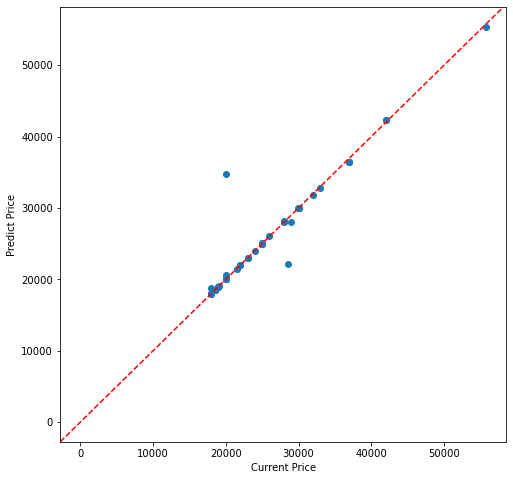

In [28]:
fig, ax = plt.subplots(figsize=(8,8))
ax.scatter(hy_test, hy_pred)
ax.axline(xy1=(0, 0), xy2=(55000, 55000), linestyle='--', color='red')
ax.set_xlabel('Current Price')
ax.set_ylabel('Predict Price')
plt.show()

# middle tier

In [91]:
middle_tier = df[(df['Mobile Price'] < 17999) & (df['Mobile Price'] >= 11985.2)]

middle_y = middle_tier["Mobile Price"]

middle_X = middle_tier.drop(['Mobile Price'], axis=1)
middle_X = scaler.fit_transform(middle_X)

mx_train, mx_test, my_train, my_test = train_test_split(middle_X,middle_y, test_size=1/3, random_state=1) 

print(mx_train.shape)
print(my_train.shape)

(121, 21)
(121,)


In [72]:
mlp_middle = MLPRegressor(max_iter=15000).fit(mx_train, my_train)

my_pred = mlp_middle.predict(mx_test)

print(r2_score(my_pred, my_test))
print(mean_squared_error(my_pred, my_test))
print(np.mean(np.abs((my_test - my_pred)/my_test)))

0.13606443830498938
6457449.596825797
0.11667981077535862


/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(


In [49]:
parameter_space = {
    'activation': ['identity', 'logistic', 'tanh', 'relu'],
    'solver': ['sgd', 'adam', 'lbfgs']
}

grid = GridSearchCV(mlp_middle, parameter_space, n_jobs=-1, cv=3)
grid_result = grid.fit(mx_train, my_train)
print(grid_result.best_params_)

/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_base.py:170: RuntimeWarning: overflow encountered in square
  return ((y_true - y_pred) ** 2).mean() / 2
/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_base.py:170: RuntimeWarning: overflow encountered in square
  return ((y_true - y_pred) ** 2).mean() / 2
/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_base.py:170: RuntimeWarning: overflow encountered in square
  return ((y_true - y_pred) ** 2).mean() / 2
/Applications/anaconda3/lib/python3.9/site-packages/sklearn/utils/extmath.py:152: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/Applications/anaconda3/lib/python3.9/site-packages/sklearn/utils/extmath.py:152: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/Applications/anaconda3/lib/python3.9/site-packages/sklearn/utils/extmath.py:152: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/Applications/anaconda3/lib/

/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Applications/anaconda3/lib/

/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Applications/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Applications/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Applications/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_scorer.py", line 397, in _passthrough_scorer
    return estimator.score(*args, **kwargs)
  File "/Applications/anaconda3/lib/python3.9/site-packages/sklearn/base.py", line 554, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Applica

{'activation': 'identity', 'solver': 'lbfgs'}


/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Applications/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_search.py:922: UserWarning: One or more of the test scores are non-finite: [            nan  2.08247490e-01  2.09981464e-01  1.67413080e-02
 -5.52146537e+01 -1.23361926e-02 -2.97374495e+00 -5.53303044e+01
 -7.61674680e-01             nan -4.93928946e-01 -6.06902123e+00]
  warnings.warn(


In [50]:
parameter_space = {
  'hidden_layer_sizes': [(6, 2), (2, 6), (3, 6)]
}

grid = GridSearchCV(mlp_middle, parameter_space, n_jobs=-1, cv=3)
grid_result = grid.fit(mx_train, my_train)
print(grid_result.best_params_)

/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Applications/anaconda3/lib/

{'hidden_layer_sizes': (3, 6)}


/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(


In [51]:
parameter_space = {
    'warm_start': [False,True],
    'verbose': [False,True]
}

grid = GridSearchCV(mlp_middle, parameter_space, n_jobs=-1, cv=3)
grid_result = grid.fit(mx_train, my_train)
print(grid_result.best_params_)

/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 115852165.46681771
Iteration 2, loss = 115851197.07540366
Iteration 3, loss = 115850229.65812597
Iteration 4, loss = 115849261.97032066
Iteration 5, loss = 115848294.03354993
Iteration 6, loss = 115847327.70399299
Iteration 7, loss = 115846362.49725826
Iteration 8, loss = 115845397.88759628
Iteration 9, loss = 115844433.66151290
Iteration 10, loss = 115843467.14288835
Iteration 11, loss = 115842496.28960915
Iteration 12, loss = 115841522.86588164
Iteration 13, loss = 115840545.96062848
Iteration 14, loss = 115839564.74957216
Iteration 15, loss = 115838578.03139177
Iteration 16, loss = 115837586.41024253
Iteration 17, loss = 115836591.26994653
Iteration 18, loss = 115835592.83454058
Iteration 19, loss = 115834587.95596230
Iteration 20, loss = 115833577.55088893
Iteration 21, loss = 115832560.03949293
Iteration 22, loss = 115831535.49109438
Iteration 23, loss = 115830504.27745147
Iteration 24, loss = 115829466.00021765
Iteration 25, loss = 115828421.50603528
Iteration

Iteration 320, loss = 114419365.15807867
Iteration 321, loss = 114409963.30105841
Iteration 322, loss = 114400530.45653935
Iteration 323, loss = 114391066.88792631
Iteration 324, loss = 114381572.64852659
Iteration 325, loss = 114372047.64841147
Iteration 326, loss = 114362491.76185623
Iteration 327, loss = 114352905.14637724
Iteration 328, loss = 114343286.83010033
Iteration 329, loss = 114333637.86071892
Iteration 330, loss = 114323958.16842303
Iteration 331, loss = 114314246.36120844
Iteration 332, loss = 114304503.39542186
Iteration 333, loss = 114294728.78510948
Iteration 334, loss = 114284923.19358806
Iteration 335, loss = 114275086.70750269
Iteration 336, loss = 114265219.12864931
Iteration 337, loss = 114255320.76337788
Iteration 338, loss = 114245391.62831512
Iteration 339, loss = 114235431.75428644
Iteration 340, loss = 114225440.87238571
Iteration 341, loss = 114215418.99119326
Iteration 342, loss = 114205366.30155258
Iteration 343, loss = 114195282.38287739
Iteration 344, l

Iteration 857, loss = 105215923.82434581
Iteration 858, loss = 105192371.50888117
Iteration 859, loss = 105168798.09981173
Iteration 860, loss = 105145203.56769256
Iteration 861, loss = 105121587.56304222
Iteration 862, loss = 105097950.29192002
Iteration 863, loss = 105074290.67901252
Iteration 864, loss = 105050609.75210871
Iteration 865, loss = 105026907.54174618
Iteration 866, loss = 105003184.06695835
Iteration 867, loss = 104979438.30518036
Iteration 868, loss = 104955671.18726231
Iteration 869, loss = 104931881.89374118
Iteration 870, loss = 104908071.04633759
Iteration 871, loss = 104884238.59247534
Iteration 872, loss = 104860384.39230232
Iteration 873, loss = 104836508.00208738
Iteration 874, loss = 104812609.75057806
Iteration 875, loss = 104788690.07538520
Iteration 876, loss = 104764748.62558581
Iteration 877, loss = 104740785.49855740
Iteration 878, loss = 104716799.98252632
Iteration 879, loss = 104692792.51977764
Iteration 880, loss = 104668762.69841294
Iteration 881, l

Iteration 1148, loss = 97614086.23646832
Iteration 1149, loss = 97585872.38226011
Iteration 1150, loss = 97557646.74386293
Iteration 1151, loss = 97529409.06413534
Iteration 1152, loss = 97501159.72555254
Iteration 1153, loss = 97472898.76456940
Iteration 1154, loss = 97444626.21628331
Iteration 1155, loss = 97416342.11457351
Iteration 1156, loss = 97388046.49222594
Iteration 1157, loss = 97359739.38104522
Iteration 1158, loss = 97331420.81195511
Iteration 1159, loss = 97303090.81508842
Iteration 1160, loss = 97274749.41986787
Iteration 1161, loss = 97246396.65507843
Iteration 1162, loss = 97218032.54893212
Iteration 1163, loss = 97189657.12912637
Iteration 1164, loss = 97161270.42289606
Iteration 1165, loss = 97132872.45706044
Iteration 1166, loss = 97104463.25806504
Iteration 1167, loss = 97076042.85201919
Iteration 1168, loss = 97047611.26472996
Iteration 1169, loss = 97019168.52173224
Iteration 1170, loss = 96990714.64831600
Iteration 1171, loss = 96962249.66955049
Iteration 1172, 

Iteration 18, loss = 113452681.62852056
Iteration 19, loss = 113451714.07087071
Iteration 20, loss = 113450739.54234883
Iteration 21, loss = 113449755.33317766
Iteration 22, loss = 113448763.65086296
Iteration 23, loss = 113447765.65204965
Iteration 24, loss = 113446759.71002054
Iteration 25, loss = 113445747.56578705
Iteration 26, loss = 113444728.62254208
Iteration 27, loss = 113443701.33163087
Iteration 28, loss = 113442665.99123171
Iteration 29, loss = 113441620.01236929
Iteration 30, loss = 113440563.21702915
Iteration 31, loss = 113439494.76283626
Iteration 32, loss = 113438414.67413826
Iteration 33, loss = 113437323.47661729
Iteration 34, loss = 113436221.36735032
Iteration 35, loss = 113435106.57811266
Iteration 36, loss = 113433980.87865025
Iteration 37, loss = 113432843.53245464
Iteration 38, loss = 113431693.79602911
Iteration 39, loss = 113430529.65015431
Iteration 40, loss = 113429351.54093364
Iteration 41, loss = 113428160.72735627
Iteration 42, loss = 113426959.28204829


Iteration 1070, loss = 96570146.60735138
Iteration 1071, loss = 96541641.46041262
Iteration 1072, loss = 96513122.71878029
Iteration 1073, loss = 96484590.43148115
Iteration 1074, loss = 96456044.64490840
Iteration 1075, loss = 96427485.37695211
Iteration 1076, loss = 96398912.60600291
Iteration 1077, loss = 96370326.41279426
Iteration 1078, loss = 96341726.84525909
Iteration 1079, loss = 96313113.94347951
Iteration 1080, loss = 96284487.74796292
Iteration 1081, loss = 96255848.29630311
Iteration 1082, loss = 96227195.62567595
Iteration 1083, loss = 96198528.91950065
Iteration 1084, loss = 96169848.92781259
Iteration 1085, loss = 96141155.71424067
Iteration 1086, loss = 96112449.32535115
Iteration 1087, loss = 96083729.80238533
Iteration 1088, loss = 96054997.18619677
Iteration 1089, loss = 96026251.51622832
Iteration 1090, loss = 95997492.82908532
Iteration 1091, loss = 95968721.16218242
Iteration 1092, loss = 95939936.55016924
Iteration 1093, loss = 95911139.02495831
Iteration 1094, 

Iteration 1752, loss = 79250939.18709064
Iteration 1753, loss = 79219592.47775313
Iteration 1754, loss = 79188246.55077088
Iteration 1755, loss = 79156901.42250642
Iteration 1756, loss = 79125557.10931058
Iteration 1757, loss = 79094213.62752345
Iteration 1758, loss = 79062870.99347502
Iteration 1759, loss = 79031529.22348586
Iteration 1760, loss = 79000188.33386767
Iteration 1761, loss = 78968848.34092376
Iteration 1762, loss = 78937509.26094949
Iteration 1763, loss = 78906171.11023255
Iteration 1764, loss = 78874833.90505317
Iteration 1765, loss = 78843497.66168454
Iteration 1766, loss = 78812162.39639285
Iteration 1767, loss = 78780828.12543745
Iteration 1768, loss = 78749494.86507100
Iteration 1769, loss = 78718162.63153945
Iteration 1770, loss = 78686831.44108227
Iteration 1771, loss = 78655501.30993235
Iteration 1772, loss = 78624172.25431597
Iteration 1773, loss = 78592844.29045296
Iteration 1774, loss = 78561517.43455645
Iteration 1775, loss = 78530191.70283310
Iteration 1776, 

Iteration 2701, loss = 51749754.47801903
Iteration 2702, loss = 51724762.31486057
Iteration 2703, loss = 51699780.82578626
Iteration 2704, loss = 51674808.79959993
Iteration 2705, loss = 51649846.50282101
Iteration 2706, loss = 51624893.90425771
Iteration 2707, loss = 51599950.66934654
Iteration 2708, loss = 51575017.50030539
Iteration 2709, loss = 51550094.53973635
Iteration 2710, loss = 51525180.52292541
Iteration 2711, loss = 51500275.99686886
Iteration 2712, loss = 51475381.30062776
Iteration 2713, loss = 51450496.61081076
Iteration 2714, loss = 51425622.08470327
Iteration 2715, loss = 51400757.86247304
Iteration 2716, loss = 51375904.06911581
Iteration 2717, loss = 51351060.81617264
Iteration 2718, loss = 51326228.20324752
Iteration 2719, loss = 51301406.31934894
Iteration 2720, loss = 51276595.24407707
Iteration 2721, loss = 51251795.04867487
Iteration 2722, loss = 51227005.79695919
Iteration 2723, loss = 51202227.54614613
Iteration 2724, loss = 51177459.94216169
Iteration 2725, 

Iteration 1598, loss = 80226809.62083355
Iteration 1599, loss = 80194444.56762843
Iteration 1600, loss = 80162077.89364848
Iteration 1601, loss = 80129709.62067033
Iteration 1602, loss = 80097339.77011943
Iteration 1603, loss = 80064968.36310494
Iteration 1604, loss = 80032595.42045133
Iteration 1605, loss = 80000220.96272670
Iteration 1606, loss = 79967845.01026800
Iteration 1607, loss = 79935467.58320394
Iteration 1608, loss = 79903088.70147531
Iteration 1609, loss = 79870708.38485342
Iteration 1610, loss = 79838326.65295656
Iteration 1611, loss = 79805943.52526473
Iteration 1612, loss = 79773559.02113287
Iteration 1613, loss = 79741173.15980294
Iteration 1614, loss = 79708785.96041441
Iteration 1615, loss = 79676397.44201404
Iteration 1616, loss = 79644007.62356432
Iteration 1617, loss = 79611616.52395135
Iteration 1618, loss = 79579224.16199172
Iteration 1619, loss = 79546830.55643873
Iteration 1620, loss = 79514435.72598808
Iteration 1621, loss = 79482039.68928279
Iteration 1622, 

Iteration 2768, loss = 45457689.06418893
Iteration 2769, loss = 45433480.64966778
Iteration 2770, loss = 45409284.43398044
Iteration 2771, loss = 45385100.83607318
Iteration 2772, loss = 45360929.92129757
Iteration 2773, loss = 45336771.70385267
Iteration 2774, loss = 45312626.19691452
Iteration 2775, loss = 45288493.41273806
Iteration 2776, loss = 45264373.36274885
Iteration 2777, loss = 45240266.05762544
Iteration 2778, loss = 45216171.50737348
Iteration 2779, loss = 45192089.72139215
Iteration 2780, loss = 45168020.70853408
Iteration 2781, loss = 45143964.47715907
Iteration 2782, loss = 45119921.03518244
Iteration 2783, loss = 45095889.32712927
Iteration 2784, loss = 45071869.43416186
Iteration 2785, loss = 45047861.83723046
Iteration 2786, loss = 45023866.59566199
Iteration 2787, loss = 44999883.76315086
Iteration 2788, loss = 44975913.38832916
Iteration 2789, loss = 44951955.51527904
Iteration 2790, loss = 44928010.18399299
Iteration 2791, loss = 44904077.43078744
Iteration 2792, 

Iteration 3302, loss = 38790665.77398952
Iteration 3303, loss = 38772722.24434032
Iteration 3304, loss = 38754791.02087822
Iteration 3305, loss = 38736872.10216673
Iteration 3306, loss = 38718965.48675698
Iteration 3307, loss = 38701071.17318793
Iteration 3308, loss = 38683187.76275866
Iteration 3309, loss = 38665315.95814738
Iteration 3310, loss = 38647456.18988002
Iteration 3311, loss = 38629608.48462497
Iteration 3312, loss = 38611772.86616953
Iteration 3313, loss = 38593949.35571184
Iteration 3314, loss = 38576137.97212316
Iteration 3315, loss = 38558338.73218340
Iteration 3316, loss = 38540551.65079282
Iteration 3317, loss = 38522776.74116211
Iteration 3318, loss = 38505014.01498316
Iteration 3319, loss = 38487263.48258250
Iteration 3320, loss = 38469525.15305918
Iteration 3321, loss = 38451799.03440849
Iteration 3322, loss = 38434085.13363329
Iteration 3323, loss = 38416383.45684394
Iteration 3324, loss = 38398694.00934806
Iteration 3325, loss = 38381016.79573114
Iteration 3326, 

Iteration 3570, loss = 34411438.19647124
Iteration 3571, loss = 34396659.02139448
Iteration 3572, loss = 34381891.40315946
Iteration 3573, loss = 34367135.34982824
Iteration 3574, loss = 34352390.86820803
Iteration 3575, loss = 34337657.96397793
Iteration 3576, loss = 34322936.64180286
Iteration 3577, loss = 34308226.90543580
Iteration 3578, loss = 34293528.75780977
Iteration 3579, loss = 34278842.20112041
Iteration 3580, loss = 34264167.23690016
Iteration 3581, loss = 34249503.86608498
Iteration 3582, loss = 34234852.08907422
Iteration 3583, loss = 34220211.90578449
Iteration 3584, loss = 34205583.31569795
Iteration 3585, loss = 34190966.31790584
Iteration 3586, loss = 34176360.91114747
Iteration 3587, loss = 34161767.09384532
Iteration 3588, loss = 34147184.86413657
Iteration 3589, loss = 34132614.21990138
Iteration 3590, loss = 34118053.66885176
Iteration 3591, loss = 34103502.21930173
Iteration 3592, loss = 34088961.88864323
Iteration 3593, loss = 34074432.72213629
Iteration 3594, 

Iteration 4180, loss = 27310751.54294566
Iteration 4181, loss = 27301844.12482535
Iteration 4182, loss = 27292944.92215281
Iteration 4183, loss = 27284053.94152445
Iteration 4184, loss = 27275171.18807613
Iteration 4185, loss = 27266296.66563068
Iteration 4186, loss = 27257430.37683060
Iteration 4187, loss = 27248572.32325744
Iteration 4188, loss = 27239722.50553901
Iteration 4189, loss = 27230880.92344594
Iteration 4190, loss = 27222047.57597839
Iteration 4191, loss = 27213222.46144408
Iteration 4192, loss = 27204402.81095503
Iteration 4193, loss = 27195590.49137152
Iteration 4194, loss = 27186786.01934237
Iteration 4195, loss = 27177986.51946320
Iteration 4196, loss = 27169194.15973025
Iteration 4197, loss = 27160409.36385477
Iteration 4198, loss = 27151632.19615281
Iteration 4199, loss = 27142862.71366113
Iteration 4200, loss = 27134100.96687066
Iteration 4201, loss = 27125347.00038605
Iteration 4202, loss = 27116600.85351891
Iteration 4203, loss = 27107862.56082121
Iteration 4204, 

Iteration 3201, loss = 36195298.08992792
Iteration 3202, loss = 36176767.77241035
Iteration 3203, loss = 36158249.64163586
Iteration 3204, loss = 36139744.29195036
Iteration 3205, loss = 36121251.76083487
Iteration 3206, loss = 36102772.08173754
Iteration 3207, loss = 36084305.28447974
Iteration 3208, loss = 36065851.39562111
Iteration 3209, loss = 36047410.43878774
Iteration 3210, loss = 36028982.43496723
Iteration 3211, loss = 36010567.40277384
Iteration 3212, loss = 35992165.35868701
Iteration 3213, loss = 35973776.31726569
Iteration 3214, loss = 35955400.29134102
Iteration 3215, loss = 35937037.29218955
Iteration 3216, loss = 35918687.32968906
Iteration 3217, loss = 35900350.41245846
Iteration 3218, loss = 35882026.54798373
Iteration 3219, loss = 35863715.74273106
Iteration 3220, loss = 35845418.00224850
Iteration 3221, loss = 35827133.33125751
Iteration 3222, loss = 35808861.73373509
Iteration 3223, loss = 35790603.21298777
Iteration 3224, loss = 35772357.77171794
Iteration 3225, 

Iteration 3884, loss = 26322061.01181870
Iteration 3885, loss = 26311217.35783229
Iteration 3886, loss = 26300383.34843500
Iteration 3887, loss = 26289558.97616551
Iteration 3888, loss = 26278744.23353718
Iteration 3889, loss = 26267939.11304107
Iteration 3890, loss = 26257143.60714858
Iteration 3891, loss = 26246357.70831392
Iteration 3892, loss = 26235581.40897627
Iteration 3893, loss = 26224814.70156167
Iteration 3894, loss = 26214057.57848480
Iteration 3895, loss = 26203310.03215047
Iteration 3896, loss = 26192572.05495503
Iteration 3897, loss = 26181841.39759542
Iteration 3898, loss = 26171119.78222612
Iteration 3899, loss = 26160407.36706413
Iteration 3900, loss = 26149704.18013794
Iteration 3901, loss = 26139010.24587210
Iteration 3902, loss = 26128325.58545118
Iteration 3903, loss = 26117650.21714695
Iteration 3904, loss = 26106984.15661259
Iteration 3905, loss = 26096327.41714717
Iteration 3906, loss = 26085680.00993346
Iteration 3907, loss = 26075041.94425173
Iteration 3908, 

Iteration 4615, loss = 20447496.47647676
Iteration 4616, loss = 20441631.75894359
Iteration 4617, loss = 20435771.38195387
Iteration 4618, loss = 20429915.34102011
Iteration 4619, loss = 20424063.63146487
Iteration 4620, loss = 20418216.24844026
Iteration 4621, loss = 20412373.18694568
Iteration 4622, loss = 20406534.44184353
Iteration 4623, loss = 20400700.00787353
Iteration 4624, loss = 20394869.87966554
Iteration 4625, loss = 20389044.05175108
Iteration 4626, loss = 20383222.51857373
Iteration 4627, loss = 20377405.27449845
Iteration 4628, loss = 20371592.31381998
Iteration 4629, loss = 20365783.63077043
Iteration 4630, loss = 20359979.21952605
Iteration 4631, loss = 20354179.07421340
Iteration 4632, loss = 20348383.18891480
Iteration 4633, loss = 20342591.55767331
Iteration 4634, loss = 20336804.17449721
Iteration 4635, loss = 20331021.03336397
Iteration 4636, loss = 20325242.12822390
Iteration 4637, loss = 20319467.45300341
Iteration 4638, loss = 20313697.00160787
Iteration 4639, 

Iteration 5149, loss = 21477430.08305527
Iteration 5150, loss = 21473268.32877391
Iteration 5151, loss = 21469108.61140116
Iteration 5152, loss = 21464950.94706092
Iteration 5153, loss = 21460795.34981341
Iteration 5154, loss = 21456641.83186305
Iteration 5155, loss = 21452490.40374535
Iteration 5156, loss = 21448341.07449509
Iteration 5157, loss = 21444193.85179757
Iteration 5158, loss = 21440048.74212473
Iteration 5159, loss = 21435905.75085754
Iteration 5160, loss = 21431764.88239613
Iteration 5161, loss = 21427626.14025887
Iteration 5162, loss = 21423489.52717149
Iteration 5163, loss = 21419355.04514720
Iteration 5164, loss = 21415222.69555889
Iteration 5165, loss = 21411092.47920394
Iteration 5166, loss = 21406964.39636258
Iteration 5167, loss = 21402838.44685045
Iteration 5168, loss = 21398714.63006574
Iteration 5169, loss = 21394592.94503175
Iteration 5170, loss = 21390473.39043506
Iteration 5171, loss = 21386355.96465993
Iteration 5172, loss = 21382240.66581922
Iteration 5173, 

Iteration 5832, loss = 18934742.68946202
Iteration 5833, loss = 18931269.99574244
Iteration 5834, loss = 18927797.59388511
Iteration 5835, loss = 18924325.50499739
Iteration 5836, loss = 18920853.74794441
Iteration 5837, loss = 18917382.09714740
Iteration 5838, loss = 18913908.71020917
Iteration 5839, loss = 18910435.41359493
Iteration 5840, loss = 18906962.24841221
Iteration 5841, loss = 18903489.25153016
Iteration 5842, loss = 18900016.45600307
Iteration 5843, loss = 18896543.89145165
Iteration 5844, loss = 18893071.58440624
Iteration 5845, loss = 18889599.55861573
Iteration 5846, loss = 18886127.83532560
Iteration 5847, loss = 18882656.43352839
Iteration 5848, loss = 18879184.28887649
Iteration 5849, loss = 18875711.25009575
Iteration 5850, loss = 18872238.29473526
Iteration 5851, loss = 18868765.46368424
Iteration 5852, loss = 18865291.74767400
Iteration 5853, loss = 18861816.44180211
Iteration 5854, loss = 18858340.97489584
Iteration 5855, loss = 18854865.41310668
Iteration 5856, 

Iteration 6368, loss = 17087889.85755051
Iteration 6369, loss = 17084447.34043557
Iteration 6370, loss = 17081004.81264485
Iteration 4782, loss = 19524072.32735777
Iteration 4783, loss = 19518854.06487835
Iteration 4784, loss = 19513639.16844468
Iteration 4785, loss = 19508427.63500407
Iteration 4786, loss = 19503219.47240929
Iteration 4787, loss = 19498014.63465184
Iteration 4788, loss = 19492813.15552551
Iteration 4789, loss = 19487615.01463263
Iteration 4790, loss = 19482420.21403231
Iteration 4791, loss = 19477228.73947855
Iteration 4792, loss = 19472040.57856438
Iteration 4793, loss = 19466855.75204739
Iteration 4794, loss = 19461674.21249269
Iteration 4795, loss = 19456496.02161397
Iteration 4796, loss = 19451321.12233773
Iteration 4797, loss = 19446149.50797283
Iteration 4798, loss = 19440981.17406794
Iteration 4799, loss = 19435816.11607617
Iteration 4800, loss = 19430654.33055921
Iteration 4801, loss = 19425495.84463678
Iteration 4802, loss = 19420340.64499145
Iteration 4803, 

Iteration 5023, loss = 18350820.47221242
Iteration 5024, loss = 18346245.65466931
Iteration 5025, loss = 18341673.04082187
Iteration 5026, loss = 18337102.62493399
Iteration 5027, loss = 18332534.37680789
Iteration 5028, loss = 18327968.29008103
Iteration 5029, loss = 18323404.36645572
Iteration 5030, loss = 18318842.71290911
Iteration 5031, loss = 18314283.17987978
Iteration 5032, loss = 18309725.77082235
Iteration 5033, loss = 18305170.57123278
Iteration 5034, loss = 18300617.57895509
Iteration 5035, loss = 18296066.73769639
Iteration 5036, loss = 18291518.04736015
Iteration 5037, loss = 18286971.50745537
Iteration 5038, loss = 18282427.11713687
Iteration 5039, loss = 18277885.00545679
Iteration 5040, loss = 18273344.99479052
Iteration 5041, loss = 18268807.08285479
Iteration 5042, loss = 18264271.27174280
Iteration 5043, loss = 18259737.75525841
Iteration 5044, loss = 18255206.36227720
Iteration 5045, loss = 18250677.09084205
Iteration 5046, loss = 18246149.93980682
Iteration 5047, 

Iteration 5804, loss = 15178890.20136931
Iteration 5805, loss = 15175140.45178243
Iteration 5806, loss = 15171388.94851004
Iteration 5807, loss = 15167637.53556034
Iteration 5808, loss = 15163886.46824471
Iteration 5809, loss = 15160135.77809887
Iteration 5810, loss = 15156385.49342577
Iteration 5811, loss = 15152635.63961896
Iteration 5812, loss = 15148886.23945380
Iteration 5813, loss = 15145137.31334939
Iteration 5814, loss = 15141388.87960443
Iteration 5815, loss = 15137640.95460939
Iteration 5816, loss = 15133893.55303760
Iteration 5817, loss = 15130146.68801711
Iteration 5818, loss = 15126400.37128544
Iteration 5819, loss = 15122654.61332883
Iteration 5820, loss = 15118909.42350755
Iteration 5821, loss = 15115164.81016873
Iteration 5822, loss = 15111420.78074787
Iteration 5823, loss = 15107677.34186019
Iteration 5824, loss = 15103934.49938289
Iteration 5825, loss = 15100192.25852914
Iteration 5826, loss = 15096450.62391470
Iteration 5827, loss = 15092709.59961786
Iteration 5828, 

Iteration 6145, loss = 13925453.58898714
Iteration 6146, loss = 13921846.21536226
Iteration 6147, loss = 13918239.40927584
Iteration 6148, loss = 13914633.17020439
Iteration 6149, loss = 13911027.49762241
Iteration 6150, loss = 13907422.39100288
Iteration 6151, loss = 13903817.84981779
Iteration 6152, loss = 13900213.87353847
Iteration 6153, loss = 13896610.46163603
Iteration 6154, loss = 13893007.61358164
Iteration 6155, loss = 13889405.32884685
Iteration 6156, loss = 13885803.60690387
Iteration 6157, loss = 13882202.44722573
Iteration 6158, loss = 13878601.84928657
Iteration 6159, loss = 13875001.81256178
Iteration 6160, loss = 13871402.33652816
Iteration 6161, loss = 13867803.42066408
Iteration 6162, loss = 13864205.06444960
Iteration 6163, loss = 13860607.26736656
Iteration 6164, loss = 13857010.02889871
Iteration 6165, loss = 13853413.34853180
Iteration 6166, loss = 13849817.22575360
Iteration 6167, loss = 13846221.66005401
Iteration 6168, loss = 13842626.65092514
Iteration 6169, 

Iteration 7167, loss = 14199379.79011022
Iteration 7168, loss = 14195686.15297456
Iteration 7169, loss = 14191992.90241813
Iteration 7170, loss = 14188300.06983193
Iteration 7171, loss = 14184607.68338658
Iteration 7172, loss = 14180915.76835531
Iteration 7173, loss = 14177224.34740448
Iteration 7174, loss = 14173533.44085506
Iteration 7175, loss = 14169843.06691790
Iteration 7176, loss = 14166153.24190542
Iteration 7177, loss = 14162463.98042205
Iteration 7178, loss = 14158775.29553568
Iteration 7179, loss = 14155087.19893179
Iteration 7180, loss = 14151399.70105227
Iteration 7181, loss = 14147712.81122022
Iteration 7182, loss = 14144026.53775236
Iteration 7183, loss = 14140341.68776368
Iteration 7184, loss = 14136657.55102182
Iteration 7185, loss = 14132974.11840595
Iteration 7186, loss = 14129291.38841930
Iteration 7187, loss = 14125609.35964398
Iteration 7188, loss = 14121928.03073323
Iteration 7189, loss = 14118247.40040465
Iteration 7190, loss = 14114567.46743381
Iteration 7191, 

Iteration 7581, loss = 12717602.72005749
Iteration 7582, loss = 12714130.15352515
Iteration 7583, loss = 12710658.13860036
Iteration 7584, loss = 12707186.67546606
Iteration 7585, loss = 12703715.76424551
Iteration 7586, loss = 12700245.40500835
Iteration 7587, loss = 12696775.59777602
Iteration 7588, loss = 12693306.34252673
Iteration 7589, loss = 12689837.63919982
Iteration 7590, loss = 12686369.48769977
Iteration 7591, loss = 12682901.88789975
Iteration 7592, loss = 12679434.83964488
Iteration 7593, loss = 12675968.34275510
Iteration 7594, loss = 12672502.39702773
Iteration 7595, loss = 12669037.00223991
Iteration 7596, loss = 12665572.15815061
Iteration 7597, loss = 12662107.86450262
Iteration 7598, loss = 12658644.12102418
Iteration 7599, loss = 12655180.92743054
Iteration 7600, loss = 12651718.28342535
Iteration 7601, loss = 12648256.18870192
Iteration 7602, loss = 12644794.64294429
Iteration 7603, loss = 12641333.64582828
Iteration 7604, loss = 12637873.19702236
Iteration 7605, 

Iteration 6382, loss = 13085226.40018840
Iteration 6383, loss = 13081736.15182877
Iteration 6384, loss = 13078246.34272787
Iteration 6385, loss = 13074756.97905044
Iteration 6386, loss = 13071268.06632634
Iteration 6387, loss = 13067779.60951401
Iteration 6388, loss = 13064291.61305779
Iteration 6389, loss = 13060804.08093937
Iteration 6390, loss = 13057317.01672417
Iteration 6391, loss = 13053830.42360302
Iteration 6392, loss = 13050344.30442971
Iteration 6393, loss = 13046858.66175483
Iteration 6394, loss = 13043373.49785609
Iteration 6395, loss = 13039888.81476580
Iteration 6396, loss = 13036404.61429540
Iteration 6397, loss = 13032920.89805768
Iteration 6398, loss = 13029437.66748674
Iteration 6399, loss = 13025954.92385593
Iteration 6400, loss = 13022472.66829403
Iteration 6401, loss = 13018990.90179974
Iteration 6402, loss = 13015509.62525486
Iteration 6403, loss = 13012028.83943600
Iteration 6404, loss = 13008548.54502521
Iteration 6405, loss = 13005068.74261954
Iteration 6406, 

/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(


eration 6700, loss = 11989513.17706951
Iteration 6701, loss = 11986124.75780897
Iteration 6702, loss = 11982736.92107934
Iteration 6703, loss = 11979349.66657952
Iteration 6704, loss = 11975962.99400533
Iteration 6705, loss = 11972576.90305027
Iteration 6706, loss = 11969191.39340611
Iteration 6707, loss = 11965806.46476353
Iteration 6708, loss = 11962422.11681259
Iteration 6709, loss = 11959038.34924322
Iteration 6710, loss = 11955655.16174561
Iteration 6711, loss = 11952272.55401057
Iteration 6712, loss = 11948890.52572983
Iteration 6713, loss = 11945509.07659636
Iteration 6714, loss = 11942128.20630456
Iteration 6715, loss = 11938747.91455051
Iteration 6716, loss = 11935368.20103218
Iteration 6717, loss = 11931989.06544953
Iteration 6718, loss = 11928610.50750470
Iteration 6719, loss = 11925232.52690213
Iteration 6720, loss = 11921855.12334865
Iteration 6721, loss = 11918478.29655357
Iteration 6722, loss = 11915102.04622878
Iteration 6723, loss = 11911726.37208879
Iteration 6724, lo

/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(


tion 7017, loss = 10942321.88888168
Iteration 7018, loss = 10939107.47388625
Iteration 7019, loss = 10935893.40842528
Iteration 7020, loss = 10932679.87904851
Iteration 7021, loss = 10929466.89129477
Iteration 7022, loss = 10926254.45015130
Iteration 7023, loss = 10923042.56010902
Iteration 7024, loss = 10919831.22521214
Iteration 7025, loss = 10916620.44910287
Iteration 7026, loss = 10913410.23506164
Iteration 7027, loss = 10910200.58604335
Iteration 7028, loss = 10906991.50470991
Iteration 7029, loss = 10903783.79174021
Iteration 7030, loss = 10900576.69907525
Iteration 7031, loss = 10897370.09830519
Iteration 7032, loss = 10894163.99973138
Iteration 7033, loss = 10890958.41263006
Iteration 7034, loss = 10887753.34535449
Iteration 7035, loss = 10884548.80542706
Iteration 7036, loss = 10881344.79962212
Iteration 7037, loss = 10878141.33404067
Iteration 7038, loss = 10874938.41417758
Iteration 7039, loss = 10871736.04498214
Iteration 7040, loss = 10868534.23091257
Iteration 7041, loss 

Iteration 7409, loss = 9727756.94528925
Iteration 7410, loss = 9724778.22353627
Iteration 7411, loss = 9721800.08877832
Iteration 7412, loss = 9718822.67716576
Iteration 7413, loss = 9715845.87082121
Iteration 7414, loss = 9712869.67275770
Iteration 7415, loss = 9709894.14507262
Iteration 7416, loss = 9706919.21238988
Iteration 7417, loss = 9703944.97569951
Iteration 7418, loss = 9700971.36551625
Iteration 7419, loss = 9697998.36134052
Iteration 7420, loss = 9695025.96618265
Iteration 7421, loss = 9692054.18276406
Iteration 7422, loss = 9689082.72528643
Iteration 7423, loss = 9686110.90416356
Iteration 7424, loss = 9683139.49617197
Iteration 7425, loss = 9680168.68614590
Iteration 7426, loss = 9677198.37047470
Iteration 7427, loss = 9674228.57630470
Iteration 7428, loss = 9671259.35513468
Iteration 7429, loss = 9668290.67279119
Iteration 7430, loss = 9665322.53518970
Iteration 7431, loss = 9662355.00760339
Iteration 7432, loss = 9659388.03669121
Iteration 7433, loss = 9656421.62482593


Iteration 7964, loss = 11412807.18866890
Iteration 7965, loss = 11409394.15471236
Iteration 7966, loss = 11405980.73378611
Iteration 7967, loss = 11402563.86597394
Iteration 7968, loss = 11399146.85430508
Iteration 7969, loss = 11395729.78072835
Iteration 7970, loss = 11392312.71889187
Iteration 7971, loss = 11388895.73497553
Iteration 7972, loss = 11385478.88844003
Iteration 7973, loss = 11382062.23270087
Iteration 7974, loss = 11378645.81573473
Iteration 7975, loss = 11375229.68062516
Iteration 7976, loss = 11371813.86605353
Iteration 7977, loss = 11368398.40674074
Iteration 7978, loss = 11364983.33384467
Iteration 7979, loss = 11361568.67531782
Iteration 7980, loss = 11358154.45622909
Iteration 7981, loss = 11354737.31358230
Iteration 7982, loss = 11351319.10042315
Iteration 7983, loss = 11347896.70251387
Iteration 7984, loss = 11344474.02795352
Iteration 7985, loss = 11341051.17436315
Iteration 7986, loss = 11337628.22948242
Iteration 7987, loss = 11334205.27216074
Iteration 7988, 

Iteration 8704, loss = 8872000.98945159
Iteration 8705, loss = 8868562.94371556
Iteration 8706, loss = 8865125.86592514
Iteration 8707, loss = 8861689.78660018
Iteration 8708, loss = 8858254.73300973
Iteration 8709, loss = 8854820.72949906
Iteration 8710, loss = 8851387.79778402
Iteration 8711, loss = 8847955.95721574
Iteration 8712, loss = 8844525.22501889
Iteration 8713, loss = 8841095.61650603
Iteration 8714, loss = 8837667.14527044
Iteration 8715, loss = 8834239.82335968
Iteration 8716, loss = 8830811.66296933
Iteration 8717, loss = 8827383.02616109
Iteration 8718, loss = 8823954.79549394
Iteration 8719, loss = 8820527.05954512
Iteration 8720, loss = 8817099.89782609
Iteration 8721, loss = 8813673.38169106
Iteration 8722, loss = 8810247.57515476
Iteration 8723, loss = 8806822.53562842
Iteration 8724, loss = 8803398.31458216
Iteration 8725, loss = 8799974.95814107
Iteration 8726, loss = 8796552.50762170
Iteration 8727, loss = 8793131.00001488
Iteration 8728, loss = 8789708.34163635


Iteration 9154, loss = 7389354.26283255
Iteration 9155, loss = 7386224.20393786
Iteration 9156, loss = 7383095.01368185
Iteration 9157, loss = 7379966.73791008
Iteration 9158, loss = 7376839.41769419
Iteration 9159, loss = 7373713.08981499
Iteration 9160, loss = 7370587.78719674
Iteration 9161, loss = 7367463.53929750
Iteration 9162, loss = 7364340.37246008
Iteration 9163, loss = 7361218.31022752
Iteration 9164, loss = 7358097.37362671
Iteration 9165, loss = 7354977.58142327
Iteration 9166, loss = 7351856.39927247
Iteration 9167, loss = 7348734.47133886
Iteration 9168, loss = 7345613.26861550
Iteration 9169, loss = 7342492.85080525
Iteration 9170, loss = 7339373.27148745
Iteration 9171, loss = 7336254.57873263
Iteration 9172, loss = 7333136.81565565
Iteration 9173, loss = 7330020.02091329
Iteration 9174, loss = 7326904.22915207
Iteration 9175, loss = 7323789.47141106
Iteration 9176, loss = 7320675.77548440
Iteration 9177, loss = 7317563.16624737
Iteration 9178, loss = 7314451.66594984


Iteration 9579, loss = 6091323.57583411
Iteration 9580, loss = 6088314.05747070
Iteration 9581, loss = 6085305.44450451
Iteration 9582, loss = 6082297.81649195
Iteration 9583, loss = 6079291.24474113
Iteration 9584, loss = 6076285.79314163
Iteration 7983, loss = 8118333.83790190
Iteration 7984, loss = 8115698.50726026
Iteration 7985, loss = 8113063.60410622
Iteration 7986, loss = 8110429.15564669
Iteration 7987, loss = 8107795.46956089
Iteration 7988, loss = 8105162.37172932
Iteration 7989, loss = 8102529.83461373
Iteration 7990, loss = 8099897.87784335
Iteration 7991, loss = 8097266.51907132
Iteration 7992, loss = 8094635.82379025
Iteration 7993, loss = 8092005.90171055
Iteration 7994, loss = 8089376.54015405
Iteration 7995, loss = 8086748.01459504
Iteration 7996, loss = 8084120.13891006
Iteration 7997, loss = 8081492.90639810
Iteration 7998, loss = 8078866.32831569
Iteration 7999, loss = 8076240.41478270
Iteration 8000, loss = 8073615.43247085
Iteration 8001, loss = 8070991.09426592


Iteration 9002, loss = 5718486.73762211
Iteration 9003, loss = 5716291.70650031
Iteration 9004, loss = 5714097.42187558
Iteration 9005, loss = 5711903.28440037
Iteration 9006, loss = 5709707.98600334
Iteration 9007, loss = 5707513.16279065
Iteration 9008, loss = 5705318.86324573
Iteration 9009, loss = 5703125.13082511
Iteration 9010, loss = 5700932.00446349
Iteration 9011, loss = 5698739.62230406
Iteration 9012, loss = 5696547.91688621
Iteration 9013, loss = 5694356.71369931
Iteration 9014, loss = 5692165.69698603
Iteration 9015, loss = 5689975.33855717
Iteration 9016, loss = 5687785.66761375
Iteration 9017, loss = 5685596.71026924
Iteration 9018, loss = 5683408.42242038
Iteration 9019, loss = 5681220.69040990
Iteration 9020, loss = 5679033.68370724
Iteration 9021, loss = 5676847.42475549
Iteration 9022, loss = 5674661.93359183
Iteration 9023, loss = 5672477.22808885
Iteration 9024, loss = 5670293.32417199
Iteration 9025, loss = 5668110.23601517
Iteration 9026, loss = 5665927.99576156


Iteration 922, loss = 95610444.11993943
Iteration 923, loss = 95584574.99967337
Iteration 924, loss = 95558688.58886038
Iteration 925, loss = 95532784.94843295
Iteration 926, loss = 95506864.13710621
Iteration 927, loss = 95480926.21159713
Iteration 928, loss = 95454971.22682033
Iteration 929, loss = 95428999.23606262
Iteration 930, loss = 95403010.29113884
Iteration 931, loss = 95377004.44253123
Iteration 932, loss = 95350981.73951386
Iteration 933, loss = 95324942.23026375
Iteration 934, loss = 95298885.96196049
Iteration 935, loss = 95272812.98087527
Iteration 936, loss = 95246723.33245051
Iteration 937, loss = 95220617.06137131
Iteration 938, loss = 95194493.96277684
Iteration 939, loss = 95168354.13481206
Iteration 940, loss = 95142197.75756299
Iteration 941, loss = 95116024.87945110
Iteration 942, loss = 95089835.27771559
Iteration 943, loss = 95063628.28519095
Iteration 944, loss = 95037404.79458728
Iteration 945, loss = 95011164.86640157
Iteration 946, loss = 94984908.55845007


Iteration 1217, loss = 87377898.78395045
Iteration 1218, loss = 87348384.23965275
Iteration 1219, loss = 87318861.55630256
Iteration 1220, loss = 87289330.75933088
Iteration 1221, loss = 87259791.87414879
Iteration 1222, loss = 87230244.92614722
Iteration 1223, loss = 87200689.94069716
Iteration 1224, loss = 87171126.94314960
Iteration 1225, loss = 87141555.95883541
Iteration 1226, loss = 87111977.01306553
Iteration 1227, loss = 87082390.13113083
Iteration 1228, loss = 87052795.33830220
Iteration 1229, loss = 87023192.65983047
Iteration 1230, loss = 86993582.12094645
Iteration 1231, loss = 86963963.74686094
Iteration 1232, loss = 86934337.56276469
Iteration 1233, loss = 86904703.59382845
Iteration 1234, loss = 86875061.86520289
Iteration 1235, loss = 86845412.40201868
Iteration 1236, loss = 86815755.22938646
Iteration 1237, loss = 86786090.37239675
Iteration 1238, loss = 86756417.85612012
Iteration 1239, loss = 86726737.70560703
Iteration 1240, loss = 86697049.94588785
Iteration 1241, 

Iteration 885, loss = 104074534.01999474
Iteration 886, loss = 104049094.02197592
Iteration 887, loss = 104023635.36145039
Iteration 888, loss = 103998158.08406727
Iteration 889, loss = 103972662.23365641
Iteration 890, loss = 103947147.85241632
Iteration 891, loss = 103921614.78092688
Iteration 892, loss = 103896063.10248820
Iteration 893, loss = 103870492.96186161
Iteration 894, loss = 103844904.40149640
Iteration 895, loss = 103819297.46235071
Iteration 896, loss = 103793672.18404473
Iteration 897, loss = 103768028.60499753
Iteration 898, loss = 103742366.76255001
Iteration 899, loss = 103716686.69307491
Iteration 900, loss = 103690988.01458329
Iteration 901, loss = 103665270.90149187
Iteration 902, loss = 103639535.16962743
Iteration 903, loss = 103613781.15450837
Iteration 904, loss = 103588008.91208406
Iteration 905, loss = 103562218.49519499
Iteration 906, loss = 103536409.95391740
Iteration 907, loss = 103510583.33586876
Iteration 908, loss = 103484737.93361482
Iteration 909, l

Iteration 1421, loss = 88440834.35198484
Iteration 1422, loss = 88409150.57961388
Iteration 1423, loss = 88377461.79558755
Iteration 1424, loss = 88345768.02171382
Iteration 1425, loss = 88314069.27979399
Iteration 1426, loss = 88282365.59162262
Iteration 1427, loss = 88250656.97898732
Iteration 1428, loss = 88218943.46366881
Iteration 1429, loss = 88187225.06744072
Iteration 1430, loss = 88155501.81206949
Iteration 1431, loss = 88123773.71931441
Iteration 1432, loss = 88092040.81092741
Iteration 1433, loss = 88060303.10865299
Iteration 1434, loss = 88028560.63422821
Iteration 1435, loss = 87996813.40938255
Iteration 1436, loss = 87965061.45583777
Iteration 1437, loss = 87933304.79530798
Iteration 1438, loss = 87901543.44949947
Iteration 1439, loss = 87869777.44011062
Iteration 1440, loss = 87838006.78883187
Iteration 1441, loss = 87806231.51734561
Iteration 1442, loss = 87774451.64732610
Iteration 1443, loss = 87742667.20043948
Iteration 1444, loss = 87710878.19834360
Iteration 1445, 

Iteration 11031, loss = 2896455.64296094
Iteration 11032, loss = 2895114.23832194
Iteration 11033, loss = 2893773.80229653
Iteration 11034, loss = 2892434.33724762
Iteration 11035, loss = 2891095.84518554
Iteration 11036, loss = 2889758.34019500
Iteration 11037, loss = 2888421.81260497
Iteration 11038, loss = 2887086.26125814
Iteration 11039, loss = 2885751.68715723
Iteration 11040, loss = 2884418.09109016
Iteration 11041, loss = 2883085.47390267
Iteration 11042, loss = 2881753.84611160
Iteration 11043, loss = 2880423.19621682
Iteration 11044, loss = 2879093.52542108
Iteration 11045, loss = 2877764.29414791
Iteration 11046, loss = 2876437.04679655
Iteration 11047, loss = 2875111.72006247
Iteration 11048, loss = 2873787.23529471
Iteration 11049, loss = 2872463.60486674
Iteration 11050, loss = 2871140.83889400
Iteration 11051, loss = 2869818.95775441
Iteration 11052, loss = 2868497.96129950
Iteration 11053, loss = 2867177.85848281
Iteration 11054, loss = 2865858.65736110
Iteration 11055,

Iteration 9954, loss = 3666034.93562254
Iteration 9955, loss = 3664150.70523072
Iteration 9956, loss = 3662267.47684518
Iteration 9957, loss = 3660385.28612122
Iteration 9958, loss = 3658504.20638968
Iteration 9959, loss = 3656624.43832283
Iteration 9960, loss = 3654745.80083320
Iteration 9961, loss = 3652868.31554009
Iteration 9962, loss = 3650992.00165131
Iteration 9963, loss = 3649112.14449881
Iteration 9964, loss = 3647229.88239477
Iteration 9965, loss = 3645345.23912143
Iteration 9966, loss = 3643459.43998610
Iteration 9967, loss = 3641573.23325378
Iteration 9968, loss = 3639686.14759707
Iteration 9969, loss = 3637798.78771941
Iteration 9970, loss = 3635911.39602874
Iteration 9971, loss = 3634024.12082096
Iteration 9972, loss = 3632137.17597735
Iteration 9973, loss = 3630250.67875283
Iteration 9974, loss = 3628364.67355918
Iteration 9975, loss = 3626479.25416588
Iteration 9976, loss = 3624594.50451541
Iteration 9977, loss = 3622710.49972314
Iteration 9978, loss = 3620827.48808807


Iteration 1850, loss = 74646415.23965403
Iteration 1851, loss = 74614383.91279455
Iteration 1852, loss = 74582355.24287763
Iteration 1853, loss = 74550329.33096968
Iteration 1854, loss = 74518306.26766285
Iteration 1855, loss = 74486286.13440244
Iteration 1856, loss = 74454269.00463358
Iteration 1857, loss = 74422254.94479497
Iteration 1858, loss = 74390244.01518157
Iteration 1859, loss = 74358236.27069525
Iteration 1860, loss = 74326231.76149893
Iteration 1861, loss = 74294230.53358780
Iteration 1862, loss = 74262232.62928870
Iteration 1863, loss = 74230238.08769731
Iteration 1864, loss = 74198246.94506149
Iteration 1865, loss = 74166259.23511763
Iteration 1866, loss = 74134274.98938602
Iteration 1867, loss = 74102294.23743093
Iteration 1868, loss = 74070317.00708888
Iteration 1869, loss = 74038342.51247726
Iteration 1870, loss = 74006368.93741709
Iteration 1871, loss = 73974398.62185578
Iteration 1872, loss = 73942431.63611057
Iteration 1873, loss = 73910468.04325813
Iteration 1874, 

Iteration 2386, loss = 58300895.30197735
Iteration 2387, loss = 58272533.13895983
Iteration 2388, loss = 58244180.94156106
Iteration 2389, loss = 58215838.71908818
Iteration 2390, loss = 58187506.48083768
Iteration 2391, loss = 58159184.23609529
Iteration 2392, loss = 58130871.99413612
Iteration 2393, loss = 58102569.76422478
Iteration 2394, loss = 58074277.55561511
Iteration 2395, loss = 58045995.37755046
Iteration 2396, loss = 58017723.23926351
Iteration 2397, loss = 57989461.14997639
Iteration 2398, loss = 57961209.11890057
Iteration 2399, loss = 57932967.15523700
Iteration 2400, loss = 57904735.26817594
Iteration 2401, loss = 57876513.46689700
Iteration 2402, loss = 57848301.76056921
Iteration 2403, loss = 57820100.15835092
Iteration 2404, loss = 57791908.66938977
Iteration 2405, loss = 57763727.30282271
Iteration 2406, loss = 57735556.06777599
Iteration 2407, loss = 57707394.97336511
Iteration 2408, loss = 57679244.02869479
Iteration 2409, loss = 57651103.24285898
Iteration 2410, 

Iteration 2728, loss = 49232645.89212532
Iteration 2729, loss = 49208127.43310381
Iteration 2730, loss = 49183621.31960883
Iteration 2731, loss = 49159125.80473361
Iteration 2732, loss = 49134642.08972861
Iteration 2733, loss = 49110170.25474745
Iteration 2734, loss = 49085710.37141345
Iteration 2735, loss = 49061262.50379506
Iteration 2736, loss = 49036826.70926597
Iteration 2737, loss = 49012403.03926437
Iteration 2738, loss = 48987991.53996336
Iteration 2739, loss = 48963592.25286358
Iteration 2740, loss = 48939205.21531732
Iteration 2741, loss = 48914830.46099232
Iteration 2742, loss = 48890468.02028247
Iteration 2743, loss = 48866117.92067157
Iteration 2744, loss = 48841780.18705590
Iteration 2745, loss = 48817454.84203017
Iteration 2746, loss = 48793141.90614124
Iteration 2747, loss = 48768841.39811330
Iteration 2748, loss = 48744553.33504780
Iteration 2749, loss = 48720277.73260111
Iteration 2750, loss = 48696014.60514221
Iteration 2751, loss = 48671763.96589302
Iteration 2752, 

Iteration 11303, loss = 2564160.23858158
Iteration 11304, loss = 2563041.42677714
Iteration 11305, loss = 2561923.37150480
Iteration 11306, loss = 2560805.87044060
Iteration 11307, loss = 2559688.94786834
Iteration 11308, loss = 2558572.27026565
Iteration 11309, loss = 2557455.89839560
Iteration 11310, loss = 2556339.92869143
Iteration 11311, loss = 2555224.50410483
Iteration 11312, loss = 2554110.22774507
Iteration 11313, loss = 2552996.36946173
Iteration 11314, loss = 2551883.58939952
Iteration 11315, loss = 2550771.16349399
Iteration 11316, loss = 2549659Iteration 11217, loss = 1939449.25752689
Iteration 11218, loss = 1938577.11231073
Iteration 11219, loss = 1937706.77159246
Iteration 11220, loss = 1936837.06124175
Iteration 11221, loss = 1935967.59104936
Iteration 11222, loss = 1935098.56458664
Iteration 11223, loss = 1934230.07632997
Iteration 11224, loss = 1933363.02394896
Iteration 11225, loss = 1932496.16265839
Iteration 11226, loss = 1931630.35083616
Iteration 11227, loss = 19

Iteration 11450, loss = 2407068.66106796
Iteration 11451, loss = 2406051.23065197
Iteration 11452, loss = 2405034.51942531
Iteration 11453, loss = 2404018.39548761
Iteration 11454, loss = 2403002.95821322
Iteration 11455, loss = 2401988.04318524
Iteration 11456, loss = 2400974.46064617
Iteration 11457, loss = 2399961.71209236
Iteration 11458, loss = 2398949.08449477
Iteration 11459, loss = 2397936.87888020
Iteration 11460, loss = 2396925.18507841
Iteration 11461, loss = 2395913.67177203
Iteration 11462, loss = 2394903.33240510
Iteration 11463, loss = 2393894.02946116
Iteration 11464, loss = 2392886.04441817
Iteration 11465, loss = 2391878.62296659
Iteration 11466, loss = 2390871.95898252
Iteration 11467, loss = 2389865.70036123
Iteration 11468, loss = 2388859.69406378
Iteration 11469, loss = 2387854.21639703
Iteration 11470, loss = 2386848.90860350
Iteration 11471, loss = 2385844.23885537
Iteration 11472, loss = 2384840.20955984
Iteration 11473, loss = 2383836.41488523
Iteration 11474,

Iteration 12423, loss = 1223508.20232039
Iteration 12424, loss = 1223099.36936074
Iteration 12425, loss = 1222690.46521939
Iteration 12426, loss = 1222281.74440612
Iteration 12427, loss = 1221873.21109920
Iteration 12428, loss = 1221465.06348052
Iteration 12429, loss = 1221056.96400204
Iteration 12430, loss = 1220648.95745399
Iteration 12431, loss = 1220241.49638912
Iteration 12432, loss = 1219834.05752434
Iteration 12433, loss = 1219426.61418612
Iteration 12434, loss = 1219019.66686848
Iteration 12435, loss = 1218612.83504014
Iteration 12436, loss = 1218206.08639826
Iteration 12437, loss = 1217799.76607174
Iteration 12438, loss = 1217393.42117864
Iteration 12439, loss = 1216987.98572451
Iteration 12440, loss = 1216582.27051817
Iteration 12441, loss = 1216176.90222108
Iteration 12442, loss = 1215771.48015876
Iteration 12443, loss = 1215366.34301479
Iteration 12444, loss = 1214961.37956899
Iteration 12445, loss = 1214556.97243671
Iteration 12446, loss = 1214152.44333643
Iteration 12447,

Iteration 12101, loss = 1864635.73069368
Iteration 12102, loss = 1863958.45547999
Iteration 12103, loss = 1863281.44043843
Iteration 12104, loss = 1862605.09773673
Iteration 12105, loss = 1861928.74240404
Iteration 12106, loss = 1861253.04357874
Iteration 12107, loss = 1860577.44994165
Iteration 12108, loss = 1859901.98754411
Iteration 12109, loss = 1859227.60606941
Iteration 12110, loss = 1858553.87588735
Iteration 12111, loss = 1857880.27700716
Iteration 12112, loss = 1857206.99563163
Iteration 12113, loss = 1856534.51668992
Iteration 12114, loss = 1855862.37716362
Iteration 12115, loss = 1855190.79205723
Iteration 12116, loss = 1854519.33645915
Iteration 12117, loss = 1853848.07311577
Iteration 12118, loss = 1853177.61985556
Iteration 12119, loss = 1852507.17207800
Iteration 12120, loss = 1851837.36290986
Iteration 12121, loss = 1851167.63643195
Iteration 12122, loss = 1850498.33692002
Iteration 12123, loss = 1849829.87116296
Iteration 12124, loss = 1849161.29911678
Iteration 12125,

Iteration 12565, loss = 1591894.68554952
Iteration 12566, loss = 1591393.44200876
Iteration 12567, loss = 1590892.26697574
Iteration 12568, loss = 1590391.49437776
Iteration 12569, loss = 1589891.54535835
Iteration 12570, loss = 1589391.97233516
Iteration 12571, loss = 1588892.75293165
Iteration 12572, loss = 1588394.19878773
Iteration 12573, loss = 1587895.92330673
Iteration 12574, loss = 1587397.82688273
Iteration 12575, loss = 1586899.78053638
Iteration 12576, loss = 1586403.34843487
Iteration 12577, loss = 1585906.44731513
Iteration 12578, loss = 1585409.83698676
Iteration 12579, loss = 1584913.28555745
Iteration 12580, loss = 1584417.53393636
Iteration 12581, loss = 1583921.87198174
Iteration 12582, loss = 1583426.26083353
Iteration 12583, loss = 1582930.85050636
Iteration 12584, loss = 1582436.13095100
Iteration 12585, loss = 1581941.35965869
Iteration 12586, loss = 1581447.30263002
Iteration 12587, loss = 1580954.21207338
Iteration 12588, loss = 1580461.56733129
Iteration 12589,

Iteration 3417, loss = 35299574.06928084
Iteration 3418, loss = 35283702.79342982
Iteration 3419, loss = 35267844.02672728
Iteration 3420, loss = 35251997.76542994
Iteration 3421, loss = 35236164.00577641
Iteration 3422, loss = 35220342.74398836
Iteration 3423, loss = 35204533.97627107
Iteration 3424, loss = 35188737.69881427
Iteration 3425, loss = 35172953.90779276
Iteration 3426, loss = 35157182.59936702
Iteration 3427, loss = 35141423.76968373
Iteration 3428, loss = 35125677.41487621
Iteration 3429, loss = 35109943.53106486
Iteration 3430, loss = 35094222.11435757
Iteration 3431, loss = 35078513.16085001
Iteration 3432, loss = 35062816.66662597
Iteration 3433, loss = 35047132.62775764
Iteration 3434, loss = 35031461.04030582
Iteration 3435, loss = 35015801.90032019
Iteration 3436, loss = 35000155.20383946
Iteration 3437, loss = 34984520.94689158
Iteration 3438, loss = 34968899.12549390
Iteration 3439, loss = 34953289.73565329
Iteration 3440, loss = 34937692.77336630
Iteration 3441, 

Iteration 3978, loss = 28186491.46377292
Iteration 3979, loss = 28176713.89765146
Iteration 3980, loss = 28166945.54165728
Iteration 3981, loss = 28157186.38790439
Iteration 3982, loss = 28147436.42850543
Iteration 3983, loss = 28137695.65557169
Iteration 3984, loss = 28127964.06121310
Iteration 3985, loss = 28118241.63753828
Iteration 3986, loss = 28108528.37665455
Iteration 3987, loss = 28098824.27066795
Iteration 3988, loss = 28089129.31168327
Iteration 3989, loss = 28079443.49180401
Iteration 3990, loss = 28069766.80313251
Iteration 3991, loss = 28060099.23776983
Iteration 3992, loss = 28050440.78781585
Iteration 3993, loss = 28040791.44536929
Iteration 3994, loss = 28031151.20252769
Iteration 3995, loss = 28021520.05138747
Iteration 3996, loss = 28011897.98404385
Iteration 3997, loss = 28002284.99259099
Iteration 3998, loss = 27992681.06912193
Iteration 3999, loss = 27983086.20572863
Iteration 4000, loss = 27973500.39450194
Iteration 4001, loss = 27963923.62753170
Iteration 4002, 

Iteration 4419, loss = 20052375.96859956
Iteration 4420, loss = 20045094.75582135
Iteration 4421, loss = 20037817.26253605
Iteration 4422, loss = 20030544.41833306
Iteration 4423, loss = 20023276.38093944
Iteration 4424, loss = 20016013.21088400
Iteration 4425, loss = 20008754.96209811
Iteration 4426, loss = 20001501.68258117
Iteration 4427, loss = 19994253.41499889
Iteration 4428, loss = 19987010.19722141
Iteration 4429, loss = 19979772.06280702
Iteration 4430, loss = 19972539.04143722
Iteration 4431, loss = 19965311.15930789
Iteration 4432, loss = 19958088.43948098
Iteration 4433, loss = 19950870.90220079
Iteration 4434, loss = 19943658.56517835
Iteration 4435, loss = 19936451.44384709
Iteration 4436, loss = 19929249.55159279
Iteration 4437, loss = 19922052.89996031
Iteration 4438, loss = 19914861.49883949
Iteration 4439, loss = 19907675.35663225
Iteration 4440, loss = 19900494.48040298
Iteration 4441, loss = 19893318.87601362
Iteration 4442, loss = 19886148.54824515
Iteration 4443, 

/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(


84.57180644
Iteration 12845, loss = 1066346.34409134
Iteration 12846, loss = 1066007.37798899
Iteration 12847, loss = 1065667.07365684
Iteration 12848, loss = 1065327.11389030
Iteration 12849, loss = 1064986.73541465
Iteration 12850, loss = 1064645.62718031
Iteration 12851, loss = 1064304.16125302
Iteration 12852, loss = 1063964.59316282
Iteration 12853, loss = 1063624.72260650
Iteration 12854, loss = 1063284.71244875
Iteration 12855, loss = 1062945.44079926
Iteration 12856, loss = 1062605.58591521
Iteration 12857, loss = 1062265.18770277
Iteration 12858, loss = 1061924.91830306
Iteration 12859, loss = 1061585.34933358
Iteration 12860, loss = 1061245.86931489
Iteration 12861, loss = 1060906.52152915
Iteration 12862, loss = 1060567.48673393
Iteration 12863, loss = 1060228.45486735
Iteration 12864, loss = 1059891.49600387
Iteration 12865, loss = 1059554.95247740
Iteration 12866, loss = 1059217.48959555
Iteration 12867, loss = 1058879.55697190
Iteration 12868, loss = 1058541.10183925
Iter

Iteration 13064, loss = 994515.97859124
Iteration 13065, loss = 994199.09540799
Iteration 13066, loss = 993883.09360395
Iteration 13067, loss = 993567.18610173
Iteration 13068, loss = 993251.21417920
Iteration 13069, loss = 992935.15050929
Iteration 13070, loss = 992620.18723121
Iteration 13071, loss = 992305.29632139
Iteration 13072, loss = 991989.76851361
Iteration 13073, loss = 991675.26144552
Iteration 13074, loss = 991360.51455947
Iteration 13075, loss = 991045.92868053
Iteration 13076, loss = 990731.70515205
Iteration 13077, loss = 990417.62310081
Iteration 13078, loss = 990103.77819584
Iteration 13079, loss = 989790.18265563
Iteration 13080, loss = 989476.67716677
Iteration 13081, loss = 989163.43478536
Iteration 13082, loss = 988850.67431960
Iteration 13083, loss = 988537.56193227
Iteration 13084, loss = 988224.43983235
Iteration 13085, loss = 987911.73099861
Iteration 13086, loss = 987599.93823997
Iteration 13087, loss = 987287.35657210
Iteration 13088, loss = 986974.66880286


Iteration 13864, loss = 783185.74329858
Iteration 13865, loss = 782956.90654279
Iteration 13866, loss = 782728.11334525
Iteration 13867, loss = 782499.47220990
Iteration 13868, loss = 782270.93986679
Iteration 13869, loss = 782042.83588259
Iteration 13870, loss = 781814.85261912
Iteration 13871, loss = 781586.51886946
Iteration 13872, loss = 781358.51239378
Iteration 13873, loss = 781130.82297434
Iteration 13874, loss = 780902.97712932
Iteration 13875, loss = 780675.32940762
Iteration 13876, loss = 780448.12279689
Iteration 13877, loss = 780220.79703563
Iteration 13878, loss = 779993.84557871
Iteration 13879, loss = 779766.09686401
Iteration 13880, loss = 779538.49120072
Iteration 13881, loss = 779312.04721493
Iteration 13882, loss = 779084.94474500
Iteration 13883, loss = 778857.73766976
Iteration 13884, loss = 778630.93941317
Iteration 13885, loss = 778404.92664413
Iteration 13886, loss = 778178.18426257
Iteration 13887, loss = 777951.41141310
Iteration 13888, loss = 777725.40514207


Iteration 13179, loss = 1344049.48592819
Iteration 13180, loss = 1343712.90327651
Iteration 13181, loss = 1343376.43715141
Iteration 13182, loss = 1343040.32834913
Iteration 13183, loss = 1342704.44740111
Iteration 13184, loss = 1342368.69422359
Iteration 13185, loss = 1342032.64676127
Iteration 13186, loss = 1341696.55670110
Iteration 13187, loss = 1341360.63763176
Iteration 13188, loss = 1341025.03973613
Iteration 13189, loss = 1340689.59401330
Iteration 13190, loss = 1340354.65679253
Iteration 13191, loss = 1340020.29802813
Iteration 13192, loss = 1339685.43650146
Iteration 13193, loss = 1339350.95774358
Iteration 13194, loss = 1339016.57789116
Iteration 13195, loss = 1338682.52019687
Iteration 13196, loss = 1338348.22271600
Iteration 13197, loss = 1338014.37877048
Iteration 13198, loss = 1337680.39528225
Iteration 13199, loss = 1337346.31978888
Iteration 13200, loss = 1337013.17372876
Iteration 13201, loss = 1336680.28990336
Iteration 13202, loss = 1336346.86829626
Iteration 13203,

/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 13838, loss = 1150232.24026907
Iteration 13839, loss = 1149967.36931424
Iteration 13840, loss = 1149702.66790125
Iteration 13841, loss = 1149437.75767474
Iteration 13842, loss = 1149173.38122394
Iteration 13843, loss = 1148909.03232594
Iteration 13844, loss = 1148643.53198026
Iteration 13845, loss = 1148378.91252192
Iteration 13846, loss = 1148115.35714398
Iteration 13847, loss = 1147850.87808299
Iteration 13848, loss = 1147585.84063269
Iteration 13849, loss = 1147321.77905391
Iteration 13850, loss = 1147058.12432692
Iteration 13851, loss = 1146793.75652763
Iteration 13852, loss = 1146529.26508794
Iteration 13853, loss = 1146265.98433601
Iteration 13854, loss = 1146002.50637162
Iteration 13855, loss = 1145738.81205018
Iteration 13856, loss = 1145475.38955469
Iteration 13857, loss = 1145211.12382793
Iteration 13858, loss = 1144948.37287762
Iteration 13859, loss = 1144684.49853383
Iteration 13860, loss = 1144421.00375156
Iteration 13861, loss = 1144156.94440340
Iteration 13862

Iteration 5301, loss = 15201953.06276109
Iteration 5302, loss = 15197808.71817304
Iteration 5303, loss = 15193665.97097601
Iteration 5304, loss = 15189524.88458081
Iteration 5305, loss = 15185385.51572705
Iteration 5306, loss = 15181247.91515456
Iteration 5307, loss = 15177111.99177891
Iteration 5308, loss = 15172977.35794471
Iteration 5309, loss = 15168844.47945707
Iteration 5310, loss = 15164713.40224984
Iteration 5311, loss = 15160584.16735156
Iteration 5312, loss = 15156456.81137855
Iteration 5313, loss = 15152331.36697864
Iteration 5314, loss = 15148207.86323023
Iteration 5315, loss = 15144086.32600121
Iteration 5316, loss = 15139966.77827192
Iteration 5317, loss = 15135849.24042555
Iteration 5318, loss = 15131733.73050946
Iteration 5319, loss = 15127620.26447012
Iteration 5320, loss = 15123508.85636458
Iteration 5321, loss = 15119399.51855057
Iteration 5322, loss = 15115292.26185759
Iteration 5323, loss = 15111185.24753205
Iteration 5324, loss = 15107078.37796776
Iteration 5325, 

Iteration 14571, loss = 639358.69401554
Iteration 14572, loss = 639174.83977384
Iteration 14573, loss = 638991.02082718
Iteration 14574, loss = 638807.94545177
Iteration 14575, loss = 638624.46458456
Iteration 14576, loss = 638440.34516477
Iteration 14577, loss = 638256.90806979
Iteration 14578, loss = 638073.80546103
Iteration 14579, loss = 637890.09065087
Iteration 14580, loss = 637706.45718171
Iteration 14581, loss = 637523.74395107
Iteration 14582, loss = 637340.58843211
Iteration 14583, loss = 637157.50465926
Iteration 14584, loss = 636974.79064967
Iteration 14585, loss = 636791.91892458
Iteration 14586, loss = 636609.18590582
Iteration 14587, loss = 636426.64677464
Iteration 14588, loss = 636244.03512628
Iteration 14589, loss = 636060.89870384
Iteration 14590, loss = 635878.56986459
Iteration 14591, loss = 635696.51380757
Iteration 14592, loss = 635513.74265629
Iteration 14593, loss = 635330.58062739
Iteration 14594, loss = 635147.76249996
Iteration 14595, loss = 634962.36019494


Iteration 6106, loss = 12255177.21439140
Iteration 6107, loss = 12251788.91789811
Iteration 6108, loss = 12248398.31646681
Iteration 6109, loss = 12245005.86222650
Iteration 6110, loss = 12241610.03713415
Iteration 6111, loss = 12238212.62778855
Iteration 6112, loss = 12234813.83104953
Iteration 6113, loss = 12231414.45551217
Iteration 6114, loss = 12228014.67058819
Iteration 6115, loss = 12224614.62807652
Iteration 6116, loss = 12221214.46397197
Iteration 6117, loss = 12217814.30008789
Iteration 6118, loss = 12214414.24551192
Iteration 6119, loss = 12211013.90478494
Iteration 6120, loss = 12207608.82912036
Iteration 6121, loss = 12204203.18775642
Iteration 6122, loss = 12200797.15625007
Iteration 6123, loss = 12197390.89125835
Iteration 6124, loss = 12193984.53256836
Iteration 6125, loss = 12190578.20490458
Iteration 6126, loss = 12187172.01953872
Iteration 6127, loss = 12183766.07572440
Iteration 6128, loss = 12180360.46197644
Iteration 6129, loss = 12176955.25721186
Iteration 6130, 

Iteration 5287, loss = 20418399.37473287
Iteration 5288, loss = 20414577.30532699
Iteration 5289, loss = 20410756.55032150
Iteration 5290, loss = 20406937.11163406
Iteration 5291, loss = 20403118.99067730
Iteration 5292, loss = 20399302.18840986
Iteration 5293, loss = 20395486.70538235
Iteration 5294, loss = 20391672.54177875
Iteration 5295, loss = 20387859.69745366
Iteration 5296, loss = 20384048.17196581
Iteration 5297, loss = 20380237.96460822
Iteration 5298, loss = 20376429.07443539
Iteration 5299, loss = 20372621.50028774
Iteration 5300, loss = 20368815.24081356
Iteration 5301, loss = 20365010.29448889
Iteration 5302, loss = 20361206.65963527
Iteration 5303, loss = 20357404.33443585
Iteration 5304, loss = 20353600.69285984
Iteration 5305, loss = 20349796.45017249
Iteration 5306, loss = 20345992.90042896
Iteration 5307, loss = 20342190.10455673
Iteration 5308, loss = 20338387.69046868
Iteration 5309, loss = 20334585.64293723
Iteration 5310, loss = 20330784.24886253
Iteration 5311, 

Iteration 5604, loss = 19240596.86149161
Iteration 5605, loss = 19236983.32533103
Iteration 5606, loss = 19233370.53548539
Iteration 5607, loss = 19229758.49013134
Iteration 5608, loss = 19226147.18744762
Iteration 5609, loss = 19222536.62561538
Iteration 5610, loss = 19218926.80281835
Iteration 5611, loss = 19215317.71724309
Iteration 5612, loss = 19211709.36707919
Iteration 5613, loss = 19208101.75051939
Iteration 5614, loss = 19204494.86575980
Iteration 5615, loss = 19200888.71100000
Iteration 5616, loss = 19197283.28444311
Iteration 5617, loss = 19193678.58429598
Iteration 5618, loss = 19190074.60876926
Iteration 5619, loss = 19186471.35607744
Iteration 5620, loss = 19182868.82443896
Iteration 5621, loss = 19179267.01207625
Iteration 5622, loss = 19175665.91721585
Iteration 5623, loss = 19172065.53808834
Iteration 5624, loss = 19168465.87292853
Iteration 5625, loss = 19164866.91997536
Iteration 5626, loss = 19161268.67747201
Iteration 5627, loss = 19157671.14366592
Iteration 5628, 

Iteration 5970, loss = 17948986.67515506
Iteration 5971, loss = 17945505.97040789
Iteration 5972, loss = 17942025.60275232
Iteration 5973, loss = 17938545.57237704
Iteration 5974, loss = 17935065.14910448
Iteration 5975, loss = 17931584.02422734
Iteration 5976, loss = 17928102.97290439
Iteration 5977, loss = 17924622.02250178
Iteration 5978, loss = 17921141.19754520
Iteration 5979, loss = 17917660.52000713
Iteration 5980, loss = 17914180.00956505
Iteration 5981, loss = 17910699.68383357
Iteration 5982, loss = 17907219.55857311
Iteration 5983, loss = 17903739.64787752
Iteration 5984, loss = 17900259.96434267
Iteration 5985, loss = 17896780.51921799
Iteration 5986, loss = 17893301.32254285
Iteration 5987, loss = 17889822.38326894
Iteration 5988, loss = 17886343.70937046
Iteration 5989, loss = 17882865.30794306
Iteration 5990, loss = 17879387.18529283
Iteration 5991, loss = 17875909.34701629
Iteration 5992, loss = 17872431.79807227
Iteration 5993, loss = 17868954.54284663
Iteration 5994, 

Iteration 6238, loss = 17016754.26343009
Iteration 6239, loss = 17013258.01536587
Iteration 6240, loss = 17009761.99479686
Iteration 6241, loss = 17006265.72764044
Iteration 6242, loss = 17002766.97629770
Iteration 6243, loss = 16999267.03351091
Iteration 6244, loss = 16995763.87446196
Iteration 6245, loss = 16992255.32077930
Iteration 6246, loss = 16988743.80212297
Iteration 6247, loss = 16985230.81375916
Iteration 6248, loss = 16981714.91745634
Iteration 6249, loss = 16978197.83063369
Iteration 6250, loss = 16974679.70541793
Iteration 6251, loss = 16971160.67866779
Iteration 6252, loss = 16967640.87350115
Iteration 6253, loss = 16964120.40066951
Iteration 6254, loss = 16960599.35979496
Iteration 6255, loss = 16957077.84048363
Iteration 6256, loss = 16953555.92332756
Iteration 6257, loss = 16950033.68080662
Iteration 6258, loss = 16946511.17810006
Iteration 6259, loss = 16942988.47381698
Iteration 6260, loss = 16939465.62065372
Iteration 6261, loss = 16935942.66598548
Iteration 6262, 

Iteration 14575, loss = 973468.65726179
Iteration 14576, loss = 973258.16492010
Iteration 14577, loss = 973048.32520014
Iteration 14578, loss = 972839.31121891
Iteration 14579, loss = 972629.39399503
Iteration 14580, loss = 972419.65574732
Iteration 14581, loss = 972210.26259229
Iteration 14582, loss = 972000.03382307
Iteration 14583, loss = 971790.51688962
Iteration 14584, loss = 971581.69942094
Iteration 14585, loss = 971371.79162816
Iteration 14586, loss = 971163.18334315
Iteration 14587, loss = 970955.09806243
Iteration 14588, loss = 970746.43523838
Iteration 14589, loss = 970540.73983802
Iteration 14590, loss = 970336.62877149
Iteration 14591, loss = 970132.26387352
Iteration 14592, loss = 969928.66236147
Iteration 14593, loss = 969725.48069567
Iteration 14594, loss = 969521.02491388
Iteration 14595, loss = 969315.66433979
Iteration 14596, loss = 969111.75342073
Iteration 14597, loss = 968906.11525194
Iteration 14598, loss = 968701.45264937
Iteration 14599, loss = 968496.48180680


Iteration 75, loss = 108123335.74936551
Iteration 76, loss = 108121507.78599036
Iteration 77, loss = 108119658.00400607
Iteration 78, loss = 108117787.46188463
Iteration 79, loss = 108115896.18574296
Iteration 80, loss = 108113983.38803652
Iteration 81, loss = 108112047.87703437
Iteration 82, loss = 108110089.05559796
Iteration 83, loss = 108108107.93286888
Iteration 84, loss = 108106104.86991583
Iteration 85, loss = 108104080.13718888
Iteration 86, loss = 108102034.16982022
Iteration 87, loss = 108099966.00326046
Iteration 88, loss = 108097874.19481885
Iteration 89, loss = 108095759.12502830
Iteration 90, loss = 108093621.50105208
Iteration 91, loss = 108091460.52596518
Iteration 92, loss = 108089277.44066891
Iteration 93, loss = 108087071.34857763
Iteration 94, loss = 108084842.12657286
Iteration 95, loss = 108082588.57609600
Iteration 96, loss = 108080311.05041350
Iteration 97, loss = 108078009.51782677
Iteration 98, loss = 108075681.18770283
Iteration 99, loss = 108073329.06304407


Iteration 759, loss = 99284593.35605578
Iteration 760, loss = 99261455.49920426
Iteration 761, loss = 99238294.73494515
Iteration 762, loss = 99215111.14946152
Iteration 763, loss = 99191904.82274130
Iteration 764, loss = 99168675.82927857
Iteration 765, loss = 99145424.19000664
Iteration 766, loss = 99122149.82706688
Iteration 767, loss = 99098852.85727046
Iteration 768, loss = 99075533.34448078
Iteration 769, loss = 99052191.27321170
Iteration 770, loss = 99028826.76648727
Iteration 771, loss = 99005439.80338107
Iteration 772, loss = 98982030.42033465
Iteration 773, loss = 98958598.69431449
Iteration 774, loss = 98935144.67633133
Iteration 775, loss = 98911668.39875875
Iteration 776, loss = 98888169.83475232
Iteration 777, loss = 98864648.94289422
Iteration 778, loss = 98841105.75882246
Iteration 779, loss = 98817540.08597440
Iteration 780, loss = 98793951.99761783
Iteration 781, loss = 98770341.43956579
Iteration 782, loss = 98746707.88593757
Iteration 783, loss = 98723051.15913887


Iteration 1302, loss = 88902669.50709252
Iteration 1303, loss = 88871004.41133831
Iteration 1304, loss = 88839331.91348179
Iteration 1305, loss = 88807652.03840823
Iteration 1306, loss = 88775964.81087229
Iteration 1307, loss = 88744270.25551076
Iteration 1308, loss = 88712568.39685425
Iteration 1309, loss = 88680859.25933751
Iteration 1310, loss = 88649142.86730866
Iteration 1311, loss = 88617419.24503753
Iteration 1312, loss = 88585688.41672309
Iteration 1313, loss = 88553950.40650004
Iteration 1314, loss = 88522205.23844488
Iteration 1315, loss = 88490452.87341297
Iteration 1316, loss = 88458693.31844422
Iteration 1317, loss = 88426926.64333388
Iteration 1318, loss = 88395152.87554446
Iteration 1319, loss = 88363372.04213469
Iteration 1320, loss = 88331584.16980015
Iteration 1321, loss = 88299789.28490975
Iteration 1322, loss = 88267987.41353837
Iteration 1323, loss = 88236178.58149639
Iteration 1324, loss = 88204362.81435572
Iteration 1325, loss = 88172540.13747367
Iteration 1326, 

Iteration 1546, loss = 81009553.79295434
Iteration 1547, loss = 80976741.17852764
Iteration 1548, loss = 80943926.62879956
Iteration 1549, loss = 80911110.16698565
Iteration 1550, loss = 80878291.81599829
Iteration 1551, loss = 80845471.59847635
Iteration 1552, loss = 80812649.53681163
Iteration 1553, loss = 80779824.33366045
Iteration 1554, loss = 80746996.88920705
Iteration 1555, loss = 80714167.45241185
Iteration 1556, loss = 80681336.06675617
Iteration 1557, loss = 80648502.77335623
Iteration 1558, loss = 80615667.61120123
Iteration 1559, loss = 80582830.61736752
Iteration 1560, loss = 80549991.82721104
Iteration 1561, loss = 80517151.27454025
Iteration 1562, loss = 80484308.99177136
Iteration 1563, loss = 80451465.01006822
Iteration 1564, loss = 80418619.28202328
Iteration 1565, loss = 80385771.76119708
Iteration 1566, loss = 80352922.58121057
Iteration 1567, loss = 80320071.77413492
Iteration 1568, loss = 80287219.37081479
Iteration 1569, loss = 80254365.40099129
Iteration 1570, 

Iteration 7187, loss = 13585674.72482143
Iteration 7188, loss = 13582141.43591637
Iteration 7189, loss = 13578608.74842844
Iteration 7190, loss = 13575076.66181028
Iteration 7191, loss = 13571545.17551563
Iteration 7192, loss = 13568014.28899923
Iteration 7193, loss = 13564484.00171687
Iteration 7194, loss = 13560954.31312535
Iteration 7195, loss = 13557425.22268249
Iteration 7196, loss = 13553896.72984715
Iteration 7197, loss = 13550368.83407917
Iteration 7198, loss = 13546841.53483940
Iteration 7199, loss = 13543314.83158969
Iteration 7200, loss = 13539788.72379287
Iteration 7201, loss = 13536263.21091279
Iteration 7202, loss = 13532738.29241424
Iteration 7203, loss = 13529213.96776303
Iteration 7204, loss = 13525690.23642590
Iteration 7205, loss = 13522167.09787059
Iteration 7206, loss = 13518644.55156577
Iteration 7207, loss = 13515122.59698109
Iteration 7208, loss = 13511601.23358713
Iteration 7209, loss = 13508080.46085545
Iteration 7210, loss = 13504560.27825852
Iteration 7211, 

Iteration 7723, loss = 11749595.61495053
Iteration 7724, loss = 11746235.66391244
Iteration 7725, loss = 11742875.93063593
Iteration 7726, loss = 11739516.45083618
Iteration 7727, loss = 11736157.25659649
Iteration 7728, loss = 11732798.37673124
Iteration 7729, loss = 11729439.83711261
Iteration 7730, loss = 11726081.66096456
Iteration 7731, loss = 11722723.86912765
Iteration 7732, loss = 11719366.48029727
Iteration 7733, loss = 11716009.51123816
Iteration 7734, loss = 11712653.11345890
Iteration 7735, loss = 11709297.24695105
Iteration 7736, loss = 11705941.85856759
Iteration 7737, loss = 11702586.30526968
Iteration 7738, loss = 11699227.56909457
Iteration 7739, loss = 11695867.35610602
Iteration 7740, loss = 11692506.99759516
Iteration 7741, loss = 11689146.56763025
Iteration 7742, loss = 11685786.13279933
Iteration 7743, loss = 11682425.75295871
Iteration 7744, loss = 11679065.48190648
Iteration 7745, loss = 11675705.36798873
Iteration 7746, loss = 11672345.45464522
Iteration 7747, 

Iteration 6711, loss = 10271558.05237360
Iteration 6712, loss = 10268448.63276947
Iteration 6713, loss = 10265339.67658878
Iteration 6714, loss = 10262231.20683811
Iteration 6715, loss = 10259123.24417818
Iteration 6716, loss = 10256015.80715936
Iteration 6717, loss = 10252908.91243357
Iteration 6718, loss = 10249802.57494481
Iteration 6719, loss = 10246696.80810075
Iteration 6720, loss = 10243591.62392694
Iteration 6721, loss = 10240487.03320573
Iteration 6722, loss = 10237383.04560113
Iteration 6723, loss = 10234279.66977117
Iteration 6724, loss = 10231176.91346908
Iteration 6725, loss = 10228074.78363417
Iteration 6726, loss = 10224973.28647373
Iteration 6727, loss = 10221872.42753668
Iteration 6728, loss = 10218772.21177973
Iteration 6729, loss = 10215672.64362710
Iteration 6730, loss = 10212572.91750418
Iteration 6731, loss = 10209473.62518397
Iteration 6732, loss = 10206374.84177385
Iteration 6733, loss = 10203276.58530494
Iteration 6734, loss = 10200178.87196708
Iteration 6735, 

Iteration 7384, loss = 8265161.32473949
Iteration 7385, loss = 8262273.96975902
Iteration 7386, loss = 8259387.34851970
Iteration 7387, loss = 8256501.47545025
Iteration 7388, loss = 8253614.87550761
Iteration 7389, loss = 8250727.56946579
Iteration 7390, loss = 8247838.97959388
Iteration 7391, loss = 8244949.38814738
Iteration 7392, loss = 8242057.65333858
Iteration 7393, loss = 8239165.18690743
Iteration 7394, loss = 8236272.31638779
Iteration 7395, loss = 8233379.17319956
Iteration 7396, loss = 8230485.87557881
Iteration 7397, loss = 8227592.52989701
Iteration 7398, loss = 8224699.23184840
Iteration 7399, loss = 8221806.06751867
Iteration 7400, loss = 8218913.11434682
Iteration 7401, loss = 8216020.44199089
Iteration 7402, loss = 8213128.11310700
Iteration 7403, loss = 8210236.18405057
Iteration 7404, loss = 8207344.62227928
Iteration 7405, loss = 8204449.35379530
Iteration 7406, loss = 8201553.57771498
Iteration 7407, loss = 8198657.62485081
Iteration 7408, loss = 8195761.60503967


Iteration 1971, loss = 63087599.53568434
Iteration 1972, loss = 63056865.16146782
Iteration 1973, loss = 63026136.55706065
Iteration 1974, loss = 62995413.73630250
Iteration 1975, loss = 62964696.71302654
Iteration 1976, loss = 62933985.50105952
Iteration 1977, loss = 62903280.11422173
Iteration 1978, loss = 62872580.56632681
Iteration 1979, loss = 62841886.87118190
Iteration 1980, loss = 62811199.04258744
Iteration 1981, loss = 62780517.09433718
Iteration 1982, loss = 62749841.04021817
Iteration 1983, loss = 62719170.89401072
Iteration 1984, loss = 62688506.66948816
Iteration 1985, loss = 62657848.38041708
Iteration 1986, loss = 62627196.04055717
Iteration 1987, loss = 62596549.66366102
Iteration 1988, loss = 62565909.26347431
Iteration 1989, loss = 62535274.85373568
Iteration 1990, loss = 62504646.17191025
Iteration 1991, loss = 62474022.35214925
Iteration 1992, loss = 62443404.15650151
Iteration 1993, loss = 62412791.63932681
Iteration 1994, loss = 62382184.85084650
Iteration 1995, 

Iteration 2312, loss = 53023679.14967810
Iteration 2313, loss = 52995627.09912756
Iteration 2314, loss = 52967584.91958409
Iteration 2315, loss = 52939552.62101841
Iteration 2316, loss = 52911530.21333639
Iteration 2317, loss = 52883517.70638437
Iteration 2318, loss = 52855515.10995365
Iteration 2319, loss = 52827522.43378474
Iteration 2320, loss = 52799539.68757104
Iteration 2321, loss = 52771566.88096223
Iteration 2322, loss = 52743604.02356730
Iteration 2323, loss = 52715651.12495717
Iteration 2324, loss = 52687708.19466718
Iteration 2325, loss = 52659775.24219931
Iteration 2326, loss = 52631852.27702403
Iteration 2327, loss = 52603939.30858214
Iteration 2328, loss = 52576036.34628629
Iteration 2329, loss = 52548143.39952244
Iteration 2330, loss = 52520260.47765109
Iteration 2331, loss = 52492387.59000848
Iteration 2332, loss = 52464524.74590751
Iteration 2333, loss = 52436671.95463876
Iteration 2334, loss = 52408829.22547124
Iteration 2335, loss = 52380996.56765315
Iteration 2336, 

Iteration 1877, loss = 70154035.33558345
Iteration 1878, loss = 70121598.22451790
Iteration 1879, loss = 70089165.30569407
Iteration 1880, loss = 70056736.59580050
Iteration 1881, loss = 70024312.11148848
Iteration 1882, loss = 69991891.86937484
Iteration 1883, loss = 69959475.88604461
Iteration 1884, loss = 69927064.17805339
Iteration 1885, loss = 69894656.76192944
Iteration 1886, loss = 69862253.65417556
Iteration 1887, loss = 69829854.87127075
Iteration 1888, loss = 69797460.42967184
Iteration 1889, loss = 69765070.34581460
Iteration 1890, loss = 69732684.63611524
Iteration 1891, loss = 69700303.31697124
Iteration 1892, loss = 69667926.40476257
Iteration 1893, loss = 69635553.91585226
Iteration 1894, loss = 69603185.86658743
Iteration 1895, loss = 69570822.27329987
Iteration 1896, loss = 69538463.15230660
Iteration 1897, loss = 69506108.51991053
Iteration 1898, loss = 69473758.39240088
Iteration 1899, loss = 69441412.78605363
Iteration 1900, loss = 69409071.71713191
Iteration 1901, 

Iteration 2267, loss = 57967875.62552558
Iteration 2268, loss = 57938195.03691276
Iteration 2269, loss = 57908524.16158330
Iteration 2270, loss = 57878863.01089711
Iteration 2271, loss = 57849211.59618867
Iteration 2272, loss = 57819569.92876789
Iteration 2273, loss = 57789938.01992112
Iteration 2274, loss = 57760315.88091204
Iteration 2275, loss = 57730703.52298233
Iteration 2276, loss = 57701100.95735239
Iteration 2277, loss = 57671508.19522198
Iteration 2278, loss = 57641925.24777070
Iteration 2279, loss = 57612352.12615853
Iteration 2280, loss = 57582788.84152621
Iteration 2281, loss = 57553235.40499573
Iteration 2282, loss = 57523691.82767060
Iteration 2283, loss = 57494158.12063617
Iteration 2284, loss = 57464634.29496000
Iteration 2285, loss = 57435120.36169194
Iteration 2286, loss = 57405616.33186457
Iteration 2287, loss = 57376122.21649317
Iteration 2288, loss = 57346638.02657618
Iteration 2289, loss = 57317163.77309509
Iteration 2290, loss = 57287699.46701474
Iteration 2291, 

Iteration 8375, loss = 9554950.17963655
Iteration 8376, loss = 9551558.69097787
Iteration 8377, loss = 9548167.79803515
Iteration 8378, loss = 9544777.54267661
Iteration 8379, loss = 9541387.96242036
Iteration 8380, loss = 9537999.09087076
Iteration 8381, loss = 9534610.95811109
Iteration 8382, loss = 9531223.59105689
Iteration 8383, loss = 9527834.82879018
Iteration 8384, loss = 9524443.40508084
Iteration 8385, loss = 9521047.65549776
Iteration 8386, loss = 9517651.22029284
Iteration 8387, loss = 9514254.27251155
Iteration 8388, loss = 9510856.96771665
Iteration 8389, loss = 9507459.40967937
Iteration 8390, loss = 9504061.11846554
Iteration 8391, loss = 9500662.79090362
Iteration 8392, loss = 9497264.12296800
Iteration 8393, loss = 9493862.50609090
Iteration 8394, loss = 9490460.59402754
Iteration 8395, loss = 9487057.23371018
Iteration 8396, loss = 9483652.57020292
Iteration 8397, loss = 9480247.37689670
Iteration 8398, loss = 9476841.81267243
Iteration 8399, loss = 9473436.02033867


Iteration 9150, loss = 6968503.61056699
Iteration 9151, loss = 6965280.19880478
Iteration 9152, loss = 6962057.11248453
Iteration 9153, loss = 6958833.99233672
Iteration 9154, loss = 6955611.58981839
Iteration 9155, loss = 6952388.27595969
Iteration 9156, loss = 6949164.82438612
Iteration 9157, loss = 6945940.22690965
Iteration 9158, loss = 6942715.94380292
Iteration 9159, loss = 6939490.14479724
Iteration 9160, loss = 6936262.68392716
Iteration 9161, loss = 6933031.55067182
Iteration 9162, loss = 6929800.10858078
Iteration 9163, loss = 6926568.62400088
Iteration 9164, loss = 6923335.49819660
Iteration 9165, loss = 6920102.45728831
Iteration 9166, loss = 6916869.65976758
Iteration 9167, loss = 6913637.01792740
Iteration 9168, loss = 6910404.37020660
Iteration 9169, loss = 6907172.26649670
Iteration 9170, loss = 6903938.03130701
Iteration 9171, loss = 6900700.19642093
Iteration 9172, loss = 6897462.29688502
Iteration 9173, loss = 6894224.50787922
Iteration 9174, loss = 6890986.98666126


Iteration 8713, loss = 4941595.42723928
Iteration 8714, loss = 4939632.02172890
Iteration 8715, loss = 4937669.38085993
Iteration 8716, loss = 4935707.50394670
Iteration 8717, loss = 4933746.39031309
Iteration 8718, loss = 4931786.03929154
Iteration 8719, loss = 4929826.45022224
Iteration 8720, loss = 4927867.62245245
Iteration 8721, loss = 4925909.55533605
Iteration 8722, loss = 4923952.24823304
Iteration 8723, loss = 4921995.70050925
Iteration 8724, loss = 4920039.91153603
Iteration 8725, loss = 4918084.88068997
Iteration 8726, loss = 4916130.60735277
Iteration 8727, loss = 4914176.99913383
Iteration 8728, loss = 4912223.56257418
Iteration 8729, loss = 4910270.81654103
Iteration 8730, loss = 4908318.76687232
Iteration 8731, loss = 4906367.41876729
Iteration 8732, loss = 4904416.77685061
Iteration 8733, loss = 4902466.84523007
Iteration 8734, loss = 4900517.62754851
Iteration 8735, loss = 4898570.66338363
Iteration 8736, loss = 4896624.63593897
Iteration 8737, loss = 4894679.38061562


Iteration 3308, loss = 33595228.35862067
Iteration 3309, loss = 33578553.06540584
Iteration 3310, loss = 33561890.40080415
Iteration 3311, loss = 33545240.36772602
Iteration 3312, loss = 33528602.96828619
Iteration 3313, loss = 33511978.20388325
Iteration 3314, loss = 33495366.07527133
Iteration 3315, loss = 33478766.58262440
Iteration 3316, loss = 33462179.72559421
Iteration 3317, loss = 33445605.50336231
Iteration 3318, loss = 33429043.91468683
Iteration 3319, loss = 33412494.95794452
Iteration 3320, loss = 33395958.63116864
Iteration 3321, loss = 33379434.93208285
Iteration 3322, loss = 33362923.85813195
Iteration 3323, loss = 33346425.40650922
Iteration 3324, loss = 33329939.57418117
Iteration 3325, loss = 33313466.35790978
Iteration 3326, loss = 33297005.75427251
Iteration 3327, loss = 33280557.75968021
Iteration 3328, loss = 33264122.37039322
Iteration 3329, loss = 33247699.58253604
Iteration 3330, loss = 33231289.39211025
Iteration 3331, loss = 33214891.79500630
Iteration 3332, 

Iteration 2762, loss = 41512784.72551329
Iteration 2763, loss = 41489890.27177483
Iteration 2764, loss = 41467008.48713617
Iteration 2765, loss = 41444139.29206106
Iteration 2766, loss = 41421279.68562204
Iteration 2767, loss = 41398432.08256302
Iteration 2768, loss = 41375596.56128736
Iteration 2769, loss = 41352773.19202127
Iteration 2770, loss = 41329962.03769822
Iteration 2771, loss = 41307163.15474664
Iteration 2772, loss = 41284376.59379145
Iteration 2773, loss = 41261602.40027922
Iteration 2774, loss = 41238840.61503524
Iteration 2775, loss = 41216091.27475993
Iteration 2776, loss = 41193354.41247153
Iteration 2777, loss = 41170630.05790063
Iteration 2778, loss = 41147918.23784219
Iteration 2779, loss = 41125218.09398446
Iteration 2780, loss = 41102528.12627393
Iteration 2781, loss = 41079850.06508137
Iteration 2782, loss = 41057184.00720581
Iteration 2783, loss = 41034530.03915265
Iteration 2784, loss = 41011888.23825698
Iteration 2785, loss = 40989258.67368286
Iteration 2786, 

Iteration 3810, loss = 24267826.43418308
Iteration 3811, loss = 24257162.03553605
Iteration 3812, loss = 24246506.50344682
Iteration 3813, loss = 24235859.86592599
Iteration 3814, loss = 24225222.14740139
Iteration 3815, loss = 24214593.36908024
Iteration 3816, loss = 24203973.54927466
Iteration 3817, loss = 24193362.70369434
Iteration 3818, loss = 24182760.84570954
Iteration 3819, loss = 24172167.98658758
Iteration 3820, loss = 24161584.13570543
Iteration 3821, loss = 24151009.30074078
Iteration 3822, loss = 24140443.48784387
Iteration 3823, loss = 24129885.08884698
Iteration 3824, loss = 24119334.62544172
Iteration 3825, loss = 24108792.60775096
Iteration 3826, loss = 24098259.10447301
Iteration 3827, loss = 24087734.17620898
Iteration 3828, loss = 24077217.87632285
Iteration 3829, loss = 24066710.25170951
Iteration 3830, loss = 24056211.34348110
Iteration 3831, loss = 24045721.18758011
Iteration 3832, loss = 24035239.81532722
Iteration 3833, loss = 24024767.25391092
Iteration 3834, 

Iteration 9774, loss = 5072369.31228621
Iteration 9775, loss = 5069602.89703340
Iteration 9776, loss = 5066838.30735106
Iteration 9777, loss = 5064075.54453911
Iteration 9778, loss = 5061314.60955847
Iteration 9779, loss = 5058555.50306610
Iteration 9780, loss = 5055798.22544661
Iteration 9781, loss = 5053042.77684073
Iteration 9782, loss = 5050289.15717080
Iteration 9783, loss = 5047537.36616381
Iteration 9784, loss = 5044787.40337204
Iteration 9785, loss = 5042039.26819167
Iteration 9786, loss = 5039292.95987946
Iteration 9787, loss = 5036548.47756777
Iteration 9788, loss = 5033805.82027805
Iteration 9789, loss = 5031064.98693297
Iteration 9790, loss = 5028325.97636730
Iteration 9791, loss = 5025588.78733770
Iteration 9792, loss = 5022853.41853148
Iteration 9793, loss = 5020119.86857452
Iteration 9794, loss = 5017388.13603835
Iteration 9795, loss = 5014658.21944646
Iteration 9796, loss = 5011930.11728008
Iteration 9797, loss = 5009203.82798324
Iteration 9798, loss = 5006477.96505897


Iteration 3650, loss = 28593567.41152129
Iteration 3651, loss = 28580887.77288093
Iteration 3652, loss = 28568218.80587703
Iteration 3653, loss = 28555560.50442762
Iteration 3654, loss = 28542912.86237531
Iteration 3655, loss = 28530275.87349452
Iteration 3656, loss = 28517649.53149801
Iteration 3657, loss = 28505033.83004268
Iteration 3658, loss = 28492428.76273491
Iteration 3659, loss = 28479834.32313527
Iteration 3660, loss = 28467250.50476274
Iteration 3661, loss = 28454677.30109859
Iteration 3662, loss = 28442114.70558982
Iteration 3663, loss = 28429562.71165225
Iteration 3664, loss = 28417021.31267329
Iteration 3665, loss = 28404490.50201450
Iteration 3666, loss = 28391970.27301383
Iteration 3667, loss = 28379460.61898761
Iteration 3668, loss = 28366961.53323244
Iteration 3669, loss = 28354473.00902681
Iteration 3670, loss = 28341995.03963256
Iteration 3671, loss = 28329527.61829624
Iteration 3672, loss = 28317070.73825028
Iteration 3673, loss = 28304624.39271412
Iteration 3674, 

Iteration 3918, loss = 25544029.59465382
Iteration 3919, loss = 25533847.40231514
Iteration 3920, loss = 25523673.77967326
Iteration 3921, loss = 25513508.75675593
Iteration 3922, loss = 25503352.35974050
Iteration 3923, loss = 25493204.61134611
Iteration 3924, loss = 25483064.50273528
Iteration 3925, loss = 25472931.58368968
Iteration 3926, loss = 25462806.81385722
Iteration 3927, loss = 25452690.26408127
Iteration 3928, loss = 25442581.99713830
Iteration 3929, loss = 25432482.06856532
Iteration 3930, loss = 25422390.52740236
Iteration 3931, loss = 25412307.41685879
Iteration 3932, loss = 25402232.77491132
Iteration 3933, loss = 25392166.63484049
Iteration 3934, loss = 25382109.02571234
Iteration 3935, loss = 25372059.97281045
Iteration 3936, loss = 25362019.49802383
Iteration 3937, loss = 25351987.62019497
Iteration 3938, loss = 25341964.35543215
Iteration 3939, loss = 25331949.56249933
Iteration 3940, loss = 25321941.08440090
Iteration 3941, loss = 25311940.71368347
Iteration 3942, 

Iteration 9431, loss = 3676251.50343889
Iteration 9432, loss = 3674690.64251199
Iteration 9433, loss = 3673131.63121974
Iteration 9434, loss = 3671574.27435168
Iteration 9435, loss = 3670016.52936742
Iteration 9436, loss = 3668458.53565624
Iteration 9437, loss = 3666900.71148058
Iteration 9438, loss = 3665344.11422312
Iteration 9439, loss = 3663788.93969068
Iteration 9440, loss = 3662233.82625526
Iteration 9441, loss = 3660679.31453513
Iteration 9442, loss = 3659124.55979739
Iteration 9443, loss = 3657570.63550466
Iteration 9444, loss = 3656018.15826562
Iteration 9445, loss = 3654465.31124010
Iteration 9446, loss = 3652913.53541462
Iteration 9447, loss = 3651362.49513720
Iteration 9448, loss = 3649811.50096634
Iteration 9449, loss = 3648261.19999884
Iteration 9450, loss = 3646711.43265930
Iteration 9451, loss = 3645164.67841941
Iteration 9452, loss = 3643617.97792014
Iteration 9453, loss = 3642070.95867726
Iteration 9454, loss = 3640526.24300311
Iteration 9455, loss = 3638981.42813143


Iteration 4079, loss = 21699658.06804847
Iteration 4080, loss = 21691151.76630345
Iteration 4081, loss = 21682652.14709985
Iteration 4082, loss = 21674159.29066224
Iteration 4083, loss = 21665673.26788926
Iteration 4084, loss = 21657194.14133751
Iteration 4085, loss = 21648721.96610139
Iteration 4086, loss = 21640256.79060023
Iteration 4087, loss = 21631798.65728212
Iteration 4088, loss = 21623347.60325375
Iteration 4089, loss = 21614903.66084368
Iteration 4090, loss = 21606466.85810631
Iteration 4091, loss = 21598037.21927276
Iteration 4092, loss = 21589614.76515422
Iteration 4093, loss = 21581199.51350297
Iteration 4094, loss = 21572791.47933525
Iteration 4095, loss = 21564390.67522030
Iteration 4096, loss = 21555997.11153898
Iteration 4097, loss = 21547610.79671508
Iteration 4098, loss = 21539231.73742260
Iteration 4099, loss = 21530859.44994658
Iteration 4100, loss = 21522492.79245494
Iteration 4101, loss = 21514132.90851295
Iteration 4102, loss = 21505779.85540229
Iteration 4103, 

Iteration 10077, loss = 4298314.25680766
Iteration 10078, loss = 4295963.54495899
Iteration 10079, loss = 4293615.08838873
Iteration 10080, loss = 4291268.20417302
Iteration 10081, loss = 4288921.99481049
Iteration 10082, loss = 4286577.28560522
Iteration 10083, loss = 4284234.10130531
Iteration 10084, loss = 4281892.46394832
Iteration 10085, loss = 4279552.39313623
Iteration 10086, loss = 4277213.62565681
Iteration 10087, loss = 4274876.09755484
Iteration 10088, loss = 4272540.12347115
Iteration 10089, loss = 4270205.72165342
Iteration 10090, loss = 4267872.90830882
Iteration 10091, loss = 4265541.69781056
Iteration 10092, loss = 4263212.10288358
Iteration 10093, loss = 4260884.13477146
Iteration 10094, loss = 4258557.80338660
Iteration 10095, loss = 4256233.11744514
Iteration 10096, loss = 4253910.08458834
Iteration 10097, loss = 4251588.50178407
Iteration 10098, loss = 4249266.44979070
Iteration 10099, loss = 4246945.81920283
Iteration 10100, loss = 4244626.64010494
Iteration 10101,

Iteration 10468, loss = 3471115.43216595
Iteration 10469, loss = 3469256.40019521
Iteration 10470, loss = 3467398.86518395
Iteration 10471, loss = 3465542.83875986
Iteration 10472, loss = 3463688.33116240
Iteration 10473, loss = 3461835.35138188
Iteration 10474, loss = 3459983.90728466
Iteration 10475, loss = 3458134.00572589
Iteration 10476, loss = 3456285.65265103
Iteration 10477, loss = 3454438.85318730
Iteration 10478, loss = 3452593.48123898
Iteration 10479, loss = 3450749.28738710
Iteration 10480, loss = 3448906.55777106
Iteration 10481, loss = 3447065.30583851
Iteration 10482, loss = 3445225.57730700
Iteration 10483, loss = 3443388.02934476
Iteration 10484, loss = 3441552.06781672
Iteration 10485, loss = 3439718.13701240
Iteration 10486, loss = 3437886.07015767
Iteration 10487, loss = 3436055.60010533
Iteration 10488, loss = 3434226.45548421
Iteration 10489, loss = 3432398.63482070
Iteration 10490, loss = 3430572.39408474
Iteration 10491, loss = 3428747.74834890
Iteration 10492,

Iteration 9644, loss = 3359880.31100661
Iteration 9645, loss = 3358466.46917989
Iteration 9646, loss = 3357053.22729351
Iteration 9647, loss = 3355641.67123610
Iteration 9648, loss = 3354230.47051727
Iteration 9649, loss = 3352818.98736558
Iteration 9650, loss = 3351408.88348399
Iteration 9651, loss = 3349999.46220239
Iteration 9652, loss = 3348590.21728179
Iteration 9653, loss = 3347180.98045716
Iteration 9654, loss = 3345773.64600998
Iteration 9655, loss = 3344366.01518152
Iteration 9656, loss = 3342957.46299100
Iteration 9657, loss = 3341549.36189934
eration 5083, loss = 17788699.34499667
Iteration 5084, loss = 17784226.93994609
Iteration 5085, loss = 17779756.46803423
Iteration 5086, loss = 17775287.92677899
Iteration 5087, loss = 17770821.31360760
Iteration 5088, loss = 17766356.62586630
Iteration 5089, loss = 17761893.86082883
Iteration 5090, loss = 17757433.01570429
Iteration 5091, loss = 17752974.08764409
Iteration 5092, loss = 17748517.07374822
Iteration 5093, loss = 17744061.

Iteration 9661, loss = 3335923.03482304
Iteration 9662, loss = 3334517.76970832
Iteration 9663, loss = 3333115.70288033
Iteration 9664, loss = 3331714.01262966
Iteration 9665, loss = 3330311.84975564
Iteration 9666, loss = 3328912.16143917
Iteration 9667, loss = 3327512.54177765
Iteration 9668, loss = 3326112.57994990
Iteration 9669, loss = 3324713.05484419
Iteration 9670, loss = 3323313.63218818
Iteration 9671, loss = 3321916.05171246
Iteration 9672, loss = 3320518.76893853
Iteration 9673, loss = 3319121.11028450
Iteration 9674, loss = 3317725.35176922
Iteration 9675, loss = 3316329.28374569
Iteration 9676, loss = 3314934.72936856
Iteration 9677, loss = 3313540.13282282
Iteration 9678, loss = 3312144.84446229
Iteration 9679, loss = 3310751.68387722
Iteration 9680, loss = 3309358.30847363
Iteration 9681, loss = 3307967.51408213
Iteration 9682, loss = 3306579.06326810
Iteration 9683, loss = 3305191.04682411
Iteration 9684, loss = 3303803.09366888
Iteration 9685, loss = 3302415.83463438


Iteration 4988, loss = 16207266.33757566
Iteration 4989, loss = 16202966.25693584
Iteration 4990, loss = 16198668.86048566
Iteration 4991, loss = 16194374.14445109
Iteration 4992, loss = 16190082.10506164
Iteration 4993, loss = 16185792.73855039
Iteration 4994, loss = 16181506.04115397
Iteration 4995, loss = 16177222.00911256
Iteration 4996, loss = 16172940.63866991
Iteration 4997, loss = 16168661.92607333
Iteration 4998, loss = 16164385.86757369
Iteration 4999, loss = 16160112.45942545
Iteration 5000, loss = 16155841.69788658
Iteration 5001, loss = 16151573.57921868
Iteration 5002, loss = 16147308.09968686
Iteration 5003, loss = 16143045.25555981
Iteration 5004, loss = 16138785.04310979
Iteration 5005, loss = 16134527.45861257
Iteration 5006, loss = 16130272.49834755
Iteration 5007, loss = 16126020.15859760
Iteration 5008, loss = 16121770.43564920
Iteration 5009, loss = 16117523.32579234
Iteration 5010, loss = 16113278.82532057
Iteration 5011, loss = 16109036.93053096
Iteration 5012, 

Iteration 10053, loss = 2823852.22121861
Iteration 10054, loss = 2822632.18431387
Iteration 10055, loss = 2821412.08514044
Iteration 10056, loss = 2820191.93037738
Iteration 10057, loss = 2818972.50816494
Iteration 10058, loss = 2817752.86620881
Iteration 10059, loss = 2816534.26938641
Iteration 10060, loss = 2815317.13511826
Iteration 10061, loss = 2814100.02328389
Iteration 10062, loss = 2812882.61622747
Iteration 10063, loss = 2811666.75702053
Iteration 10064, loss = 2810452.11456486
Iteration 10065, loss = 2809237.19028865
Iteration 10066, loss = 2808022.64856390
Iteration 10067, loss = 2806808.21867306
Iteration 10068, loss = 2805595.06614561
Iteration 10069, loss = 2804382.43041715
Iteration 10070, loss = 2803170.76712494
Iteration 10071, loss = 2801958.87808633
Iteration 10072, loss = 2800748.09585329
Iteration 10073, loss = 2799539.06681993
Iteration 10074, loss = 2798329.27705733
Iteration 10075, loss = 2797118.64156666
Iteration 10076, loss = 2795909.90275705
Iteration 10077,

Iteration 10516, loss = 2321465.54073356
Iteration 10517, loss = 2320501.52371596
Iteration 10518, loss = 2319540.16295200
Iteration 10519, loss = 2318580.22677937
Iteration 10520, loss = 2317620.62614103
Iteration 10521, loss = 2316659.60901096
Iteration 10522, loss = 2315699.66879387
Iteration 10523, loss = 2314738.44234459
Iteration 10524, loss = 2313781.81627314
Iteration 10525, loss = 2312824.63385074
Iteration 10526, loss = 2311866.96159268
Iteration 10527, loss = 2310909.51193420
Iteration 10528, loss = 2309950.93460988
Iteration 10529, loss = 2308995.62590157
Iteration 10530, loss = 2308041.23005510
Iteration 10531, loss = 2307087.47410640
Iteration 10532, loss = 2306132.07075912
Iteration 10533, loss = 2305176.40331942
Iteration 10534, loss = 2304220.57528411
Iteration 10535, loss = 2303270.34048614
Iteration 10536, loss = 2302319.93353766
Iteration 10537, loss = 2301367.77715982
Iteration 10538, loss = 2300415.15679607
Iteration 10539, loss = 2299461.32213749
Iteration 10540,

Iteration 12204, loss = 1675604.82306586
Iteration 12205, loss = 1675069.79580341
Iteration 12206, loss = 1674535.12796200
Iteration 12207, loss = 1674000.58757068
Iteration 12208, loss = 1673466.71939571
Iteration 12209, loss = 1672932.44334730
Iteration 12210, loss = 1672398.95760119
Iteration 12211, loss = 1671865.60879397
Iteration 12212, loss = 1671332.21882702
Iteration 12213, loss = 1670799.51832064
Iteration 12214, loss = 1670266.90514247
Iteration 12215, loss = 1669735.13152799
Iteration 12216, loss = 1669203.69706571
Iteration 12217, loss = 1668673.62837694
Iteration 12218, loss = 1668143.61325668
Iteration 12219, loss = 1667614.91884838
Iteration 12220, loss = 1667086.75764471
Iteration 12221, loss = 1666558.37650793
Iteration 12222, loss = 1666030.03050360
Iteration 12223, loss = 1665502.36413939
Iteration 12224, loss = 1664974.56058072
Iteration 12225, loss = 1664447.12488150
Iteration 12226, loss = 1663919.05603347
Iteration 12227, loss = 1663391.37856276
Iteration 12228,

Iteration 6639, loss = 11833841.07216025
Iteration 6640, loss = 11830412.16666042
Iteration 6641, loss = 11826983.77914959
Iteration 6642, loss = 11823555.91934335
Iteration 6643, loss = 11820128.59597317
Iteration 6644, loss = 11816701.81688491
Iteration 6645, loss = 11813275.58912748
Iteration 6646, loss = 11809849.91903265
Iteration 6647, loss = 11806424.35666404
Iteration 6648, loss = 11802998.79844280
Iteration 6649, loss = 11799573.72244085
Iteration 6650, loss = 11796149.14226212
Iteration 6651, loss = 11792725.07013850
Iteration 6652, loss = 11789301.51706705
Iteration 6653, loss = 11785878.49293357
Iteration 6654, loss = 11782456.00662364
Iteration 6655, loss = 11779034.06612276
Iteration 6656, loss = 11775612.67860637
Iteration 6657, loss = 11772191.85052086
Iteration 6658, loss = 11768771.58765661
Iteration 6659, loss = 11765351.89521354
Iteration 6660, loss = 11761932.77786028
Iteration 6661, loss = 11758514.23978732
Iteration 6662, loss = 11755096.28475491
Iteration 6663, 

Iteration 11416, loss = 1632766.54914042
Iteration 11417, loss = 1632180.88731233
Iteration 11418, loss = 1631594.08091088
Iteration 11419, loss = 1631007.61802730
Iteration 11420, loss = 1630421.45565872
Iteration 11421, loss = 1629837.94180803
Iteration 11422, loss = 1629253.69483708
Iteration 11423, loss = 1628666.74044480
Iteration 11424, loss = 1628083.32519502
Iteration 11425, loss = 1627499.70904335
Iteration 11426, loss = 1626918.15133933
Iteration 11427, loss = 1626336.09587860
Iteration 11428, loss = 1625752.66938558
Iteration 11429, loss = 1625168.32847502
Iteration 11430, loss = 1624586.78093956
Iteration 11431, loss = 1624005.81815017
Iteration 11432, loss = 1623421.94837485
Iteration 11433, loss = 1622839.85067282
Iteration 11434, loss = 1622260.60671473
Iteration 11435, loss = 1621682.05322523
Iteration 11436, loss = 1621101.34654638
Iteration 11437, loss = 1620519.39490424
Iteration 11438, loss = 1619941.02208369
Iteration 11439, loss = 1619363.00244433
Iteration 11440,

Iteration 6214, loss = 11846584.41634737
Iteration 6215, loss = 11843300.41649822
Iteration 6216, loss = 11840014.97628604
Iteration 6217, loss = 11836727.94223102
Iteration 6218, loss = 11833440.61599663
Iteration 6219, loss = 11830153.10256559
Iteration 6220, loss = 11826865.49599391
Iteration 6221, loss = 11823577.88053309
Iteration 6222, loss = 11820290.33163663
Iteration 6223, loss = 11817002.91686304
Iteration 6224, loss = 11813715.69668596
Iteration 6225, loss = 11810428.72522089
Iteration 6226, loss = 11807142.05087745
Iteration 6227, loss = 11803855.71694450
Iteration 6228, loss = 11800569.76211533
Iteration 6229, loss = 11797284.22095890
Iteration 6230, loss = 11793999.12434282
Iteration 6231, loss = 11790714.49981297
Iteration 6232, loss = 11787430.37193424
Iteration 6233, loss = 11784146.76259635
Iteration 6234, loss = 11780863.69128841
Iteration 6235, loss = 11777581.17534539
Iteration 6236, loss = 11774299.23016932
Iteration 6237, loss = 11771017.86942793
Iteration 6238, 

Iteration 6433, loss = 11137228.34278901
Iteration 6434, loss = 11134051.83960910
Iteration 6435, loss = 11130875.89077390
Iteration 6436, loss = 11127700.49576459
Iteration 6437, loss = 11124525.65406534
Iteration 6438, loss = 11121351.36516332
Iteration 6439, loss = 11118177.62854865
Iteration 6440, loss = 11115004.44371441
Iteration 6441, loss = 11111831.81015658
Iteration 6442, loss = 11108659.72737410
Iteration 6443, loss = 11105488.19486876
Iteration 6444, loss = 11102317.21214527
Iteration 6445, loss = 11099146.77871117
Iteration 6446, loss = 11095976.89407685
Iteration 6447, loss = 11092807.55775557
Iteration 6448, loss = 11089638.76926336
Iteration 6449, loss = 11086470.52811907
Iteration 6450, loss = 11083302.83384433
Iteration 6451, loss = 11080135.68596354
Iteration 6452, loss = 11076969.08400386
Iteration 6453, loss = 11073803.02749518
Iteration 6454, loss = 11070637.51597012
Iteration 6455, loss = 11067472.54896400
Iteration 6456, loss = 11064308.12601485
Iteration 6457, 

Iteration 7224, loss = 8739681.33397174
Iteration 7225, loss = 8736661.48377647
Iteration 7226, loss = 8733642.10009039
Iteration 7227, loss = 8730623.21513756
Iteration 7228, loss = 8727604.85789546
Iteration 7229, loss = 8724587.05442001
Iteration 7230, loss = 8721569.82813819
Iteration 7231, loss = 8718553.20011130
Iteration 7232, loss = 8715537.18927196
Iteration 7233, loss = 8712521.81263743
Iteration 7234, loss = 8709507.08550148
Iteration 7235, loss = 8706493.02160721
Iteration 7236, loss = 8703478.56574860
Iteration 7237, loss = 8700459.31548480
Iteration 7238, loss = 8697439.22474510
Iteration 7239, loss = 8694418.93732960
Iteration 7240, loss = 8691398.55413164
Iteration 7241, loss = 8688378.16591890
Iteration 7242, loss = 8685357.85434662
Iteration 7243, loss = 8682337.69286962
Iteration 7244, loss = 8679317.74756318
Iteration 7245, loss = 8676298.07786189
Iteration 7246, loss = 8673278.73722461
Iteration 7247, loss = 8670259.77373289
Iteration 7248, loss = 8667241.23062964


/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(


622.27596825
Iteration 13379, loss = 1202298.07950677
Iteration 13380, loss = 1201974.48769807
Iteration 13381, loss = 1201650.41026481
Iteration 13382, loss = 1201326.21088683
Iteration 13383, loss = 1201002.39813630
Iteration 13384, loss = 1200679.48122599
Iteration 13385, loss = 1200356.48297659
Iteration 13386, loss = 1200033.30860830
Iteration 13387, loss = 1199710.16348018
Iteration 13388, loss = 1199387.82608889
Iteration 13389, loss = 1199065.35670352
Iteration 13390, loss = 1198742.90724033
Iteration 13391, loss = 1198419.93612886
Iteration 13392, loss = 1198096.62285096
Iteration 13393, loss = 1197774.71937215
Iteration 13394, loss = 1197453.21434781
Iteration 13395, loss = 1197131.15417779
Iteration 13396, loss = 1196808.93388702
Iteration 13397, loss = 1196486.47265681
Iteration 13398, loss = 1196165.06021249
Iteration 13399, loss = 1195843.38750775
Iteration 13400, loss = 1195521.37987400
Iteration 13401, loss = 1195200.37329853
Iteration 13402, loss = 1194878.99927740
Ite

Iteration 13598, loss = 1135654.04779981
Iteration 13599, loss = 1135374.35506713
Iteration 13600, loss = 1135094.62412212
Iteration 13601, loss = 1134815.42226124
Iteration 13602, loss = 1134536.86471202
Iteration 13603, loss = 1134258.15043134
Iteration 13604, loss = 1133979.03980762
Iteration 13605, loss = 1133701.14357461
Iteration 13606, loss = 1133423.19912461
Iteration 13607, loss = 1133144.00482965
Iteration 13608, loss = 1132865.14677236
Iteration 13609, loss = 1132586.42815943
Iteration 13610, loss = 1132308.83316143
Iteration 13611, loss = 1132031.31847651
Iteration 13612, loss = 1131753.12374990
Iteration 13613, loss = 1131474.93219776
Iteration 13614, loss = 1131196.42705720
Iteration 13615, loss = 1130918.78573749
Iteration 13616, loss = 1130647.21218807
Iteration 13617, loss = 1130375.28331695
Iteration 13618, loss = 1130102.82282314
Iteration 13619, loss = 1129830.80647810
Iteration 13620, loss = 1129560.07605178
Iteration 13621, loss = 1129289.10194368
Iteration 13622,

Iteration 13915, loss = 1053892.41452127
Iteration 13916, loss = 1053648.99971775
Iteration 13917, loss = 1053405.62024248
Iteration 13918, loss = 1053162.48733002
Iteration 13919, loss = 1052919.75716946
Iteration 13920, loss = 1052676.78121405
Iteration 13921, loss = 1052433.10612809
Iteration 13922, loss = 1052190.46890248
Iteration 13923, loss = 1051948.98994844
Iteration 13924, loss = 1051708.59980628
Iteration 13925, loss = 1051467.71180657
Iteration 13926, loss = 1051225.87096855
Iteration 13927, loss = 1050984.41615909
Iteration 13928, loss = 1050743.23472534
Iteration 13929, loss = 1050502.28119531
Iteration 13930, loss = 1050261.55203402
Iteration 13931, loss = 1050019.97455690
Iteration 13932, loss = 1049778.65385589
Iteration 13933, loss = 1049538.29989537
Iteration 13934, loss = 1049297.62374707
Iteration 13935, loss = 1049055.92597683
Iteration 13936, loss = 1048814.88682805
Iteration 13937, loss = 1048574.23029968
Iteration 13938, loss = 1048333.26232065
Iteration 13939,

Iteration 7435, loss = 8110577.92899990
Iteration 7436, loss = 8107629.00197179
Iteration 7437, loss = 8104680.71997213
Iteration 7438, loss = 8101733.10888784
Iteration 7439, loss = 8098786.19199324
Iteration 7440, loss = 8095839.99021185
Iteration 7441, loss = 8092894.52235196
Iteration 7442, loss = 8089949.80531863
Iteration 7443, loss = 8087005.85430451
Iteration 7444, loss = 8084062.68296144
Iteration 7445, loss = 8081120.30355499
Iteration 7446, loss = 8078178.72710347
Iteration 7447, loss = 8075237.96350299
Iteration 7448, loss = 8072298.02164009
Iteration 7449, loss = 8069358.90949299
Iteration 7450, loss = 8066420.63422276
Iteration 7451, loss = 8063483.20225534
Iteration 7452, loss = 8060546.61935535
Iteration 7453, loss = 8057610.52934038
Iteration 7454, loss = 8054675.16627213
Iteration 7455, loss = 8051740.62546017
Iteration 7456, loss = 8048806.11533606
Iteration 7457, loss = 8045870.18138309
Iteration 7458, loss = 8042934.78782604
Iteration 7459, loss = 8039999.97171807


Iteration 7785, loss = 7117462.71557221
Iteration 7786, loss = 7114738.20679015
Iteration 7787, loss = 7112014.52051719
Iteration 7788, loss = 7109291.67716848
Iteration 7789, loss = 7106569.69507654
Iteration 7790, loss = 7103848.59070036
Iteration 7791, loss = 7101128.37881355
Iteration 7792, loss = 7098409.07267366
Iteration 7793, loss = 7095690.68417445
Iteration 7794, loss = 7092973.22398289
Iteration 7795, loss = 7090256.70166250
Iteration 7796, loss = 7087541.12578417
Iteration 7797, loss = 7084826.50402602
Iteration 7798, loss = 7082112.84326311
Iteration 7799, loss = 7079399.79457131
Iteration 7800, loss = 7076684.61487171
Iteration 7801, loss = 7073969.97826873
Iteration 7802, loss = 7071255.93420955
Iteration 7803, loss = 7068542.52715334
Iteration 7804, loss = 7065829.79707054
Iteration 7805, loss = 7063117.77989230
Iteration 7806, loss = 7060406.50791494
Iteration 7807, loss = 7057696.01016401
Iteration 7808, loss = 7054986.31272189
Iteration 7809, loss = 7052277.43902263


Iteration 8760, loss = 4846389.94236058
Iteration 8761, loss = 4844436.08826361
Iteration 8762, loss = 4842483.02886467
Iteration 8763, loss = 4840530.76395978
Iteration 8764, loss = 4838579.29330748
Iteration 8765, loss = 4836628.61663281
Iteration 8766, loss = 4834678.73363082
Iteration 8767, loss = 4832729.64396975
Iteration 8768, loss = 4830781.34729393
Iteration 8769, loss = 4828833.84322635
Iteration 8770, loss = 4826887.13137097
Iteration 8771, loss = 4824941.21131478
Iteration 8772, loss = 4822996.08262974
Iteration 8773, loss = 4821051.74487439
Iteration 8774, loss = 4819108.19759542
Iteration 8775, loss = 4817165.44032901
Iteration 8776, loss = 4815223.47260202
Iteration 8777, loss = 4813282.29393315
Iteration 8778, loss = 4811341.90383389
Iteration 8779, loss = 4809402.30180938
Iteration 8780, loss = 4807463.66310711
Iteration 8781, loss = 4805525.91870046
Iteration 8782, loss = 4803588.98290918
Iteration 8783, loss = 4801652.38830514
Iteration 8784, loss = 4799716.35670693


/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(


ration 12873, loss = 989639.80447657
Iteration 12874, loss = 989338.75109296
Iteration 12875, loss = 989037.48211223
Iteration 12876, loss = 988736.56731153
Iteration 12877, loss = 988435.32700633
Iteration 12878, loss = 988135.12054674
Iteration 12879, loss = 987835.05425268
Iteration 12880, loss = 987533.86815550
Iteration 12881, loss = 987231.83422433
Iteration 12882, loss = 986929.71024861
Iteration 12883, loss = 986629.45241320
Iteration 12884, loss = 986327.85058248
Iteration 12885, loss = 986025.42733388
Iteration 12886, loss = 985724.67261129
Iteration 12887, loss = 985423.21538618
Iteration 12888, loss = 985120.36909506
Iteration 12889, loss = 984819.55954654
Iteration 12890, loss = 984517.85370956
Iteration 12891, loss = 984216.89467185
Iteration 12892, loss = 983915.33661352
Iteration 12893, loss = 983615.06564645
Iteration 12894, loss = 983314.36877251
Iteration 12895, loss = 983013.25086363
Iteration 12896, loss = 982713.51164894
Iteration 12897, loss = 982413.43353812
Ite

Iteration 13298, loss = 865702.41714550
Iteration 13299, loss = 865422.84712436
Iteration 13300, loss = 865143.72684113
Iteration 13301, loss = 864864.97470743
Iteration 13302, loss = 864585.03781965
Iteration 13303, loss = 864305.88255514
Iteration 13304, loss = 864028.18449470
Iteration 13305, loss = 863749.41945851
Iteration 13306, loss = 863470.06110506
Iteration 13307, loss = 863190.42966449
Iteration 13308, loss = 862912.23050867
Iteration 13309, loss = 862631.46353393
Iteration 13310, loss = 862351.03937771
Iteration 13311, loss = 862069.82355908
Iteration 13312, loss = 861788.45396463
Iteration 13313, loss = 861507.99961484
Iteration 13314, loss = 861225.51229339
Iteration 13315, loss = 860943.97527018
Iteration 13316, loss = 860661.59466187
Iteration 13317, loss = 860379.46972626
Iteration 13318, loss = 860097.11730657
Iteration 13319, loss = 859816.87014522
Iteration 13320, loss = 859534.69710175
Iteration 13321, loss = 859250.79088619
Iteration 13322, loss = 858967.89306335


Iteration 7711, loss = 8507398.38742498
Iteration 7712, loss = 8504648.63926158
Iteration 7713, loss = 8501899.32587002
Iteration 7714, loss = 8499150.48147149
Iteration 7715, loss = 8496402.13684990
Iteration 7716, loss = 8493654.31969521
Iteration 7717, loss = 8490907.05491259
Iteration 7718, loss = 8488160.36490070
Iteration 7719, loss = 8485414.26980227
Iteration 7720, loss = 8482668.78772963
Iteration 7721, loss = 8479923.93496776
Iteration 7722, loss = 8477179.72615704
Iteration 7723, loss = 8474436.17445775
Iteration 7724, loss = 8471693.29169816
Iteration 7725, loss = 8468951.08850778
Iteration 7726, loss = 8466209.57443734
Iteration 7727, loss = 8463468.75806673
Iteration 7728, loss = 8460728.64710219
Iteration 7729, loss = 8457989.24846370
Iteration 7730, loss = 8455250.56836377
Iteration 7731, loss = 8452512.61237821
Iteration 7732, loss = 8449775.38550990
Iteration 7733, loss = 8447038.89224615
Iteration 7734, loss = 8444303.13661031
Iteration 7735, loss = 8441567.82923974


Iteration 8311, loss = 6919705.33323277
Iteration 8312, loss = 6917180.86209302
Iteration 8313, loss = 6914656.78967253
Iteration 8314, loss = 6912132.51645241
Iteration 8315, loss = 6909608.14678590
Iteration 8316, loss = 6907084.16117700
Iteration 8317, loss = 6904560.61708097
Iteration 8318, loss = 6902037.56613300
Iteration 8319, loss = 6899515.05472964
Iteration 8320, loss = 6896993.12455241
Iteration 8321, loss = 6894471.81303916
Iteration 8322, loss = 6891951.15380832
Iteration 8323, loss = 6889431.17704086
Iteration 8324, loss = 6886907.58033260
Iteration 8325, loss = 6884380.36230188
Iteration 8326, loss = 6881850.95378818
Iteration 8327, loss = 6879320.79382411
Iteration 8328, loss = 6876790.05878982
Iteration 8329, loss = 6874258.70796599
Iteration 8330, loss = 6871725.09952375
Iteration 8331, loss = 6869191.03501386
Iteration 8332, loss = 6866655.65071849
Iteration 8333, loss = 6864117.93207218
Iteration 8334, loss = 6861579.80513876
Iteration 8335, loss = 6859041.41329722


Iteration 9010, loss = 4376190.42950842
Iteration 9011, loss = 4374371.90775838
Iteration 9012, loss = 4372553.95637343
Iteration 9013, loss = 4370736.59069066
Iteration 9014, loss = 4368920.26880101
Iteration 9015, loss = 4367105.35145868
Iteration 9016, loss = 4365291.06315831
Iteration 9017, loss = 4363477.41312305
Iteration 9018, loss = 4361664.40959756
Iteration 9019, loss = 4359852.05994391
Iteration 9020, loss = 4358040.37072847
Iteration 9021, loss = 4356229.34780048
Iteration 9022, loss = 4354418.99636319
Iteration 9023, loss = 4352609.32103807
Iteration 9024, loss = 4350800.32592286
Iteration 9025, loss = 4348997.53148690
Iteration 9026, loss = 4347196.36193881
Iteration 9027, loss = 4345396.10763059
Iteration 9028, loss = 4343596.74795774
Iteration 9029, loss = 4341798.26433687
Iteration 9030, loss = 4340000.63999888
Iteration 9031, loss = 4338203.85980387
Iteration 9032, loss = 4336407.91007528
Iteration 9033, loss = 4334612.77845117
Iteration 9034, loss = 4332818.45375106


Iteration 10107, loss = 2720057.26428866
Iteration 10108, loss = 2718864.15442119
Iteration 10109, loss = 2717673.04431204
Iteration 10110, loss = 2716482.95570379
Iteration 10111, loss = 2715290.86859814
Iteration 10112, loss = 2714098.73332828
Iteration 10113, loss = 2712910.28072000
Iteration 10114, loss = 2711722.25027434
Iteration 10115, loss = 2710533.27739595
Iteration 10116, loss = 2709343.51449281
Iteration 10117, loss = 2708155.82107470
Iteration 10118, loss = 2706969.71951972
Iteration 10119, loss = 2705782.08788621
Iteration 10120, loss = 2704595.25704051
Iteration 10121, loss = 2703408.85437329
Iteration 10122, loss = 2702223.84135173
Iteration 10123, loss = 2701038.39441299
Iteration 10124, loss = 2699853.42220711
Iteration 10125, loss = 2698668.11014769
Iteration 10126, loss = 2697484.96119099
Iteration 10127, loss = 2696302.23321013
Iteration 10128, loss = 2695118.92645873
Iteration 10129, loss = 2693935.46705529
Iteration 10130, loss = 2692754.41847245
Iteration 10131,

Iteration 9853, loss = 3468320.91881163
Iteration 9854, loss = 3466749.13629314
Iteration 9855, loss = 3465178.17273910
Iteration 9856, loss = 3463608.09476824
Iteration 9857, loss = 3462038.86455214
Iteration 9858, loss = 3460470.10766407
Iteration 9859, loss = 3458902.20320907
Iteration 9860, loss = 3457334.11145624
Iteration 9861, loss = 3455766.75832080
Iteration 9862, loss = 3454199.75935715
Iteration 9863, loss = 3452633.35456590
Iteration 9864, loss = 3451067.98610675
Iteration 9865, loss = 3449503.33855650
Iteration 9866, loss = 3447939.42846588
Iteration 9867, loss = 3446376.37775289
Iteration 9868, loss = 3444814.13966213
Iteration 9869, loss = 3443252.73158841
Iteration 9870, loss = 3441692.16935616
Iteration 9871, loss = 3440132.46707224
Iteration 9872, loss = 3438573.63729862
Iteration 9873, loss = 3437015.75849502
Iteration 9874, loss = 3435457.48582550
Iteration 9875, loss = 3433899.22158327
Iteration 9876, loss = 3432340.78918783
Iteration 9877, loss = 3430782.82834774


Iteration 10929, loss = 1924619.00040835
Iteration 10930, loss = 1923855.63925769
Iteration 10931, loss = 1923093.96562190
Iteration 10932, loss = 1922332.83042823
Iteration 10933, loss = 1921570.06946856
Iteration 10934, loss = 1920808.00381186
Iteration 10935, loss = 1920047.98684915
Iteration 10936, loss = 1919288.49783933
Iteration 10937, loss = 1918527.46977018
Iteration 10938, loss = 1917766.20361932
Iteration 10939, loss = 1917008.89035897
Iteration 10940, loss = 1916250.31540697
Iteration 10941, loss = 1915491.02294738
Iteration 10942, loss = 1914733.83346478
Iteration 10943, loss = 1913976.93314348
Iteration 10944, loss = 1913219.48388094
Iteration 10945, loss = 1912464.11348479
Iteration 10946, loss = 1911709.16119875
Iteration 10947, loss = 1910952.54669881
Iteration 10948, loss = 1910196.65643707
Iteration 10949, loss = 1909443.45345659
Iteration 10950, loss = 1908689.27439132
Iteration 10951, loss = 1907933.97558936
Iteration 10952, loss = 1907180.47025855
Iteration 10953,

Iteration 11465, loss = 1570194.14255913
Iteration 11466, loss = 1569624.45817213
Iteration 11467, loss = 1569054.72028116
Iteration 11468, loss = 1568484.82946301
Iteration 11469, loss = 1567916.84240107
Iteration 11470, loss = 1567349.09488812
Iteration 11471, loss = 1566780.61732012
Iteration 11472, loss = 1566211.17907635
Iteration 11473, loss = 1565643.76026136
Iteration 11474, loss = 1565078.69197661
Iteration 11475, loss = 1564512.07626152
Iteration 11476, loss = 1563945.46044725
Iteration 11477, loss = 1563376.95356509
Iteration 11478, loss = 1562811.82954225
Iteration 11479, loss = 1562247.42781304
Iteration 11480, loss = 1561683.11363554
Iteration 11481, loss = 1561116.81425928
Iteration 11482, loss = 1560553.02298402
Iteration 11483, loss = 1559990.60864874
Iteration 11484, loss = 1559426.38441189
Iteration 11485, loss = 1558862.96878330
Iteration 11486, loss = 1558299.43228329
Iteration 11487, loss = 1557736.42733885
Iteration 11488, loss = 1557175.84694452
Iteration 11489,

Iteration 10996, loss = 2028679.64567047
Iteration 10997, loss = 2027783.17418751
Iteration 10998, loss = 2026888.04080718
Iteration 10999, loss = 2025993.16198401
Iteration 11000, loss = 2025099.00486954
Iteration 11001, loss = 2024205.79744662
Iteration 11002, loss = 2023313.25941971
Iteration 11003, loss = 2022421.46841132
Iteration 11004, loss = 2021530.61851318
Iteration 11005, loss = 2020640.56565921
Iteration 11006, loss = 2019751.31118935
Iteration 11007, loss = 2018862.68647130
Iteration 11008, loss = 2017974.73932371
Iteration 11009, loss = 2017087.59040835
Iteration 11010, loss = 2016201.35115937
Iteration 11011, loss = 2015315.57569702
Iteration 11012, loss = 2014430.83028160
Iteration 11013, loss = 2013546.45267082
Iteration 11014, loss = 2012662.99406134
Iteration 11015, loss = 2011780.26911543
Iteration 11016, loss = 2010898.18518906
Iteration 11017, loss = 2010016.91989680
Iteration 11018, loss = 2009136.95074195
Iteration 11019, loss = 2008258.53131174
Iteration 11020,

Iteration 11972, loss = 1399360.04690018
Iteration 11973, loss = 1398893.25571861
Iteration 11974, loss = 1398426.54491495
Iteration 11975, loss = 1397960.49628234
Iteration 11976, loss = 1397494.55961901
Iteration 11977, loss = 1397028.84266143
Iteration 11978, loss = 1396563.37415460
Iteration 11979, loss = 1396098.03770552
Iteration 11980, loss = 1395632.91639066
Iteration 11981, loss = 1395168.57045710
Iteration 11982, loss = 1394704.02504269
Iteration 11983, loss = 1394239.72493810
Iteration 11984, loss = 1393776.28904427
Iteration 11985, loss = 1393312.66635283
Iteration 11986, loss = 1392848.71740883
Iteration 11987, loss = 1392386.28953130
Iteration 11988, loss = 1391923.77283054
Iteration 11989, loss = 1391461.33231334
Iteration 11990, loss = 1390998.96920930
Iteration 11991, loss = 1390536.99231315
Iteration 11992, loss = 1390075.05988990
Iteration 11993, loss = 1389615.12485504
Iteration 11994, loss = 1389155.05545395
Iteration 11995, loss = 1388694.44767709
Iteration 11996,

Iteration 12828, loss = 955042.87725814
Iteration 12829, loss = 954724.46270222
Iteration 12830, loss = 954405.85016861
Iteration 12831, loss = 954086.17493539
Iteration 12832, loss = 953767.65135004
Iteration 12833, loss = 953450.92813576
Iteration 12834, loss = 953131.87948611
Iteration 12835, loss = 952812.62414233
Iteration 12836, loss = 952495.03344833
Iteration 12837, loss = 952176.23901077
Iteration 12838, loss = 951856.06629974
Iteration 12839, loss = 951536.80956061
Iteration 12840, loss = 951217.84615102
Iteration 12841, loss = 950903.28073811
Iteration 12842, loss = 950588.03465907
Iteration 12843, loss = 950272.84465628
Iteration 12844, loss = 949958.21224796
Iteration 12845, loss = 949642.69497274
Iteration 12846, loss = 949327.16539356
Iteration 12847, loss = 949012.42266387
Iteration 12848, loss = 948697.96092487
Iteration 12849, loss = 948383.01959755
Iteration 12850, loss = 948069.03746773
Iteration 12851, loss = 947754.12699363
Iteration 12852, loss = 947440.77017968


Iteration 12331, loss = 1247217.88471860
Iteration 12332, loss = 1246832.64748789
Iteration 12333, loss = 1246447.56769767
Iteration 12334, loss = 1246062.80350892
Iteration 12335, loss = 1245678.22760671
Iteration 12336, loss = 1245294.67304878
Iteration 12337, loss = 1244910.81608176
Iteration 12338, loss = 1244526.89322106
Iteration 12339, loss = 1244142.71158074
Iteration 12340, loss = 1243759.15894001
Iteration 12341, loss = 1243376.68352020
Iteration 12342, loss = 1242994.48027838
Iteration 12343, loss = 1242611.92060635
Iteration 12344, loss = 1242230.22184099
Iteration 12345, loss = 1241848.48857198
Iteration 12346, loss = 1241466.85043781
Iteration 12347, loss = 1241085.55933738
Iteration 12348, loss = 1240703.96149510
Iteration 12349, loss = 1240324.11395482
Iteration 12350, loss = 1239944.20957270
Iteration 12351, loss = 1239563.93642802
Iteration 12352, loss = 1239183.36715138
Iteration 12353, loss = 1238802.54339659
Iteration 12354, loss = 1238423.78753335
Iteration 12355,

/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(


853
Iteration 12990, loss = 1033388.66661858
Iteration 12991, loss = 1033102.15470510
Iteration 12992, loss = 1032815.48699665
Iteration 12993, loss = 1032528.81191393
Iteration 12994, loss = 1032243.13256846
Iteration 12995, loss = 1031956.95206217
Iteration 12996, loss = 1031670.57635437
Iteration 12997, loss = 1031384.79825630
Iteration 12998, loss = 1031099.35957962
Iteration 12999, loss = 1030813.92802483
Iteration 13000, loss = 1030528.36288979
Iteration 13001, loss = 1030243.15195406
Iteration 13002, loss = 1029958.12751587
Iteration 13003, loss = 1029672.91605127
Iteration 13004, loss = 1029388.37462672
Iteration 13005, loss = 1029104.48999717
Iteration 13006, loss = 1028820.80809600
Iteration 13007, loss = 1028536.89793694
Iteration 13008, loss = 1028253.84538524
Iteration 13009, loss = 1027971.02211220
Iteration 13010, loss = 1027687.54056391
Iteration 13011, loss = 1027403.57409048
Iteration 13012, loss = 1027120.80832054
Iteration 13013, loss = 1026838.14968880
Iteration 13

/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(


5453
Iteration 13512, loss = 888100.25576999
Iteration 13513, loss = 887838.21020657
Iteration 13514, loss = 887575.48888415
Iteration 13515, loss = 887312.36799251
Iteration 13516, loss = 887049.23360433
Iteration 13517, loss = 886787.47271154
Iteration 13518, loss = 886524.65291458
Iteration 13519, loss = 886262.31476020
Iteration 13520, loss = 886000.74231636
Iteration 13521, loss = 885738.78511054
Iteration 13522, loss = 885476.17448326
Iteration 13523, loss = 885215.29010252
Iteration 13524, loss = 884954.35534977
Iteration 13525, loss = 884692.65527622
Iteration 13526, loss = 884431.95982822
Iteration 13527, loss = 884170.56697468
Iteration 13528, loss = 883909.78177561
Iteration 13529, loss = 883649.62448618
Iteration 13530, loss = 883388.63170286
Iteration 13531, loss = 883129.02528224
Iteration 13532, loss = 882869.39432180
Iteration 13533, loss = 882610.09462502
Iteration 13534, loss = 882350.69012222
Iteration 13535, loss = 882090.79380351
Iteration 13536, loss = 881832.2465

{'verbose': False, 'warm_start': True}


/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(


In [103]:
mlp_middle = MLPRegressor(activation = 'relu', solver = 'lbfgs', 
                          hidden_layer_sizes = (3, 6), 
                          verbose = False, warm_start = True, max_iter=15000).fit(mx_train, my_train)

my_pred = mlp_middle.predict(mx_test)

print(r2_score(my_pred, my_test))
print(sqrt(mean_squared_error(my_test,my_pred)))
print(np.mean(np.abs((my_test - my_pred)/my_test)))

0.29621051621583117
2057.147815484851
0.08401010237590704


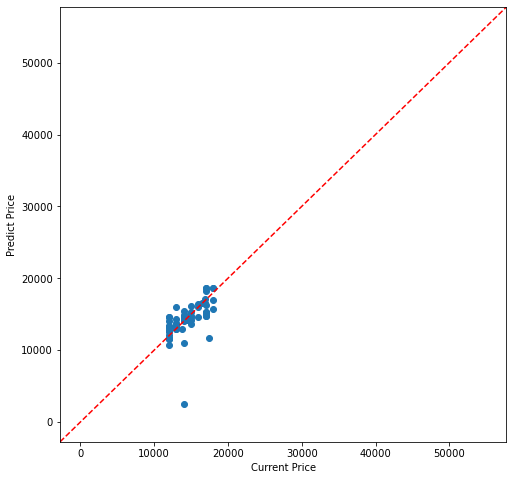

In [104]:
fig, ax = plt.subplots(figsize=(8,8))
ax.scatter(my_test, my_pred)
ax.axline(xy1=(0, 0), xy2=(55000, 55000), linestyle='--', color='red')
ax.set_xlabel('Current Price')
ax.set_ylabel('Predict Price')
plt.show()

# Low tier

In [83]:
low_tier = df[df['Mobile Price'] < 11985.2]

low_y = low_tier["Mobile Price"]
low_X = low_tier.drop(['Mobile Price'], axis=1)
low_X = scaler.fit_transform(low_X)

lx_train, lx_test, ly_train, ly_test = train_test_split(low_X,low_y, test_size=1/3, random_state=1) 

In [47]:
mlp_low = MLPRegressor(max_iter=15000).fit(lx_train, ly_train)

ly_pred = mlp_low.predict(lx_test)

In [78]:
parameter_space = {
    'activation': ['identity', 'logistic', 'tanh', 'relu'],
    'solver': ['sgd', 'adam', 'lbfgs']
}

grid = GridSearchCV(mlp_low, parameter_space, n_jobs=-1, cv=3)
grid_result = grid.fit(lx_train, ly_train)
print(grid_result.best_params_)

/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_base.py:170: RuntimeWarning: overflow encountered in square
  return ((y_true - y_pred) ** 2).mean() / 2
/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_base.py:170: RuntimeWarning: overflow encountered in square
  return ((y_true - y_pred) ** 2).mean() / 2
/Applications/anaconda3/lib/python3.9/site-packages/sklearn/utils/extmath.py:152: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/Applications/anaconda3/lib/python3.9/site-packages/sklearn/utils/extmath.py:152: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/Applications/anaconda3/lib/python3.9/site-packages/sklearn/utils/extmath.py:152: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/Applications/anaconda3/lib/python3.9/site-packages/sklearn/utils/extmath.py:152: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/Applications/anaconda3/lib/python3.9/site-packages/sklearn/u

/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Applications/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (15000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Applications/anaconda3/lib/

{'activation': 'identity', 'solver': 'adam'}


In [79]:
parameter_space = {
  'hidden_layer_sizes': [(6, 2), (2, 6), (3, 6)]
}

grid = GridSearchCV(mlp_low, parameter_space, n_jobs=-1, cv=3)
grid_result = grid.fit(lx_train, ly_train)
print(grid_result.best_params_)

{'hidden_layer_sizes': (3, 6)}


In [80]:
parameter_space = {
    'warm_start': [False,True],
    'verbose': [False,True]
}

grid = GridSearchCV(mlp_low, parameter_space, n_jobs=-1, cv=3)
grid_result = grid.fit(lx_train, ly_train)
print(grid_result.best_params_)

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           69     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.52830D+07    |proj g|=  1.00531D+04
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           69     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.42752D+07    |proj g|=  1.36237D+04

At iterate    1    f=  4.42499D+07    |proj g|=  1.18314D+04

At iterate    1    f=  1.23759D+07    |proj g|=  2.89199D+06


At iterate    2    f=  1.23679D+07    |proj g|=  2.97164D+06
At iterate    2    f=  7.91416D+06    |proj g|=  1.69184D+05

At iterate    3    f=  3.05177D+06    |proj g|=  2.22574D+06

At iterate    4    f=  1.56116D+06    |proj g|=  4.65582D+05

At iterate    5    f=  1.23525D+06    |proj g|=  6.07690D+05

At iterate    3    f=  7.90893D+06    |proj g|=  2.16756D+05

At iterate    6    f=  9.67754D+05    |proj g

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   74    f=  2.93421D+05    |proj g|=  2.28445D+05

At iterate   75    f=  2.93153D+05    |proj g|=  2.67187D+04

At iterate   76    f=  2.93097D+05    |proj g|=  1.67298D+05

At iterate  181    f=  3.54779D+05    |proj g|=  1.12441D+01

At iterate   77    f=  2.92999D+05    |proj g|=  3.85055D+04

At iterate  182    f=  3.54779D+05    |proj g|=  1.09869D+01

At iterate   78    f=  2.92948D+05    |proj g|=  2.44532D+04

At iterate  183    f=  3.54779D+05    |proj g|=  4.06408D+01

At iterate  184    f=  3.54779D+05    |proj g|=  2.48188D+01

At iterate   79    f=  2.92783D+05    |proj g|=  5.03671D+04

At iterate  185    f=  3.54779D+05    |proj g|=  1.17004D+01

At iterate  186    f=  3.54779D+05    |proj g|=  3.66639D+01

At iterate  187    f=  3.54779D+05    |proj g|=  1.46721D+01

At iterate  188    f=  3.54779D+05    |proj g|=  1.14407D+01

At iterate   80    f=  2.92523D+05    |proj g|=  1.19658D+05

At iterate   81    f=  2.92090D+05    |proj g|=  2.24170D+04

At iter

 This problem is unconstrained.



At iterate   70    f=  3.56567D+05    |proj g|=  1.03727D+03

At iterate  204    f=  2.69922D+05    |proj g|=  2.83107D+04

At iterate  205    f=  2.69808D+05    |proj g|=  6.13384D+03

At iterate  206    f=  2.69756D+05    |proj g|=  1.95248D+04

At iterate  207    f=  2.69707D+05    |proj g|=  3.05386D+04

At iterate   71    f=  3.56565D+05    |proj g|=  2.93478D+03

At iterate  208    f=  2.69653D+05    |proj g|=  3.86623D+04

At iterate   72    f=  3.56538D+05    |proj g|=  2.07238D+03

At iterate   73    f=  3.56513D+05    |proj g|=  8.26156D+02

At iterate  209    f=  2.69649D+05    |proj g|=  5.56496D+03

At iterate   74    f=  3.56495D+05    |proj g|=  9.28558D+02

At iterate  210    f=  2.69624D+05    |proj g|=  3.67565D+03

At iterate   75    f=  3.56492D+05    |proj g|=  2.72512D+03

At iterate  211    f=  2.69570D+05    |proj g|=  2.56009D+04

At iterate   76    f=  3.56485D+05    |proj g|=  2.36551D+03

At iterate   77    f=  3.56476D+05    |proj g|=  1.10644D+03

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f=  3.59184D+05    |proj g|=  7.44233D+03

At iterate   31    f=  3.57818D+05    |proj g|=  3.34724D+03

At iterate   32    f=  3.57488D+05    |proj g|=  2.60040D+03

At iterate   33    f=  3.57087D+05    |proj g|=  2.64100D+03

At iterate   34    f=  3.56603D+05    |proj g|=  3.21813D+03

At iterate   35    f=  3.56432D+05    |proj g|=  2.29176D+03

At iterate   36    f=  3.56238D+05    |proj g|=  1.53342D+03

At iterate   37    f=  3.56117D+05    |proj g|=  1.34914D+03

At iterate   38    f=  3.56071D+05    |proj g|=  5.70019D+03

At iterate   39    f=  3.55993D+05    |proj g|=  1.50733D+03

At iterate  365    f=  2.64230D+05    |proj g|=  1.41529D+03

At iterate  366    f=  2.64230D+05    |proj g|=  7.19186D+02

At iterate   40    f=  3.55956D+05    |proj g|=  9.92998D+02

At iterate  367    f=  2.64230D+05    |proj g|=  3.54043D+02

At iterate   41    f=  3.55919D+05    |proj g|=  1.28026D+03

At iterate  368    f=  2.64230D+05    |proj g|=  9.13987D+01

At iter


At iterate   67    f=  2.64246D+05    |proj g|=  3.33934D+02

At iterate   95    f=  3.54779D+05    |proj g|=  5.50175D+00

At iterate   96    f=  3.54779D+05    |proj g|=  5.83428D+00

At iterate   97    f=  3.54779D+05    |proj g|=  7.54847D+00

At iterate   98    f=  3.54779D+05    |proj g|=  6.63783D+00

At iterate   99    f=  3.54779D+05    |proj g|=  1.28055D+01

At iterate  100    f=  3.54779D+05    |proj g|=  2.31380D+01

At iterate  101    f=  3.54779D+05    |proj g|=  8.98436D+00

At iterate  102    f=  3.54779D+05    |proj g|=  1.06912D+01

At iterate  103    f=  3.54779D+05    |proj g|=  7.87426D+00

At iterate  104    f=  3.54779D+05    |proj g|=  7.39566D+00

At iterate  105    f=  3.54779D+05    |proj g|=  1.16759D+01

At iterate  106    f=  3.54779D+05    |proj g|=  1.05672D+01

At iterate  107    f=  3.54779D+05    |proj g|=  6.29107D+00

At iterate  108    f=  3.54779D+05    |proj g|=  3.09565D+00

At iterate  109    f=  3.54779D+05    |proj g|=  9.61785D+00

       

In [84]:
mlp_low = MLPRegressor(activation = 'identity', solver = 'adam', 
                       hidden_layer_sizes = (3, 6), 
                       verbose = False, warm_start = True, max_iter=15000).fit(lx_train, ly_train)
ly_pred = mlp_low.predict(lx_test)

print(r2_score(ly_pred, ly_test))
print(sqrt(mean_squared_error(ly_test,ly_pred)))
print(np.mean(np.abs((ly_test - ly_pred)/ly_test)))

0.4927058661305954
1162.1655922066755
0.10413125032780289


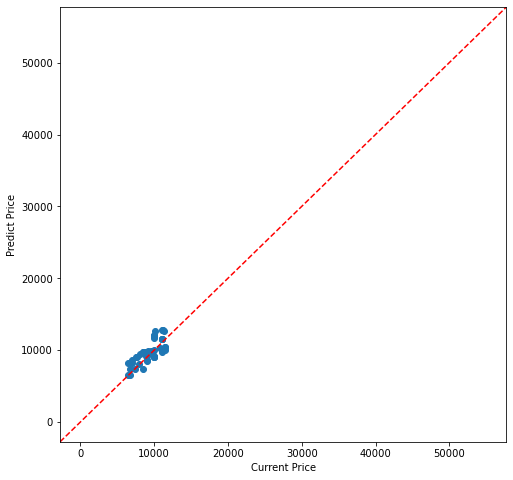

In [85]:
fig, ax = plt.subplots(figsize=(8,8))
ax.scatter(ly_test, ly_pred)
ax.axline(xy1=(0, 0), xy2=(55000, 55000), linestyle='--', color='red')
ax.set_xlabel('Current Price')
ax.set_ylabel('Predict Price')
plt.show()